# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **2**, **4** and **6**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $50$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 10000

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_stat

Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_stat

Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_stat

Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state

Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_stat

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'mod

Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model

Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_stat

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'mod

Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_stat

Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class

Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model

Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state

Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_stat

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 

Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_stat

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_stat

Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_stat

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'mod

Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model

Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state

Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_stat

Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_stat

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_stat

Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_stat

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_stat

Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class

Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_stat

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 

Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class

Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model

Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state

Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
configs length  1100
end of file: run.py


In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 11, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16,

addliq - Sq delta Sq  addliq - Sq delta Sq4895.0059331173554972.040313103901
addliq - Sq delta S 4895.005933117354
POOL ADD LIQUIDITY Timestep ===  10 delta W  4694.101999950977
 
addliq - Sq delta Sq 4822.817320842216
addliq - Sq delta S 4822.817320842215
POOL ADD LIQUIDITY Timestep ===  POOL ADD LIQUIDITY Timestep === 10 4907.07354083677110 delta W  4654.214483498204
 delta W 
addliq - Sq delta Sq 4659.390156568312
addliq - Sq delta S 4659.390156568313
POOL ADD LIQUIDITY Timestep ===  10 delta W  4432.291897860425
addliq - Sq delta S  addliq - Sq delta Sq4739.196985100454 4907.0735408367724766.868943328615
addliq - Sq delta S 4766.8689433286145
POOL ADD LIQUIDITY Timestep ===  10 delta W  4539.2434786507565


POOL ADD LIQUIDITY Timestep ===  10 delta W  4693.210897115593
154656.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3350.6292034691105 delta S  4656
POOL REMOVE LIQUIDITY share fraction of pool = 0.18859062403497173
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3196331

POOL REMOVE LIQUIDITY Timestep === delta S  154821.0 addliq - Sq delta Sq delta W 4519
90 delta W  3566.6850483259113 delta S  4818
POOL REMOVE LIQUIDITY share fraction of pool = 0.19405184199807787
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3092935237562487
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3092935237562487
154818.0
 
 POOL REMOVE LIQUIDITY share fraction of pool = 0.18541010955572614741.603615754009
addliq - Sq delta S 4741.603615754009
POOL ADD LIQUIDITY Timestep ===  10 delta W  4536.040030394832POOL REMOVE LIQUIDITY Timestep === 
3542.242026841817 
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3052053329106117
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3052053329106117
154519.090 delta W  3510.569864567405 delta S  4821
POOL REMOVE LIQUIDITY share fraction of pool = 0.19416041283987753
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3219310678585242
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3219310678585242
154821.0 

delta S  4747

3478.214667897922 delta S  4648
POOL REMOVE LIQUIDITY share fraction of pool = 0.18933004449359178
addliq - Sq delta SqPOOL REMOVE LIQUIDITY share fraction of reserve = 0.33082754976288314 4871.335104450873
addliq - Sq delta S 4871.335104450873
POOL ADD LIQUIDITY Timestep ===  10 delta W  4746.1910530286395

POOL REMOVE LIQUIDITY weight fraction of pool = 0.33082754976288314addliq - Sq delta Sq 4609.120098894578
addliq - Sq delta S 4609.1200988945775
POOL ADD LIQUIDITY Timestep ===  10 delta W  4391.225151827826

154648.0addliq - Sq delta Sq
 4669.808907231862
addliq - Sq delta S 4669.808907231863
POOL ADD LIQUIDITY Timestep ===  10 delta W  4468.800928771936
154668.0
POOL REMOVE LIQUIDITY Timestep ===  154647.090 delta W  3475.7231967524035 delta S  4668
POOL REMOVE LIQUIDITY share fraction of pool = 0.19009646270045263

POOL REMOVE LIQUIDITY share fraction of reserve = 0.30510325414192996
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3462.863107684872 delta S  4647
POOL REMOVE LIQU

154692.04579.674688640063addliq - Sq delta Sq
addliq - Sq delta S 4579.674688640063
POOL ADD LIQUIDITY Timestep ===  10 delta W  4405.543700267989
 
4946.724671166008addliq - Sq delta Sq 
addliq - Sq delta S 4946.724671166008
POOL ADD LIQUIDITY Timestep ===  10 delta W  4715.772342498602
4560.23371092897
addliq - Sq delta S 4560.233710928971
154609.0
POOL REMOVE LIQUIDITY Timestep === POOL ADD LIQUIDITY Timestep ===  154729.010 delta W addliq - Sq delta Sq 
  904317.566730320152
POOL REMOVE LIQUIDITY Timestep === 4913.022944301532
addliq - Sq delta S  4913.022944301531
POOL ADD LIQUIDITY Timestep ===  10 delta W  4731.055030271866
delta W   903442.5290654928067 delta S  4609
POOL REMOVE LIQUIDITY share fraction of pool = 0.1876114003958065
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30643760780265
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30643760780265
154609.0
 delta W  3436.1342465163093 delta S  4729
POOL REMOVE LIQUIDITY share fraction of pool = 0.19190710059798655

addliq - Sq delta Sq 4735.333036496321
addliq - Sq delta S 4735.333036496321
POOL ADD LIQUIDITY Timestep ===  10 delta W  4528.060323371137
154664.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3435.8354790778235 delta S  4664
POOL REMOVE LIQUIDITY share fraction of pool = 0.18971209582987186
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31126560688700705
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31126560688700705
154664.0
154927.0154703.0
addliq - Sq delta Sq
154754.0POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep ===    90 
90delta W 4947.060574772355154763.0
POOL REMOVE LIQUIDITY Timestep === 
  3476.9792668300515 addliq - Sq delta S90delta W POOL REMOVE LIQUIDITY Timestep ===    3499.511608920915 delta S  4927
POOL REMOVE LIQUIDITY share fraction of pool = 0.19648418724375827
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3012065672886586
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3012065672886586
154927.0  904947.060574772355
delta S 

addliq - Sq delta Sq 154823.0
4842.241578420946154773.0

addliq - Sq delta SPOOL REMOVE LIQUIDITY Timestep ===  4842.241578420946
POOL ADD LIQUIDITY Timestep ===  10 delta W  4671.264407420589
154820.0 90 delta W  3516.063145110075 delta S  4823
POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY share fraction of pool = 0.1940692380799

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3600.5422862114783 delta S  4820
POOL REMOVE LIQUIDITY share fraction of pool = 0.19446519667474052
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3198468516870276
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3198468516870276
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3133266524313663154820.0

 90POOL REMOVE LIQUIDITY weight fraction of pool = 0.3133266524313663
 154823.0
delta W  3524.6060994657378 delta S  4773
POOL REMOVE LIQUIDITY share fraction of pool = 0.19224404625223634
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30432685460476233
POOL REMOVE LIQUIDITY weight fract

addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep ===  90 delta W  3503.0587522015685 delta S  4732
POOL REMOVE LIQUIDITY share fraction of pool = 0.1905420502198392 4546.863819779914
addliq - Sq delta S 4546.863819779914
POOL ADD LIQUIDITY Timestep ===  10 delta W  4332.575702700388

POOL REMOVE LIQUIDITY share fraction of reserve = 0.2964030013587071
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2964030013587071
154732.0
154709.0
154663.0
POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3370.895826247994  delta S  4709
POOL REMOVE LIQUIDITY share fraction of pool = 0.19066169462504387
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3121518228448622
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3121518228448622
154709.090
 delta W  3394.5232815687873addliq - Sq delta Sq delta S   4760.282336487939
addliq - Sq delta S4663addliq - Sq delta Sq 
4907.471297730906
addliq - Sq delta S 4907.471297730906
POOL ADD LIQUIDITY Timestep ===  10 delta 

addliq - Sq delta Sq 4881.8063897406855
addliq - Sq delta S 4881.8063897406855
POOL ADD LIQUIDITY Timestep ===  10 delta W  4696.788642181386
154730.0
POOL REMOVE LIQUIDITY Timestep === 154808.0
 POOL REMOVE LIQUIDITY Timestep ===  90 delta W 90 delta W  3452.3161503688793 delta S  4730
POOL REMOVE LIQUIDITY share fraction of pool = 0.19186599514196184
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30623090346913123
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30623090346913123
154730.0
154687.0
 3544.8574343942732POOL REMOVE LIQUIDITY Timestep ===  delta S  4808
POOL REMOVE LIQUIDITY share fraction of pool = 0.1933562331017205
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3069306791329858
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3069306791329858
154808.0 
90 delta W  3514.2266056657227 delta S  4687
POOL REMOVE LIQUIDITY share fraction of pool = 0.19016215273358783
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31225950079025794
POOL REMOVE LIQUIDITY weig

 3583.578520956104 delta S  4811
 POOL REMOVE LIQUIDITY share fraction of pool = 0.19295158925760225addliq - Sq delta Sq
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3037432031784423
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3037432031784423
154811.0 
154812.0delta W  3447.10428236219
 POOL REMOVE LIQUIDITY Timestep === 4615.753391055679
addliq - Sq delta Sdelta S    4615.75339105567990
4752POOL ADD LIQUIDITY Timestep ===  delta W  3553.1550549817466 delta S  4812
POOL REMOVE LIQUIDITY share fraction of pool = 0.1938402410248882
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3043364942167869
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3043364942167869
154812.0 addliq - Sq delta Sq10
POOL REMOVE LIQUIDITY share fraction of pool = 0.19217363944873025 delta W  4406.558478061922

 4700.86493830904

POOL REMOVE LIQUIDITY share fraction of reserve = 0.3178383289557622addliq - Sq delta S 4700.864938309039addliq - Sq delta Sq
 POOL REMOVE LIQUIDITY weight fraction of 

addliq - Sq delta Sq 4716.2027102872735
addliq - Sq delta S 4716.202710287274
POOL ADD LIQUIDITY Timestep ===  10 delta W  4513.537796952481
addliq - Sq delta Sq 4609.6128685730755
addliq - Sq delta S 4609.6128685730755
POOL ADD LIQUIDITY Timestep ===  154747.010
POOL REMOVE LIQUIDITY Timestep ===   90 delta W  3509.821290943912 delta S  4747
POOL REMOVE LIQUIDITY share fraction of pool = 0.19157363095406532
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30970426291326436
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30970426291326436
154747.0
delta W  4391.419128292788
154819.0
POOL REMOVE LIQUIDITY Timestep ===  90 154674.0
POOL REMOVE LIQUIDITY Timestep ===  delta W  3581.5386131292935 delta S  4819
POOL REMOVE LIQUIDITY share fraction of pool = 0.19426597357554862
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3086956547906637
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3086956547906637
154819.0
90 delta W  3391.188748364202 delta S  4674
POOL REMOVE LIQUIDITY s

POOL REMOVE LIQUIDITY Timestep ===   9090 delta W   delta W 3405.640918298855 3457.2668357764046addliq - Sq delta Sq 4996.292380368368
addliq - Sq delta S 4996.292380368367
POOL ADD LIQUIDITY Timestep ===  10 delta W  4783.567676638022
154670.0 delta S 
 delta S POOL REMOVE LIQUIDITY Timestep === 154689.0 90 addliq - Sq delta Sq   delta W  3498.3787115095997 delta S  4670
POOL REMOVE LIQUIDITY share fraction of pool = 0.1900670473670954
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3195524306365489
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3195524306365489

46724643.941603671904154670.0POOL REMOVE LIQUIDITY Timestep === 

4707
POOL REMOVE LIQUIDITY share fraction of pool = 0.18992916521386305
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3149249223881933
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3149249223881933
154707.0
 addliq - Sq delta S90 
4643.941603671903 
POOL REMOVE LIQUIDITY share fraction of pool = 0.1900086062387106POOL ADD LIQUIDITY Timestep ===

 addliq - Sq delta Sq4690.318653147225
 4824.350506844561
addliq - Sq delta Saddliq - Sq delta Sq  4630.292957505171
addliq - Sq delta S 4630.292957505171
POOL ADD LIQUIDITY Timestep ===  10 delta W  4454.347326209155
4690.318653147225addliq - Sq delta S
 4824.350506844561POOL ADD LIQUIDITY Timestep ===  
10POOL ADD LIQUIDITY Timestep ===   10 delta W delta W  4588.119060792659
 4450.945689390838
154765.0154810.0
POOL REMOVE LIQUIDITY Timestep === 154814.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3501.006983168872 delta S  4810

POOL REMOVE LIQUIDITY share fraction of pool = 0.19350380583169088POOL REMOVE LIQUIDITY Timestep === 
  POOL REMOVE LIQUIDITY share fraction of reserve = 0.3120068650605964490 90
delta W   3530.2904319283707 delta S  4814POOL REMOVE LIQUIDITY weight fraction of pool = 0.31200686506059644delta W 
 
POOL REMOVE LIQUIDITY share fraction of pool = 0.193981402023094133505.6751090782664 154810.0

delta S  4765POOL REMOVE LIQUIDITY share fraction of reserve = 0

POOL REMOVE LIQUIDITY Timestep ===  90POOL REMOVE LIQUIDITY Timestep ===   delta W  3448.1407556478866 90delta S   4761
addliq - Sq delta Sq 4937.832961170271
addliq - Sq delta S 4937.832961170271
POOL ADD LIQUIDITY Timestep ===  10 delta W  4757.237040440225
POOL REMOVE LIQUIDITY share fraction of pool = 0.19296043099872628154733.0
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31973123025450545
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31973123025450545
154761.0
POOL REMOVE LIQUIDITY Timestep === delta W  3368.3287761805727 delta S  4667
POOL REMOVE LIQUIDITY share fraction of pool = 0.1896316443456744
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29874809065785274
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29874809065785274
154667.0

 90 delta W  3492.3778252438756 delta S  4733
POOL REMOVE LIQUIDITY share fraction of pool = 0.19059830728640242
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30111859911647
POOL REMOVE LIQUIDITY weight fraction of pool =

POOL REMOVE LIQUIDITY Timestep === delta S  154851.04763

POOL REMOVE LIQUIDITY share fraction of pool = 0.19153458439356627
POOL REMOVE LIQUIDITY share fraction of reserve = 0.305679445235956
POOL REMOVE LIQUIDITY weight fraction of pool = 0.305679445235956
154763.0 
90
POOL REMOVE LIQUIDITY Timestep ===   delta W  3619.3354850354617POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3599.462339237264 delta S  4851
POOL REMOVE LIQUIDITY share fraction of pool = 0.19460830272932628
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3192469929321823
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3192469929321823
154851.090 delta W  3582.311304236172 delta S  4826
POOL REMOVE LIQUIDITY share fraction of pool = 0.19382288144616103
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3184883002488302
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3184883002488302

 154826.0
addliq - Sq delta Sq 4614.160458797561
addliq - Sq delta S 4614.16045879756
POOL ADD LIQUIDITY Timestep ===  10 del

delta W  
3529.2482588385683 delta S  4757
POOL REMOVE LIQUIDITY share fraction of pool = 0.1925179208999193
addliq - Sq delta Sqaddliq - Sq delta Sq POOL REMOVE LIQUIDITY share fraction of reserve = 0.31347580787652923
4701.079049448563 POOL REMOVE LIQUIDITY weight fraction of pool = 0.31347580787652923
154757.04691.991546460986
addliq - Sq delta S 

addliq - Sq delta S4691.991546460986 
4701.079049448562
POOL ADD LIQUIDITY Timestep === POOL ADD LIQUIDITY Timestep ===   addliq - Sq delta Sq10 4842.899247364051
addliq - Sq delta S 4842.899247364052
POOL ADD LIQUIDITY Timestep ===  10 delta W  4648.01884424469
addliq - Sq delta Sq10   delta W  4489.628357363511
154816.0delta W  4730.139852441521
addliq - Sq delta S 4730.139852441522
POOL ADD LIQUIDITY Timestep ===  10 delta W 4472.587168410158

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3606.182661862083 delta S  4816
POOL REMOVE LIQUIDITY share fraction of pool = 0.193803031253469
POOL REMOVE LIQUIDITY share fraction of reserve = 

POOL ADD LIQUIDITY Timestep ===  10 delta W  4573.990408908753
154789.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W addliq - Sq delta Sq  3594.403633283136 delta S  4789
POOL REMOVE LIQUIDITY share fraction of pool = 0.192973841498472
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32801194767202513
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32801194767202513
154789.04784.471009528047
addliq - Sq delta S 4784.471009528048
POOL ADD LIQUIDITY Timestep ===  10 delta W  4600.839159336472

addliq - Sq delta Sq 4557.290032113343
addliq - Sq delta S 4557.290032113343
POOL ADD LIQUIDITY Timestep ===  10 delta W  4330.242112376805
154641.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3346.551736064867 delta S  4641
POOL REMOVE LIQUIDITY share fraction of pool = 0.18939784960708925
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31637355562455116
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31637355562455116
154641.0
154902.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta

addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep ===    4660.892618880647
addliq - Sq delta S 4660.892618880646
POOL ADD LIQUIDITY Timestep ===  10 delta W  4464.138752376258
9090 delta W  3479.2563427477576 delta S  4756
POOL REMOVE LIQUIDITY share fraction of pool = 0.19163441756077107
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31003677334893937
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31003677334893937
154756.0 
delta W  addliq - Sq delta Sq 4750.311535964484
addliq - Sq delta S 4750.311535964484
POOL ADD LIQUIDITY Timestep ===  10 delta W  4534.481863512737
addliq - Sq delta Sq 3457.85334617467474594.0382208896135addliq - Sq delta Sq 4780.916821061353
addliq - Sq delta S 4780.9168210613525
POOL ADD LIQUIDITY Timestep ===  10 delta W  4588.738294915929

addliq - Sq delta S 4594.038220889613
POOL ADD LIQUIDITY Timestep ===  10 delta W  4347.3188515618685
 delta S  4760
POOL REMOVE LIQUIDITY share fraction of pool = 0.19230066682724892
POOL REMOVE LIQUIDITY share f

 4565.360259231261
154661.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3401.2408685699866 delta S  4661
POOL REMOVE LIQUIDITY share fraction of pool = 0.18980555202169638
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3120454951536694
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3120454951536694
154661.0
154749.0
POOL REMOVE LIQUIDITY Timestep ===  90 addliq - Sq delta Sqdelta W   4796.53122387415
3502.680326034791 delta S  4749
POOL REMOVE LIQUIDITY share fraction of pool = 0.1914273488306175
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3159281808528837
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3159281808528837
154749.0
addliq - Sq delta S 154840.04796.531223874151
POOL REMOVE LIQUIDITY Timestep === 
 POOL ADD LIQUIDITY Timestep ===  10 delta W  4585.568781956787
90 delta W  3673.0941758736126 delta S  4840
POOL REMOVE LIQUIDITY share fraction of pool = 0.1944218148629671
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3012511460406251
POOL REMOVE LIQ


POOL REMOVE LIQUIDITY share fraction of pool = 0.1931463295712359
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3005949890122565
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3005949890122565
154804.0addliq - Sq delta Sq
 4602.233318092733
addliq - Sq delta S 4602.2333180927335
POOL ADD LIQUIDITY Timestep ===  10 delta W  4436.605038757146
154814.0
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq addliq - Sq delta Sq 4756.505221341439
addliq - Sq delta S 4756.505221341439
 4781.514817760625
addliq - Sq delta S 4781.514817760625
POOL ADD LIQUIDITY Timestep ===  10addliq - Sq delta Sq90 POOL ADD LIQUIDITY Timestep ===  10 delta W  4554.164220213694
 delta W  delta W  3556.7454986781345 delta S  4814
POOL REMOVE LIQUIDITY share fraction of pool = 0.19302633216403317
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3174279959750562
4596.794147062101 154821.0

POOL REMOVE LIQUIDITY weight fraction of pool = 0.31742799597505624529.500308743958POOL REMOVE LIQUIDITY Timest

addliq - Sq delta S 4710.4728695274425
POOL ADD LIQUIDITY Timestep ===  10 delta W  4523.1809378381295
154765.0
POOL REMOVE LIQUIDITY Timestep ===  90 154730.0
POOL REMOVE LIQUIDITY Timestep === 154768.0
 POOL REMOVE LIQUIDITY Timestep === 90delta W   delta W  3448.420132402974 delta S  4730
POOL REMOVE LIQUIDITY share fraction of pool = 0.1914156504013703
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30414194961845165
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30414194961845165
90  3534.222575277049delta W 154730.0 delta S 
 4765
POOL REMOVE LIQUIDITY share fraction of pool = 0.19171210850975504
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3096790391607006
 POOL REMOVE LIQUIDITY weight fraction of pool = 0.30967903916070063545.58779337803 delta S  4768
POOL REMOVE LIQUIDITY share fraction of pool = 0.19234269867653725
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3088418844814554

POOL REMOVE LIQUIDITY weight fraction of pool = 0.3088418844814554
154768.01546

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3547.3064930962005 delta S  4827
POOL REMOVE LIQUIDITY share fraction of pool = 0.19436490357595973
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3113734202295761
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3113734202295761
154827.0
addliq - Sq delta Sq addliq - Sq delta Sq154789.04690.043792716819
addliq - Sq delta S 4514.3094808235555
addliq - Sq delta S 4514.3094808235555
POOL ADD LIQUIDITY Timestep ===  10 delta W  4279.128489954305

POOL REMOVE LIQUIDITY Timestep ===  4690.043792716819
POOL ADD LIQUIDITY Timestep ===  10 delta W   4503.48411454352290 delta W 
 addliq - Sq delta Sq3527.79731169953 delta S   4917.559642175101
addliq - Sq delta S 4917.559642175101
POOL ADD LIQUIDITY Timestep ===  10 delta W  4690.47651907477854789

POOL REMOVE LIQUIDITY share fraction of pool = 0.1933476491405381
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32058106181037493
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3205810618

154631.0154798.0
POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3415.9010140369946 delta S  4631
POOL REMOVE LIQUIDITY share fraction of pool = 0.188556804355193
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3224917768288918
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3224917768288918
 154631.0
90 delta W  3501.109675726126 delta S  4798
POOL REMOVE LIQUIDITY share fraction of pool = 0.19286998016795448
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30331461400429377
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30331461400429377154640.0

POOL REMOVE LIQUIDITY Timestep === 154798.0
 90 delta W  3369.4060819551937 delta S  addliq - Sq delta Sq4640
154784.0 5011.275125195161
addliq - Sq delta S 5011.275125195161
POOL ADD LIQUIDITY Timestep ===  10 delta W  4793.881892813365

154828.0addliq - Sq delta Sq
POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY share fraction of pool = 0.18942624542227823POOL REMOVE LIQUIDITY Timest

154704.0addliq - Sq delta Sq 
4631.862531606911
addliq - Sq delta S 4631.862531606911
POOL ADD LIQUIDITY Timestep ===  10 delta W  4434.6449681339145
154796.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3529.6747227019287 delta S  4796
POOL REMOVE LIQUIDITY share fraction of pool = 0.1930893107306191
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3141771918039632
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3141771918039632
154796.0
addliq - Sq delta Sqaddliq - Sq delta Sq 4816.53275027558
addliq - Sq delta S 4816.532750275581
POOL ADD LIQUIDITY Timestep ===  10 delta W  4550.72657747916
addliq - Sq delta Sq  4951.866538090174
addliq - Sq delta S 4951.866538090174
POOL ADD LIQUIDITY Timestep ===  10 delta W  4742.986548201278
4622.726256847163
addliq - Sq delta S addliq - Sq delta Sq4622.726256847162
POOL ADD LIQUIDITY Timestep ===  10 delta W  4411.464175739575
 4764.393009298932
addliq - Sq delta S 4764.393009298932
POOL ADD LIQUIDITY Timestep ===  10 delta W  4523.4794

154655.0154767.0

POOL REMOVE LIQUIDITY Timestep === 154774.0
 POOL REMOVE LIQUIDITY Timestep ===  9090  delta W  3461.7161924475954 delta S  4767
delta W POOL REMOVE LIQUIDITY share fraction of pool = 0.19230743105639425 
3481.443483124504POOL REMOVE LIQUIDITY share fraction of reserve = 0.3125515049098626
 POOL REMOVE LIQUIDITY weight fraction of pool = 0.3125515049098626addliq - Sq delta Sqaddliq - Sq delta Sq 4597.936088124026

addliq - Sq delta S 4597.936088124026
POOL ADD LIQUIDITY Timestep ===  10 delta W  4364.906298481618
 154767.04869.999579962926delta S 

 addliq - Sq delta S4774 
POOL REMOVE LIQUIDITY share fraction of pool = 0.19177509929591077
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3032382513355018
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3032382513355018
4869.999579962925
POOL ADD LIQUIDITY Timestep ===  10 delta W 154774.0
 4624.56597470123
154861.0
POOL REMOVE LIQUIDITY Timestep ===  154755.090 
POOL REMOVE LIQUIDITY Timestep === delta W   90 delt

addliq - Sq delta Sq 4811.640299276896
addliq - Sq delta Sqaddliq - Sq delta S  addliq - Sq delta Sq4631.921094002045 
addliq - Sq delta S 4631.921094002046
POOL ADD LIQUIDITY Timestep ===  10 delta W  4427.781854873969
4811.6402992768964809.009881311613
addliq - Sq delta S 4809.009881311612
POOL ADD LIQUIDITY Timestep ===  10 delta W  4572.733689208724

POOL ADD LIQUIDITY Timestep ===  10154753.0
 delta W POOL REMOVE LIQUIDITY Timestep ===  4609.24492251277
addliq - Sq delta Sq 90 delta W  3497.1360186465804 delta S  4753
POOL REMOVE LIQUIDITY share fraction of pool = 0.19155197224834478
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31615222000343607
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31615222000343607
154753.0
 4601.936820427971
addliq - Sq delta S 4601.936820427971
addliq - Sq delta Sq 5048.052884936383
addliq - Sq delta S 5048.052884936383
POOL ADD LIQUIDITY Timestep ===  10 delta W  4829.951192941335
POOL ADD LIQUIDITY Timestep ===  10 delta W  4444.5351843697

addliq - Sq delta Sq 4763.368104487729
addliq - Sq delta S 4763.3681044877285
POOL ADD LIQUIDITY Timestep ===  10 delta W  4539.143973675695
addliq - Sq delta Sq 4544.628265741495
addliq - Sq delta S 4544.628265741494
POOL ADD LIQUIDITY Timestep ===  10 delta W  4295.54993172206
154821.0addliq - Sq delta Sq
 POOL REMOVE LIQUIDITY Timestep === 4740.698495858089 
addliq - Sq delta S90  delta W  3570.3034318273953 delta S  4821
POOL REMOVE LIQUIDITY share fraction of pool = 0.1937451486686493
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3073750615846533
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3073750615846533
154821.0
4740.698495858089
POOL ADD LIQUIDITY Timestep === 154860.0 
10POOL REMOVE LIQUIDITY Timestep ===  90 delta W  delta W  3597.6504241903053 delta S   4537.2265988803365
4860
POOL REMOVE LIQUIDITY share fraction of pool = 0.19506809311167825
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30892460600654104
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3

POOL ADD LIQUIDITY Timestep ===  10 delta W addliq - Sq delta S 4801.838606667601
addliq - Sq delta S 4801.838606667601
POOL ADD LIQUIDITY Timestep ===  10 delta W    4636.8832541199434579.5008357757115
4634.204884139844
addliq - Sq delta Sq 4529.825963503738
addliq - Sq delta S 4529.8259635037375
POOL ADD LIQUIDITY Timestep ===  
POOL ADD LIQUIDITY Timestep ===  10 delta W  4418.6855570131875
10 delta W  4325.298259008545
154755.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W 154846.0 3585.0289476073904154768.0 
POOL REMOVE LIQUIDITY Timestep === delta S  90 delta W  3464.1097430253476 delta S  4768
POOL REMOVE LIQUIDITY share fraction of pool = 0.1919854203232828
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3135919326662969
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3135919326662969
154768.0 
POOL REMOVE LIQUIDITY Timestep === 4755
POOL REMOVE LIQUIDITY share fraction of pool = 0.19164328136987577
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30668413830694313
PO

addliq - Sq delta Sq 4576.005293890415154649.0
addliq - Sq delta S 4576.005293890414
POOL ADD LIQUIDITY Timestep ===  10 delta W  4359.185591821803

addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep ===   90 delta W 154617.0 3455.1293516015564874.600428377965

POOL REMOVE LIQUIDITY Timestep ===  delta S  4649
POOL REMOVE LIQUIDITY share fraction of pool = 0.18945668493013196
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3124826661798337
 90 delta W  3347.4636010196436 delta S  4617
POOL REMOVE LIQUIDITY share fraction of pool = 0.18800320330280393
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31138339584763314
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31138339584763314
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3124826661798337
154649.0addliq - Sq delta S154617.0
 4874.600428377965
POOL ADD LIQUIDITY Timestep ===  10 delta W  4660.986844095107

154782.0addliq - Sq delta Sq154735.0154815.0
 

POOL REMOVE LIQUIDITY Timestep === 4784.351811413548POOL REMOVE LIQ

addliq - Sq delta Sq 4498.620464433964addliq - Sq delta Sq
addliq - Sq delta S 4498.620464433964
POOL ADD LIQUIDITY Timestep ===  10 delta W  4288.697818963509
 4904.144455512793
addliq - Sq delta S 4904.144455512793
POOL ADD LIQUIDITY Timestep ===  10 delta W  4720.736185958215
addliq - Sq delta Sq 4532.431342515048
addliq - Sq delta S 4532.431342515048
POOL ADD LIQUIDITY Timestep ===  10 delta W  4296.238032488272
154779.0154724.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3426.186509489935 delta S  4724
POOL REMOVE LIQUIDITY share fraction of pool = 0.19140719110617185
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3138201961647533
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3138201961647533
154724.0
154814.0
POOL REMOVE LIQUIDITY Timestep ===  
90POOL REMOVE LIQUIDITY Timestep ===  90  delta W  3466.655648779312 delta S  4779
POOL REMOVE LIQUIDITY share fraction of pool = 0.19272254380632917
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3040382925866086
POOL R

90 POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3476.7307864243094 delta S  4761
POOL REMOVE LIQUIDITY share fraction of pool = 0.19100679757518452
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30544777822009744
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30544777822009744
154761.0delta W  3521.698453231974 delta S  4791

POOL REMOVE LIQUIDITY share fraction of pool = 0.19268754174953417
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31815390948537176
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31815390948537176
154791.0
154755.0
addliq - Sq delta Sq POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3546.2965159301107 delta S  4755
POOL REMOVE LIQUIDITY share fraction of pool = 0.1919044583666187
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3212813078810674
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32128130788106744924.069134879687
addliq - Sq delta S 4924.069134879687
POOL ADD LIQUIDITY Timestep ===  10 delta W 
addliq - Sq delta Sq154755.0
 addl

POOL REMOVE LIQUIDITY weight fraction of pool = 0.30448493928982384POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta Sq90
  154748.0delta W 4861.097697416049
addliq - Sq delta S 4861.097697416049
POOL ADD LIQUIDITY Timestep ===  10 delta W  3570.995848600285
 4655.377158553318

 delta S  4765
POOL REMOVE LIQUIDITY share fraction of pool = 0.19263781497460442
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3104584123675774
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3104584123675774
154765.0
154630.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3350.2933963861205 delta S  4630
POOL REMOVE LIQUIDITY share fraction of pool = 0.18816290578143116
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31208887025052545
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31208887025052545
154630.0
addliq - Sq delta Sq 4759.86263336165addliq - Sq delta Sq
 4885.72266666765
addliq - Sq delta S 4885.72266666765
POOL ADD LIQUIDITY Timestep ===  10 delta W  4692.739349074302
addliq - S

154665.0
addliq - Sq delta Sq 4955.870721211771
addliq - Sq delta S 4955.870721211771
POOL ADD LIQUIDITY Timestep ===  10 delta W  4781.621622381488
154785.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3410.179123960779 delta S  4785
POOL REMOVE LIQUIDITY share fraction of pool = 0.19303030904681678
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30900908569567365
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30900908569567365
154785.0
154768.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3415.190180672692 delta S  4768
POOL REMOVE LIQUIDITY share fraction of pool = 0.19202273304474426
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3092413463768908
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3092413463768908
154768.0
154835.0addliq - Sq delta Sq 4837.389062873472
addliq - Sq delta S 4837.389062873472
POOL ADD LIQUIDITY Timestep ===  10 delta W  4640.077891934163

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3469.7555138676585 delta S  4835
POOL REMOVE LIQUI

154813.0addliq - Sq delta Sq
 4627.142935913481
154738.0
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta S  4627.14293591348
POOL ADD LIQUIDITY Timestep ===  10 delta W  4421.942131923987
90 delta W  addliq - Sq delta Sq3506.6531025069494addliq - Sq delta Sq 4811.75865283656
addliq - Sq delta S 4811.758652836561 
delta S POOL ADD LIQUIDITY Timestep ===  4815.7735628746295
addliq - Sq delta S 4815.7735628746295
 10 delta W  4573.991425856991
 POOL ADD LIQUIDITY Timestep === addliq - Sq delta Sq 4635.356805843603
addliq - Sq delta S 4635.356805843602
POOL ADD LIQUIDITY Timestep ===  10 delta W  4386.107605289577
4738 10 delta W  4610.665366368751

POOL REMOVE LIQUIDITY share fraction of pool = 0.19225649940982906
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31509369655708264
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31509369655708264
154738.0
154659.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3371.5119998820987 delta S  4659
POOL REMOVE LIQUIDITY share fraction 

POOL REMOVE LIQUIDITY Timestep === 4691.6779969428135 154793.0

90 delta W  3485.43918178672 delta S  4710
POOL REMOVE LIQUIDITY share fraction of pool = 0.19082460094135634
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30912987001137926
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30912987001137926
addliq - Sq delta S 4691.677996942814154710.0
154640.0154724.0

POOL ADD LIQUIDITY Timestep ===  10 delta W  4470.558182583908
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3414.7007854005446 delta S  4640
POOL REMOVE LIQUIDITY share fraction of pool = 0.18931418147638496
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2973185923048568
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2973185923048568

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3503.523412414945 delta S  4724
POOL REMOVE LIQUIDITY share fraction of pool = 0.19162511349457587
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2983217672070741
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2983217672



POOL REMOVE LIQUIDITY weight fraction of pool = 0.31911013607854066
POOL ADD LIQUIDITY Timestep ===  10 delta W  4719.170735287814
154629.0
154693.0
POOL REMOVE LIQUIDITY Timestep ===  154764.0
90 154756.0delta W  3463.8051740754913 delta S  4693
POOL REMOVE LIQUIDITY share fraction of pool = 0.19015100467577195
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30606538712802467
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30606538712802467
154693.0addliq - Sq delta Sq
addliq - Sq delta Sq 4853.3347094215
addliq - Sq delta S 4853.3347094215
POOL ADD LIQUIDITY Timestep ===  10 delta W  4621.974869602239

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3449.655383610476 delta S  4764
POOL REMOVE LIQUIDITY share fraction of pool = 0.19227829992429377
POOL REMOVE LIQUIDITY share fraction of reserve = 0.312693556809794
POOL REMOVE LIQUIDITY weight fraction of pool = 0.312693556809794
154764.0POOL REMOVE LIQUIDITY Timestep ===  
 4783.620094072956
addliq - Sq delta S 4783.6200940729

addliq - Sq delta Sq 4683.035144320122
addliq - Sq delta S 4683.035144320122
POOL ADD LIQUIDITY Timestep ===  10 delta W  4498.330206942082
addliq - Sq delta Sq 4888.371320727484
addliq - Sq delta S 4888.371320727484
POOL ADD LIQUIDITY Timestep ===  10 delta W  4665.794180857733
154783.0
POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta Sq 4967.551617416075
addliq - Sq delta S 4967.551617416075
POOL ADD LIQUIDITY Timestep ===  10 delta W  4771.430139600345
90 delta W  3550.367287648267 delta S  4783
POOL REMOVE LIQUIDITY share fraction of pool = 0.19270855169628745
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30330753282509765
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30330753282509765
154783.0
154820.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3581.5187736173552 delta S  4820
POOL REMOVE LIQUIDITY share fraction of pool = 0.19382353740709585
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32108200216778426
POOL REMOVE LIQUIDITY weight fraction of pool = 0.

154688.0154739.0

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3467.536313847408 delta S  4739
POOL REMOVE LIQUIDITY share fraction of pool = 0.19147642631574757
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3009958000776167
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3009958000776167
154739.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3375.417443412406 delta S  4688
POOL REMOVE LIQUIDITY share fraction of pool = 0.1897285414435762
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31574980523304635
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31574980523304635154577.0
154688.0

POOL REMOVE LIQUIDITY Timestep ===  90 154672.0delta W  
3281.7622460701577POOL REMOVE LIQUIDITY Timestep ===   delta S 90 4577
POOL REMOVE LIQUIDITY share fraction of pool = 0.18719426675017978 delta W  3407.456021798894 delta S  4672
POOL REMOVE LIQUIDITY share fraction of pool = 0.1898308348556833
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3056410711413981

POOL REMOVE LIQU

addliq - Sq delta Sqaddliq - Sq delta Sq  4807.9205005024944601.146750932586
addliq - Sq delta S
 4601.146750932586addliq - Sq delta S
 POOL ADD LIQUIDITY Timestep ===  4807.92050050249510
POOL ADD LIQUIDITY Timestep ===   10delta W  delta W  4607.4142305097075
 4405.093372693928
154739.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3589.6519546971854 delta S  4739
POOL REMOVE LIQUIDITY share fraction of pool = 0.1919075172451725
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29610251512612307
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29610251512612307
154739.0
154806.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3550.791499687043 delta S  4806
POOL REMOVE LIQUIDITY share fraction of pool = 0.19365071299194195
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30697391192466367
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30697391192466367
154806.0154647.0

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3352.1570873582946 delta S  4647
POOL REMOVE LIQUIDITY s

 


POOL REMOVE LIQUIDITY share fraction of pool = 0.193033425567047
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3165128410986326
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3165128410986326
154791.0POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3446.850513345982 delta S 90
 delta W  3477.4416209009 delta S  4679
POOL REMOVE LIQUIDITY share fraction of pool = 0.1902785198203817
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31981596775530613
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31981596775530613
154679.0 4738
POOL REMOVE LIQUIDITY share fraction of pool = 0.19195873494661633
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31286412397164665
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31286412397164665
154738.0

154826.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3500.376191171151 delta S  4826
POOL REMOVE LIQUIDITY share fraction of pool = 0.19414769713162522
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3226556196201608
POOL REMOVE 

POOL ADD LIQUIDITY Timestep ===  10 delta W  4618.209388977888
addliq - Sq delta Sqaddliq - Sq delta Sq 4864.346064695555
addliq - Sq delta S 4864.3460646955555
POOL ADD LIQUIDITY Timestep ===  10 delta W  4704.240693569419
 4769.569710573416
addliq - Sq delta S 4769.569710573417
POOL ADD LIQUIDITY Timestep ===  10 delta W  4571.953180447928
154924.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3671.597173765268 delta S  4924
POOL REMOVE LIQUIDITY share fraction of pool = 0.19677373371094492
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3050638202405021
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3050638202405021
154924.0
154563.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3349.393699703981 delta S  4563
POOL REMOVE LIQUIDITY share fraction of pool = 0.18664467697858578
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31855820328972323
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31855820328972323
154563.0
addliq - Sq delta Sq 4928.375879910915
addliq - Sq d

90 delta W  3378.2521771040883 delta S  4657
154527.0POOL REMOVE LIQUIDITY share fraction of pool = 0.1893946958090427
addliq - Sq delta Sq 4411.687891043582
addliq - Sq delta SPOOL REMOVE LIQUIDITY Timestep ===  90 delta W  3326.080175341039 delta S  4527
POOL REMOVE LIQUIDITY share fraction of pool = 0.18530278680069281
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31518076234825243
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31518076234825243
154527.0
154696.0 

4411.687891043582POOL REMOVE LIQUIDITY share fraction of reserve = 0.3174911616159782
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3174911616159782
154657.0
POOL ADD LIQUIDITY Timestep ===  10 delta W  4224.334245611807

POOL REMOVE LIQUIDITY Timestep ===  90addliq - Sq delta Sq 4686.0485329391195 
delta W  3508.6238249988737 delta S  4696
POOL REMOVE LIQUIDITY share fraction of pool = 0.19018755576563587
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29744961098842854
POOL REMOVE LIQUIDITY weight fract

addliq - Sq delta Sqaddliq - Sq delta S  4440.7136826794384638.057517243466
addliq - Sq delta S
 4638.057517243465POOL ADD LIQUIDITY Timestep ===  10addliq - Sq delta Sq 154852.0
 POOL ADD LIQUIDITY Timestep === 4565.081948269424
addliq - Sq delta S 4565.081948269424
 delta W POOL REMOVE LIQUIDITY Timestep === 10 delta W  4437.36942157424
 90 
4235.986739485635 delta W  3666.962462375267 delta S  4852
POOL REMOVE LIQUIDITY share fraction of pool = 0.19491037079800494
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3154302003360007
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3154302003360007
154852.0POOL ADD LIQUIDITY Timestep === 

 10 delta W addliq - Sq delta Sq 4812.56978387043
addliq - Sq delta S 4812.56978387043
POOL ADD LIQUIDITY Timestep ===  10 delta W  4654.492552622865
 4351.32878752032
addliq - Sq delta Sq 4492.131295486938
154681.0addliq - Sq delta S 
4492.131295486938POOL REMOVE LIQUIDITY Timestep ===  
90POOL ADD LIQUIDITY Timestep ===  10 delta W  4252.99005962

POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep ===  90  90 delta W  3584.6892937301527 delta S  4812
POOL REMOVE LIQUIDITY share fraction of pool = 0.1931865134005114
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3025057069402245
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3025057069402245
154812.0delta W 
 3552.0722654809115 delta S  4754
POOL REMOVE LIQUIDITY share fraction of pool = 0.19187156287170123
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31872260060502466
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31872260060502466
154754.0
154804.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3606.4811154733475 delta S  4804
POOL REMOVE LIQUIDITY share fraction of pool = 0.19334012462896358
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3269250224568528
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3269250224568528
154804.0
addliq - Sq delta Sq 4616.52274812157
addliq - Sq delta S 4616.522748121571
POOL ADD LIQUIDITY Timestep ===  10

POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq 90 delta W  3467.325472704121 addliq - Sq delta Sq  delta S  4808.81266832229455060.665406375907
addliq - Sq delta S 4808.8126683222945
POOL ADD LIQUIDITY Timestep ===  10
 delta W 4736 
addliq - Sq delta SPOOL REMOVE LIQUIDITY share fraction of pool = 0.19065039595138736
POOL REMOVE LIQUIDITY share fraction of reserve = 0.307618449649211
POOL REMOVE LIQUIDITY weight fraction of pool = 0.307618449649211
 5060.6654063759064573.027922470032154736.0


POOL ADD LIQUIDITY Timestep ===  10 delta W  4867.645779360005
addliq - Sq delta Sq 4733.823189561161
addliq - Sq delta S 4733.82318956116
POOL ADD LIQUIDITY Timestep ===  10 delta W  4567.180515439228
154812.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3514.0265761773708 delta S  4812
POOL REMOVE LIQUIDITY share fraction of pool = 0.19364764112183855
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3008016809697448
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3008016809697

addliq - Sq delta S POOL REMOVE LIQUIDITY share fraction of pool = 0.19237023275770396
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3156277282324355
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3156277282324355
154807.04836.4754427484695

POOL ADD LIQUIDITY Timestep ===  10 delta W  4638.123909780965
addliq - Sq delta Sq 4675.399869841382
addliq - Sq delta S 4675.399869841381
POOL ADD LIQUIDITY Timestep ===  10 delta W  4494.071652394312
addliq - Sq delta Sq 4652.471233683722
addliq - Sq delta S 4652.471233683721
POOL ADD LIQUIDITY Timestep ===  10 delta W  4468.714313260567
154745.0154655.0
POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3458.264889249266 delta S  4745
POOL REMOVE LIQUIDITY share fraction of pool = 0.1921868180810114
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3025102586057139
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3025102586057139
154745.0
 90 delta W  3406.985660876273 delta S  4655
POOL REMOVE LIQUI

90 delta W  3401.8911964813615 delta S  4691
POOL REMOVE LIQUIDITY share fraction of pool = 0.19066231964207042
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3079639693032605
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3079639693032605
154691.0154626.0

addliq - Sq delta Sq 4675.8369619348105
addliq - Sq delta S 4675.8369619348105
POOL ADD LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep ===  10 90 delta W  3367.054197952175 delta S  4626
POOL REMOVE LIQUIDITY share fraction of pool = 0.18788925433880888
POOL REMOVE LIQUIDITY share fraction of reserve = 0.326229756035278
POOL REMOVE LIQUIDITY weight fraction of pool = 0.326229756035278
154626.0 delta W 
 4454.817089088755
154709.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3404.007303292494 addliq - Sq delta Sqdelta S  4709
POOL REMOVE LIQUIDITY share fraction of pool = 0.1909889847639313
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3169939626055118
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31699396

addliq - Sq delta Sq 4760.845298870518
addliq - Sq delta S 4760.8452988705185
POOL ADD LIQUIDITY Timestep ===  10 delta W  4555.724086725621
addliq - Sq delta Sqaddliq - Sq delta Sq 4841.539166541161
addliq - Sq delta S 4841.539166541161
POOL ADD LIQUIDITY Timestep ===  10 delta W  4687.781382031685
 4907.9203659306095
154876.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3589.8108359655307 addliq - Sq delta Sdelta S   4907.9203659306094876

POOL REMOVE LIQUIDITY share fraction of pool = 0.19467511484032704
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3096596836164094POOL ADD LIQUIDITY Timestep ===  10 delta W  4730.162188337043
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3096596836164094

154876.0addliq - Sq delta Sq 4519.741182078138
addliq - Sq delta S 4519.741182078138
POOL ADD LIQUIDITY Timestep ===  10 delta W  4330.723961132142

154882.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3653.6605898993394 delta S  4882
POOL REMOVE LIQUIDITY share fraction of pool =

addliq - Sq delta SqPOOL ADD LIQUIDITY Timestep ===  
4699.521057725368 addliq - Sq delta S
addliq - Sq delta S 4699.521057725368
POOL ADD LIQUIDITY Timestep ===  10 delta W  4456.430834412383
10  4758.621992695723
POOL ADD LIQUIDITY Timestep ===  10 delta W  4564.722289382609
delta W  4499.1018452054695
154650.0154629.0
POOL REMOVE LIQUIDITY Timestep ===  
90POOL REMOVE LIQUIDITY Timestep ===   delta W  3371.1551549313217 delta S  4650
POOL REMOVE LIQUIDITY share fraction of pool = 0.18852658513036505
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3098648513107795
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3098648513107795
154650.0
90154807.0
 delta W  3381.1639409246213 delta S  4629
POOL REMOVE LIQUIDITY share fraction of pool = 0.18896642743323083
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31288951208962845
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31288951208962845
154629.0POOL REMOVE LIQUIDITY Timestep === 
 90 delta W  3605.5296612968696 delta S  154

154871.0addliq - Sq delta Sq154671.0

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3555.5261084985846 delta S  4871
POOL REMOVE LIQUIDITY share fraction of pool = 0.19511067619753011
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3031455366029979 4533.656705943826

addliq - Sq delta S 4533.656705943826
POOL ADD LIQUIDITY Timestep ===  10 delta W  4328.162121971091
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3402.9477013718774 delta S  4671
POOL REMOVE LIQUIDITY share fraction of pool = 0.19008112943078173
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3110160619854489
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3110160619854489
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3031455366029979154671.0
addliq - Sq delta Sq154618.0

POOL REMOVE LIQUIDITY Timestep ===  154793.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3543.0664150781663 delta S  4793
POOL REMOVE LIQUIDITY share fraction of pool = 0.19303970167412063
POOL REMOVE LIQUIDITY share fraction of res

3389.531752684794
 delta S  4757
POOL REMOVE LIQUIDITY share fraction of pool = 0.1922209714198869
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3046216273864869
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3046216273864869
154757.0
154607.0
POOL REMOVE LIQUIDITY Timestep ===  90 addliq - Sq delta Sq 4791.067268828771
addliq - Sq delta S 4791.067268828771
POOL ADD LIQUIDITY Timestep ===  10delta W  addliq - Sq delta Sq delta W  4566.921703832753
3374.928546069477  delta S  4607
POOL REMOVE LIQUIDITY share fraction of pool = 0.18802050141863758
POOL REMOVE LIQUIDITY share fraction of reserve = 0.302127393621583
POOL REMOVE LIQUIDITY weight fraction of pool = 0.302127393621583
154607.04692.402961169835

addliq - Sq delta S 4692.402961169835
POOL ADD LIQUIDITY Timestep ===  10 delta W  4428.3608241980955
154719.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3483.097983970607 delta S  4719
POOL REMOVE LIQUIDITY share fraction of pool = 0.1913256943848137
POOL REMOVE LIQUIDITY

POOL REMOVE LIQUIDITY share fraction of reserve = 0.30207137982441007
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30207137982441007
154776.0
154844.0
POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta Sq90 4520.05775453003
addliq - Sq delta S 4520.05775453003
POOL ADD LIQUIDITY Timestep ===  10 delta W  4373.607124316746
 addliq - Sq delta Sqdelta W   4900.777175680575
addliq - Sq delta S 3565.192962490017 delta S  4844
POOL REMOVE LIQUIDITY share fraction of pool = 0.19416476403055083
POOL REMOVE LIQUIDITY share fraction of reserve = 0.314436533768509054900.777175680575
POOL ADD LIQUIDITY Timestep ===  10 delta W  4695.7023888205085

POOL REMOVE LIQUIDITY weight fraction of pool = 0.31443653376850905
154844.0
addliq - Sq delta Sq 4577.108941116588
addliq - Sq delta S 4577.108941116588
POOL ADD LIQUIDITY Timestep ===  10 delta W  154823.0
4395.887682410791POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3506.306145391033 delta S  4823
POOL REMOVE LIQUIDITY share fraction of poo

addliq - Sq delta Sq 154730.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3553.744191053188 delta S  addliq - Sq delta Sq 4896.468454277422
addliq - Sq delta S 4896.468454277422
POOL ADD LIQUIDITY Timestep ===  10 delta W  4678.091386313658
4628.5251610560314730
POOL REMOVE LIQUIDITY share fraction of pool = 0.1914521737047736
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31274733490030454
154808.0addliq - Sq delta S
POOL REMOVE LIQUIDITY Timestep ===   4628.525161056032
POOL ADD LIQUIDITY Timestep ===  10 delta W  4427.542318264634

POOL REMOVE LIQUIDITY weight fraction of pool = 0.31274733490030454
154730.0
90 154810.0
POOL REMOVE LIQUIDITY Timestep === delta W   903582.101983167315  154650.0delta S  
POOL REMOVE LIQUIDITY Timestep ===  delta W 4808 3581.7971641210465 delta S  4810
POOL REMOVE LIQUIDITY share fraction of pool = 0.19390596531029244
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30999799517501825
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30999799

3459.616601023373POOL REMOVE LIQUIDITY share fraction of reserve = 0.3063375998698907
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3063375998698907
154677.0
 delta S  4692
POOL REMOVE LIQUIDITY share fraction of pool = 0.19007466635469544
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32325523877076845
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32325523877076845
154692.0
154878.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3606.9752862892738 delta S  4878
POOL REMOVE LIQUIDITY share fraction of pool = 0.19532974272863535
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3100387388364675
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3100387388364675
154878.0
addliq - Sq delta Sq 4846.663243406356
addliq - Sq delta S 4846.663243406356
POOL ADD LIQUIDITY Timestep ===  10 delta W  4662.525775635509
154828.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3605.139060039805 delta S  4828
POOL REMOVE LIQUIDITY share fraction of pool = 0.19431180568204556
POOL REMOVE

154871.0addliq - Sq delta Sq
POOL REMOVE LIQUIDITY Timestep ===  POOL REMOVE LIQUIDITY share fraction of reserve = 0.30752228930643427
addliq - Sq delta Sq 4586.3188045327015

90POOL REMOVE LIQUIDITY weight fraction of pool = 0.30752228930643427
 addliq - Sq delta S 4586.3188045327015
POOL ADD LIQUIDITY Timestep ===  10 delta W  4441.5479357198565
 delta W  3505.1966731438115 delta S  4727
POOL REMOVE LIQUIDITY share fraction of pool = 0.19145021528452624
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30875361309763477
POOL REMOVE LIQUIDITY weight fraction of pool = 0.308753613097634774796.784445823251
154727.0
154834.0

addliq - Sq delta S 4796.784445823251
POOL ADD LIQUIDITY Timestep ===  addliq - Sq delta Sq 4782.26879111441910
 delta W addliq - Sq delta S  4585.104859015328addliq - Sq delta Sq4782.268791114419 
POOL ADD LIQUIDITY Timestep ===  10 delta W  4533.515227215916
4705.086780672056
addliq - Sq delta S 4705.086780672056
POOL ADD LIQUIDITY Timestep ===  10 delta W  4421

POOL ADD LIQUIDITY Timestep ===  10 delta W  4543.274096462804
154814.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3653.4921341293525154674.0
 delta S  4814
POOL REMOVE LIQUIDITY share fraction of pool = 0.19430492668748597
POOL REMOVE LIQUIDITY share fraction of reserve = 0.307682197912746
POOL REMOVE LIQUIDITY weight fraction of pool = 0.307682197912746
POOL REMOVE LIQUIDITY Timestep ===  154814.0
154674.090
 delta W  3382.7065927597296 delta S  4674
POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY share fraction of pool = 0.19012271764072275 
90 POOL REMOVE LIQUIDITY share fraction of reserve = 0.3174893746433113
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3174893746433113delta W 
154674.0 3464.2011066973964 delta S  4674
POOL REMOVE LIQUIDITY share fraction of pool = 0.18870948801232768
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3031433357055252
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3031433357055252
154674.0
154902.0

POOL REMOVE LIQUIDITY Ti

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3591.151398800702 delta S  154849.0
4849
addliq - Sq delta Sqaddliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq  4595.632559696593
addliq - Sq delta S 4595.6325596965935
POOL ADD LIQUIDITY Timestep ===  10 delta W  4398.028135968615
POOL REMOVE LIQUIDITY share fraction of pool = 0.19510870259812318
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3198295031266356
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3198295031266356
154849.04824.335624791718 
addliq - Sq delta S 4824.335624791718
POOL ADD LIQUIDITY Timestep ===  10 delta W  4593.759871398175
4819.324187391037 
90 delta W  3554.5233298873736 delta S  4849
POOL REMOVE LIQUIDITY share fraction of pool = 0.1943136562934471
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3211022141298578
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3211022141298578
154849.0

addliq - Sq delta Sqaddliq - Sq delta S  4819.3241873910374692.7570077618

addliq - Sq 

154622.0
POOL REMOVE LIQUIDITY Timestep ===  90154925.0 delta W 
POOL REMOVE LIQUIDITY Timestep ===   90addliq - Sq delta Sq3343.651911282623  4826.130107236126delta W  delta S  4622
POOL REMOVE LIQUIDITY share fraction of pool = 0.1877501923304439
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2936864759132199
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2936864759132199
154622.0
 
addliq - Sq delta S 4826.130107236127
POOL ADD LIQUIDITY Timestep ===  10 delta W  4630.5868867783365
3613.460975243684 delta S  4925
POOL REMOVE LIQUIDITY share fraction of pool = 0.19661757396987056
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3047682553004696
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3047682553004696
154925.0
addliq - Sq delta Sq 4846.959544380551
addliq - Sq delta S 4846.959544380552
POOL ADD LIQUIDITY Timestep ===  10 delta W  4603.057346532944
154829.0addliq - Sq delta Sq
 154745.0POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3502.746160662709 delta S  4829


154626.0154832.0
154718.0

154758.0POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3501.480706802503 delta S  4758
 90 delta W  3635.21331333489 delta S  4832
POOL REMOVE LIQUIDITY share fraction of pool = 0.19461998015982007
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3105567531903688
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3105567531903688
154832.0
POOL REMOVE LIQUIDITY share fraction of pool = 0.19193439058231437
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30082574940067786
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30082574940067786
154758.0
addliq - Sq delta Sq 4515.809440515121
addliq - Sq delta S 4515.8094405151205
POOL ADD LIQUIDITY Timestep ===  10 delta W  4302.063261258286
154722.0154800.0
POOL REMOVE LIQUIDITY Timestep ===  
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3611.2986647598573 delta S  4800
POOL REMOVE LIQUIDITY share fraction of pool = 0.19336991443698953
POOL REMOVE LIQUIDITY share fraction

In [8]:
import pickle
filename = 'experiment' + '_block2_RforQ_sigma500_sweepA_' + '20210526' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,198026.00,101000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1179,0,0,1,4,1
2,8,195748.00,102179.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1281,0,0,1,4,2
3,12,195748.00,102179.00,10000.00,197478.00,101281.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1542,0,0,1,4,3
4,16,195748.00,102179.00,10000.00,194526.00,102823.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1527,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
111095,441083,145399.00,137715.00,10000.00,133618.00,149885.00,10000,100000.00,100000.00,10000000000.00,...,20096.65,m r_i_out r_i_in h q_i ...,1009665408932.46,j,1271,99,10,11,4,96
111096,441087,145399.00,137715.00,10000.00,132498.00,151156.00,10000,100000.00,100000.00,10000000000.00,...,20096.65,m r_i_out r_i_in h q_i ...,1009665408932.46,j,799,99,10,11,4,97
111097,441091,145399.00,137715.00,10000.00,131804.00,151955.00,10000,100000.00,100000.00,10000000000.00,...,20096.65,m r_i_out r_i_in h q_i ...,1009665408932.46,i,497,99,10,11,4,98
111098,441095,144878.00,138212.00,10000.00,131804.00,151955.00,10000,100000.00,100000.00,10000000000.00,...,20096.65,m r_i_out r_i_in h q_i ...,1009665408932.46,i,661,99,10,11,4,99
111099,441099,144191.00,138873.00,10000.00,131804.00,151955.00,10000,100000.00,100000.00,10000000000.00,...,20096.65,m r_i_out r_i_in h q_i ...,1009665408932.46,j,1576,99,10,11,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

111100

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

111100

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10], dtype=int64)

In [16]:
experiments.run.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30007,437491,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,0,0
30004,437495,198026.00,101000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,266,99,2,3,4,1
30003,437499,198026.00,101000.00,10000.00,199471.00,100266.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1466,99,2,3,4,2
30002,437503,198026.00,101000.00,10000.00,196606.00,101732.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,806,99,2,3,4,3
30001,437507,196463.00,101806.00,10000.00,196606.00,101732.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1364,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30117,437875,151447.00,132194.00,10000.00,134645.00,148736.00,10000,100000.00,100000.00,10000000000.00,...,20033.78,m r_i_out r_i_in h q_i ...,1003377851087.65,i,1604,99,2,3,4,96
30115,437879,149637.00,133798.00,10000.00,134645.00,148736.00,10000,100000.00,100000.00,10000000000.00,...,20033.78,m r_i_out r_i_in h q_i ...,1003377851087.65,j,496,99,2,3,4,97
30114,437883,149637.00,133798.00,10000.00,134199.00,149232.00,10000,100000.00,100000.00,10000000000.00,...,20033.78,m r_i_out r_i_in h q_i ...,1003377851087.65,i,1323,99,2,3,4,98
30008,437887,148177.00,135121.00,10000.00,134199.00,149232.00,10000,100000.00,100000.00,10000000000.00,...,20033.78,m r_i_out r_i_in h q_i ...,1003377851087.65,j,673,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([100000., 127671., 128197., ..., 177029., 174426., 180167.])

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([100000.])

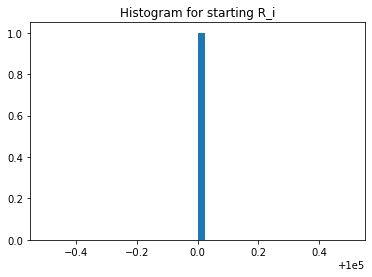

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([200000., 156795., 156154., ..., 236818., 238377., 144191.])

In [24]:
experiments.UNI_Si.unique()

array([10000., 14822., 14841., 14641., 14778., 14539., 14905., 14795.,
       14687., 14602., 14851., 14902., 14671., 14836., 14741., 14728.,
       14764., 14747., 14525., 14745., 14656., 14765., 14758., 14706.,
       14757., 14708., 14774., 14723., 14688., 14749., 14856., 14879.,
       14829., 14798., 14695., 14738., 14686., 14636., 14667., 14846.,
       14825., 14720., 14622., 14561., 14553., 14363., 14751., 14680.,
       14665., 14736., 14854., 14685., 14633., 14746., 14924., 14650.,
       14639., 14849., 14752., 14763., 14791., 14797., 14666., 14750.,
       14740., 14753., 14842., 14692., 14717., 14827., 14869., 14901.,
       14632., 14768., 14895., 14731., 14734., 14812., 14914., 14735.,
       14648., 14690., 14724., 14703., 14719., 14654., 14817., 14818.,
       14548., 14868., 14576., 14739., 14670., 14725., 14604., 14697.,
       14821., 14801., 14661., 14512., 14770., 14828., 14780., 14769.,
       14808., 14700., 14701., 14707., 14694., 14832., 14718., 14814.,
      

In [25]:
experiments.UNI_Qj.unique()

array([200000., 138253., 137487., ..., 153594., 156767., 160657.])

In [26]:
experiments.UNI_Rj.unique()

array([100000., 144846., 145656., ..., 128962., 127683., 124581.])

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([100000.])

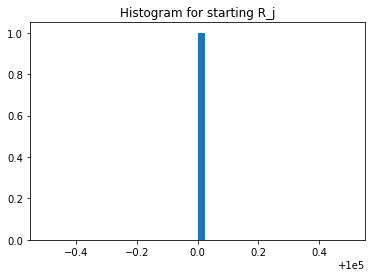

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([100000.])

In [31]:
experiments.UNI_ji.unique()

array([100000.])

In [32]:
experiments.UNI_Sij.unique()

array([1.e+10])

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


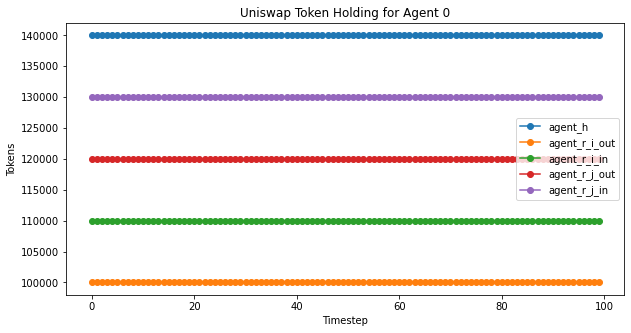

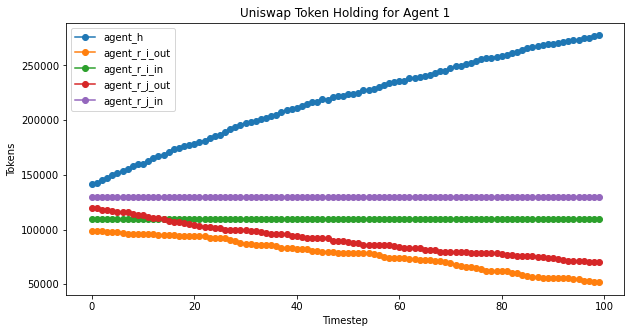

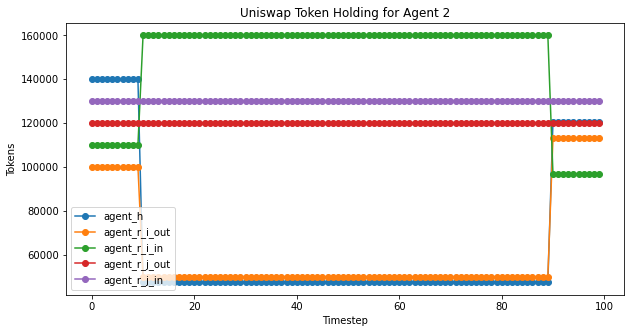

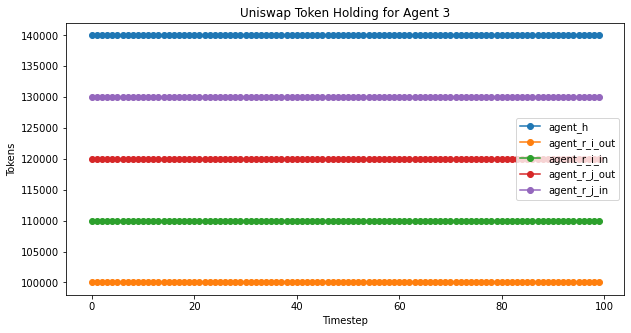

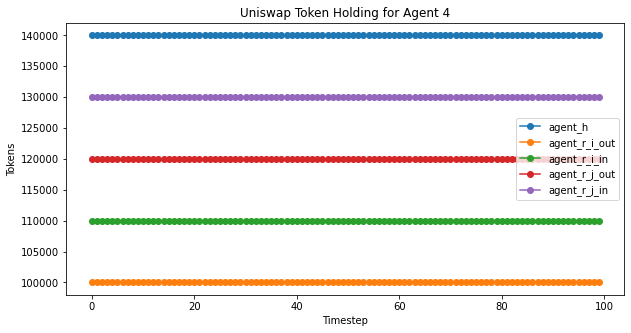

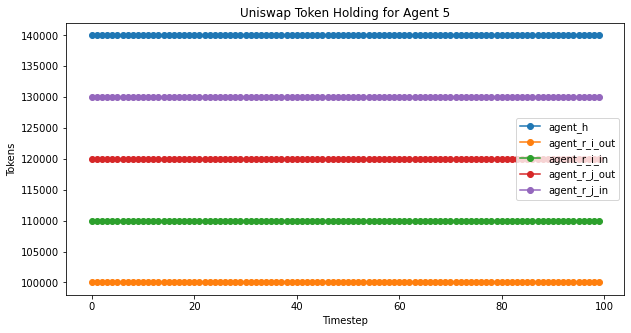

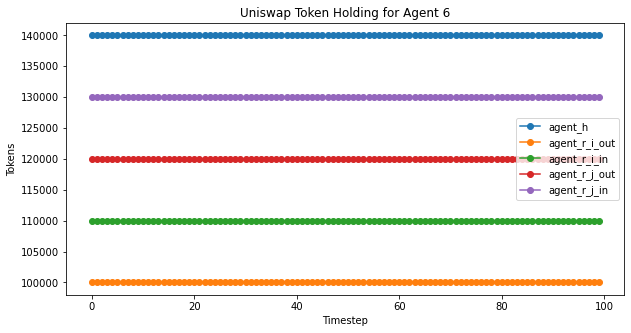

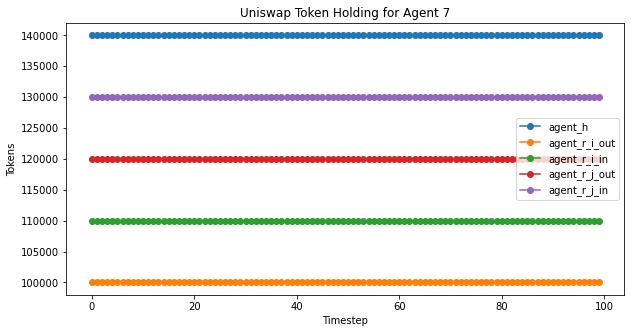

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


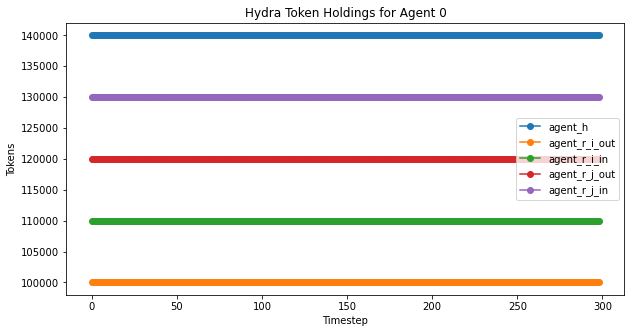

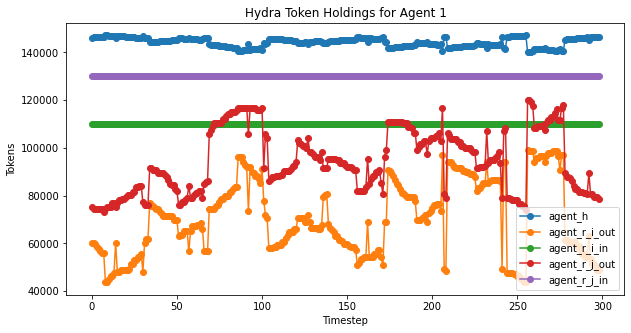

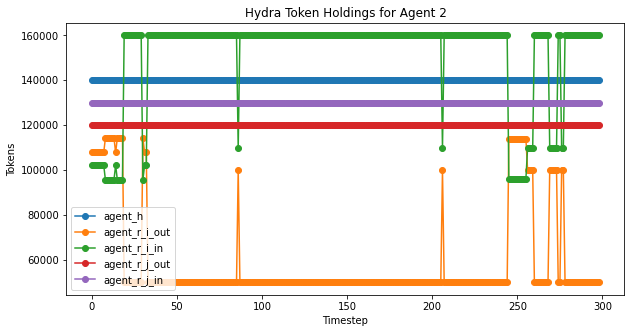

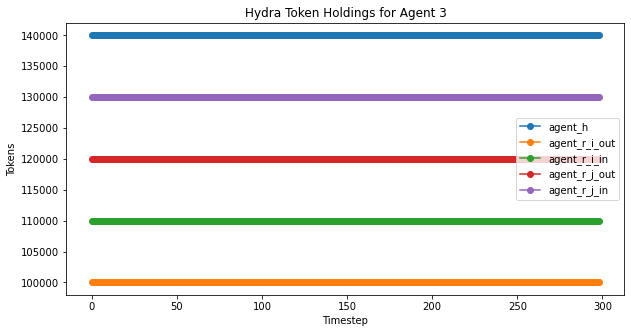

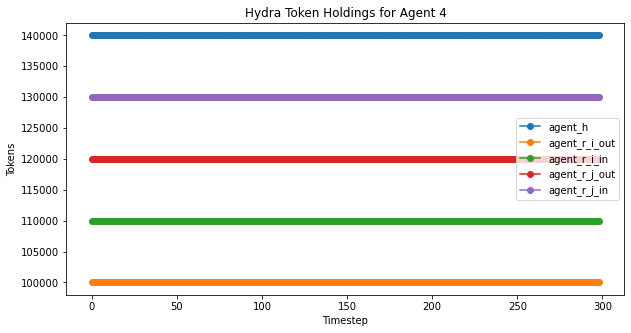

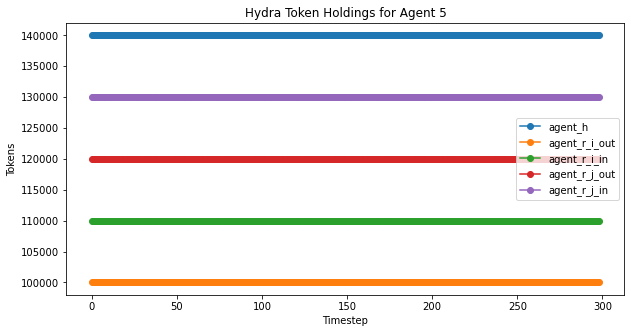

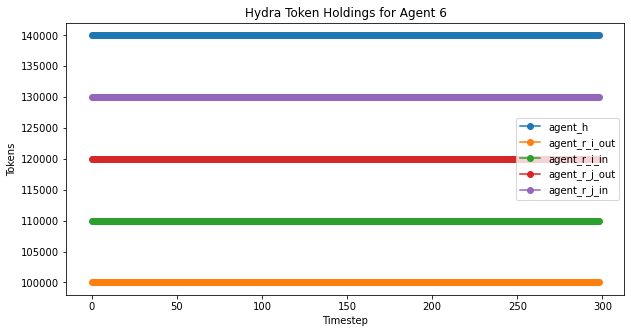

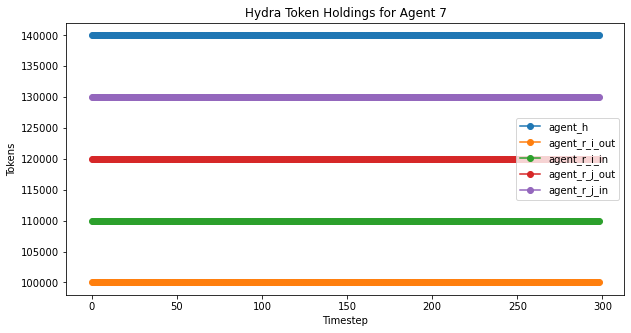

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

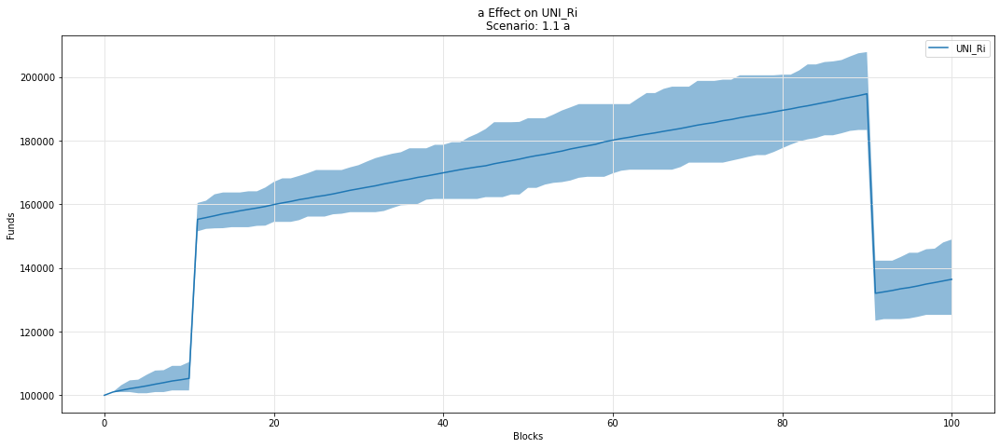

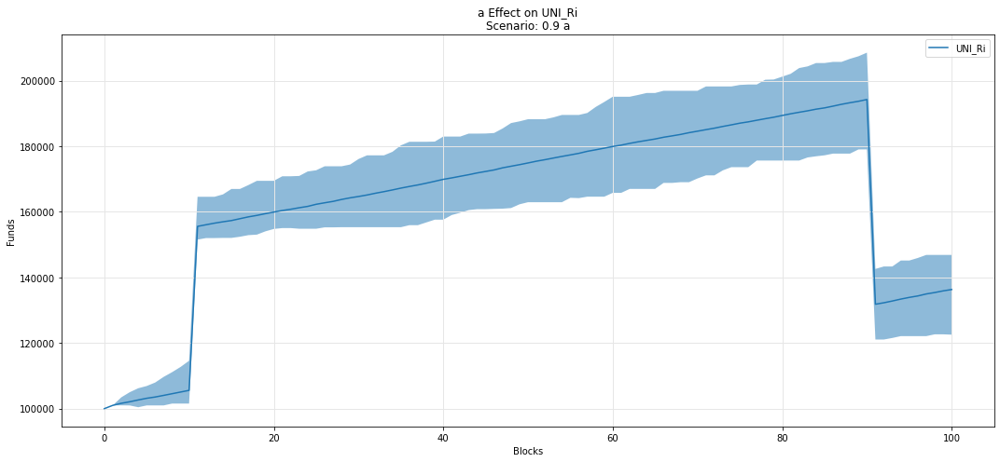

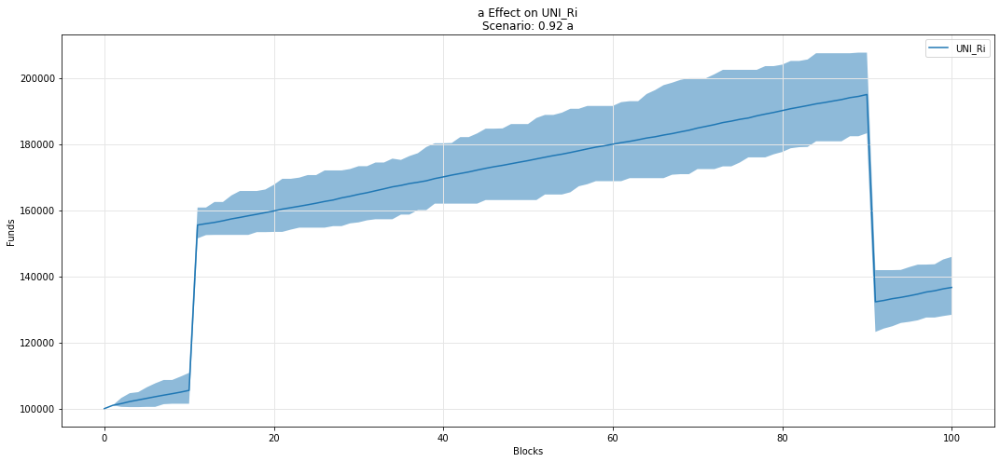

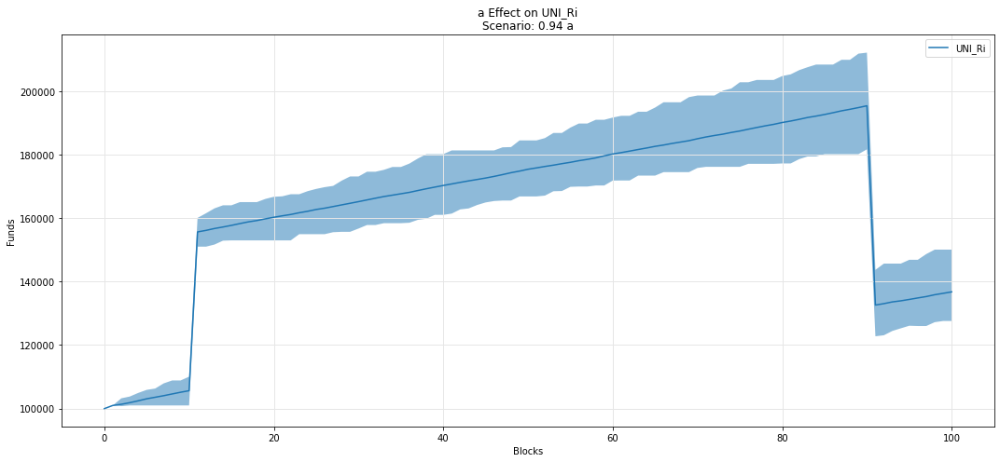

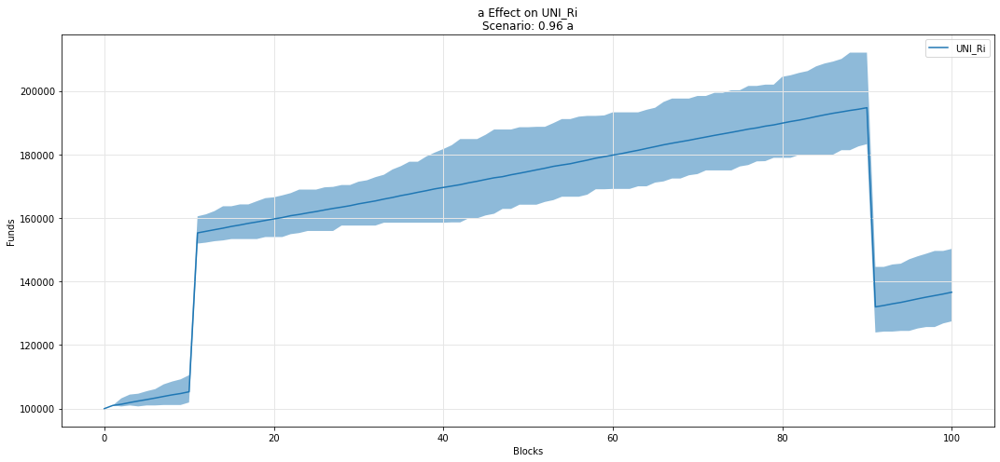

...

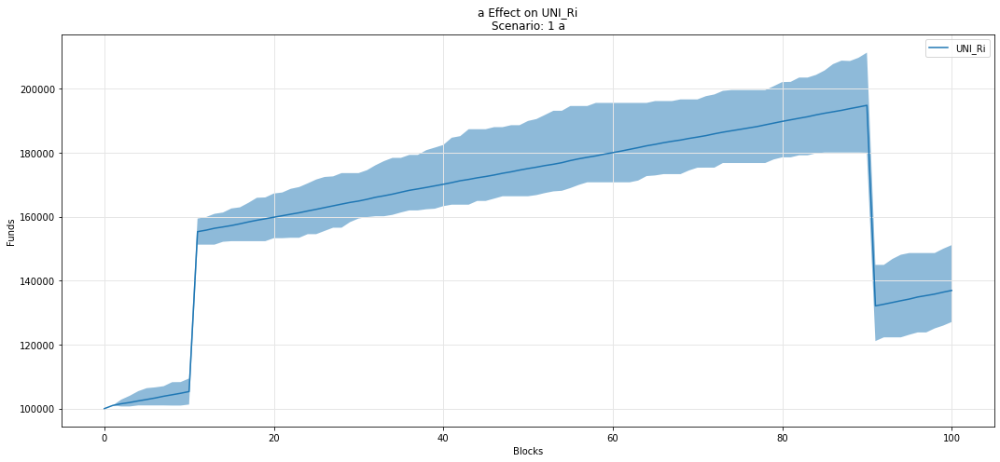

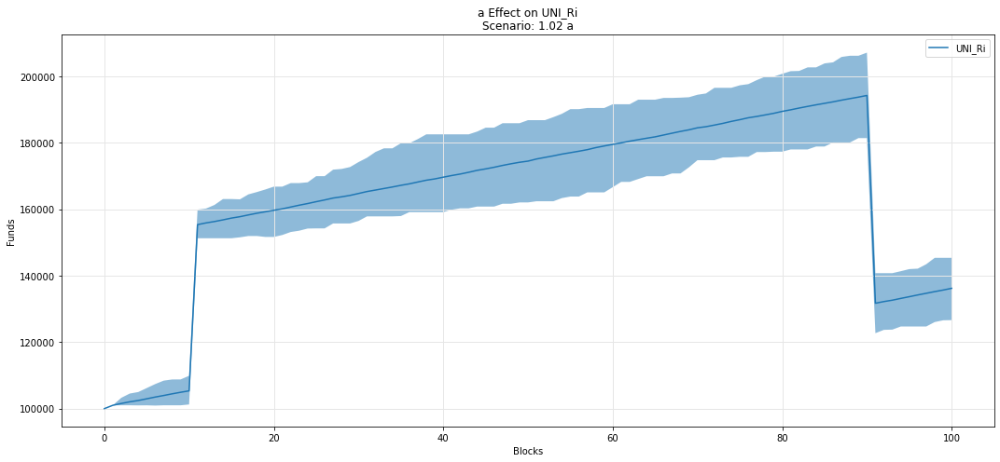

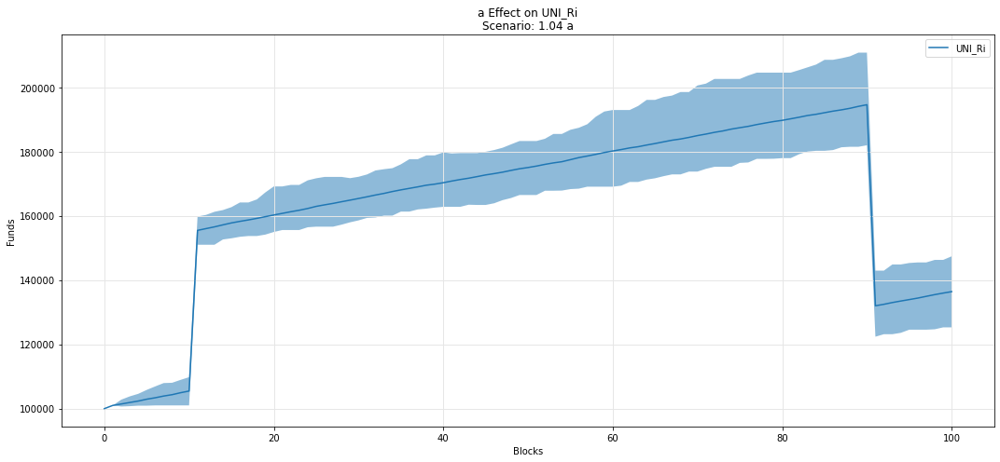

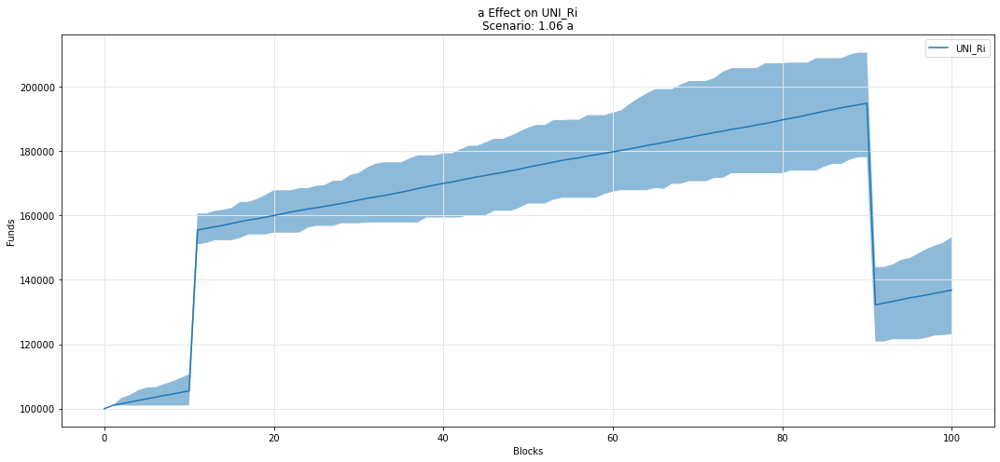

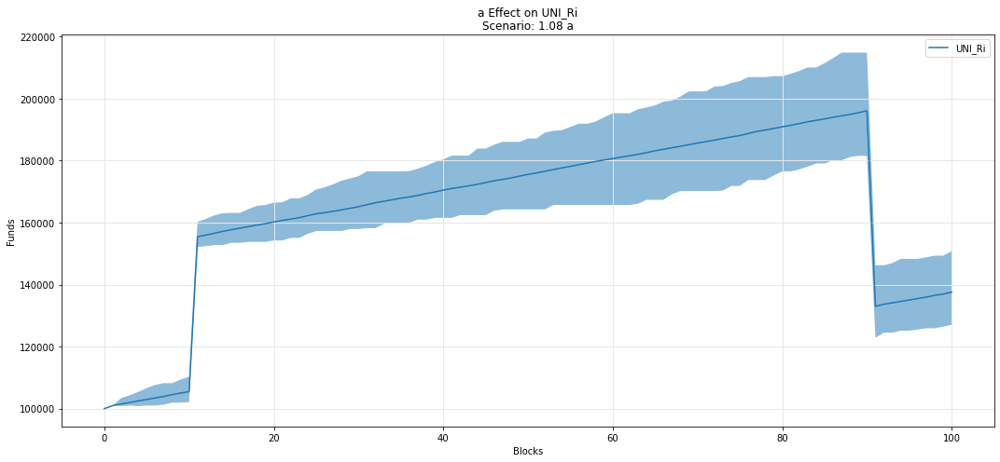

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

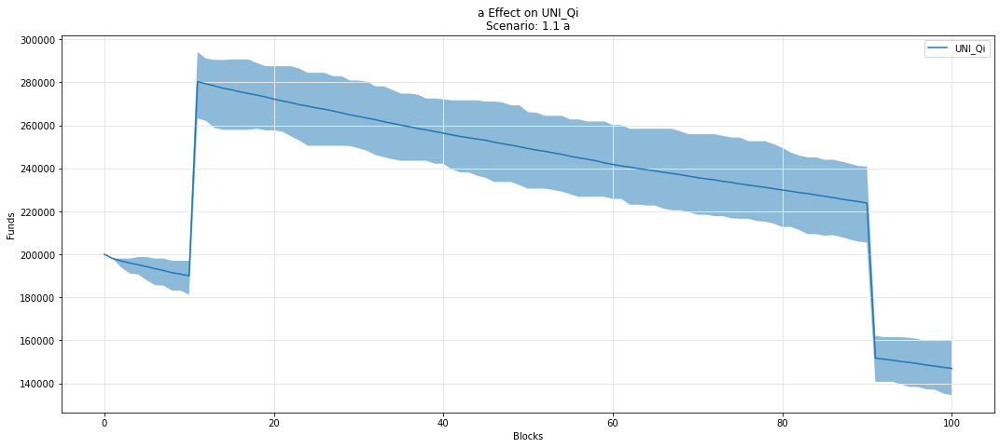

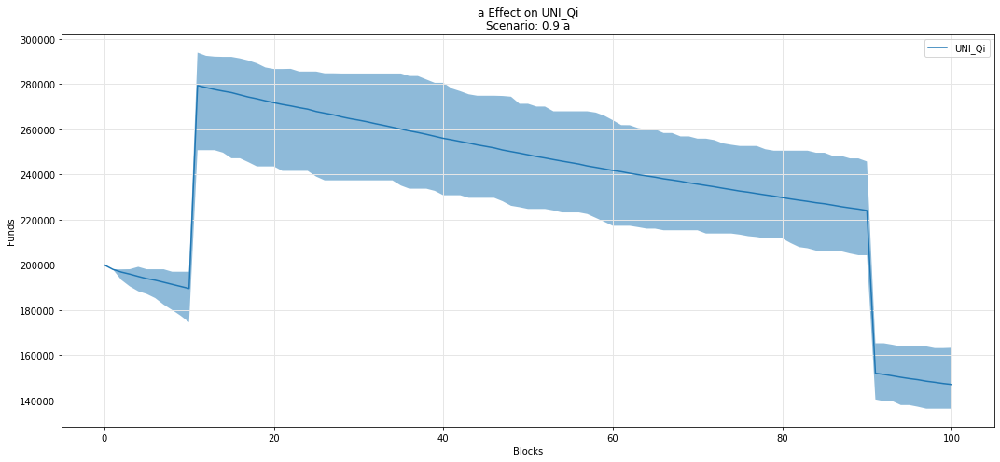

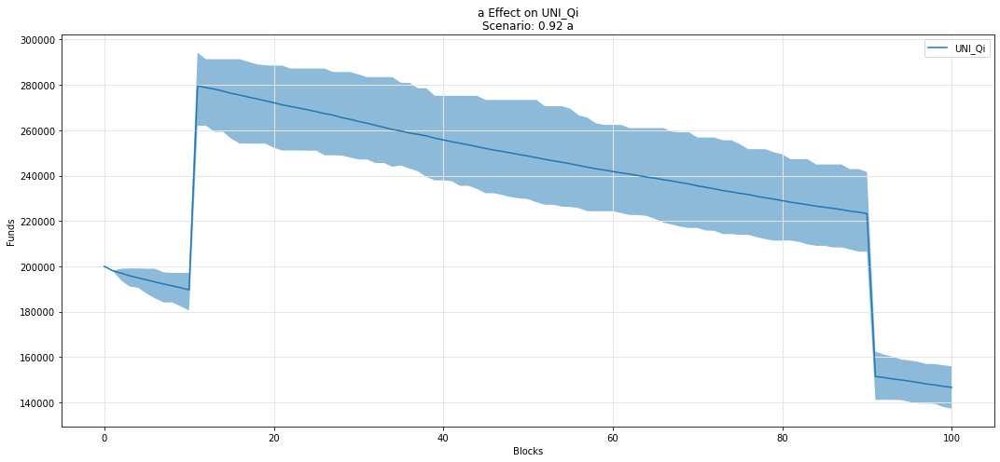

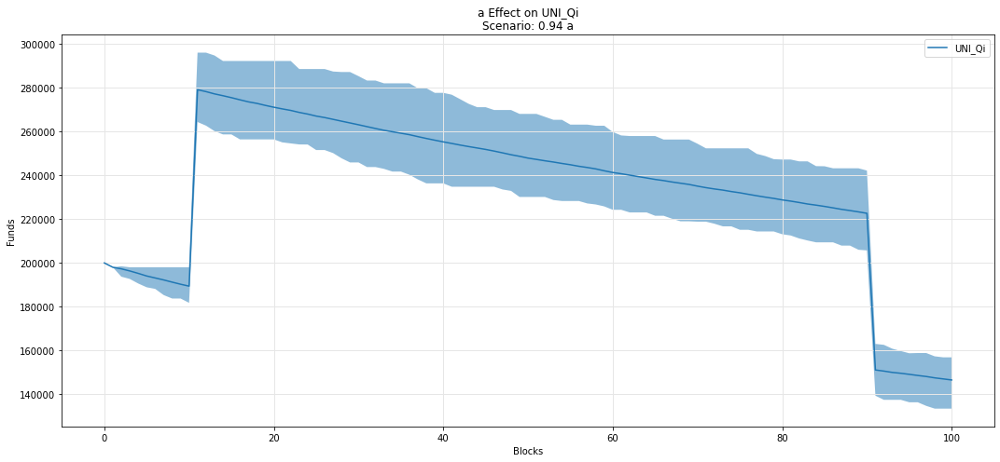

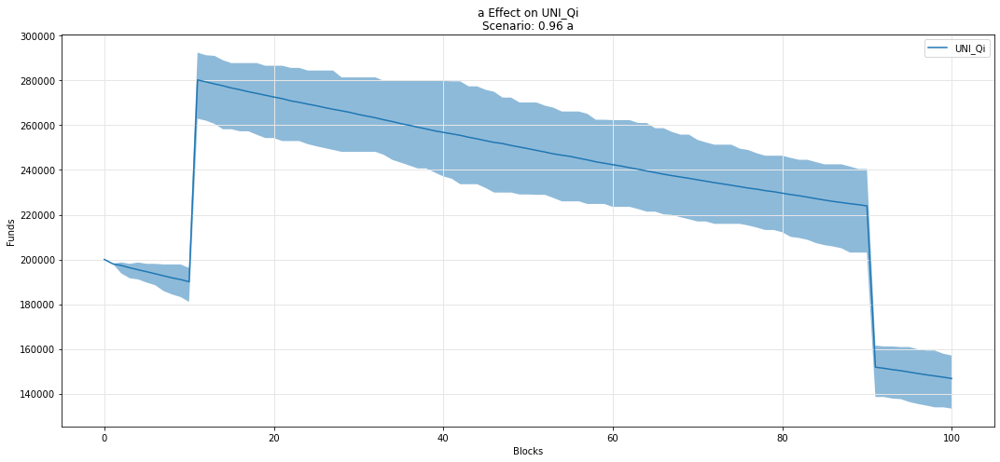

...

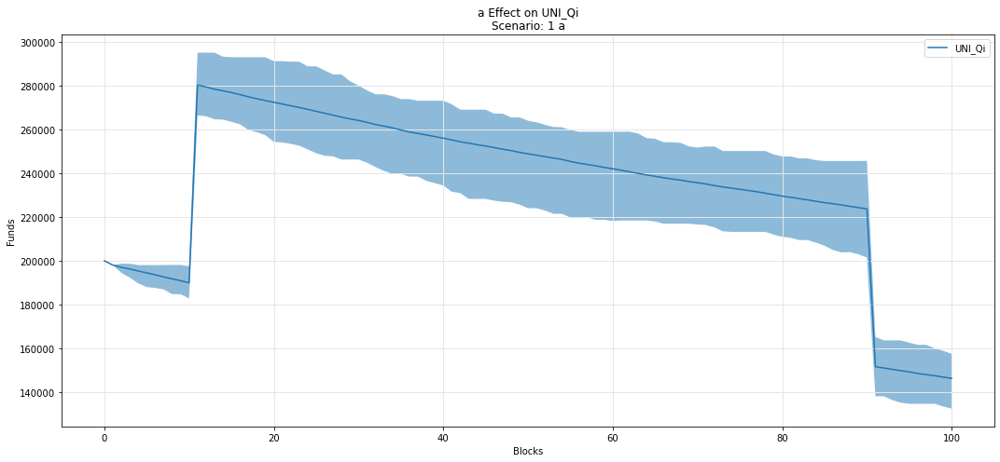

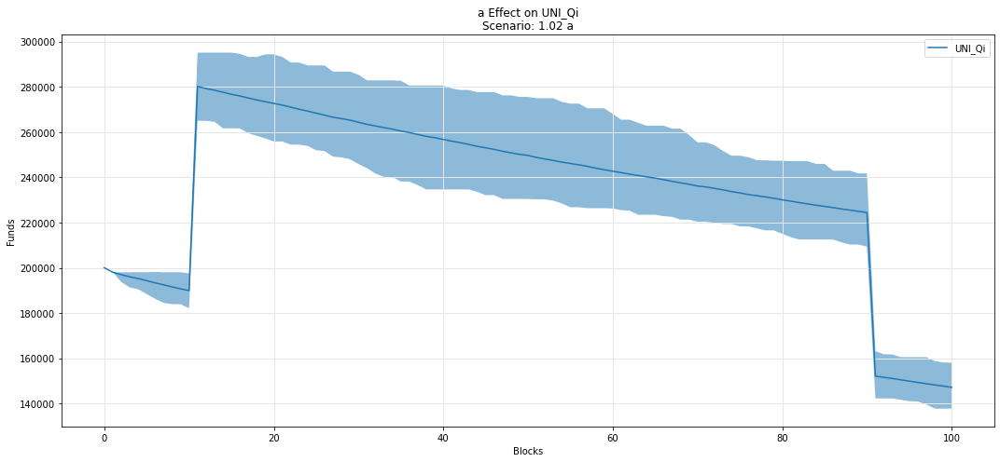

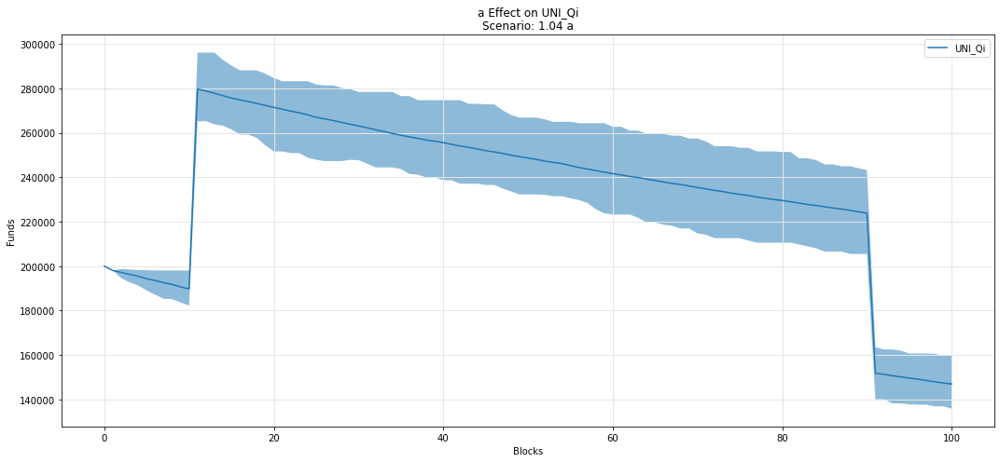

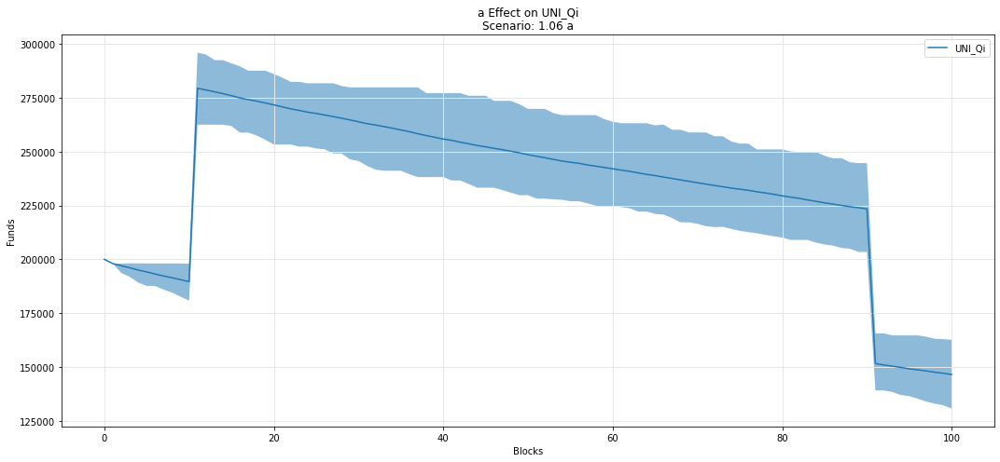

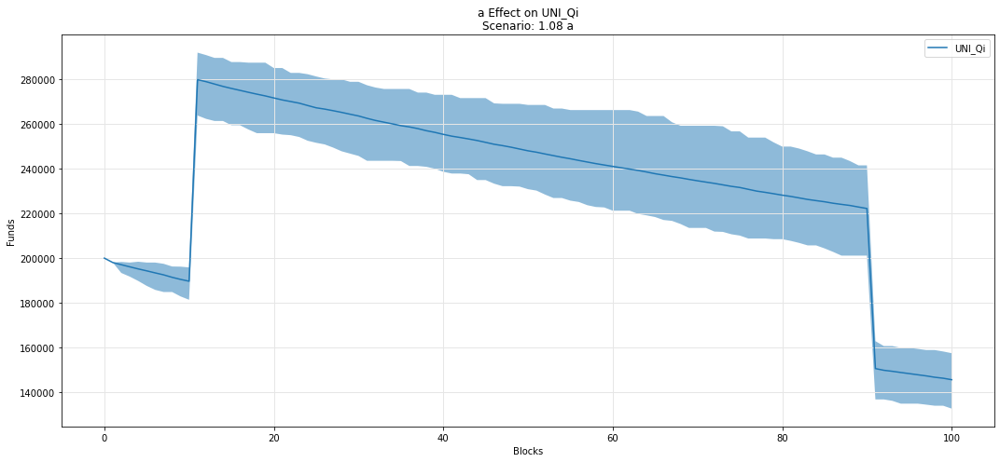

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

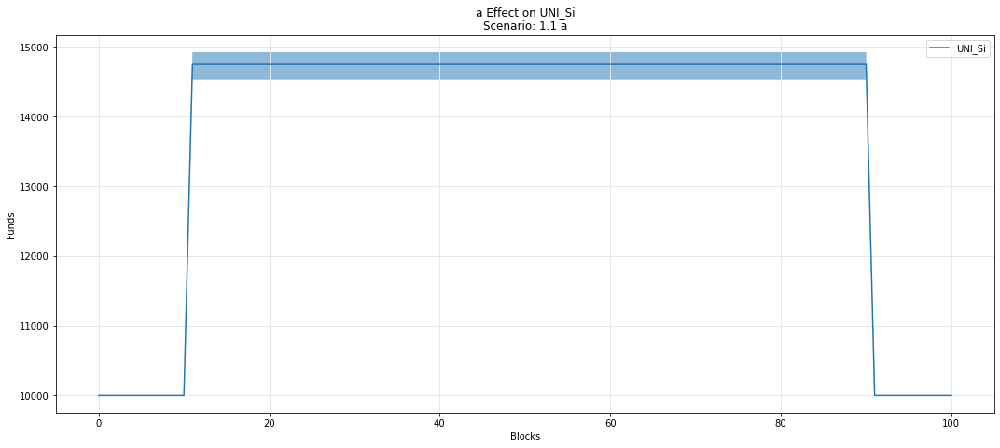

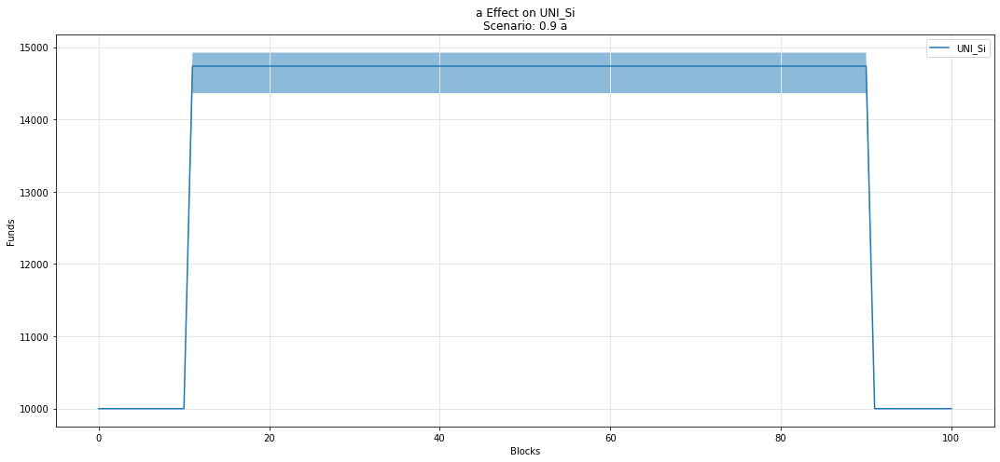

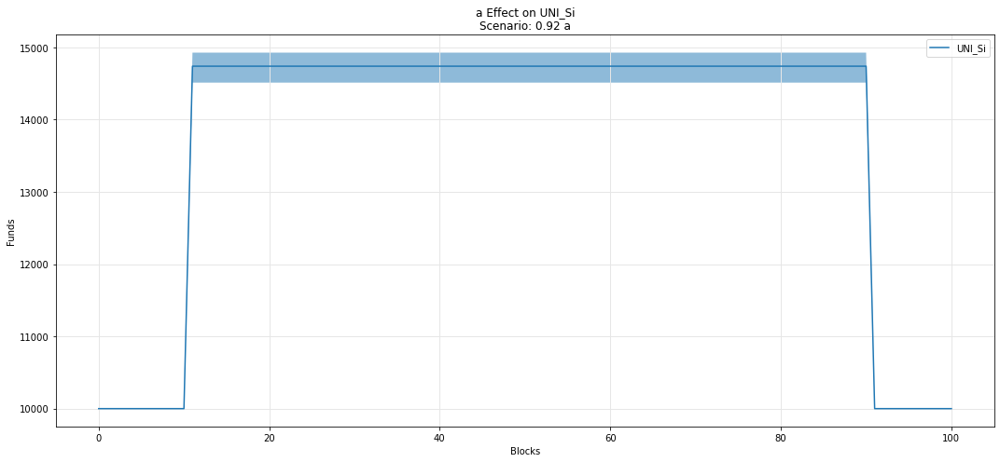

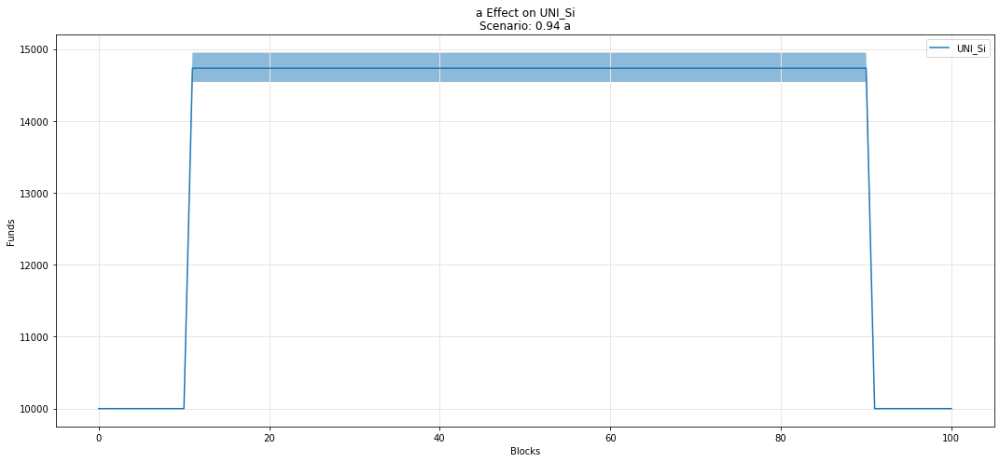

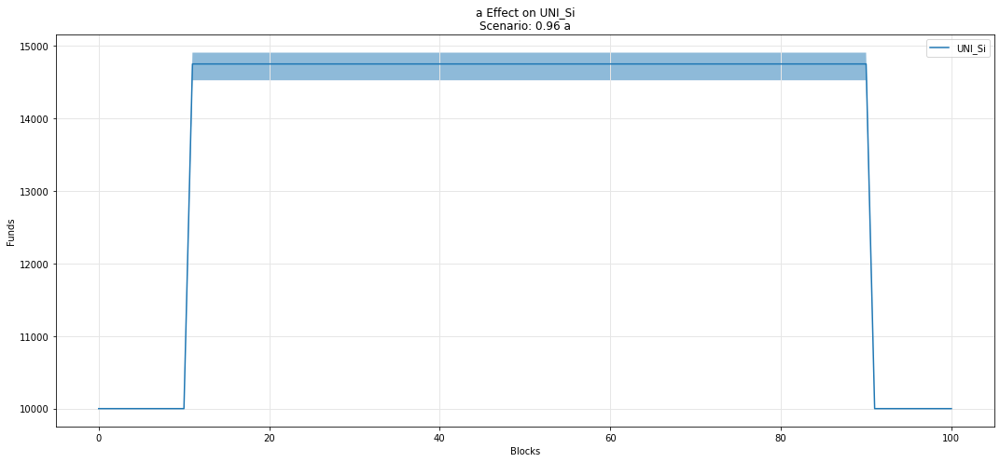

...

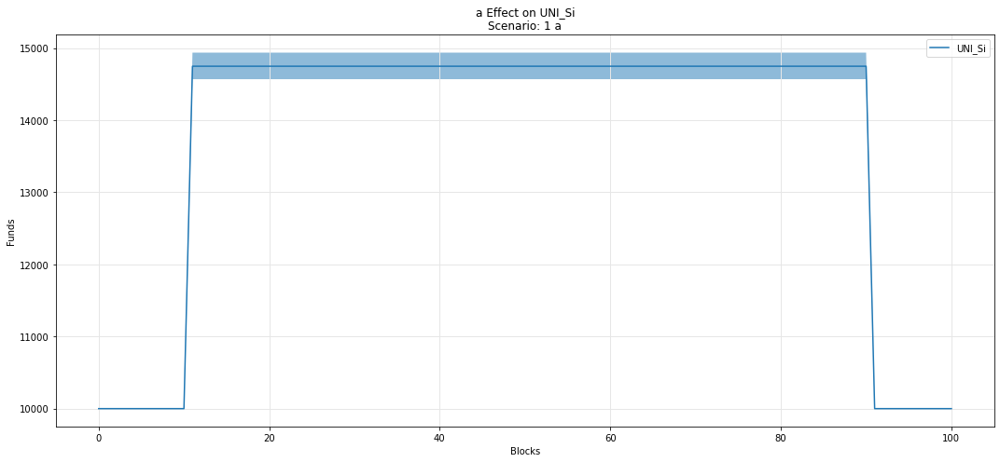

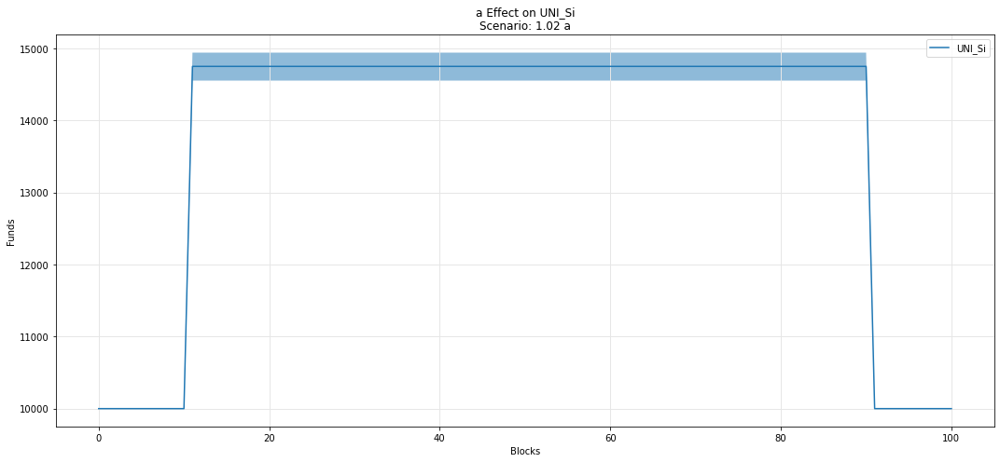

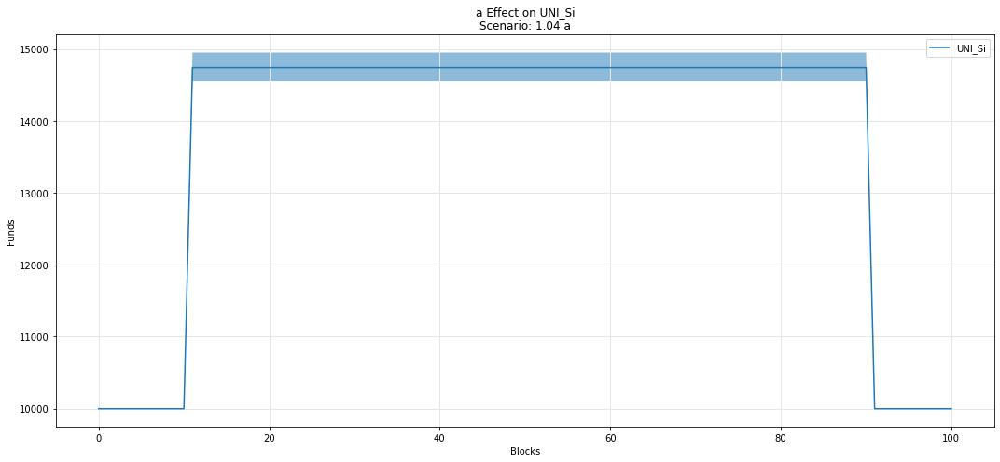

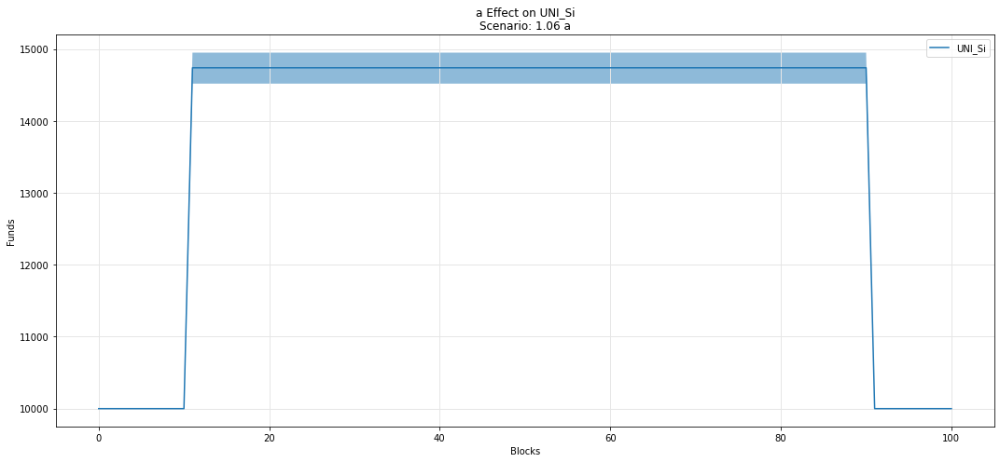

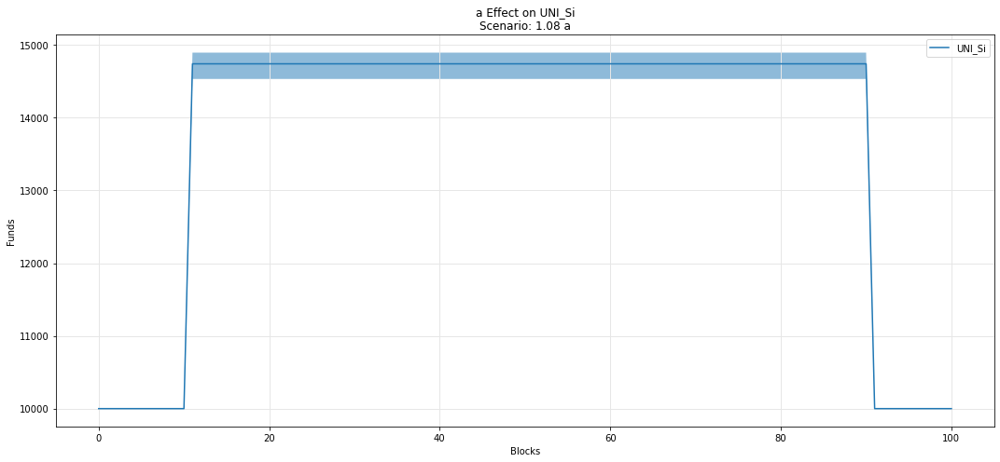

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

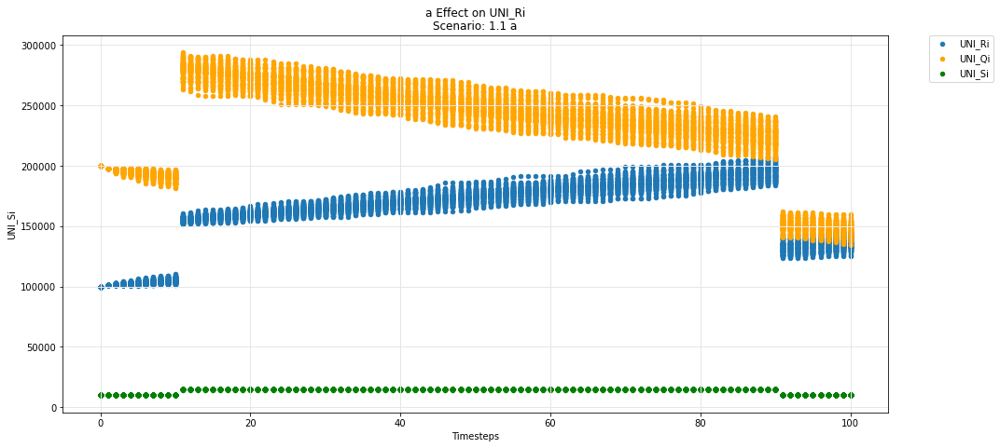

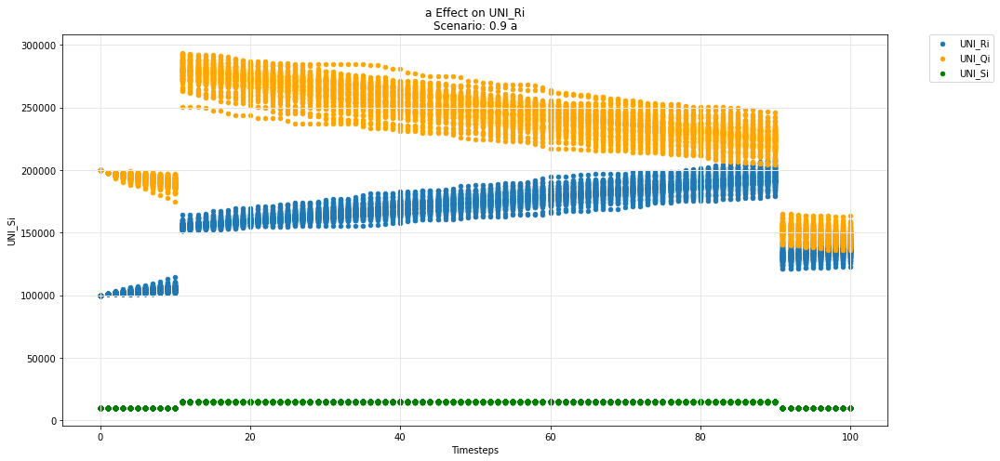

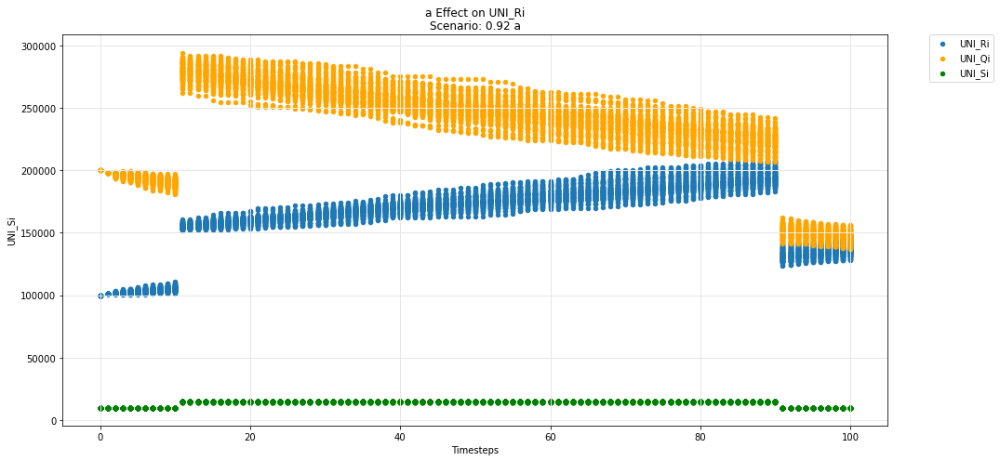

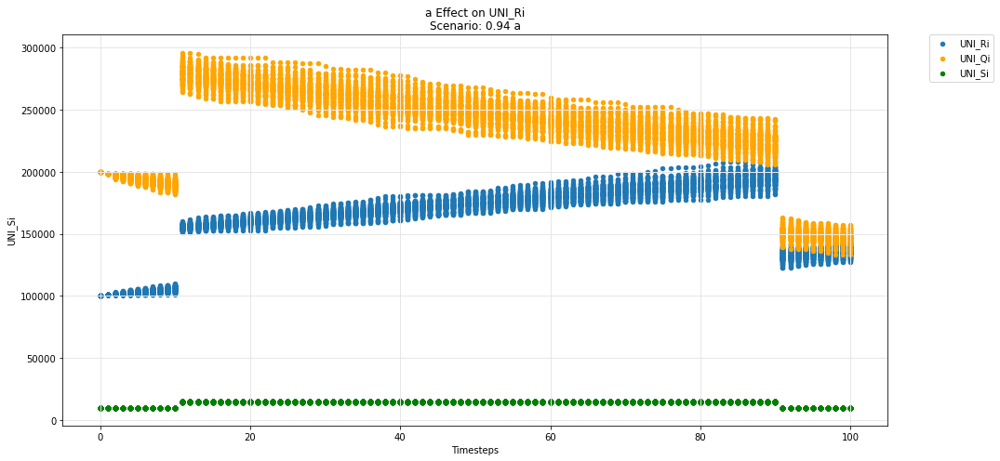

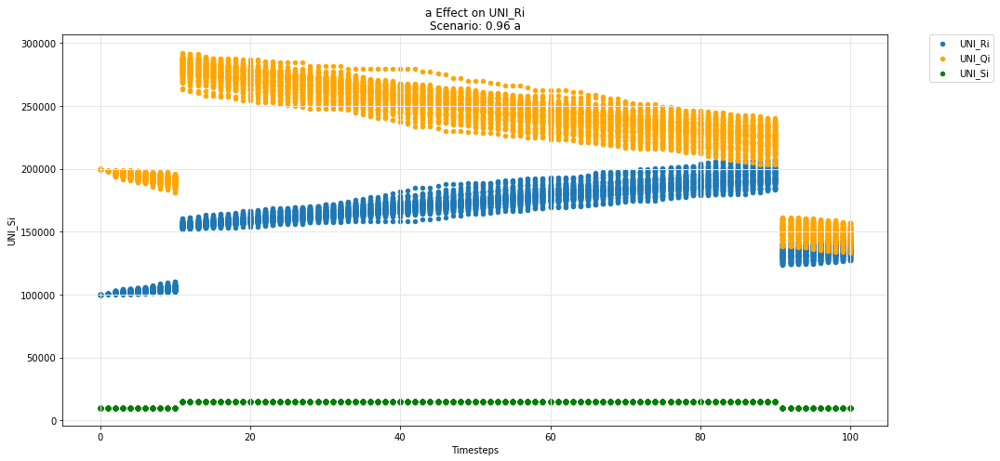

...

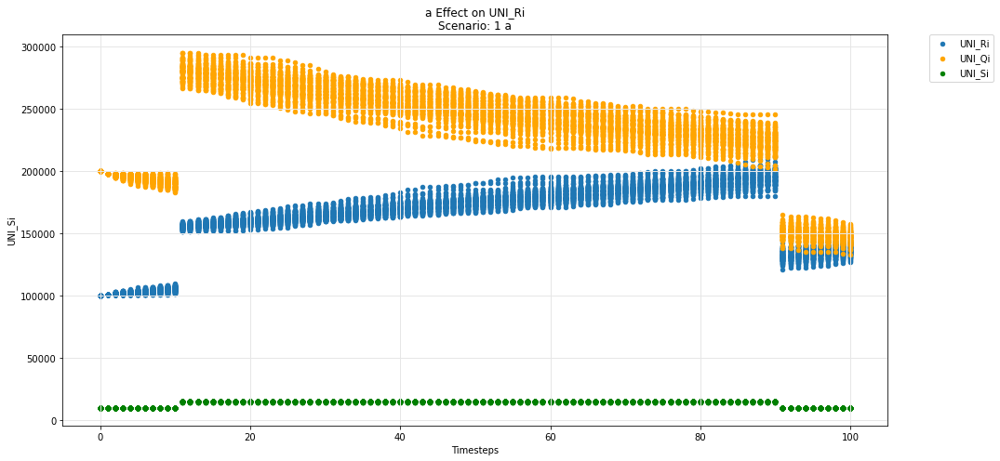

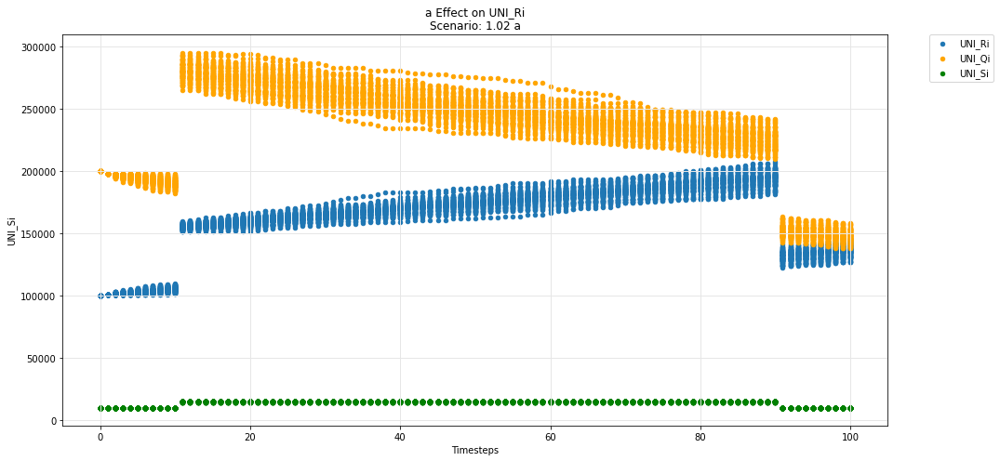

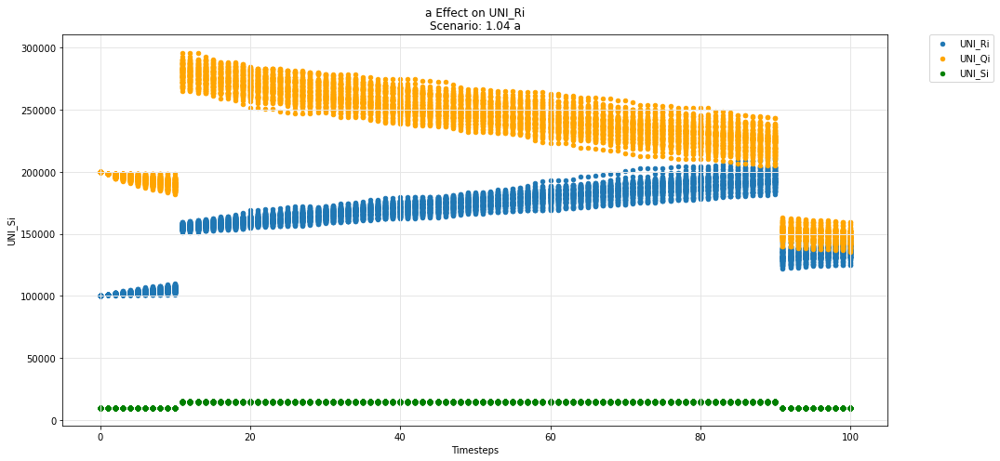

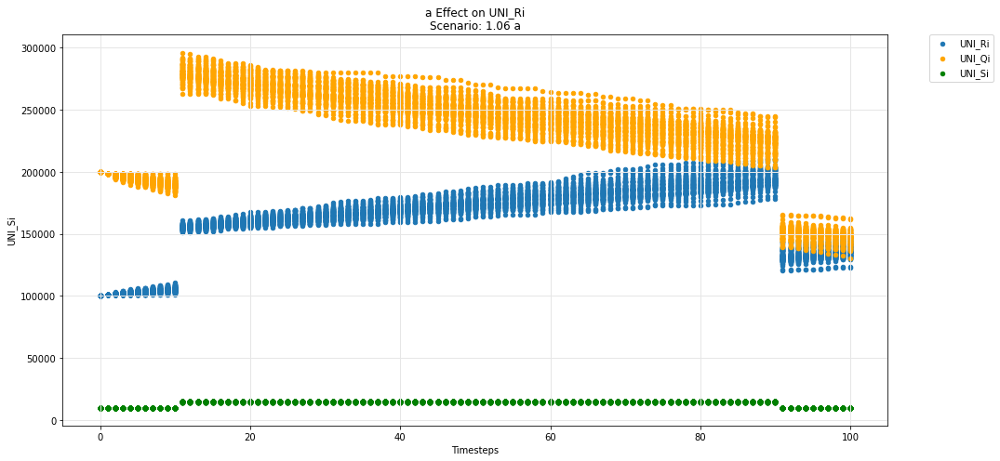

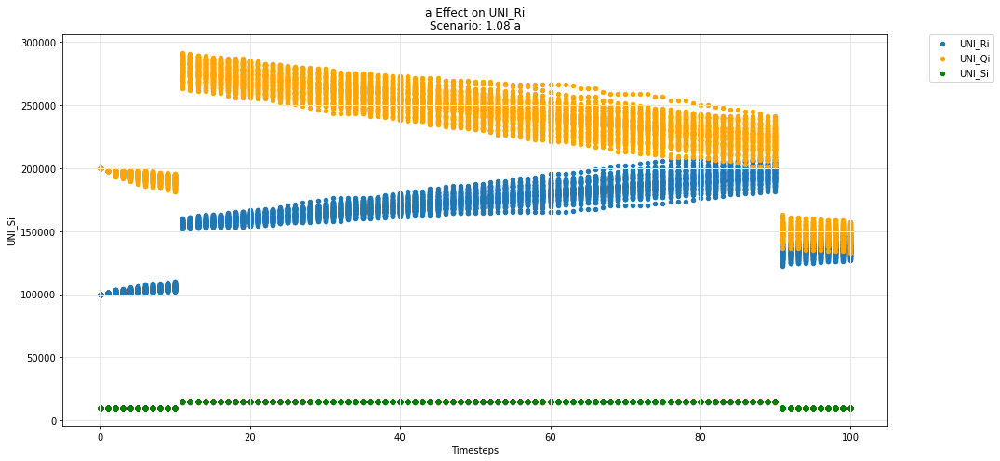

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

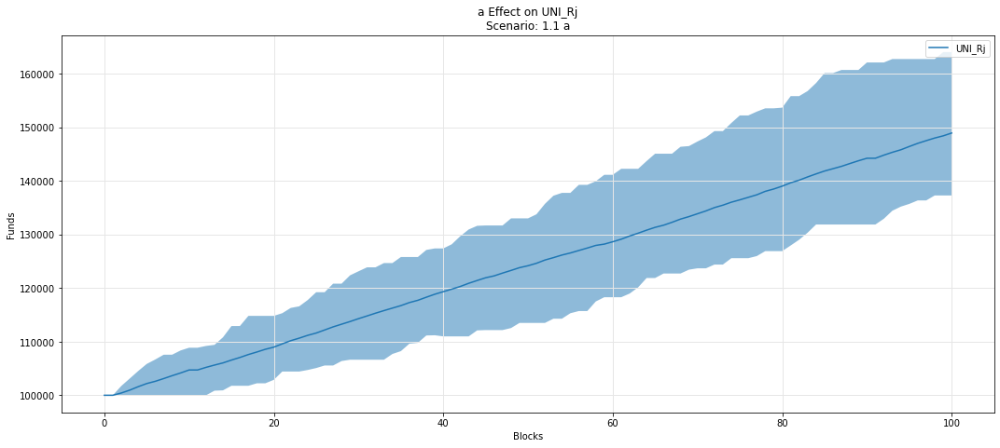

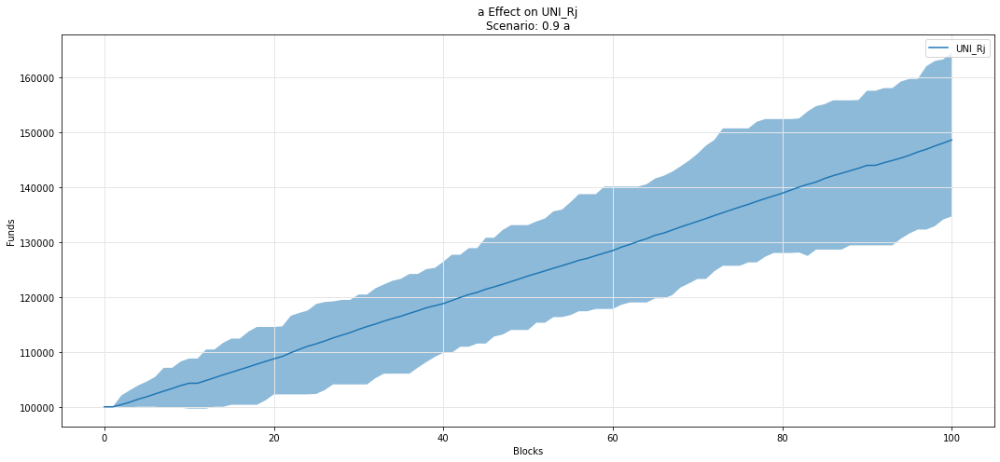

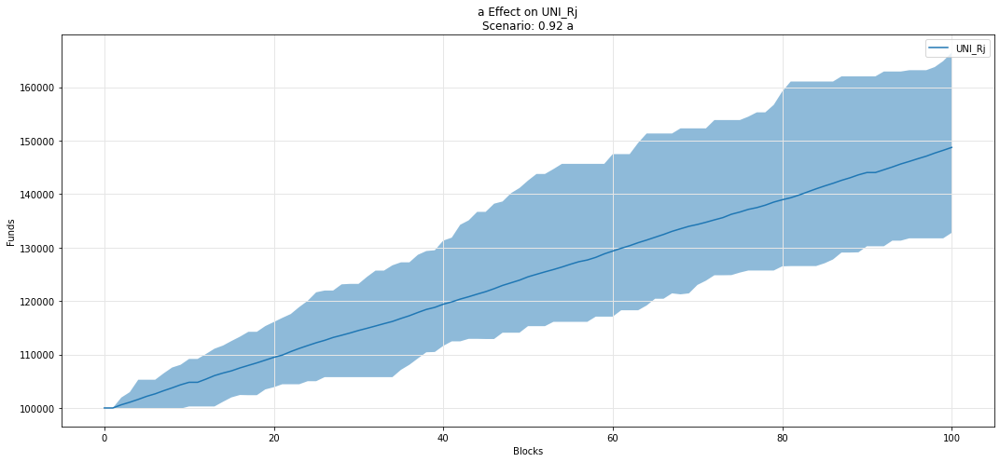

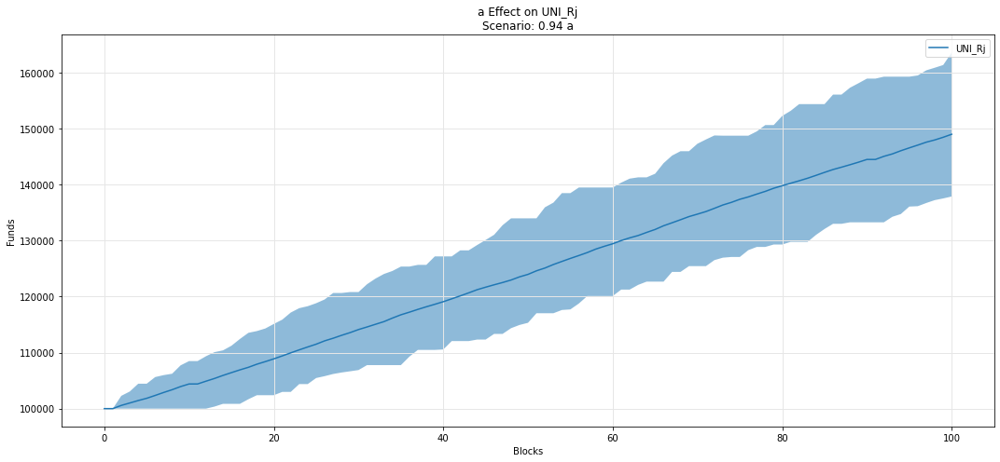

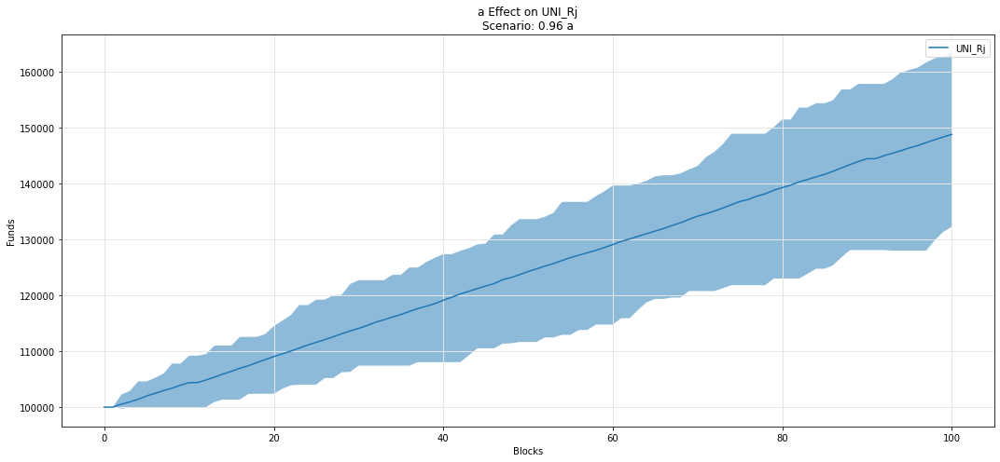

...

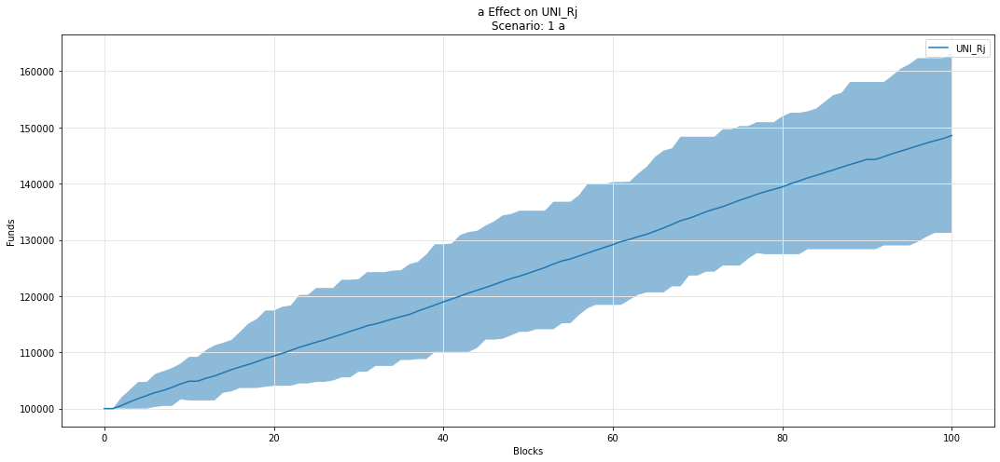

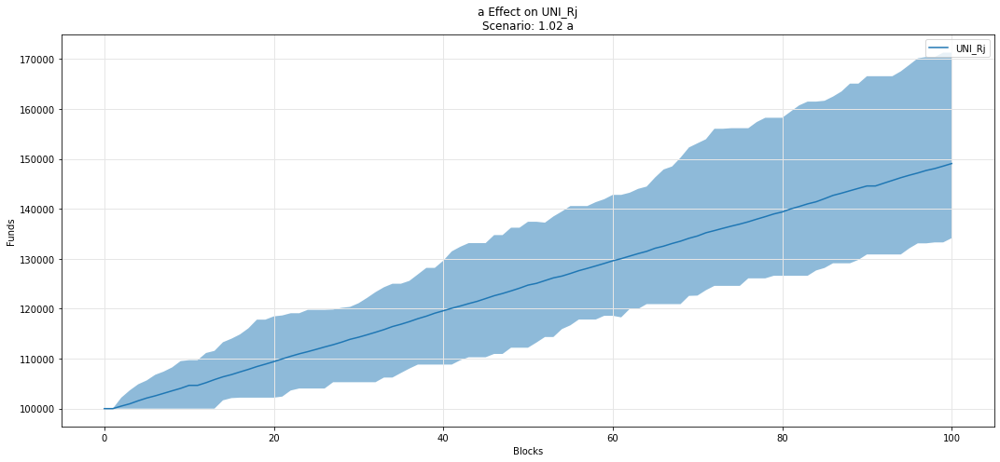

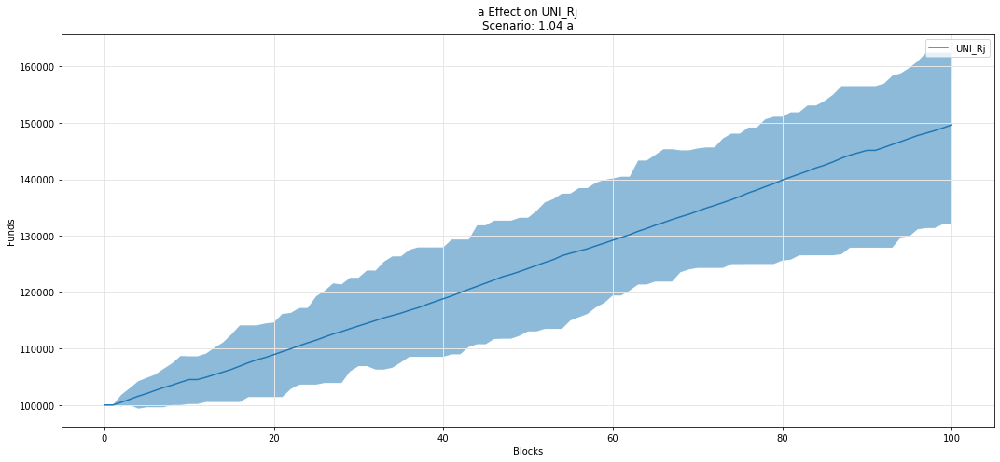

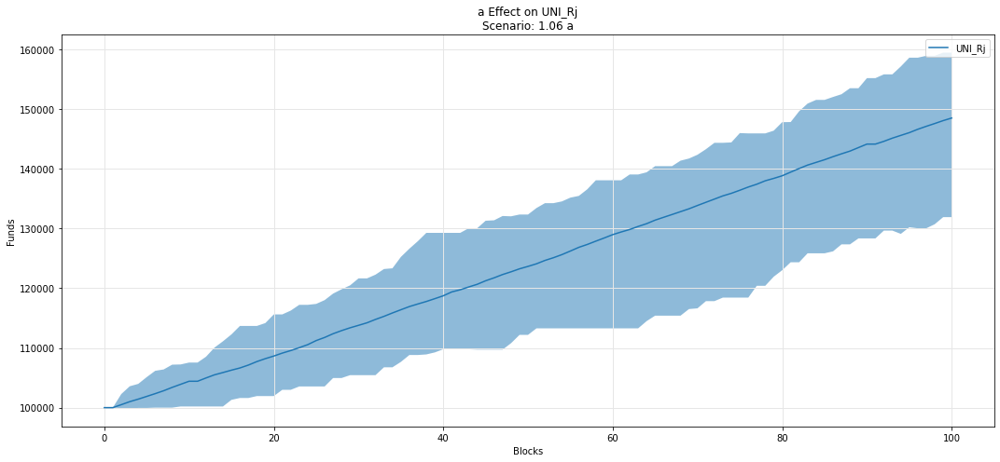

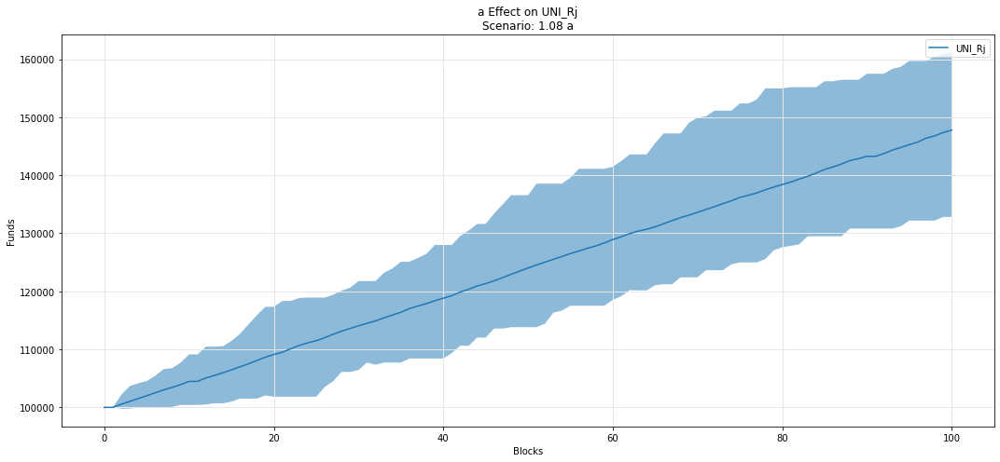

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

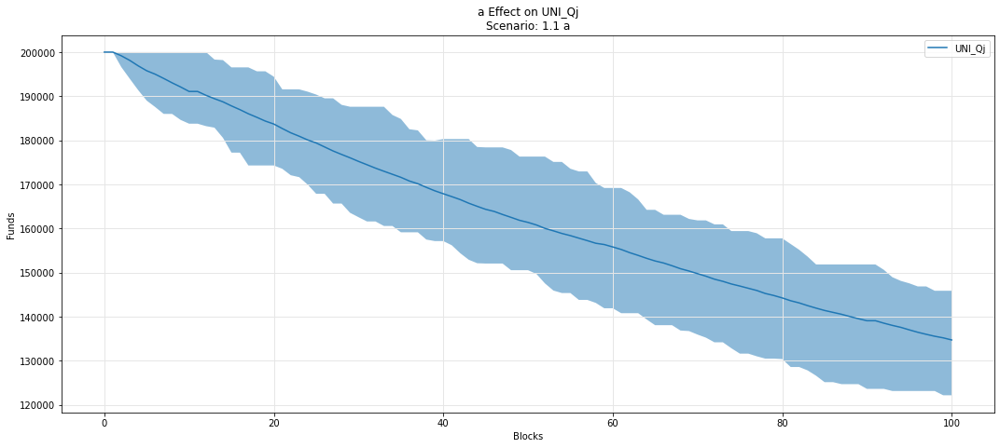

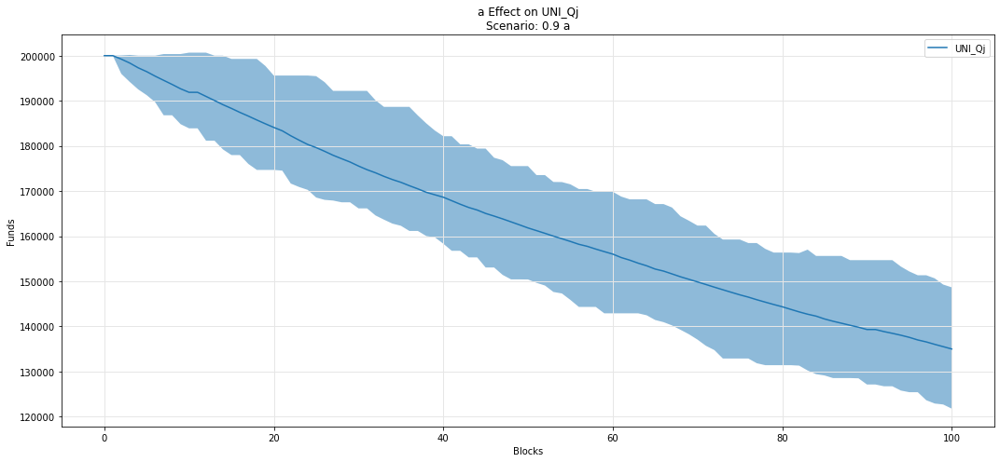

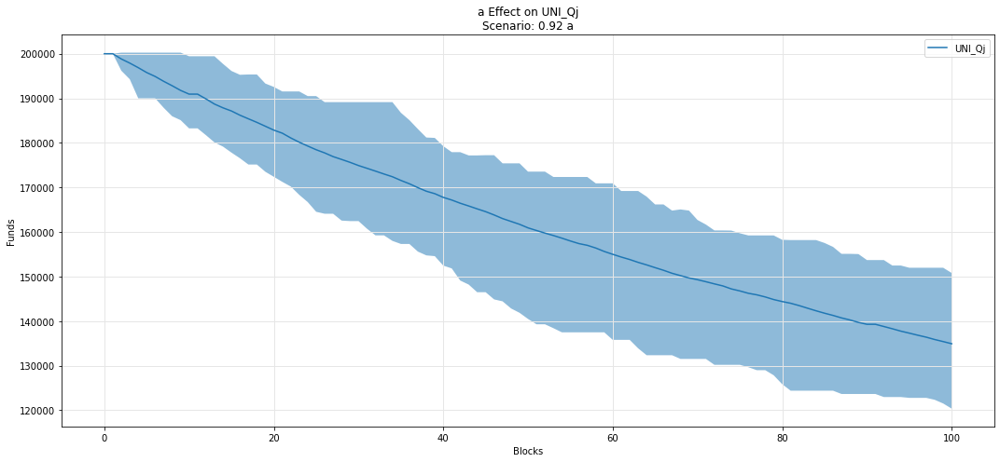

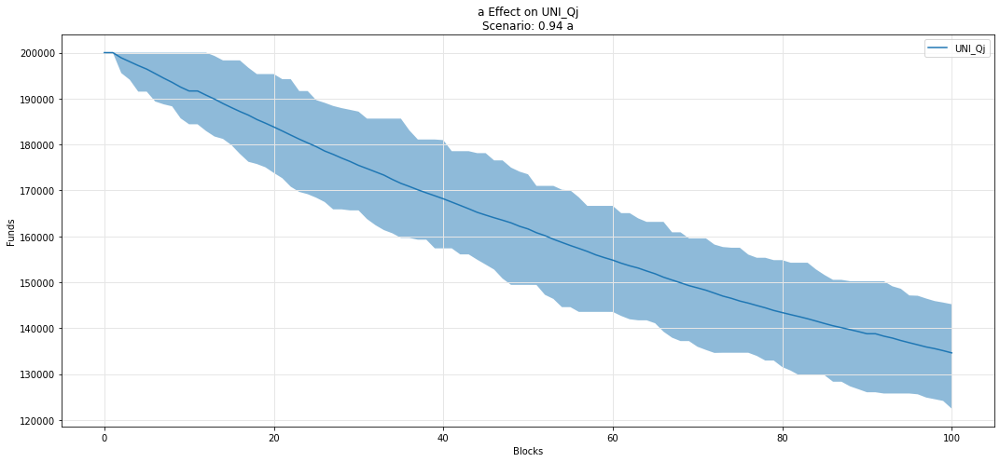

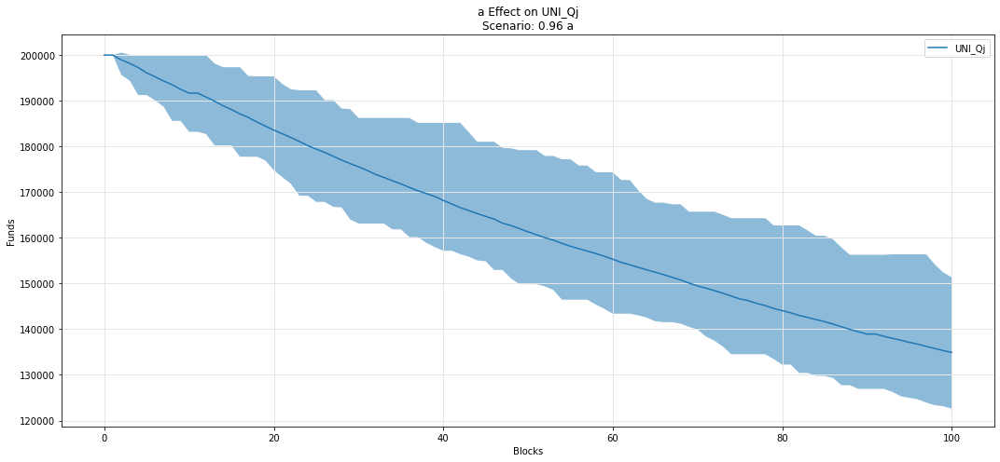

...

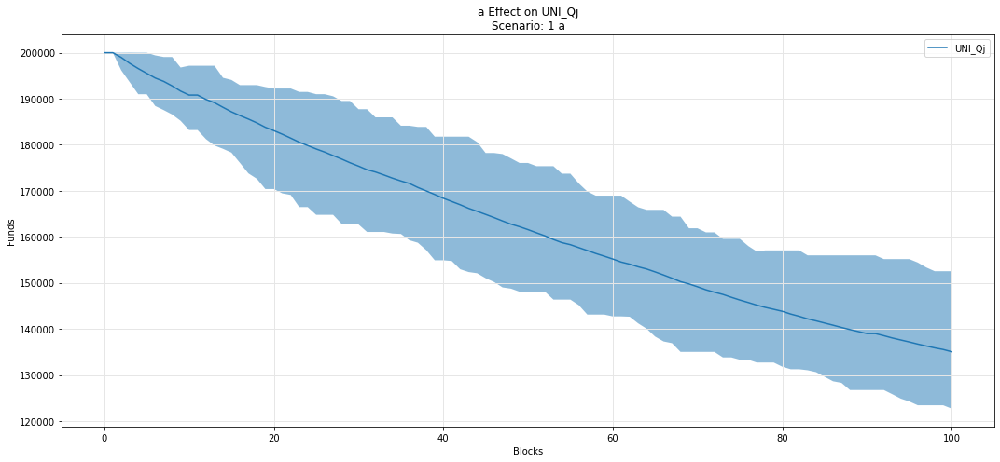

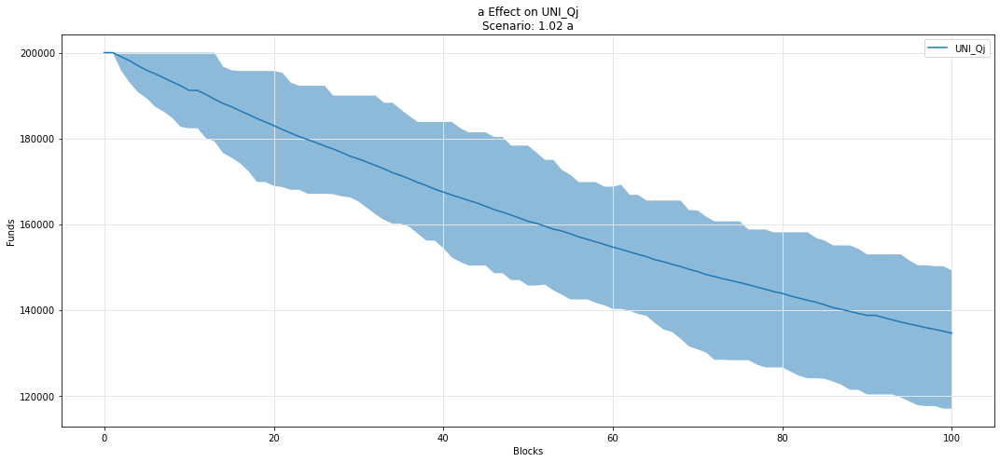

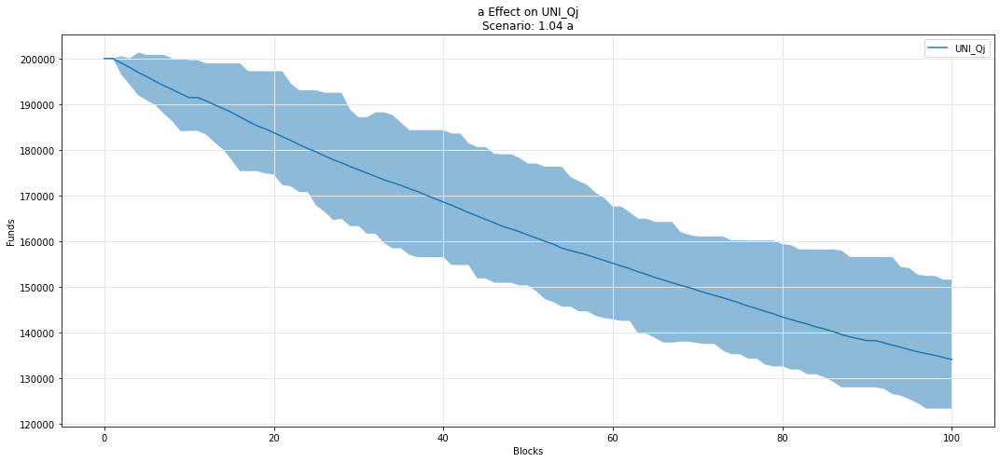

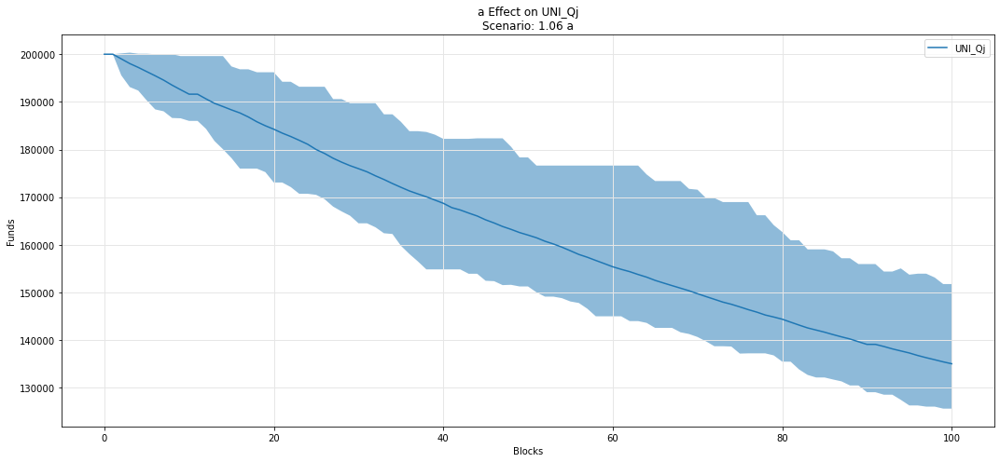

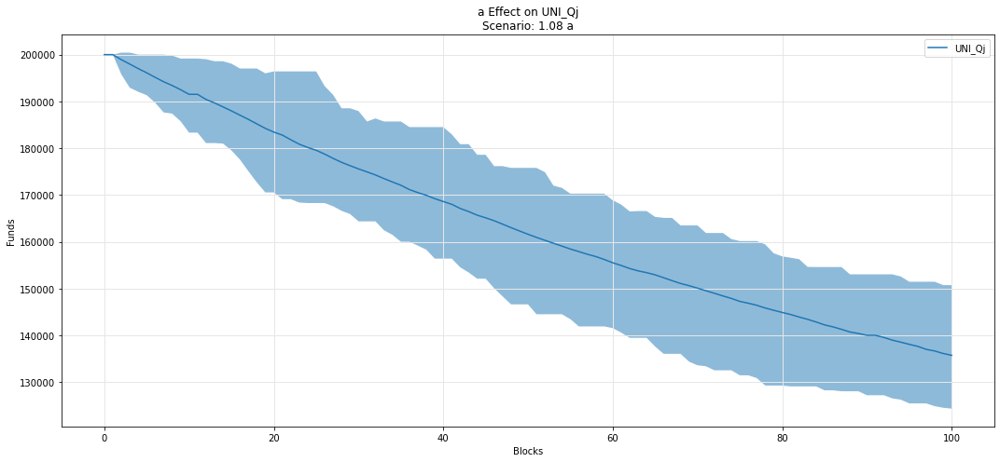

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

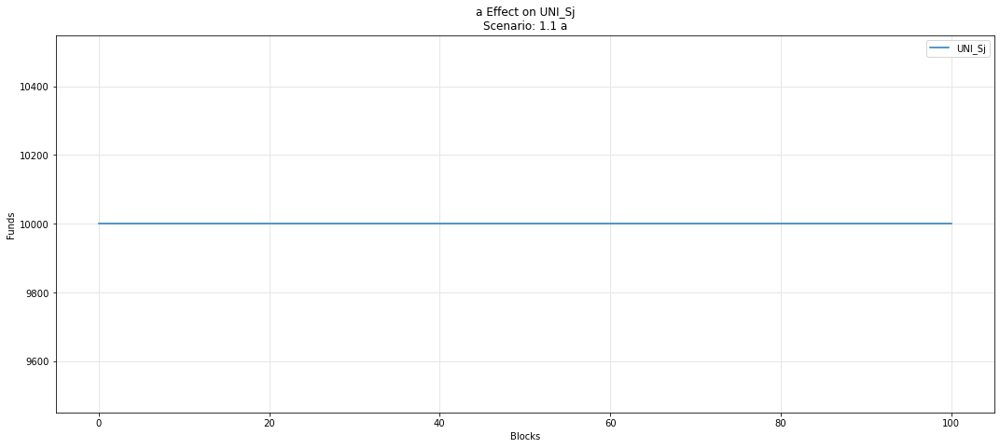

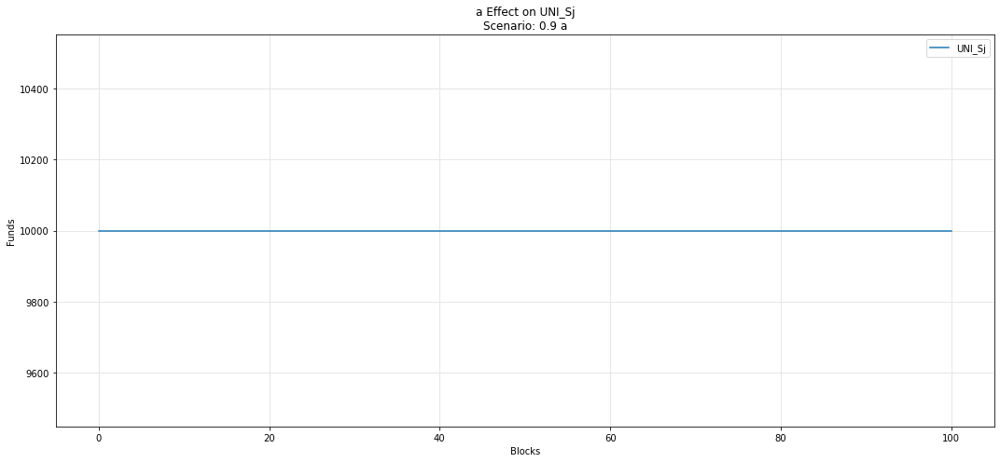

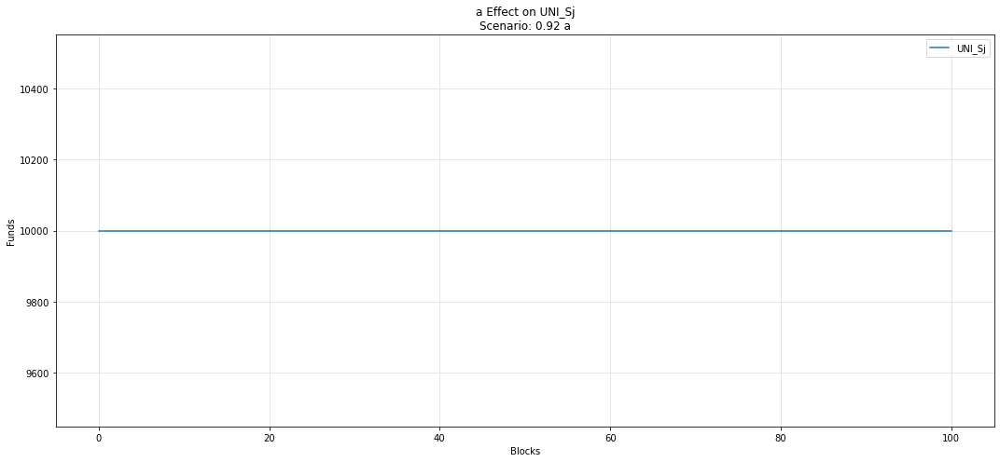

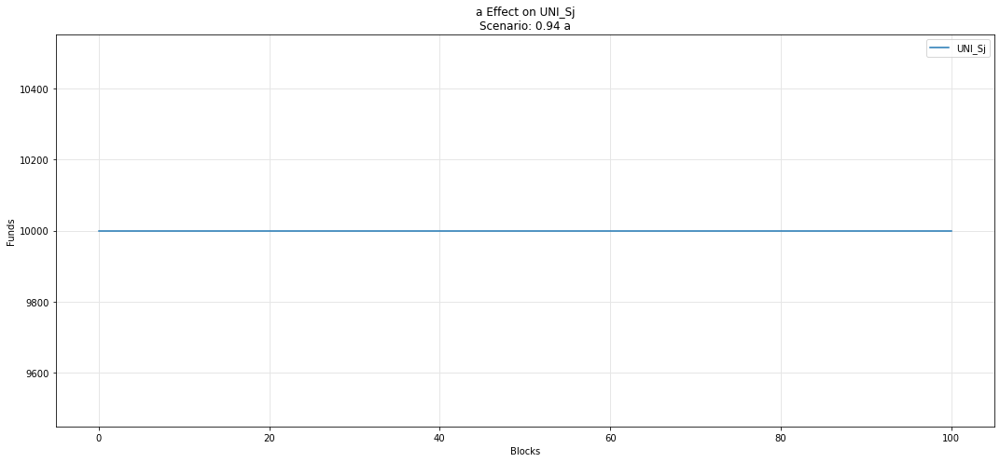

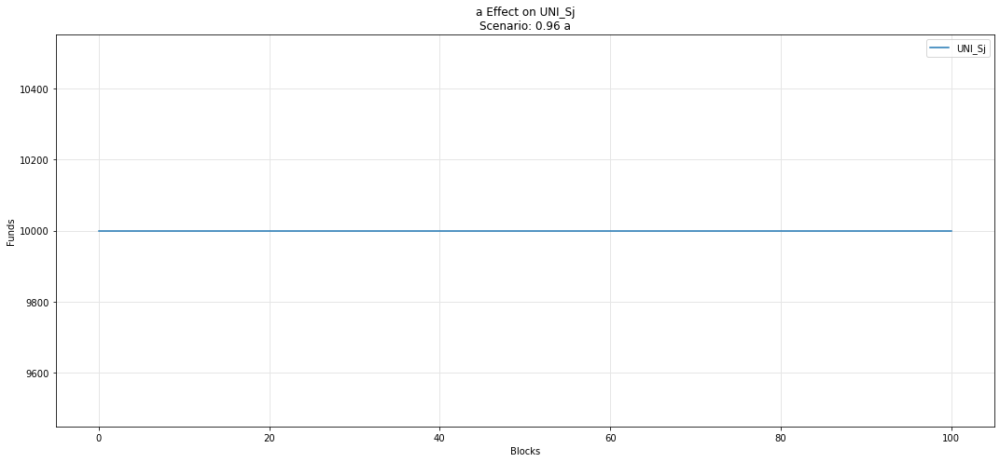

...

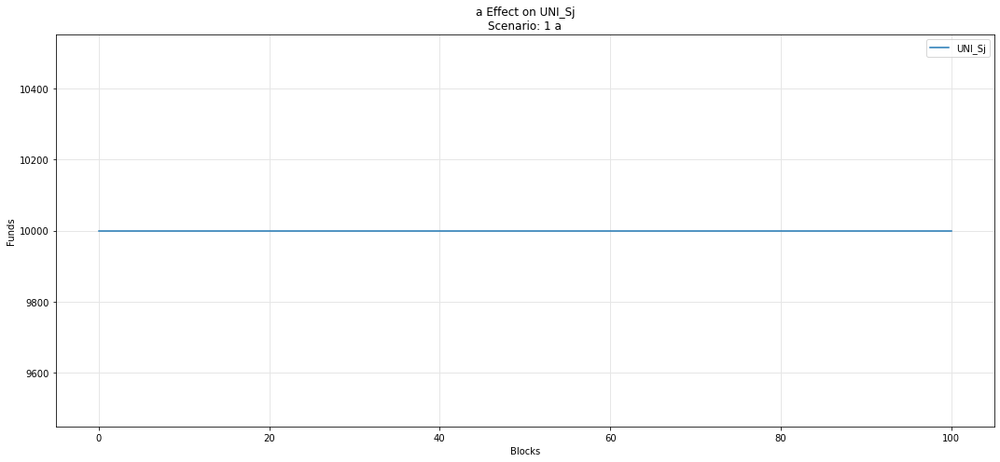

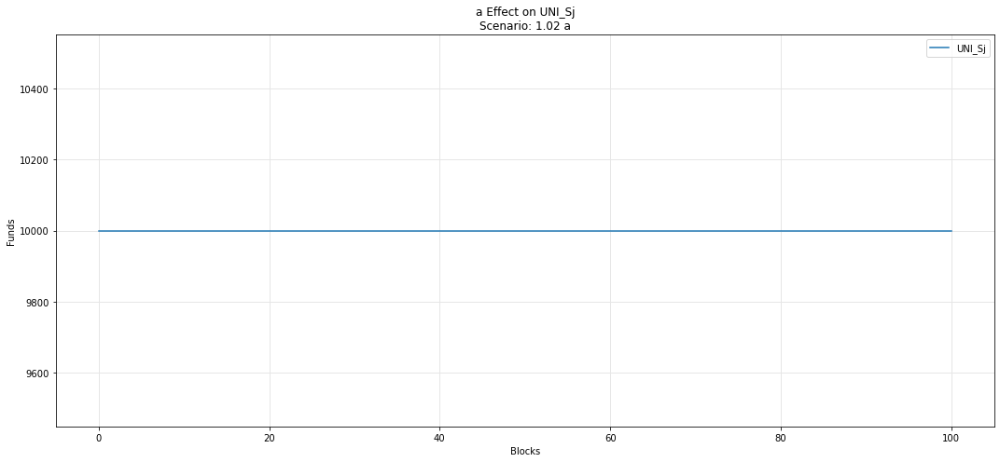

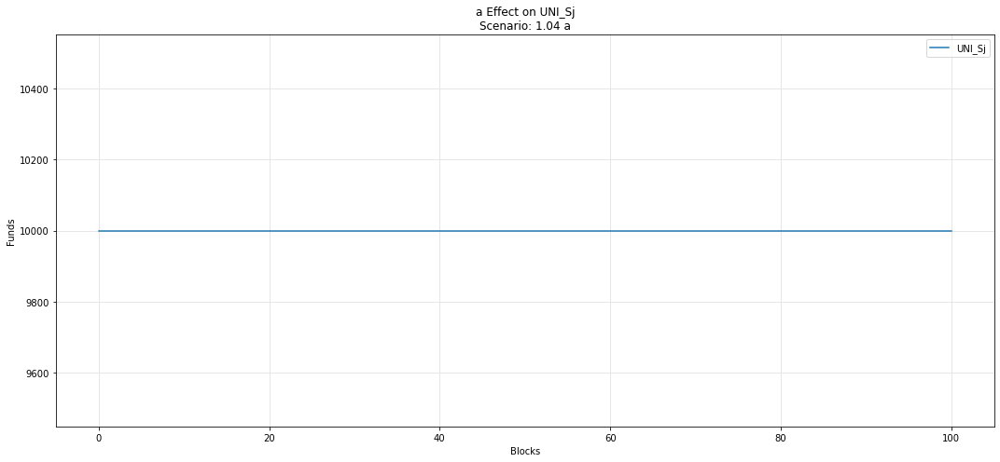

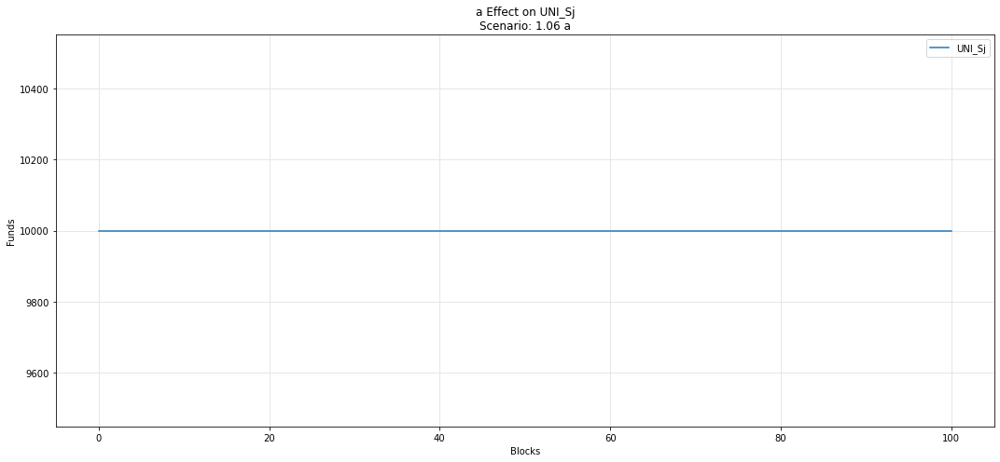

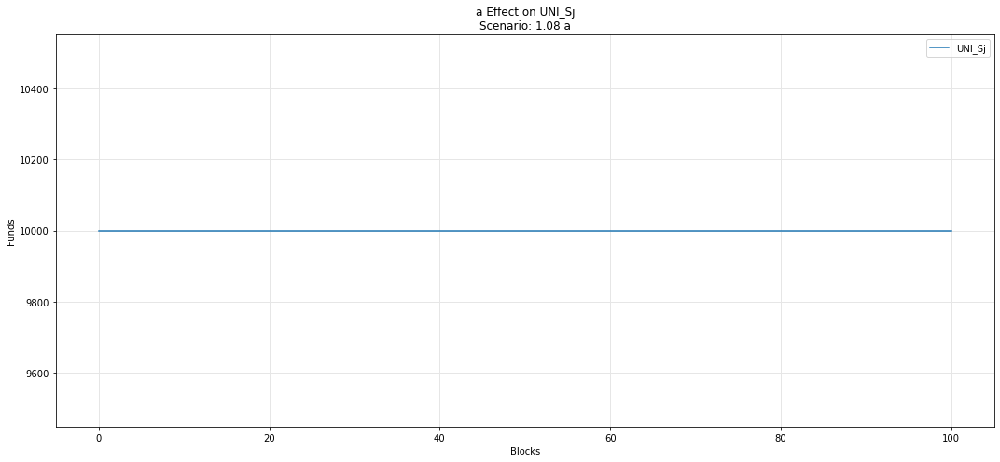

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

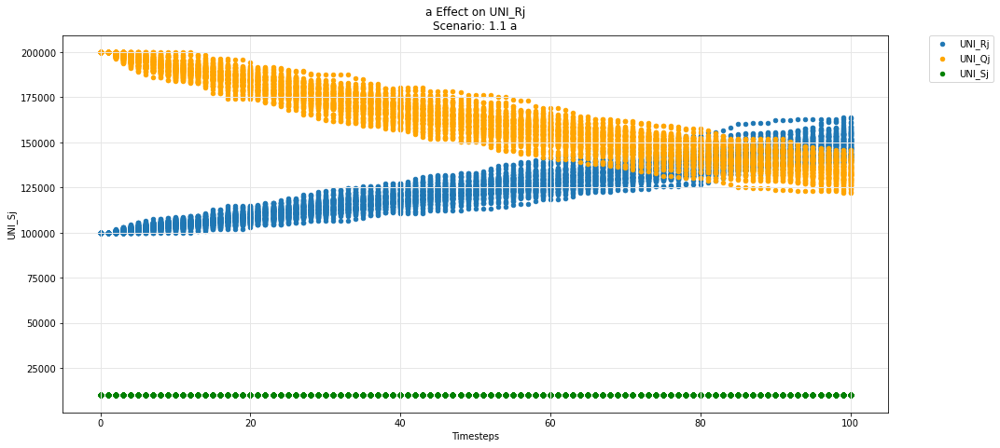

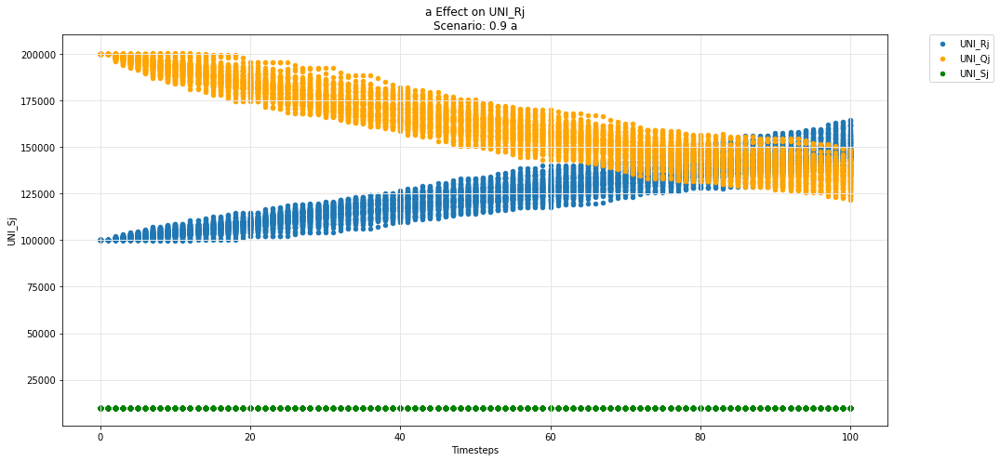

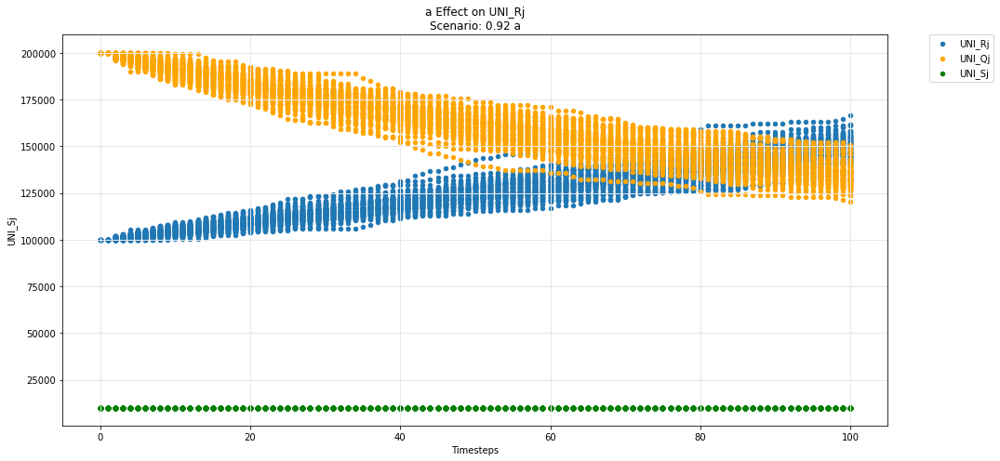

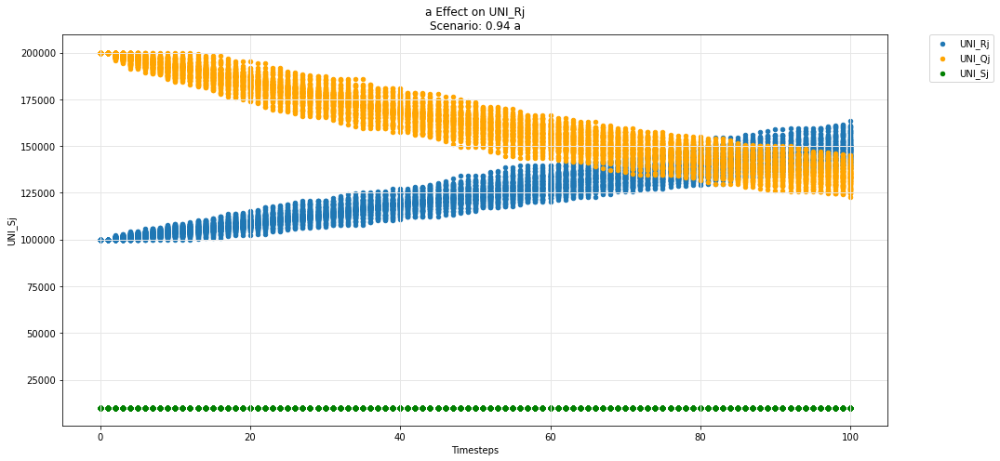

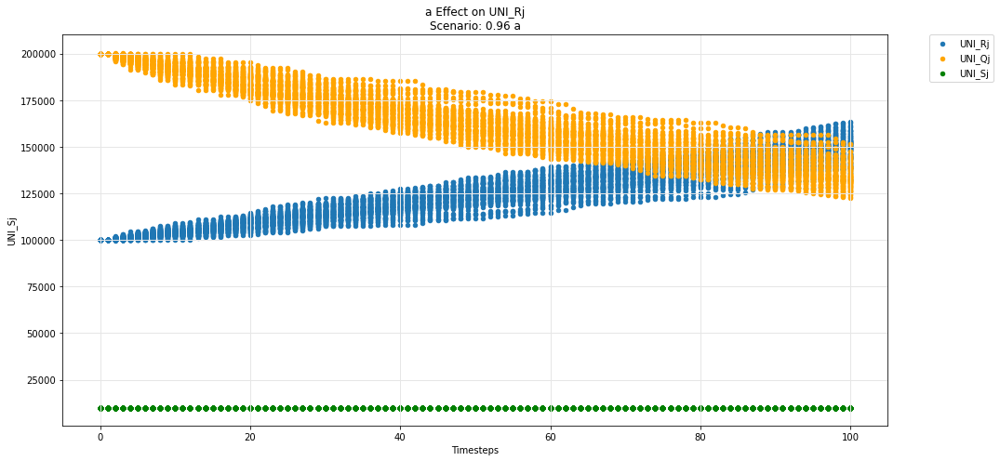

...

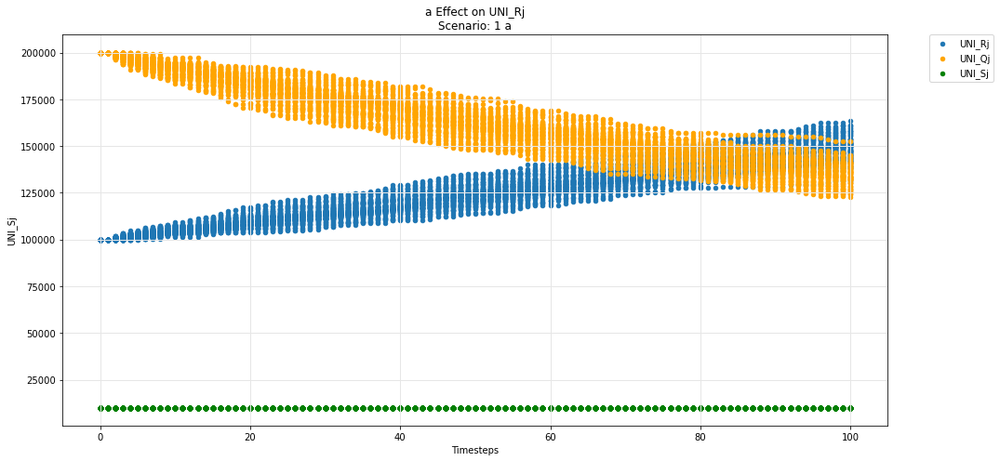

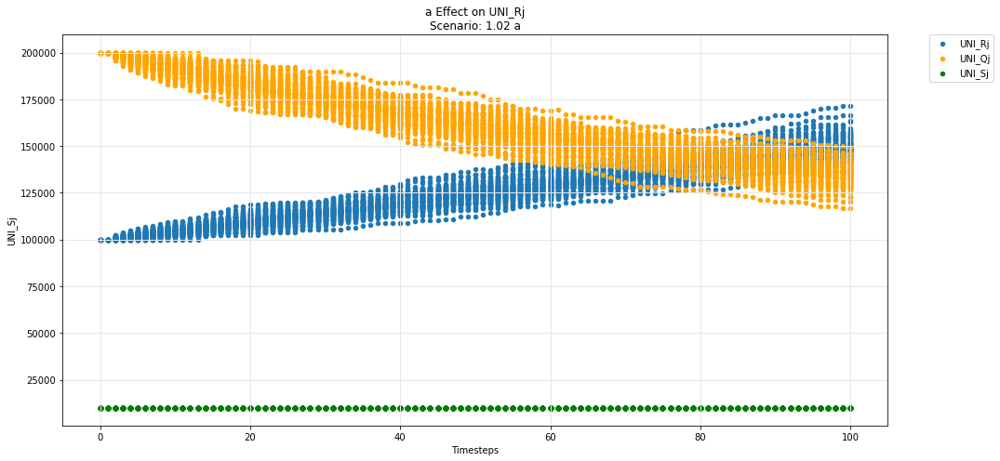

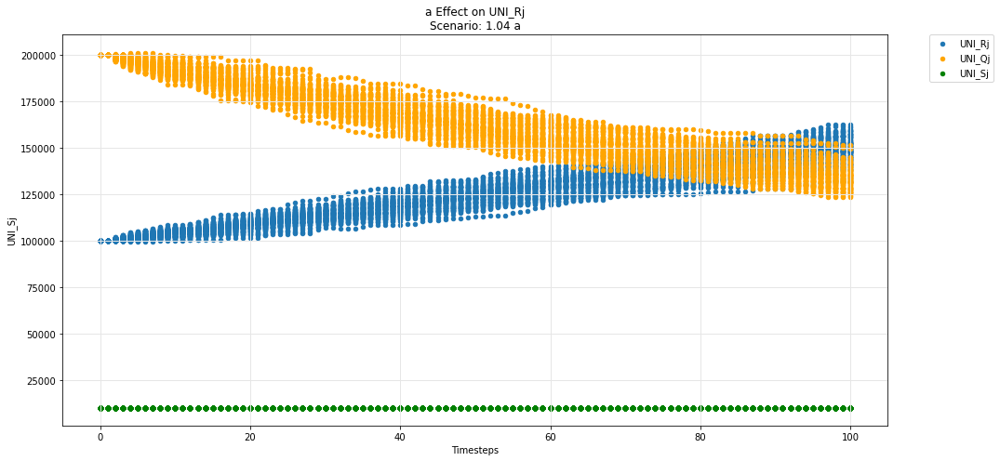

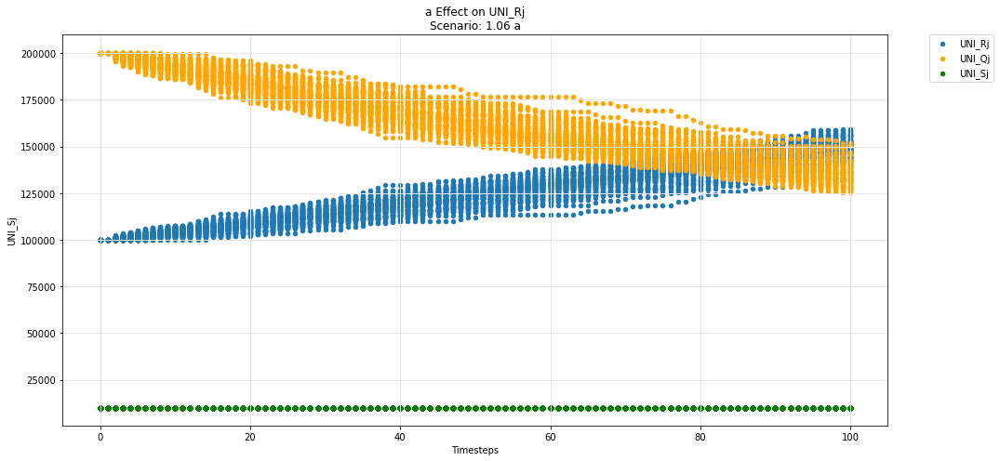

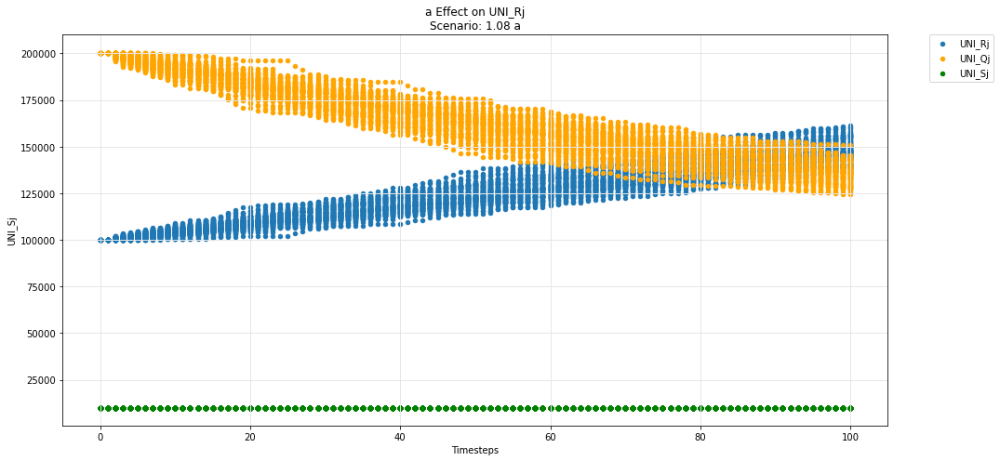

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

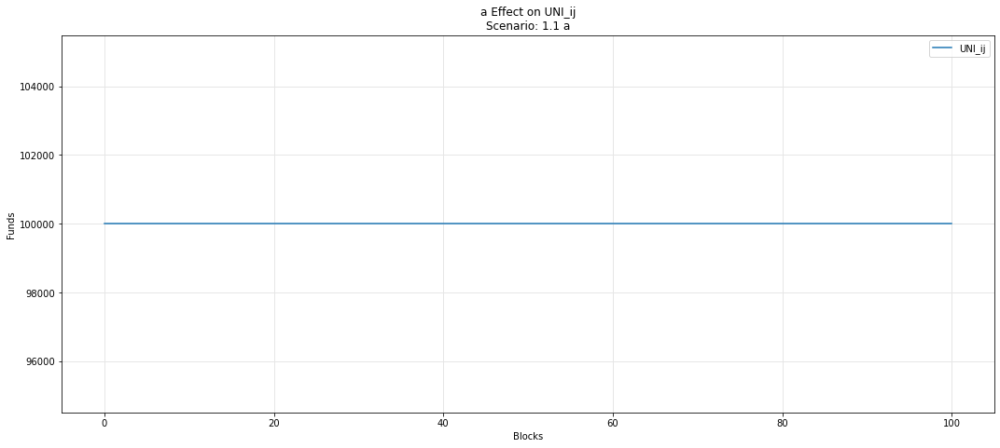

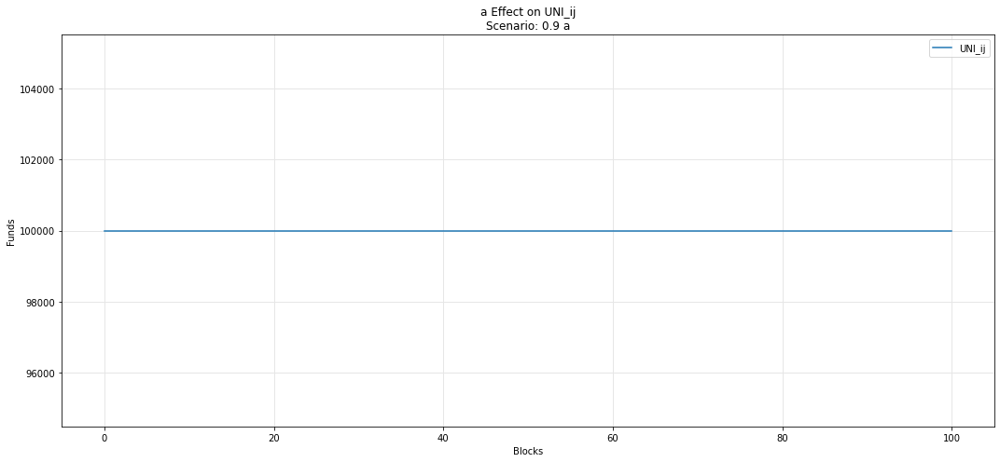

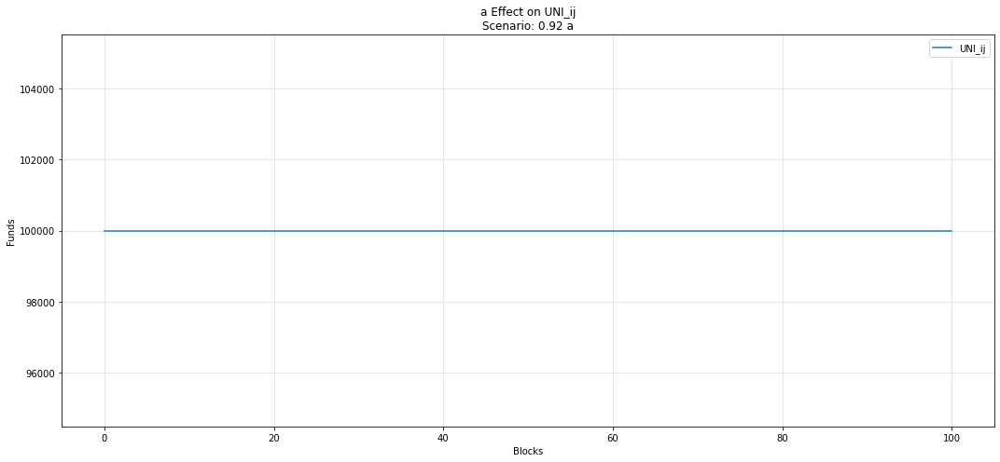

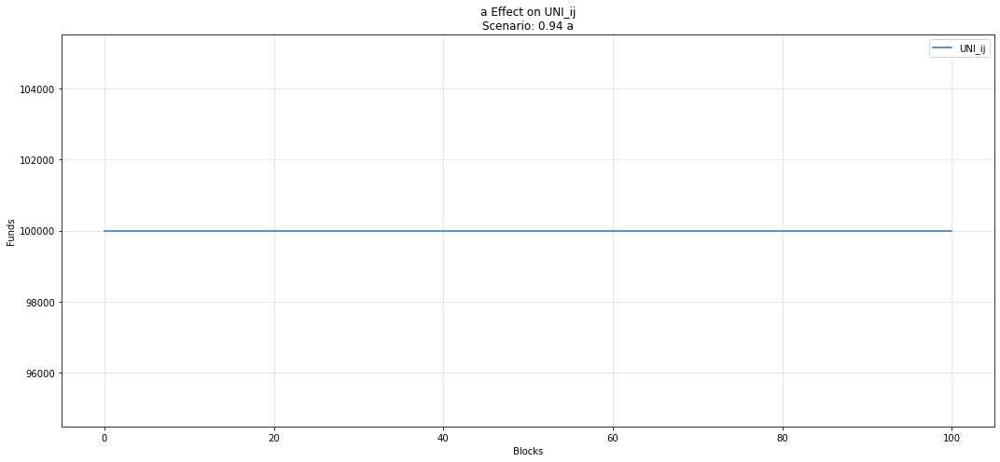

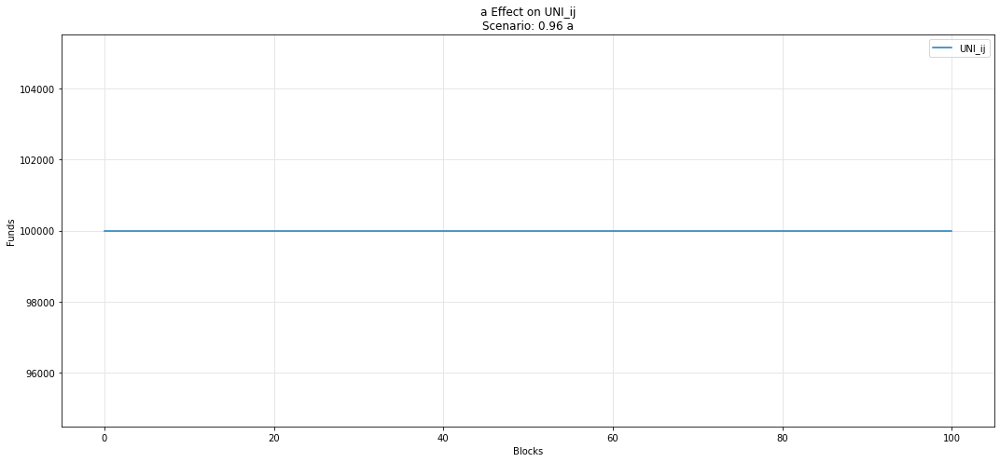

...

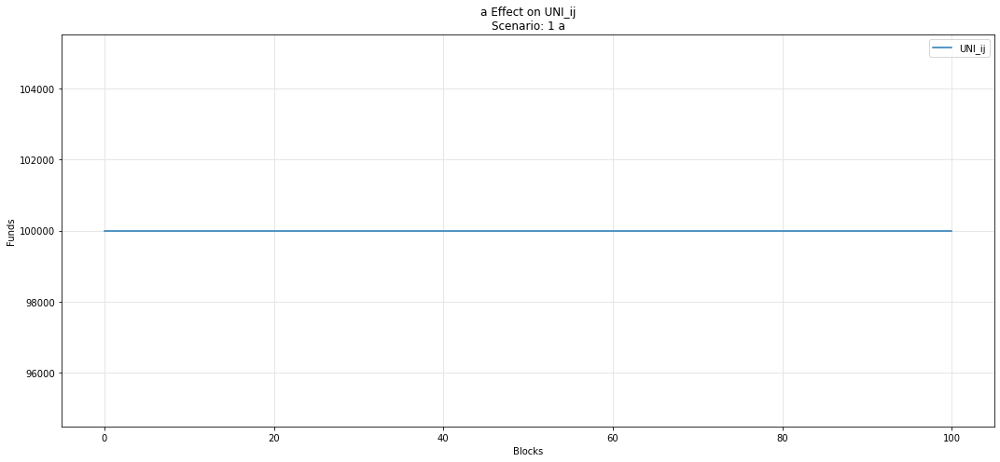

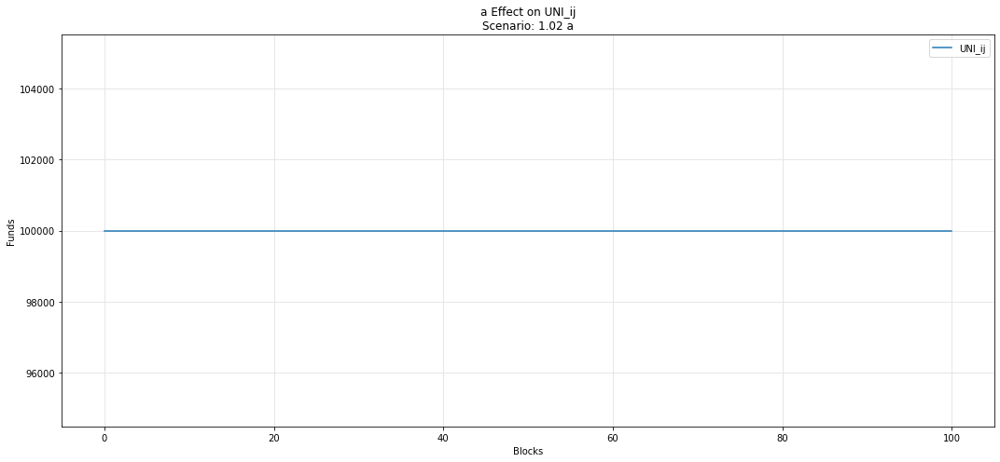

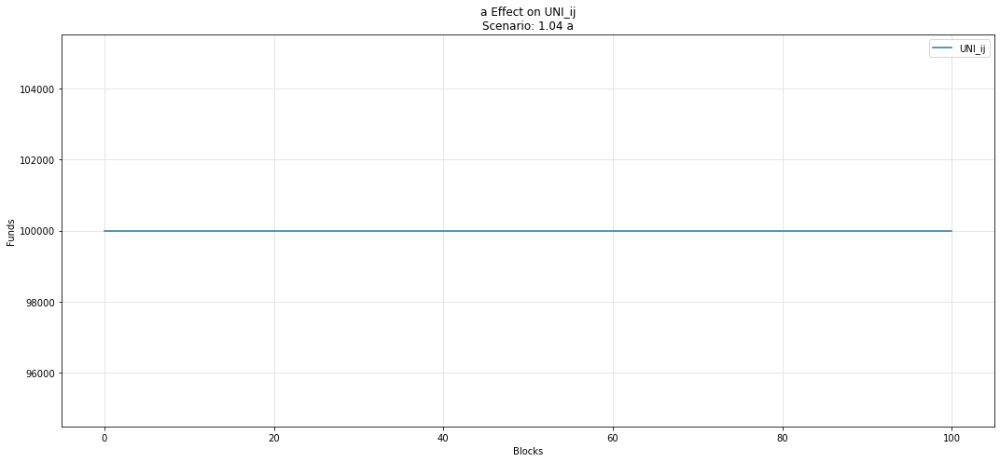

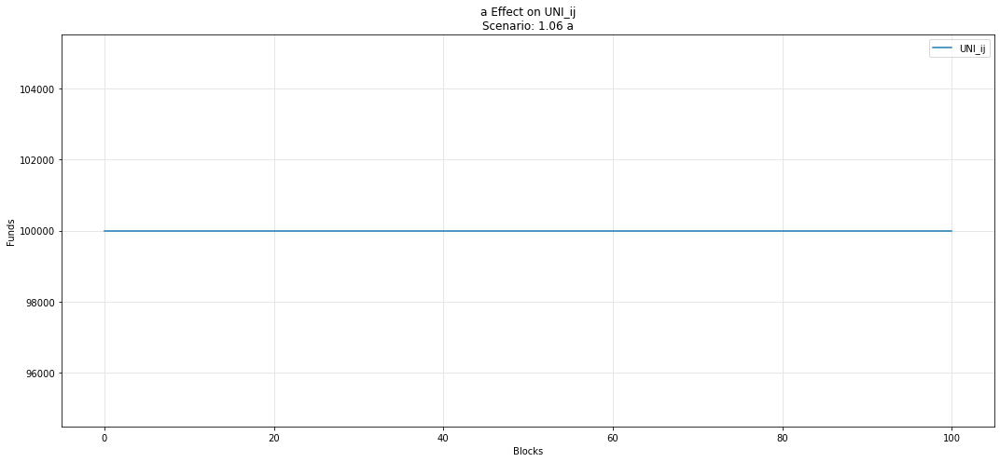

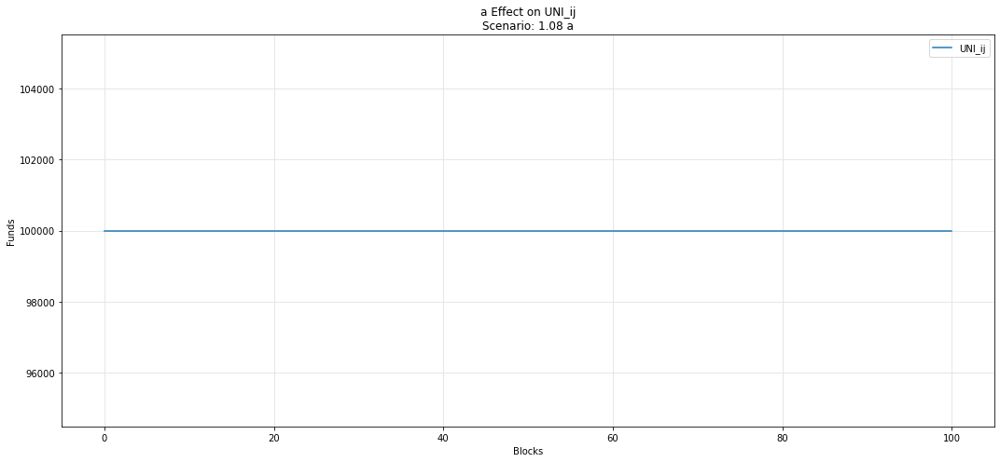

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

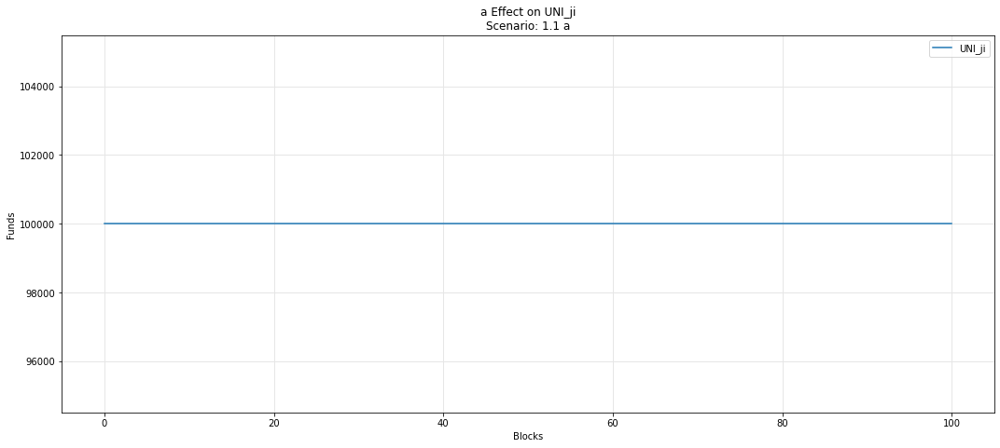

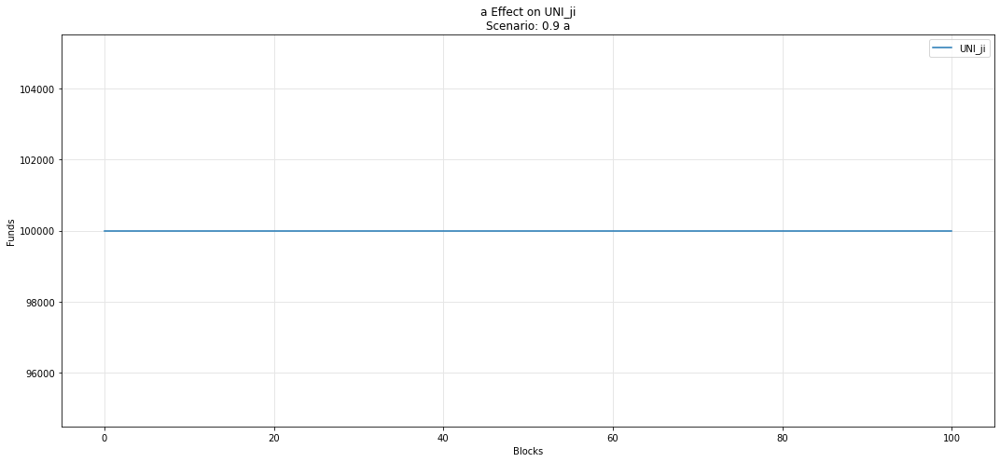

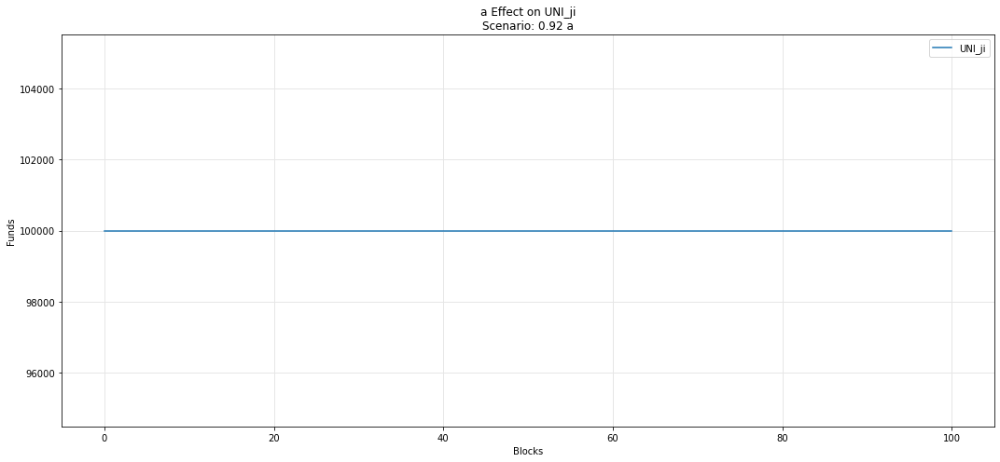

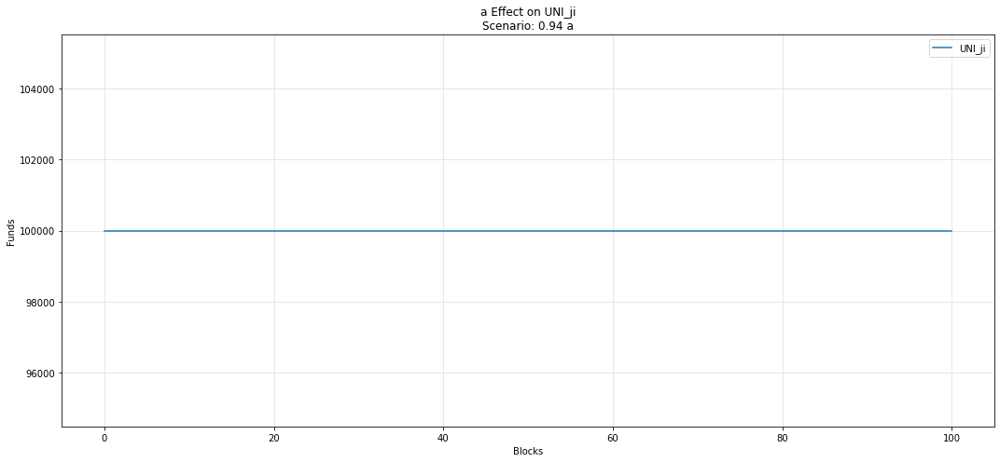

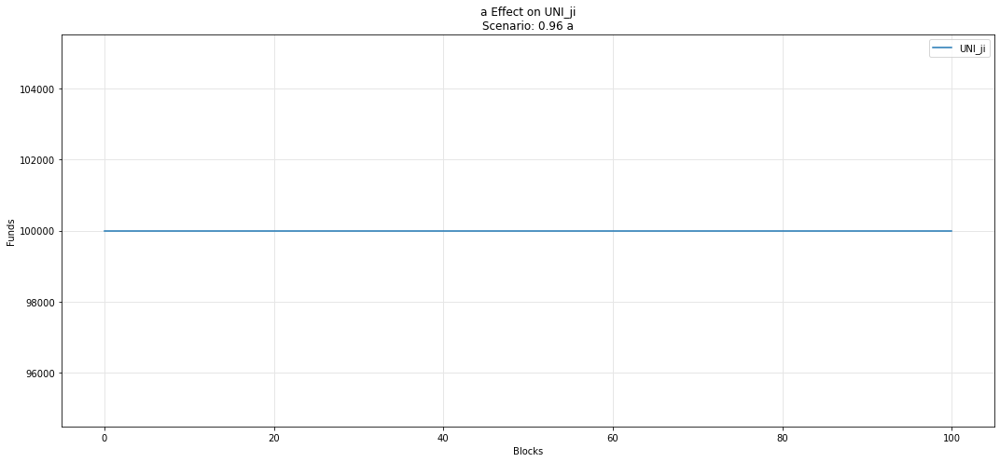

...

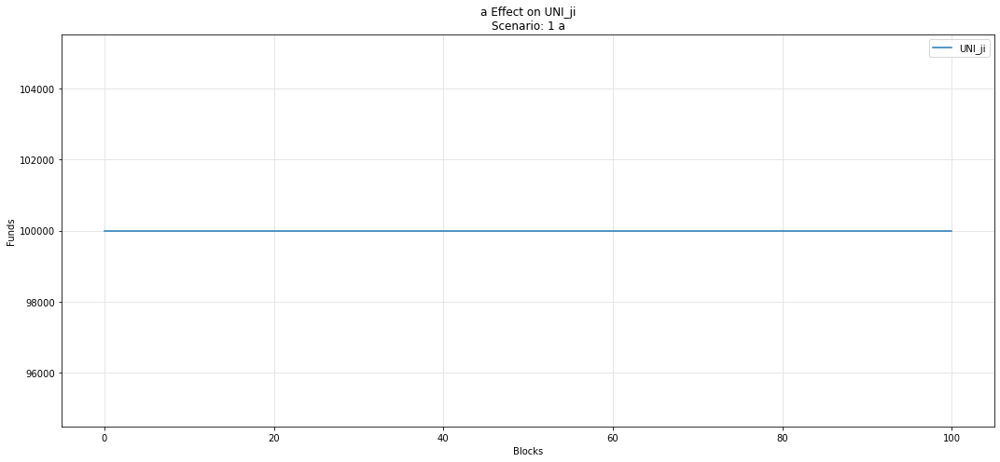

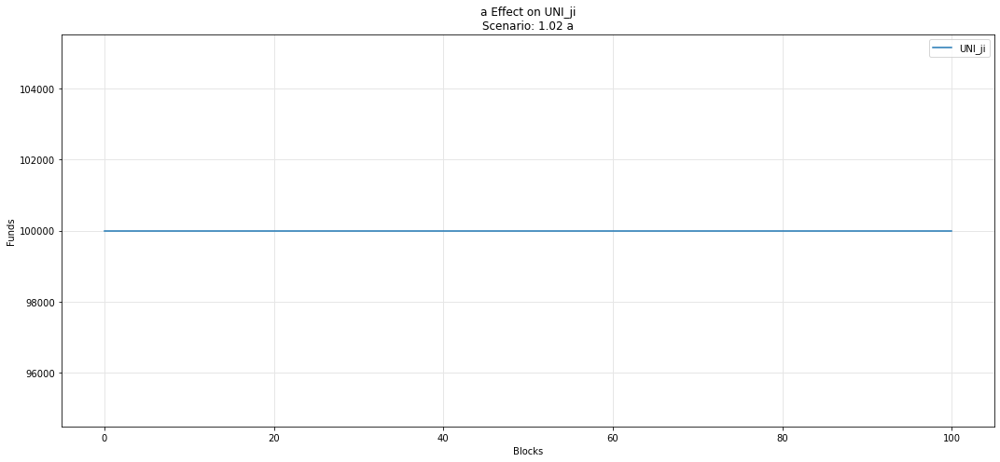

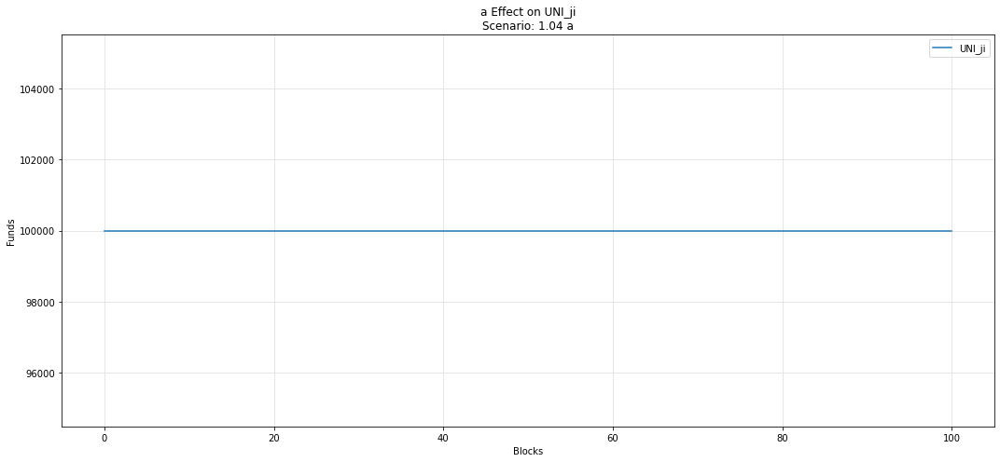

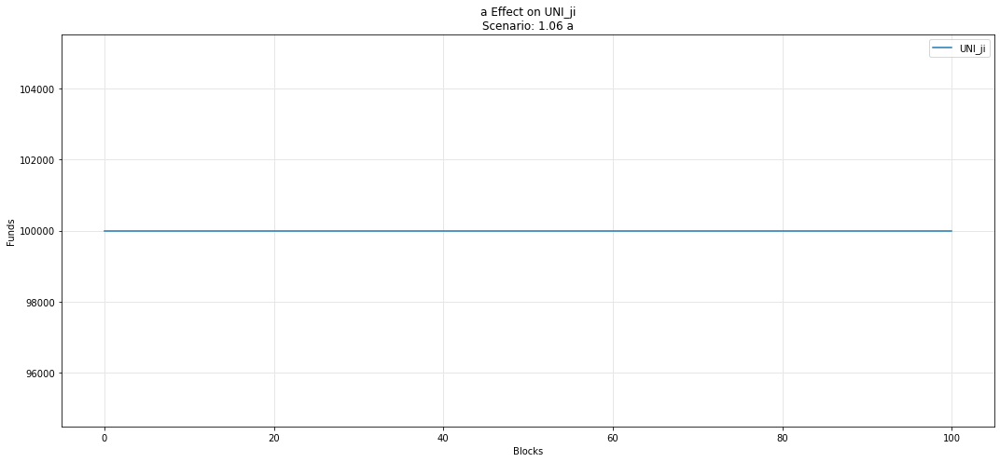

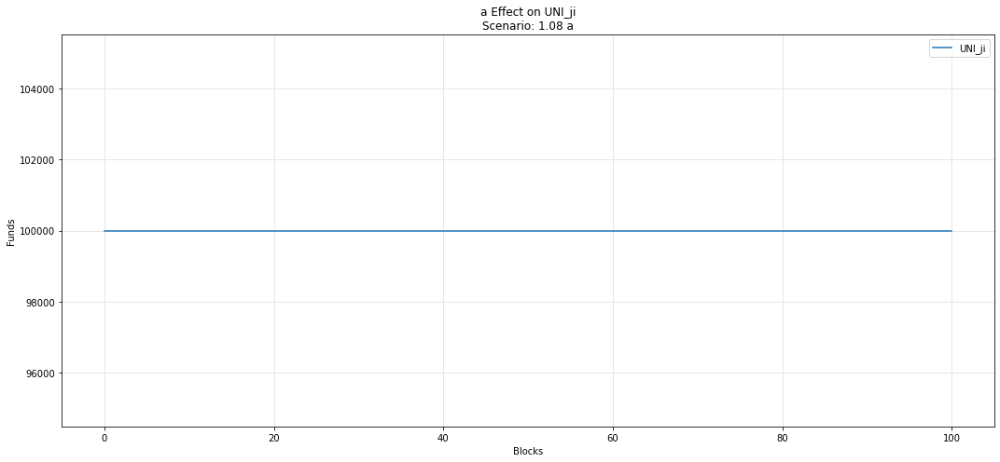

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

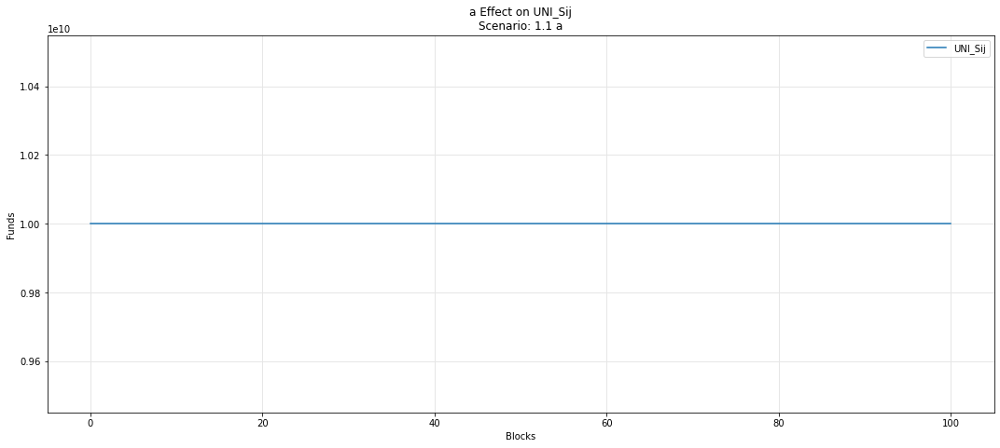

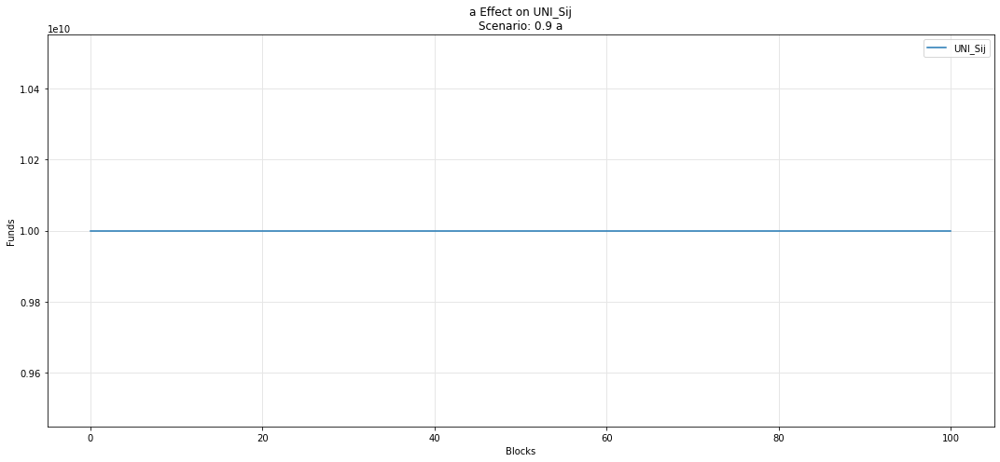

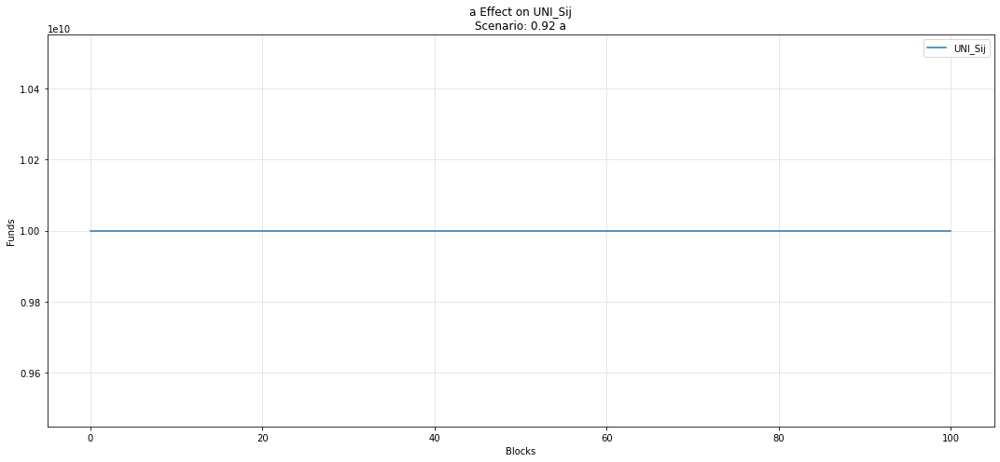

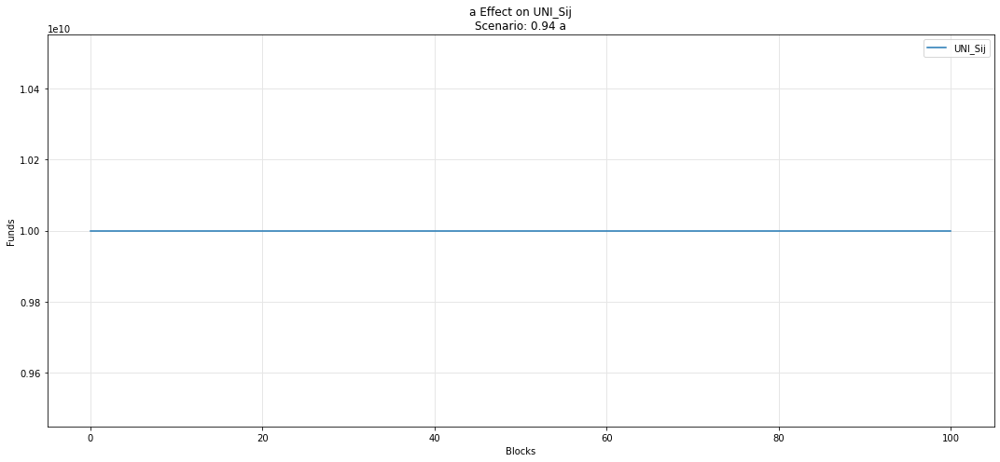

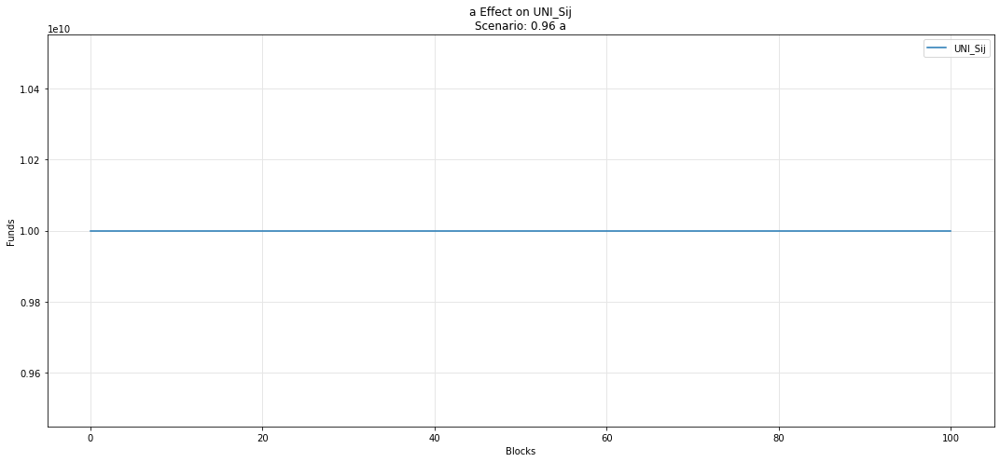

...

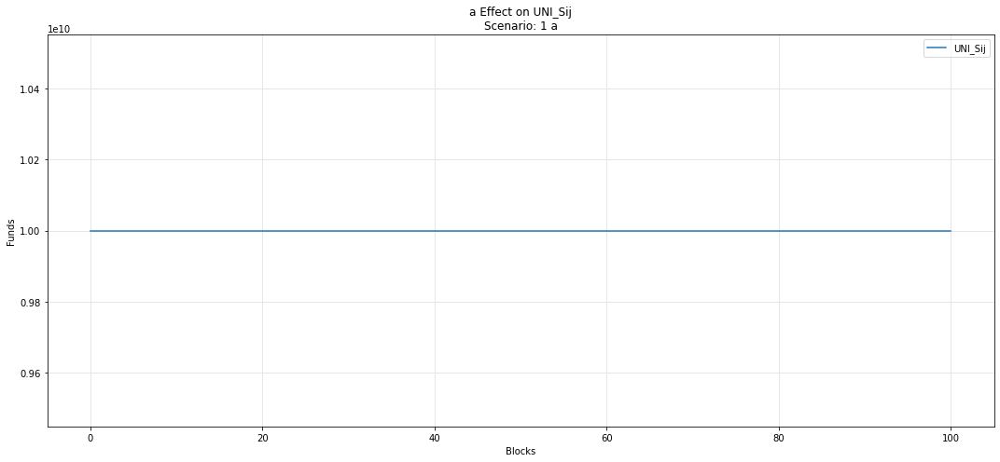

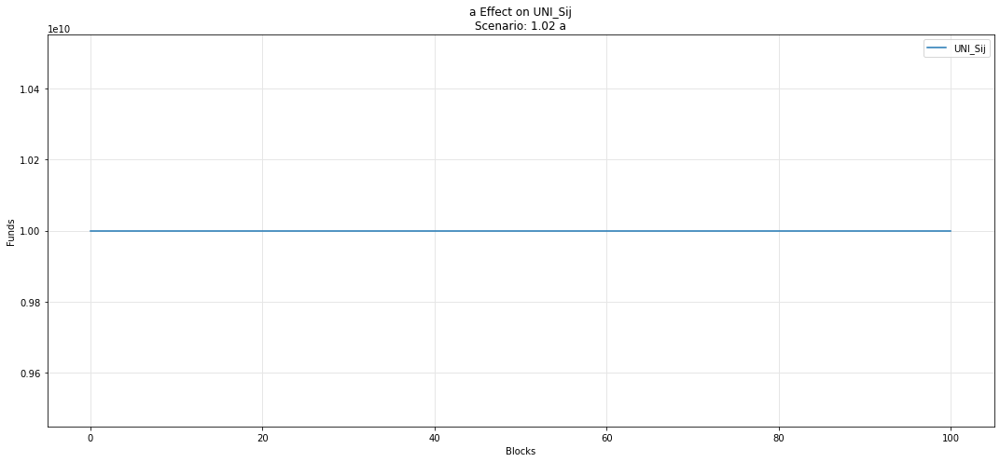

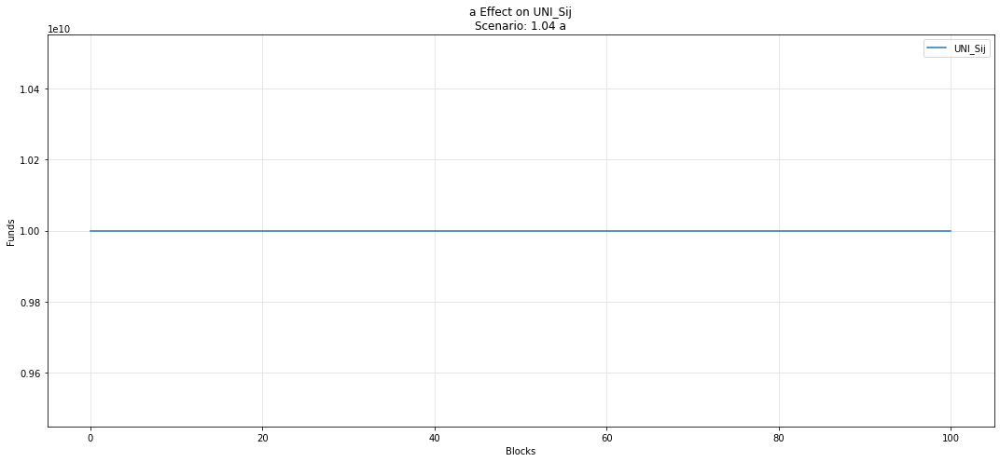

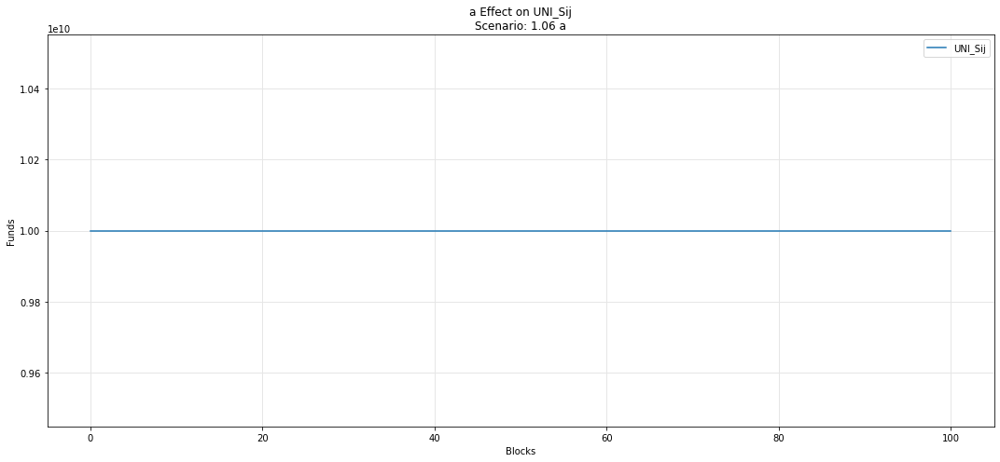

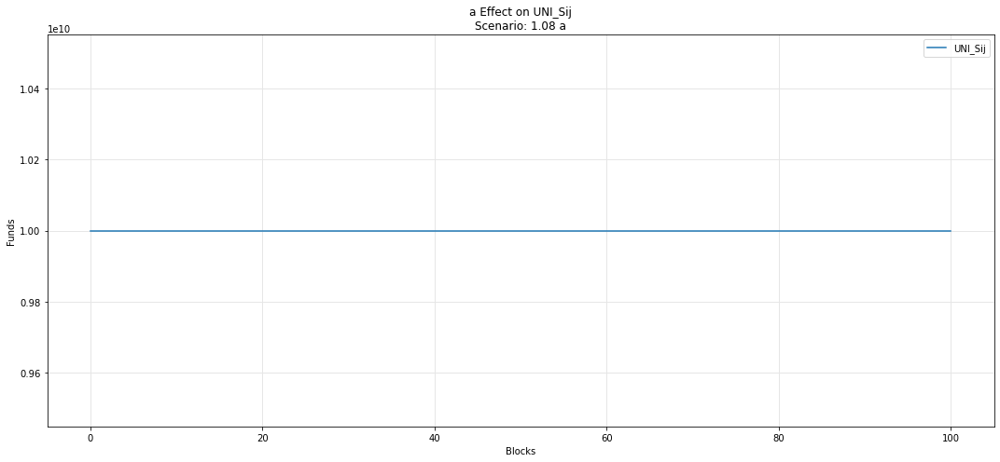

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

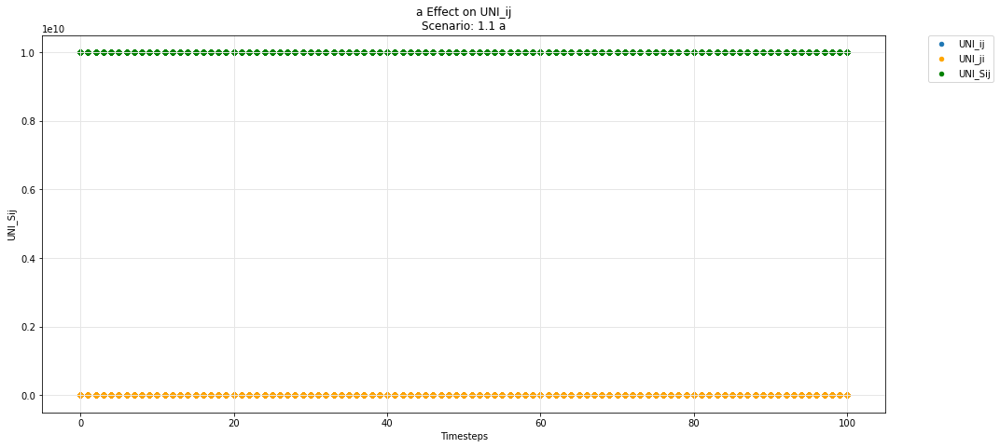

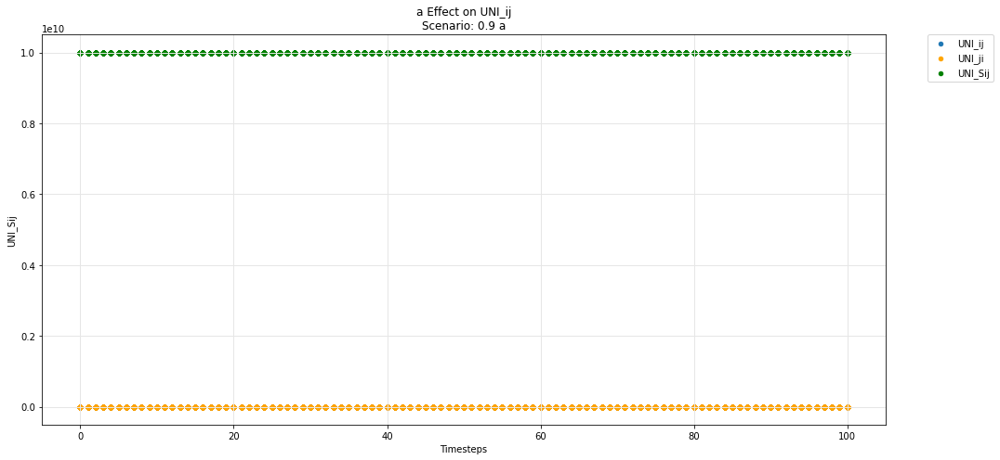

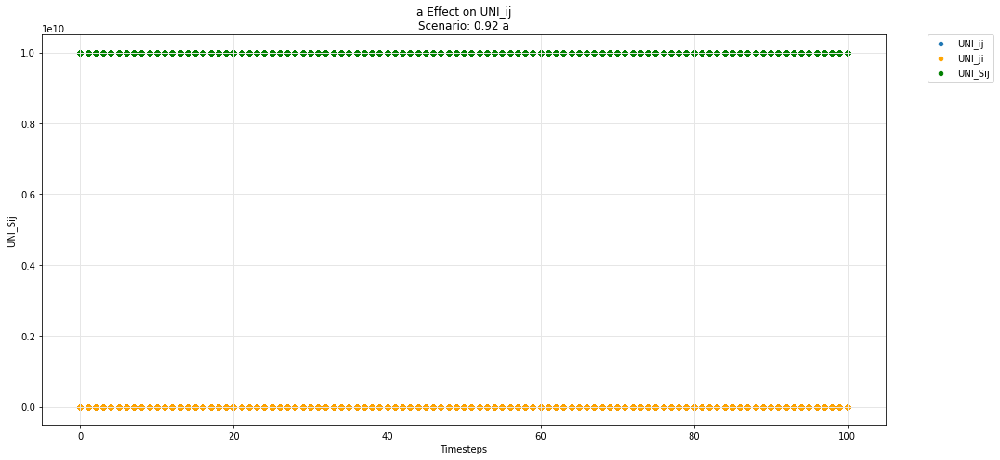

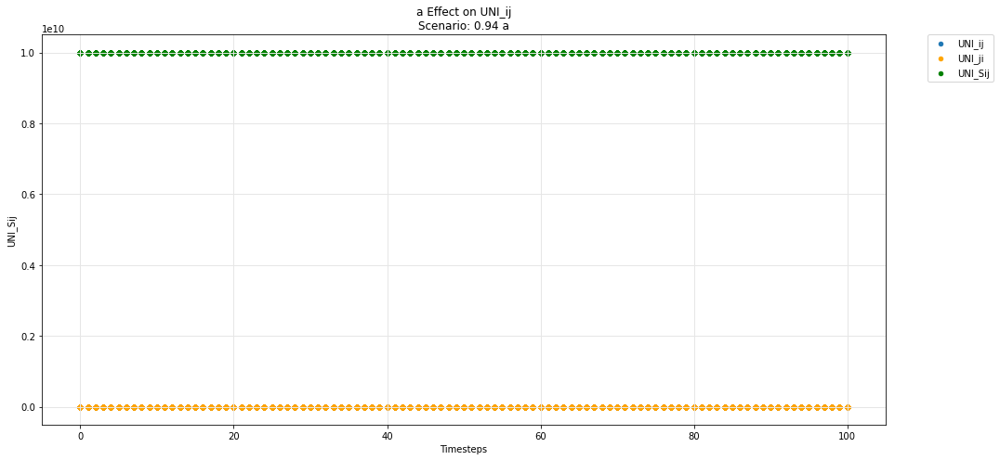

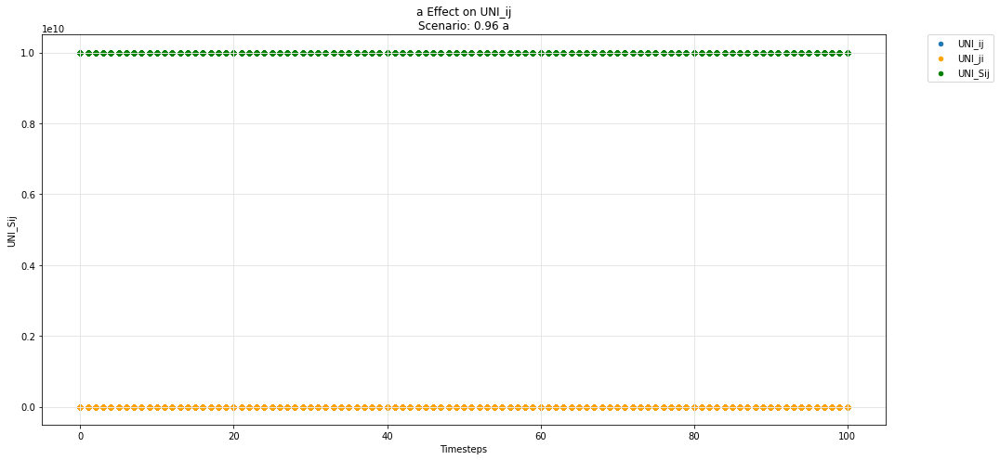

...

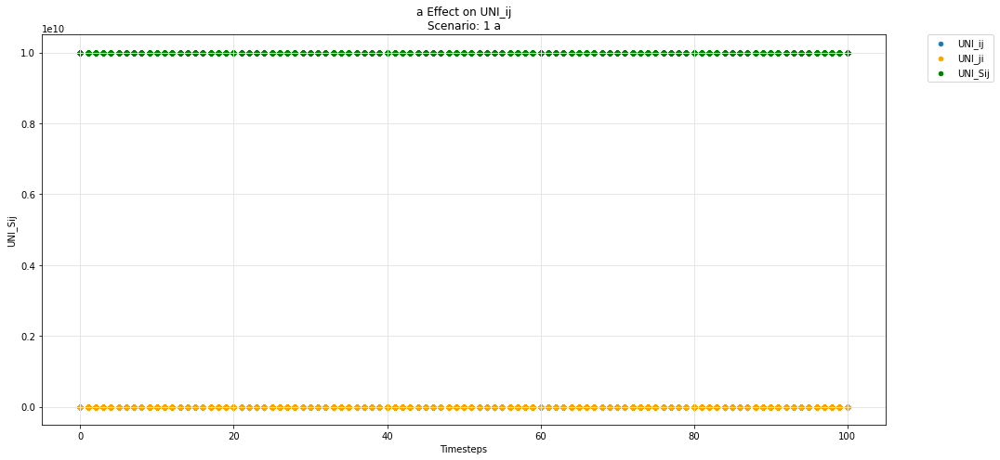

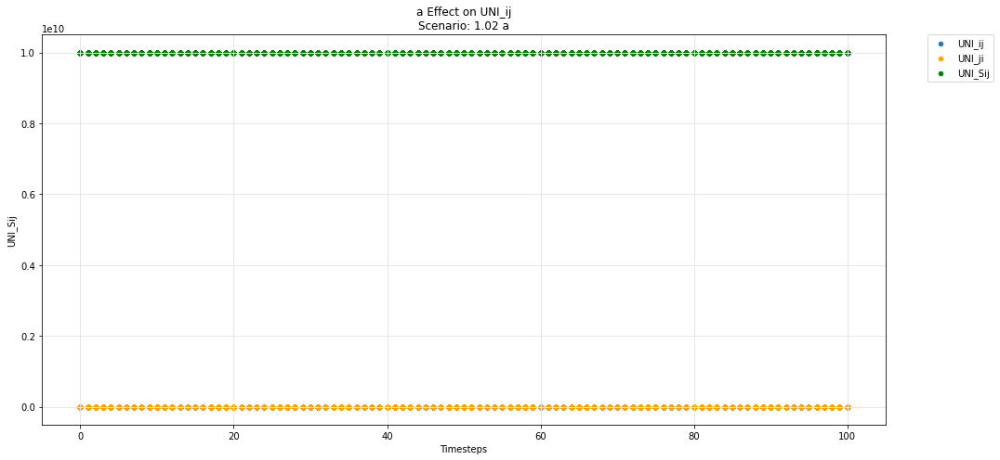

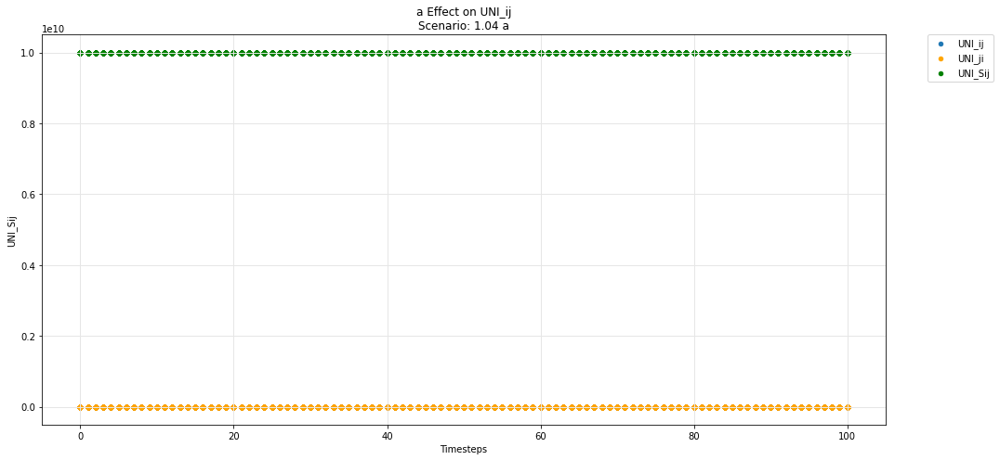

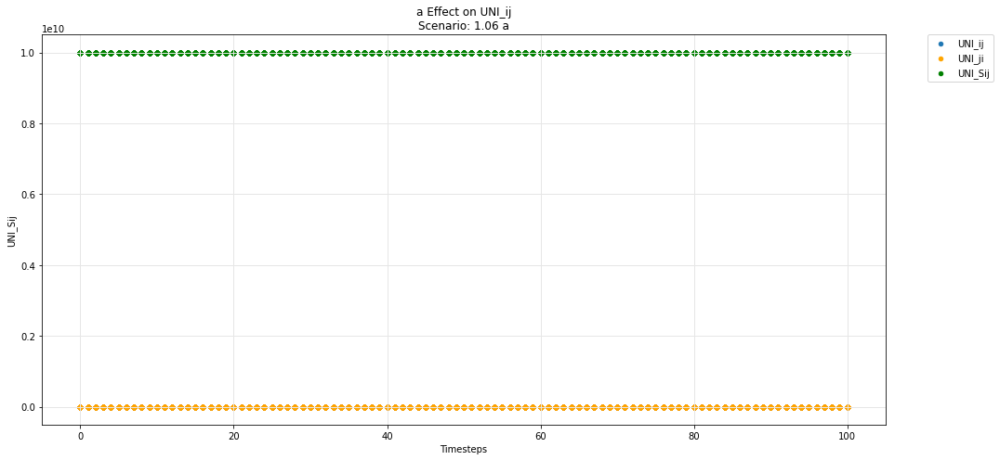

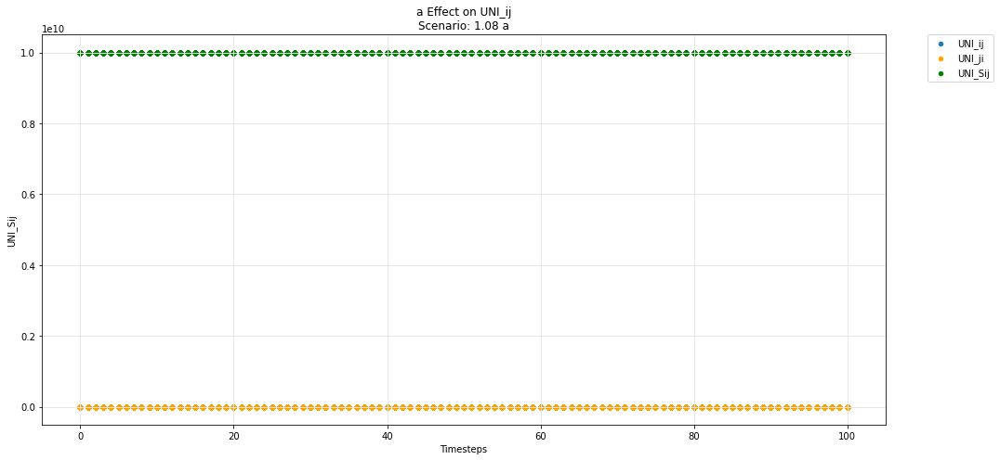

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

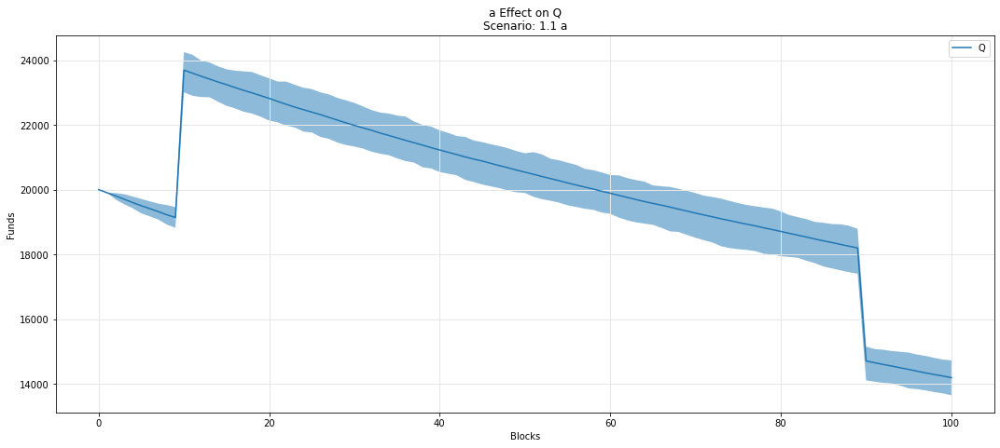

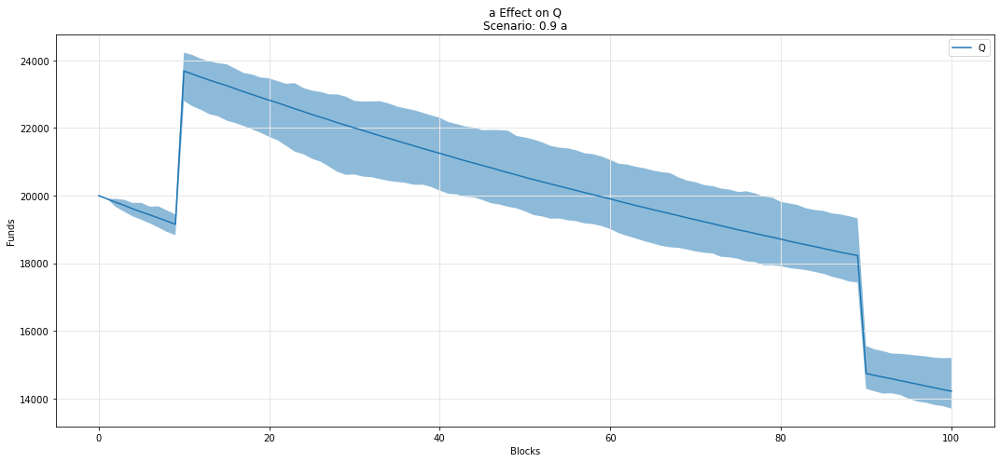

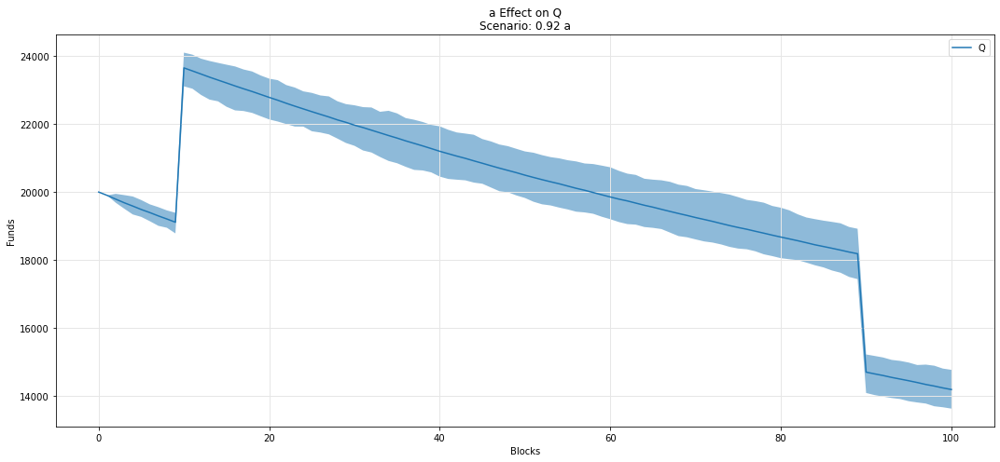

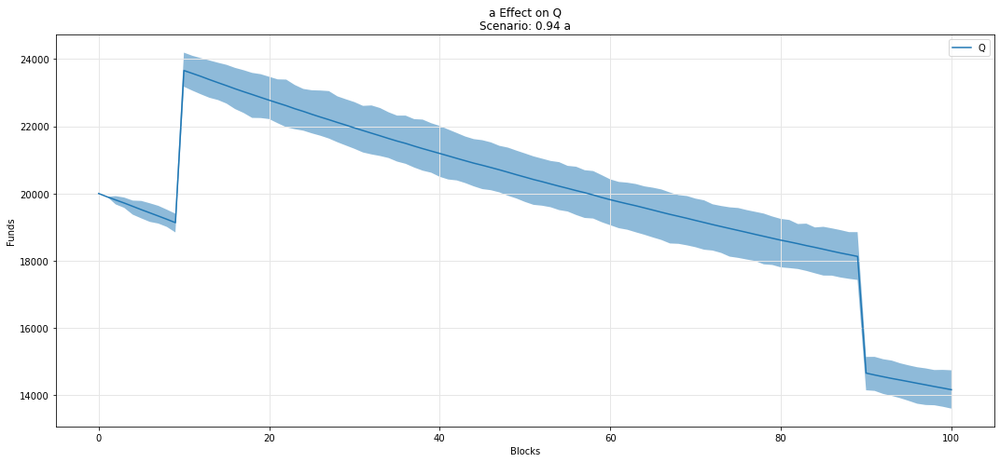

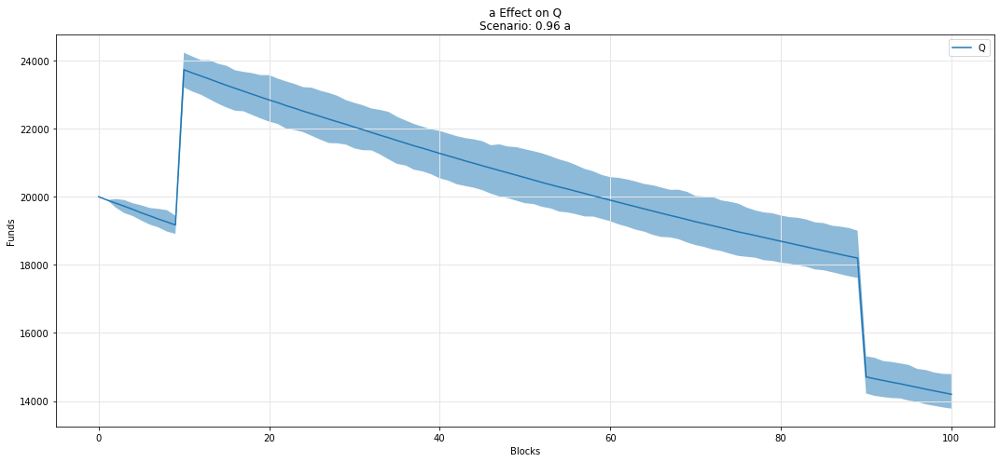

...

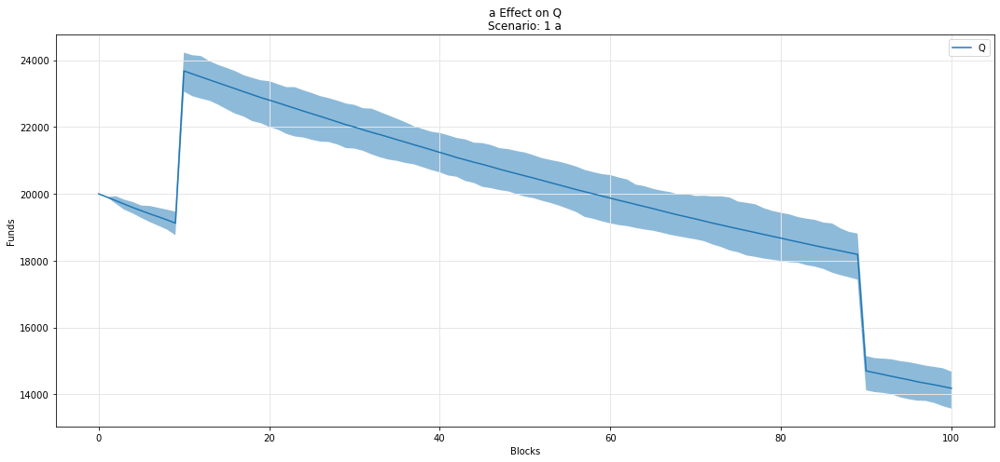

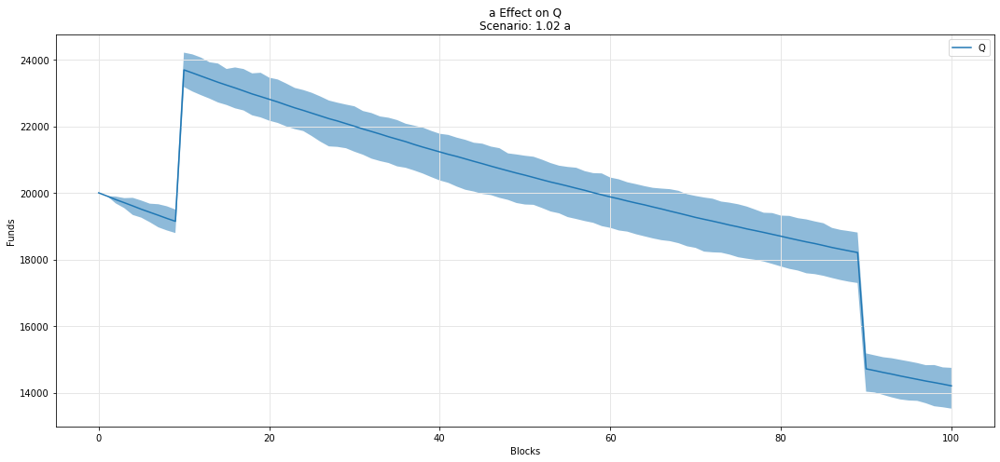

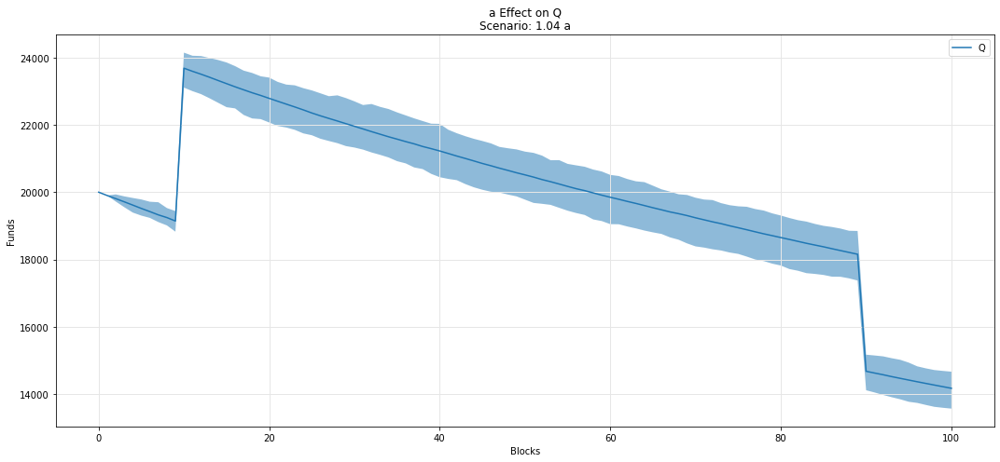

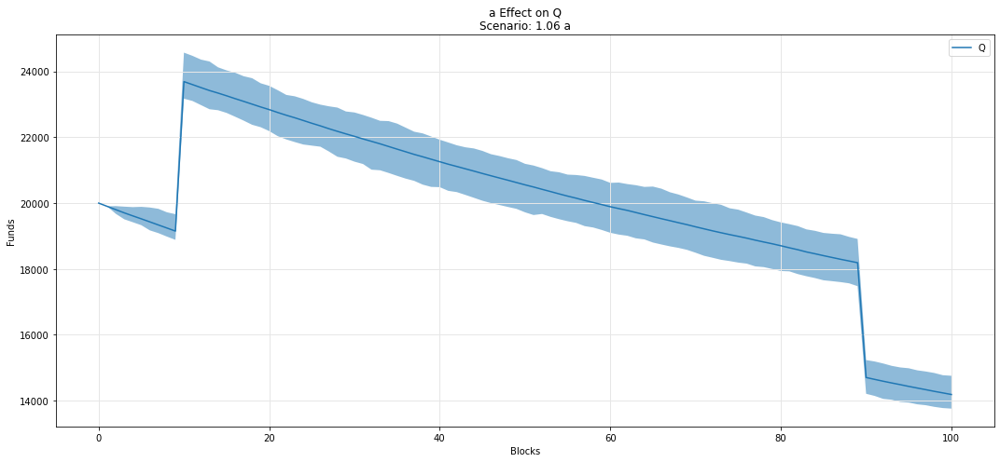

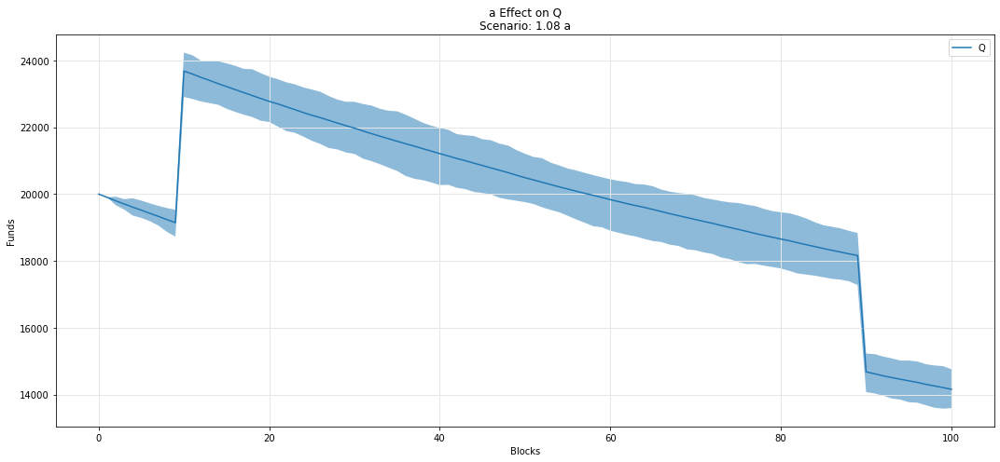

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

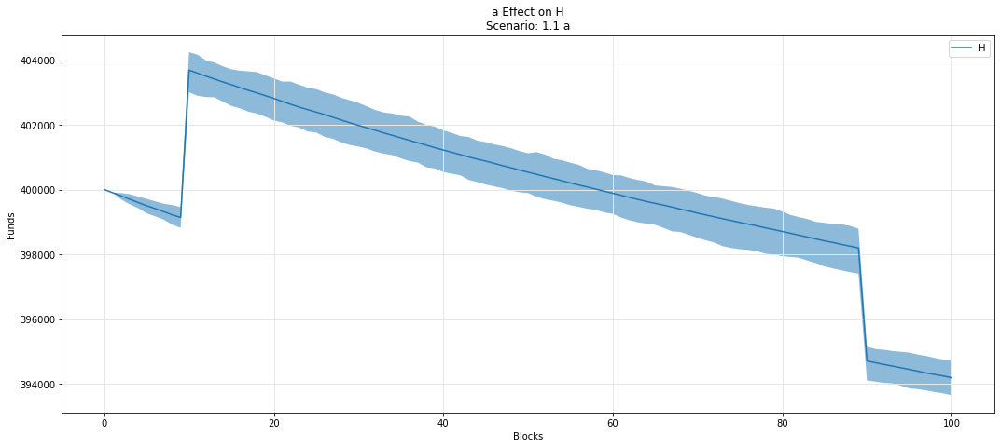

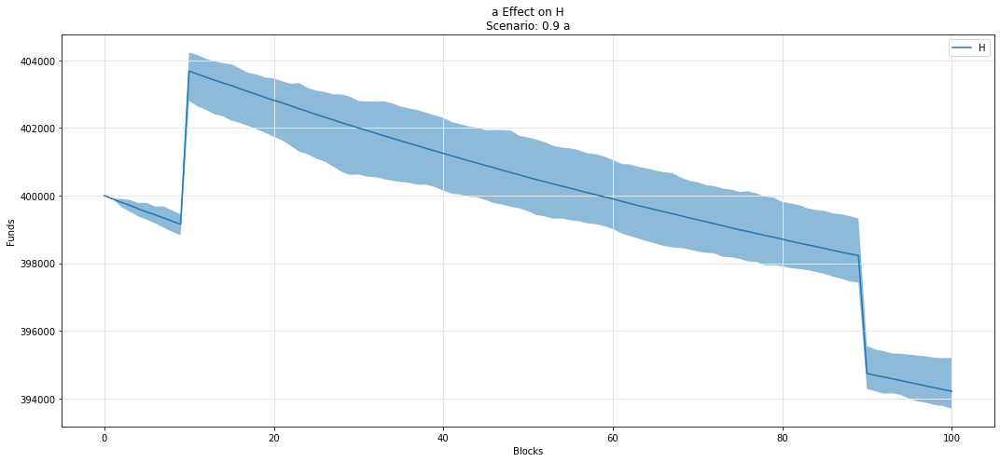

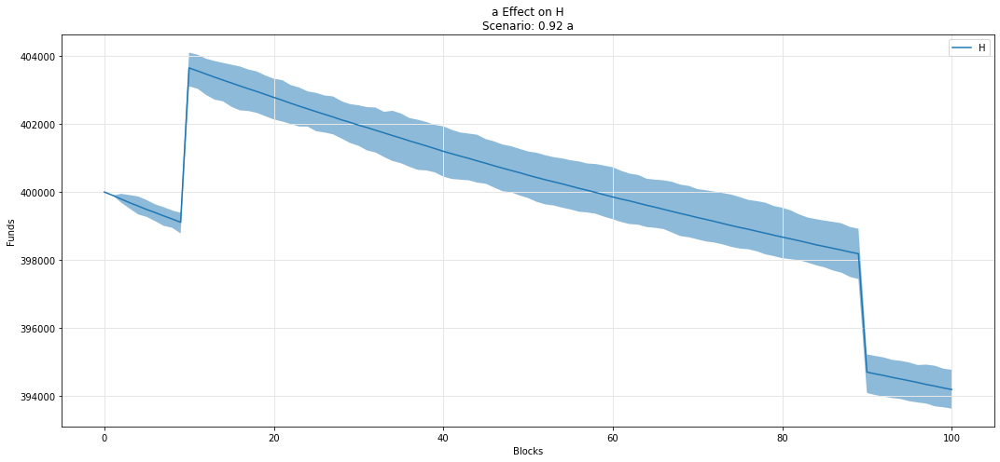

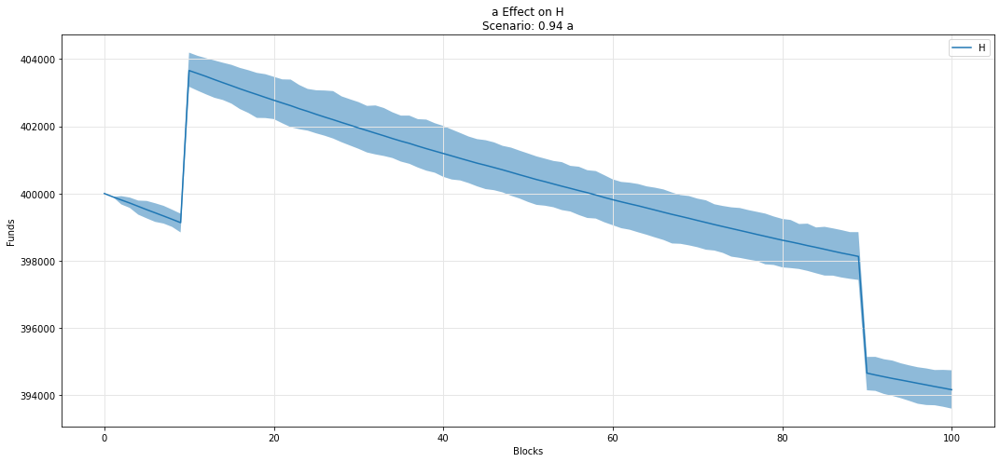

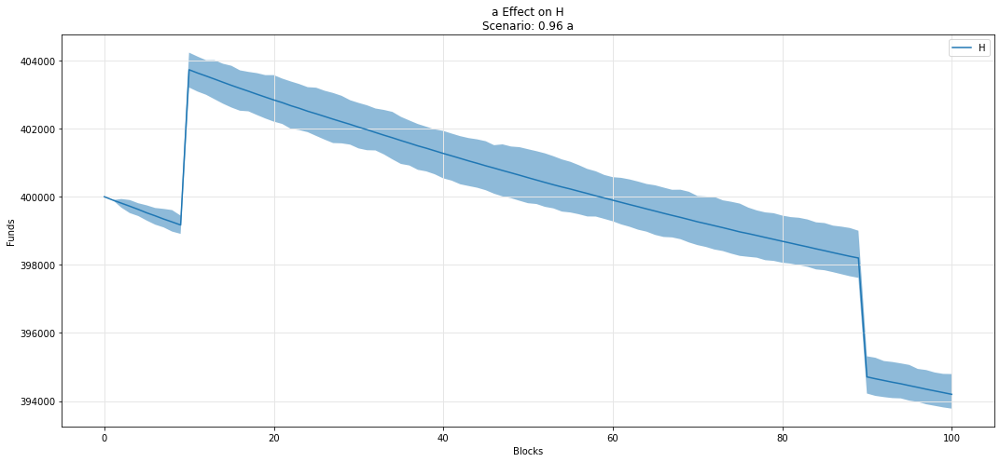

...

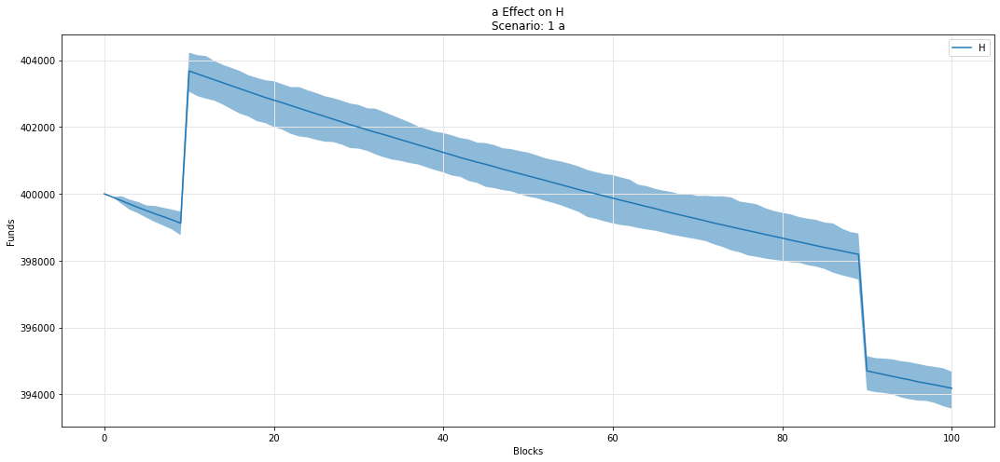

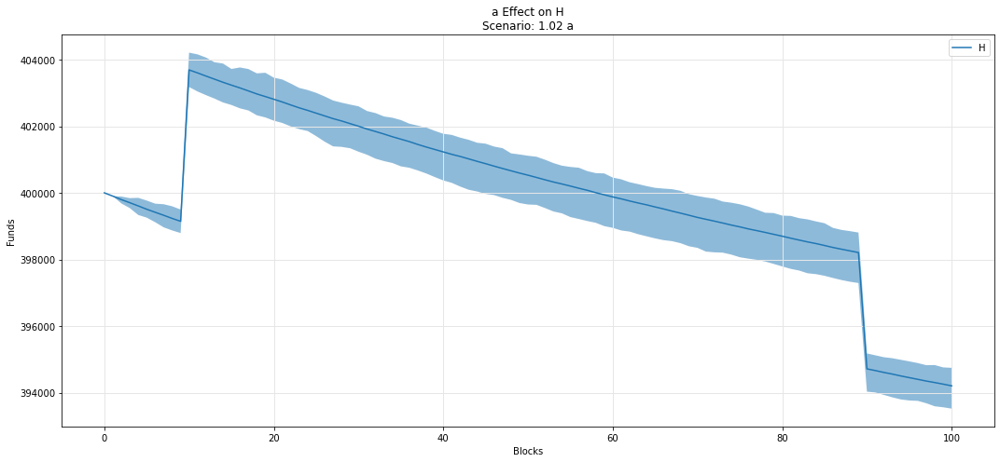

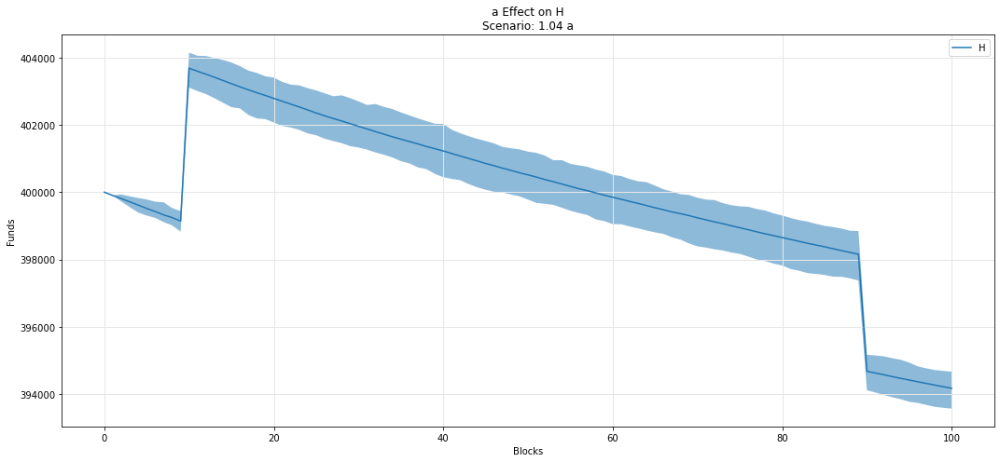

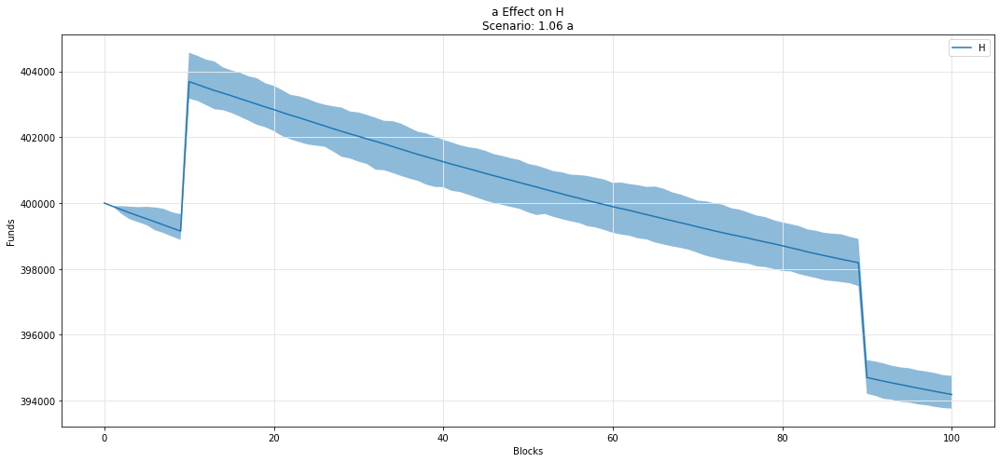

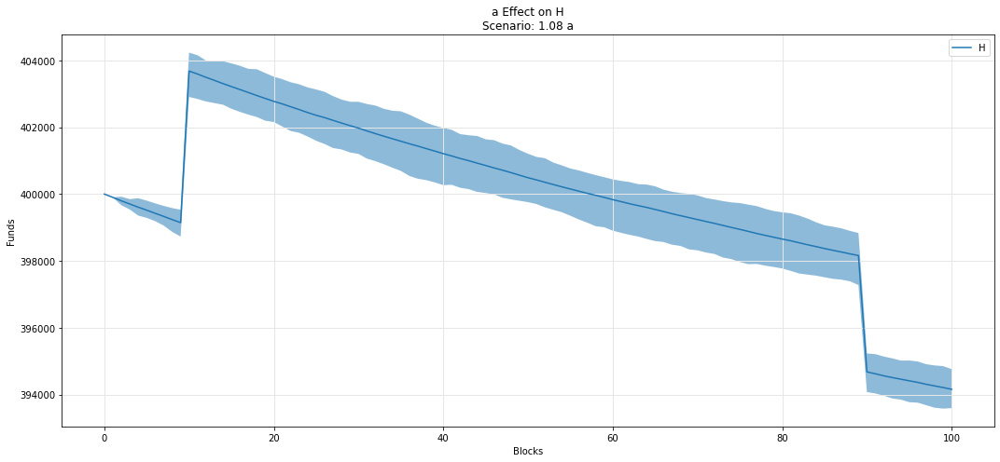

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

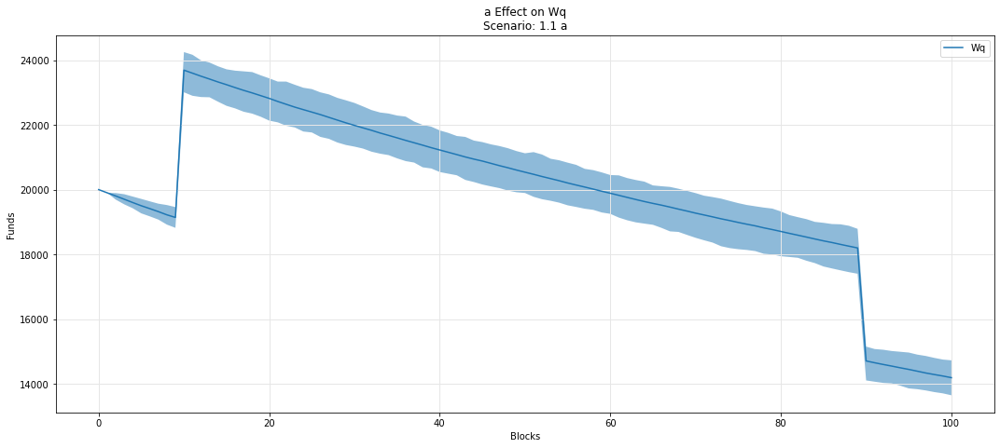

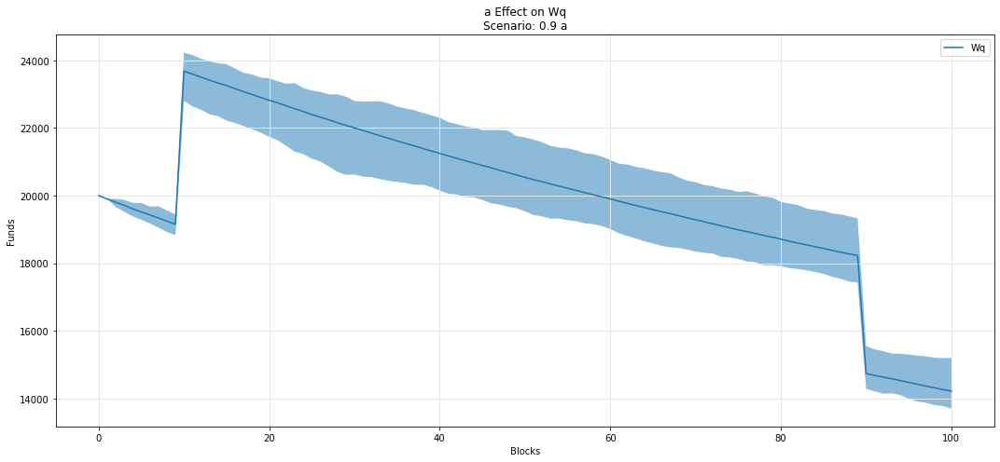

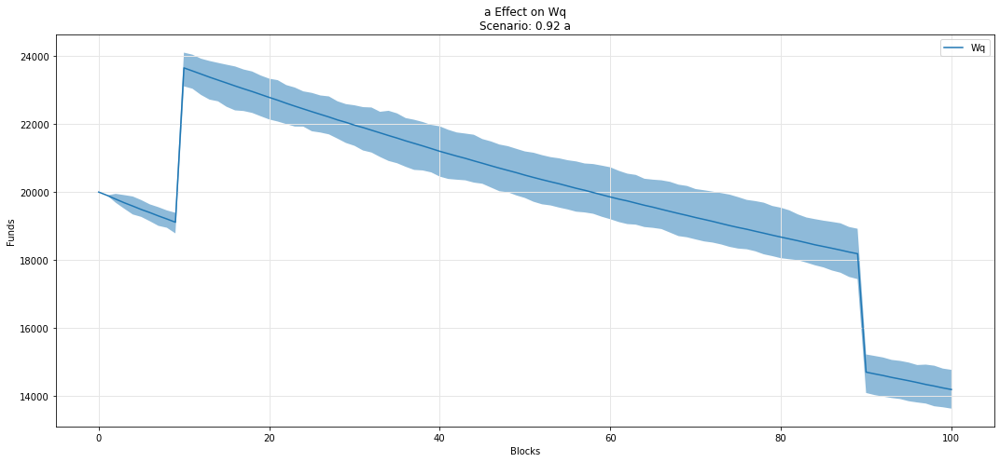

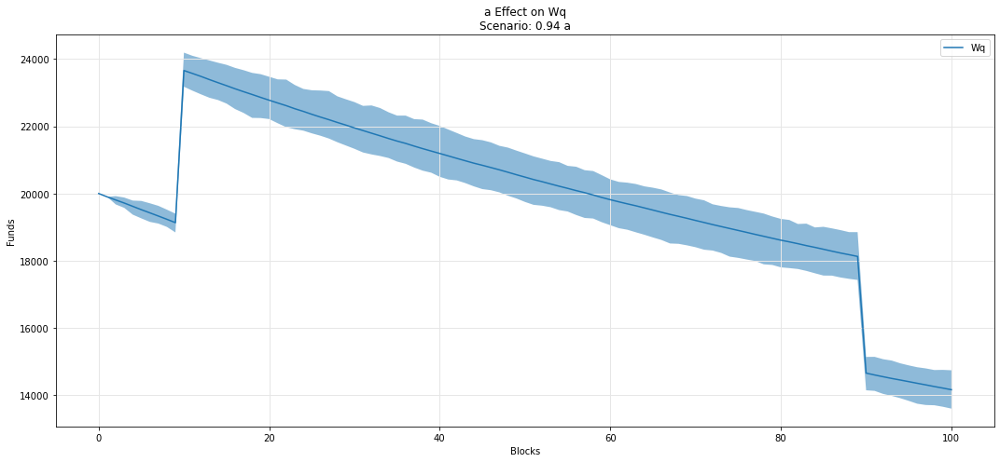

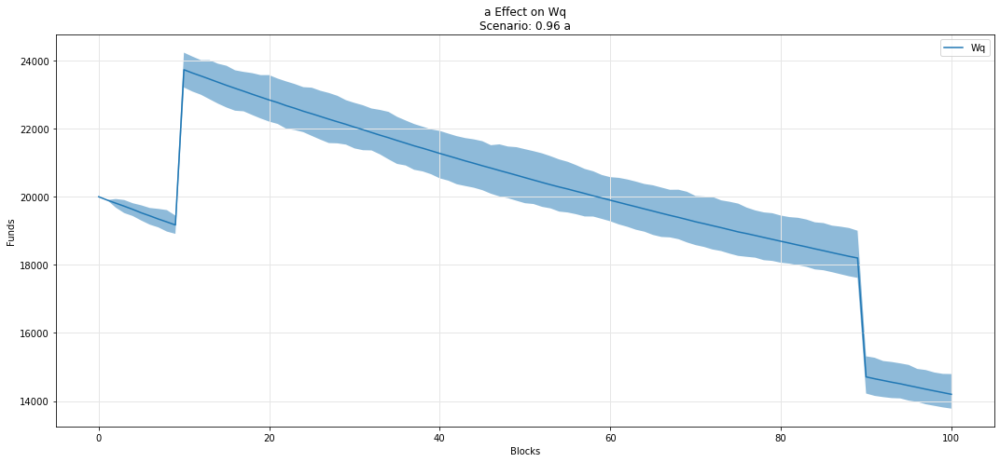

...

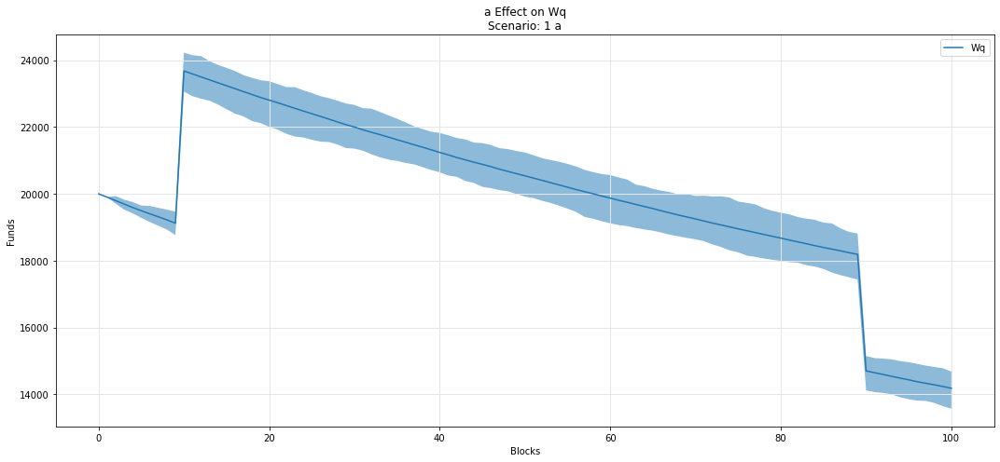

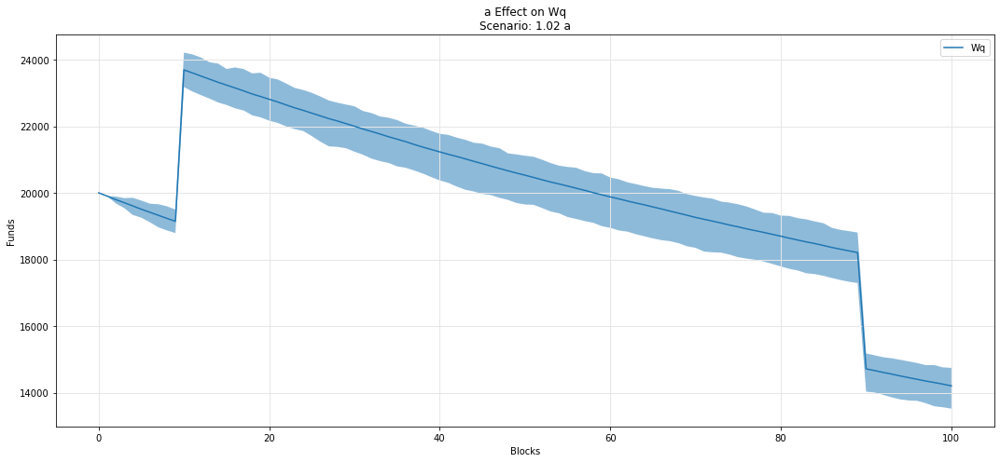

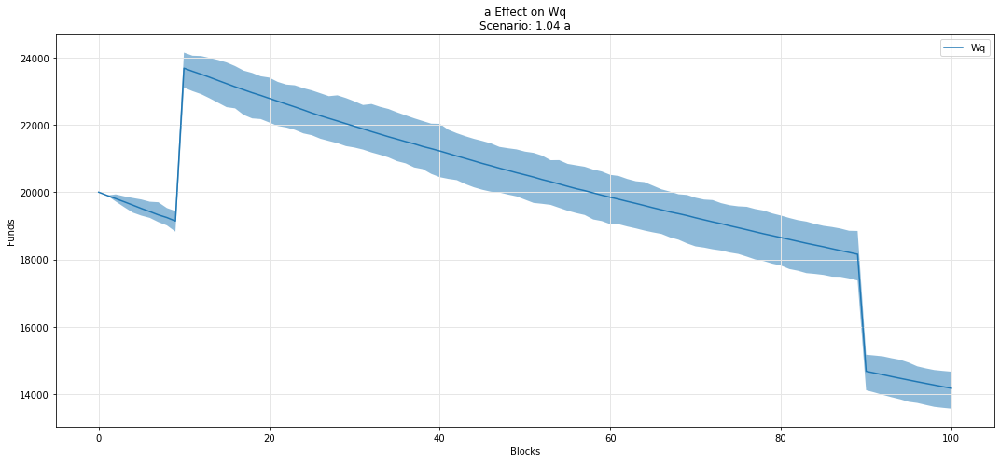

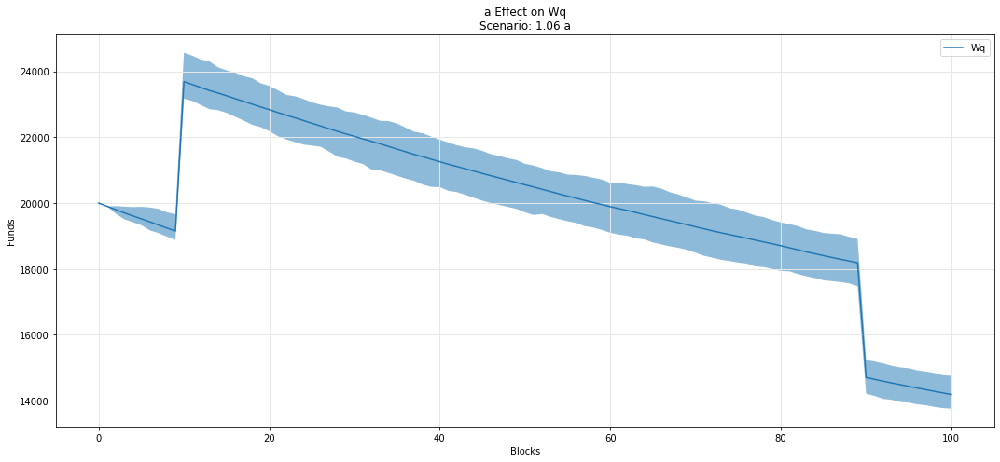

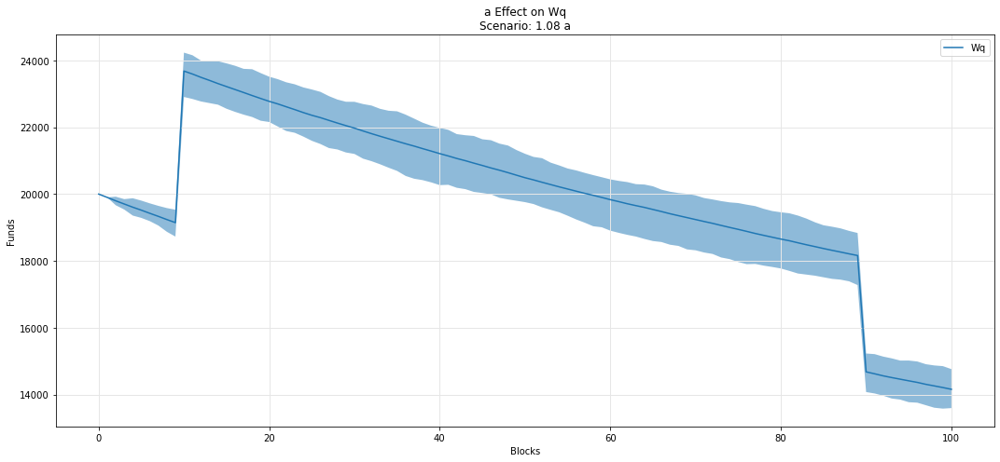

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

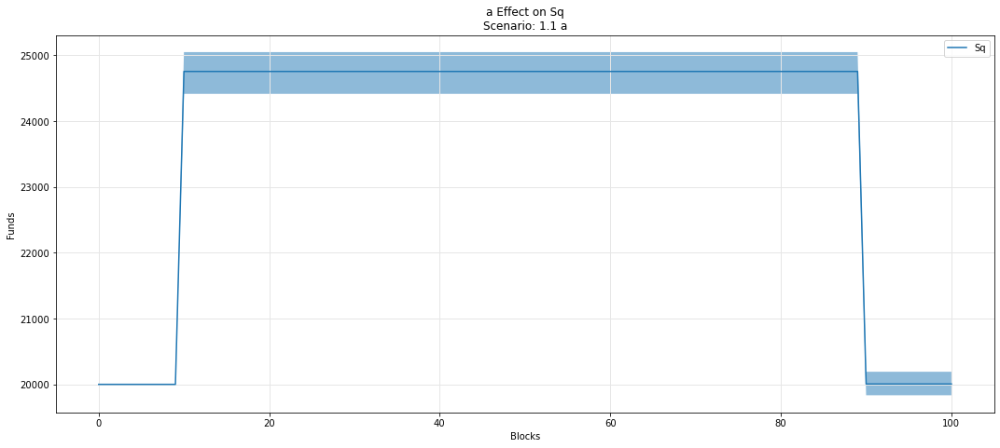

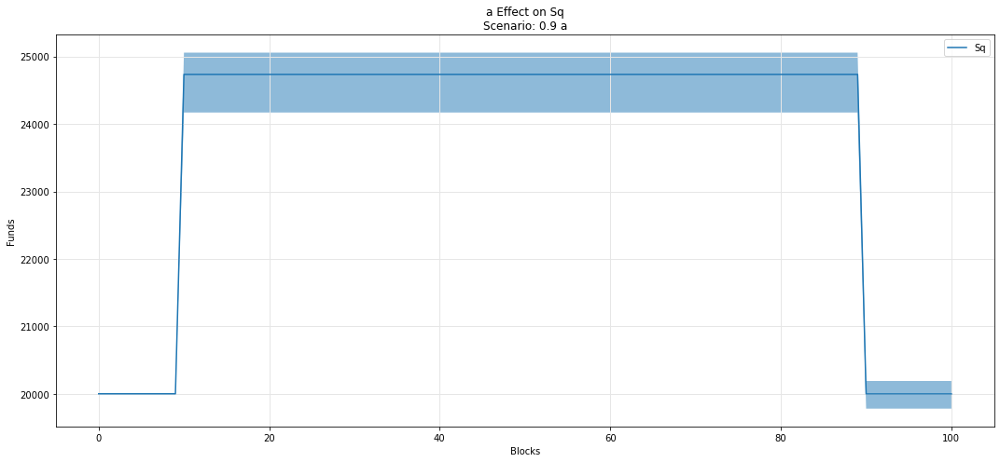

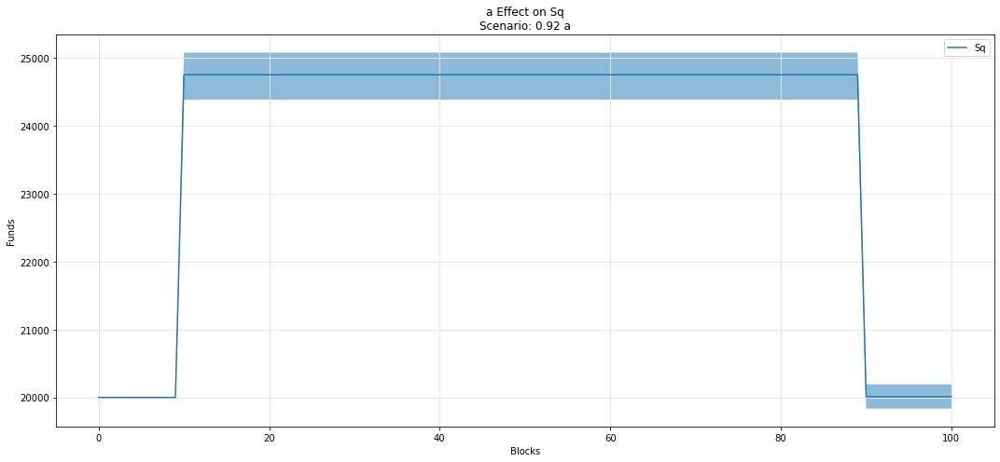

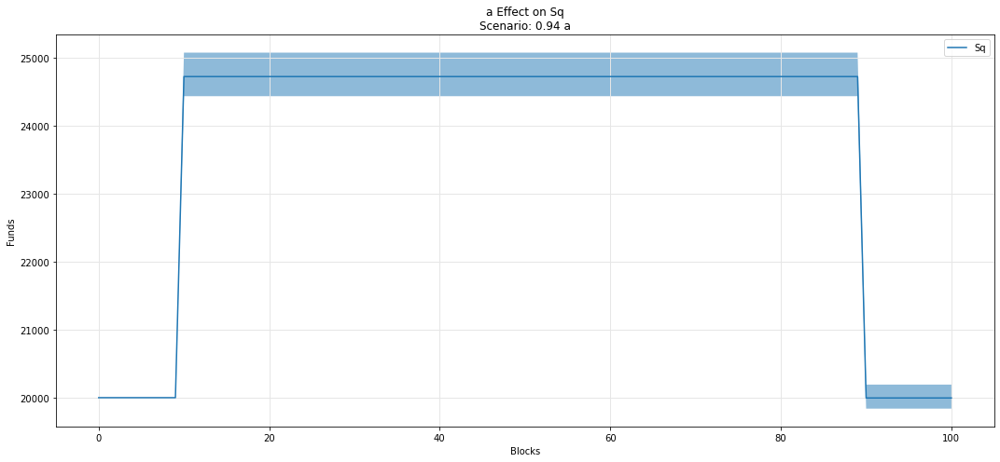

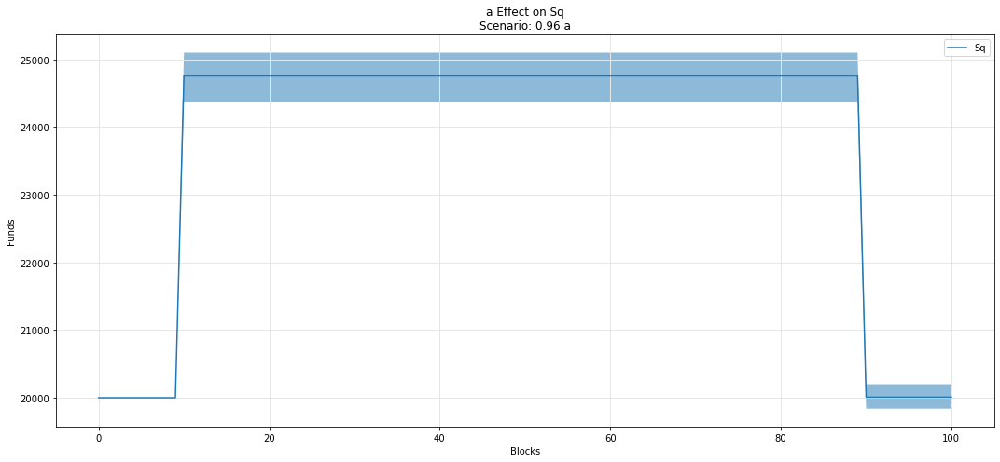

...

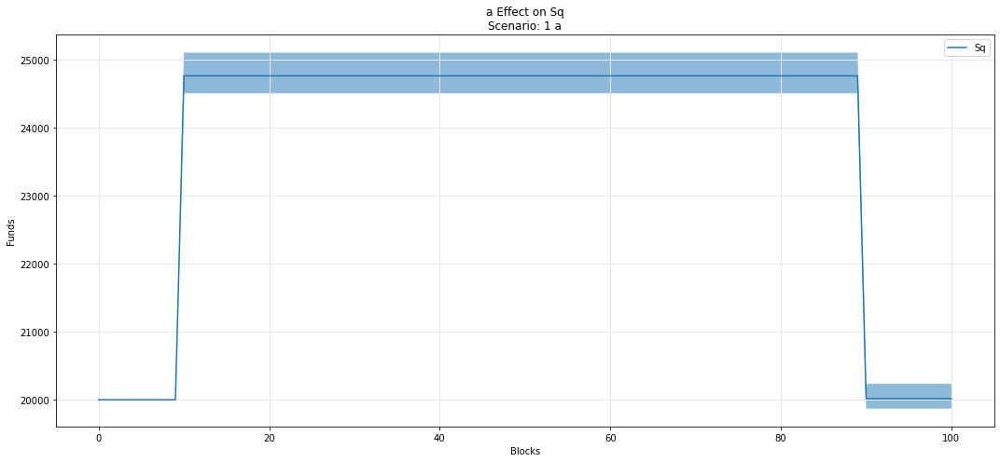

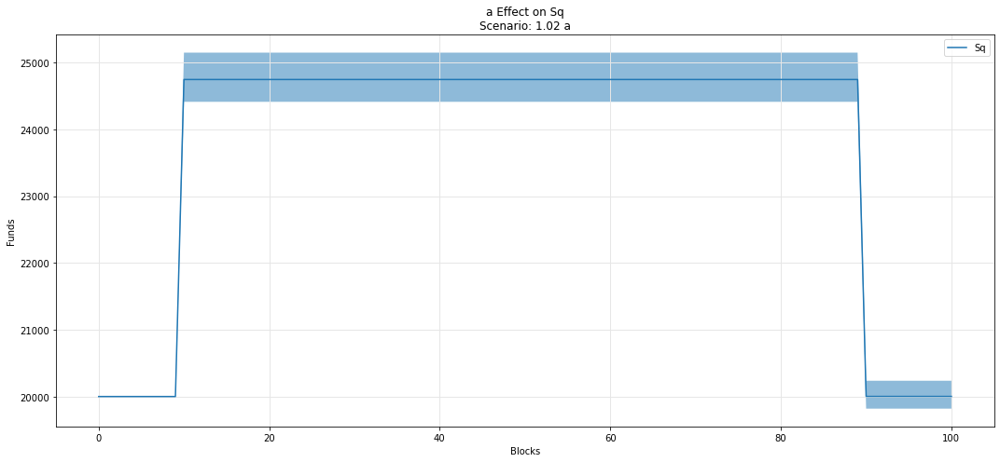

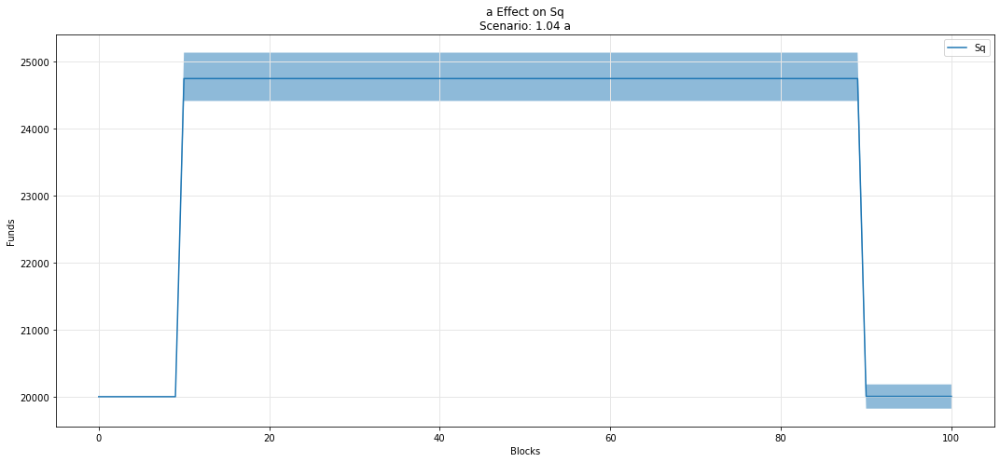

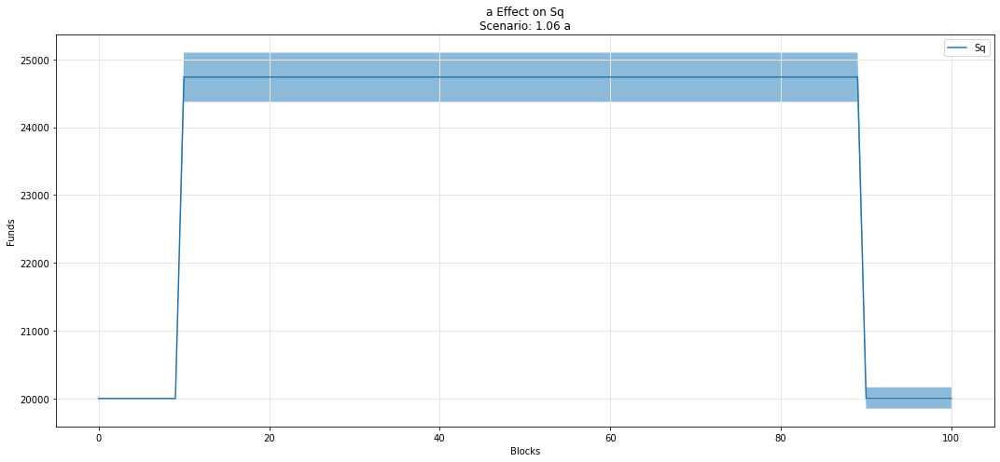

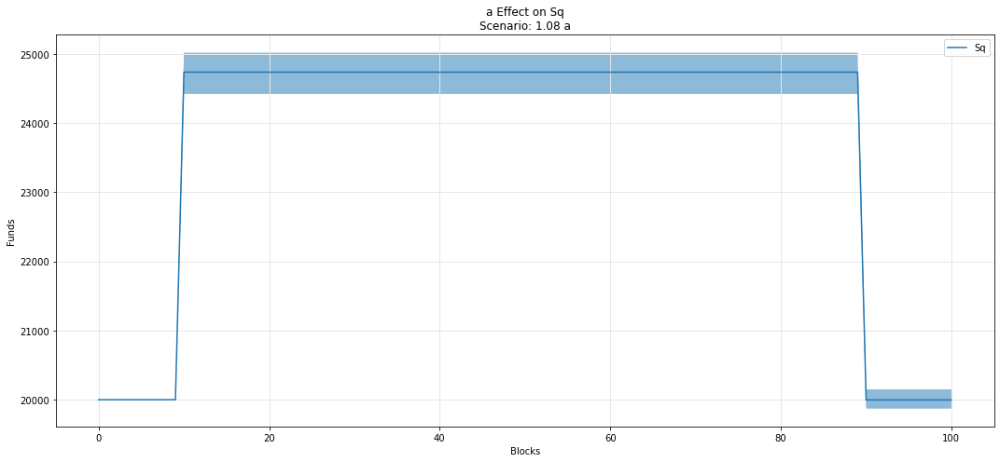

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

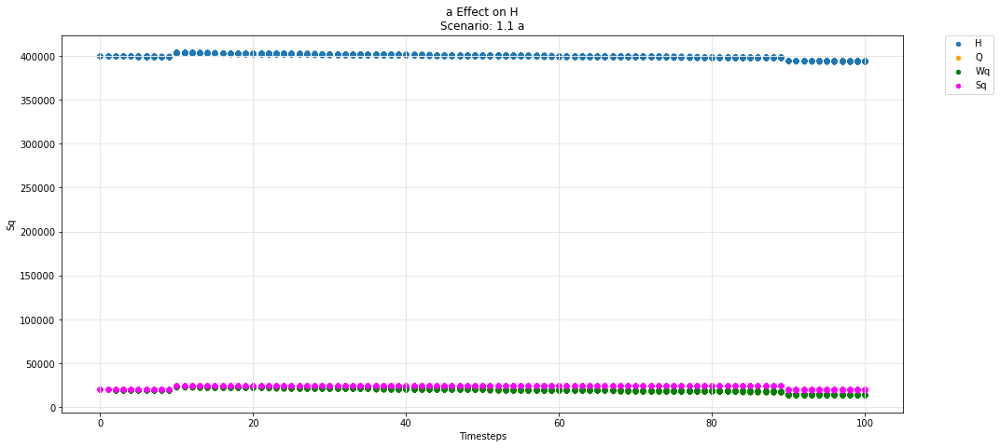

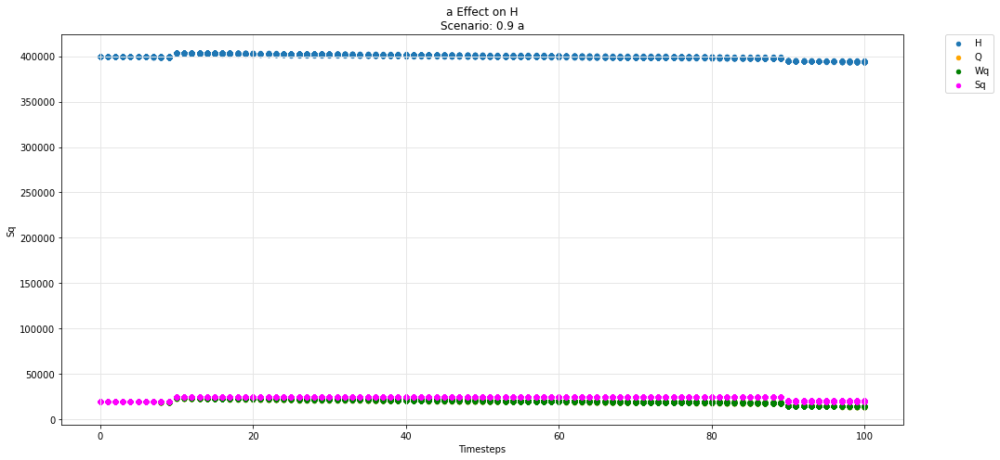

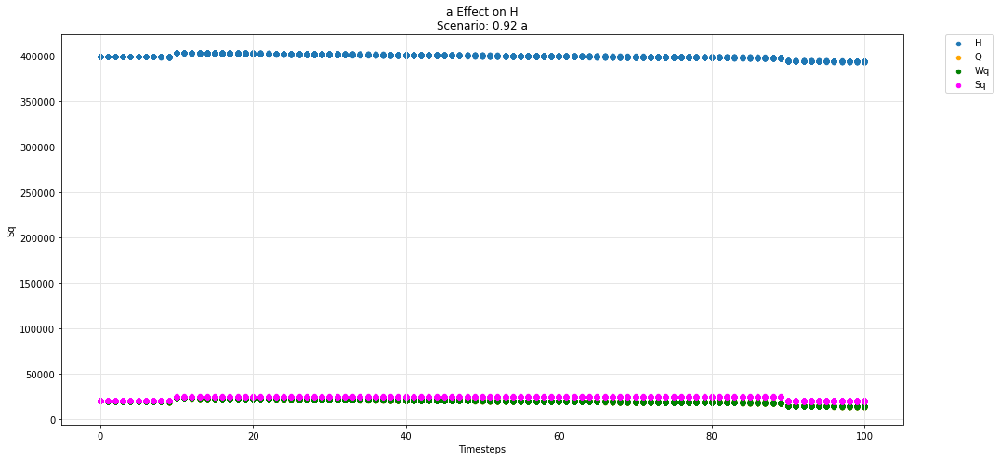

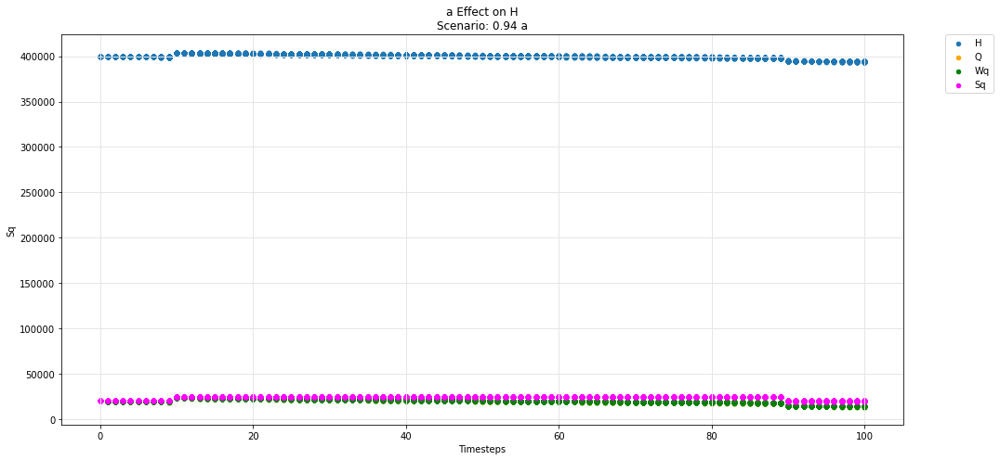

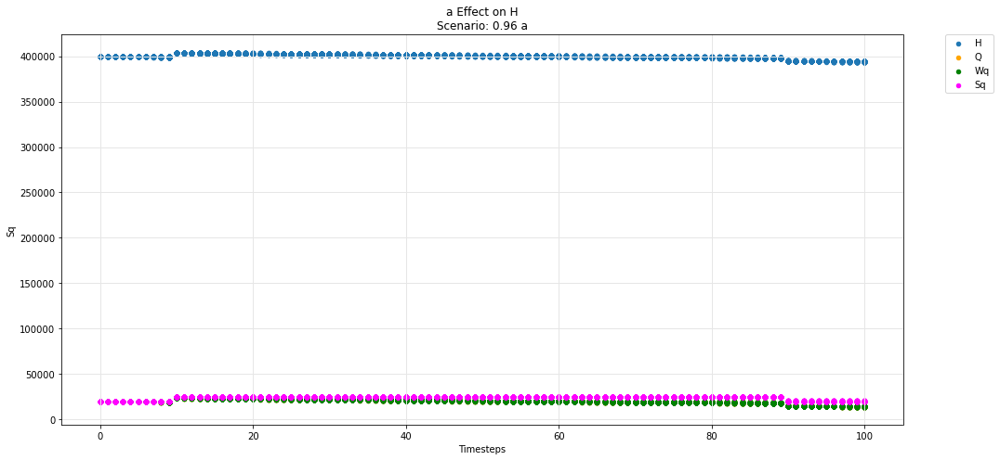

...

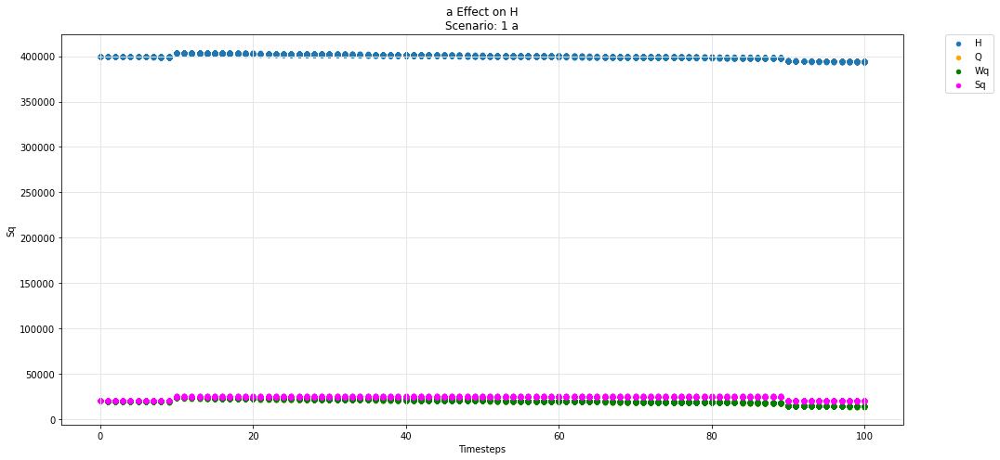

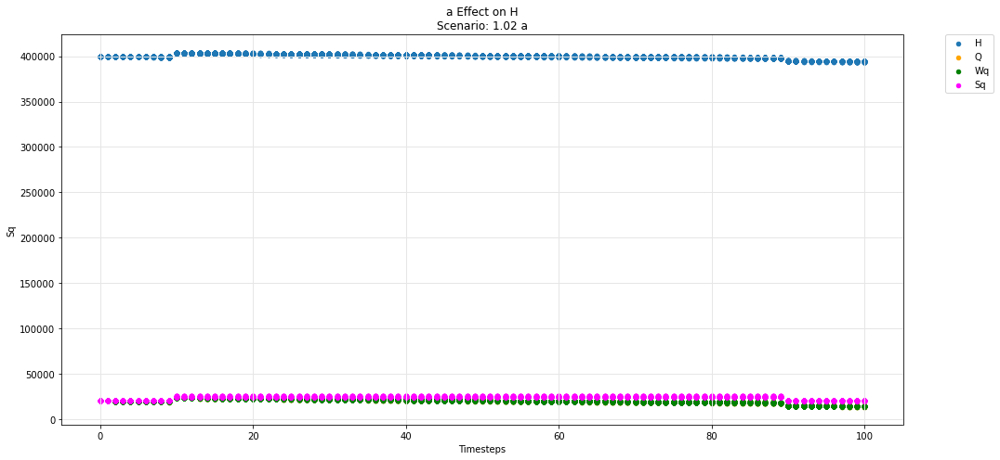

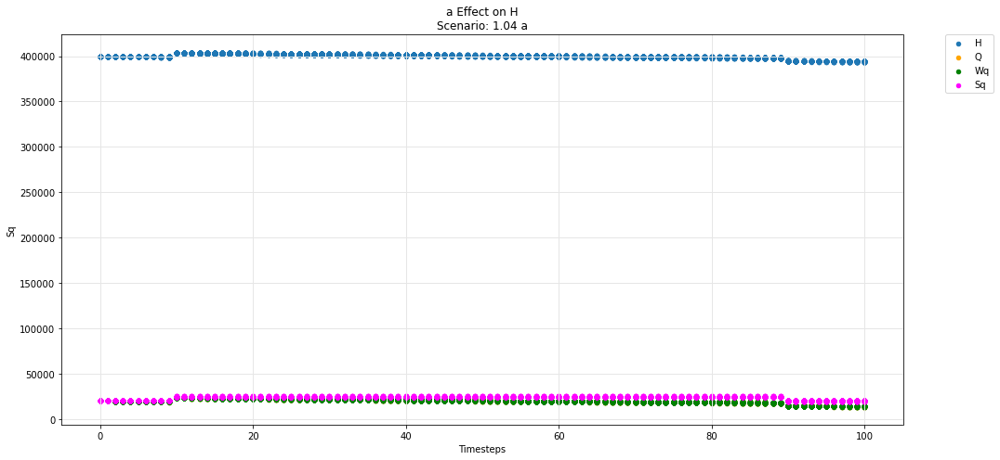

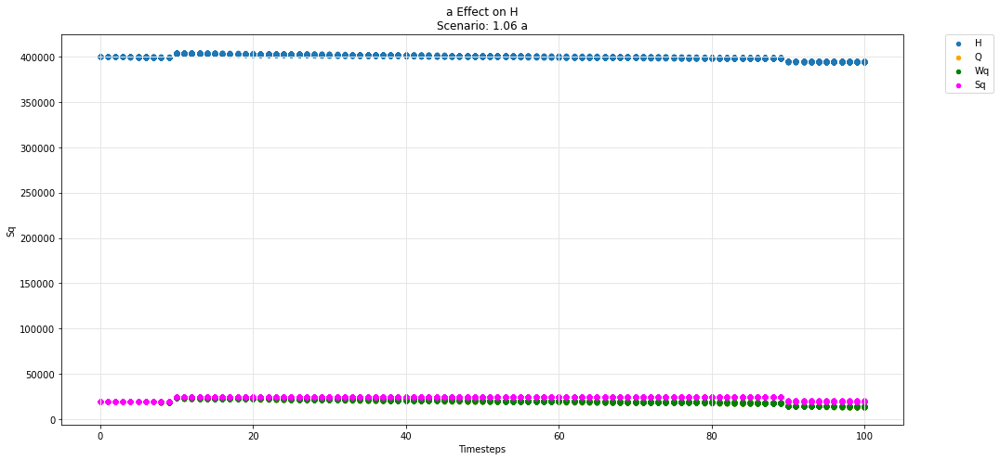

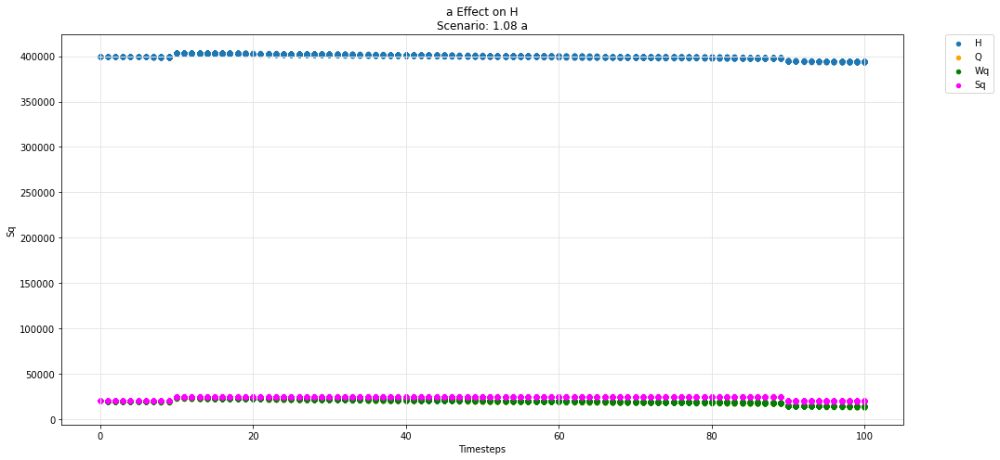

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

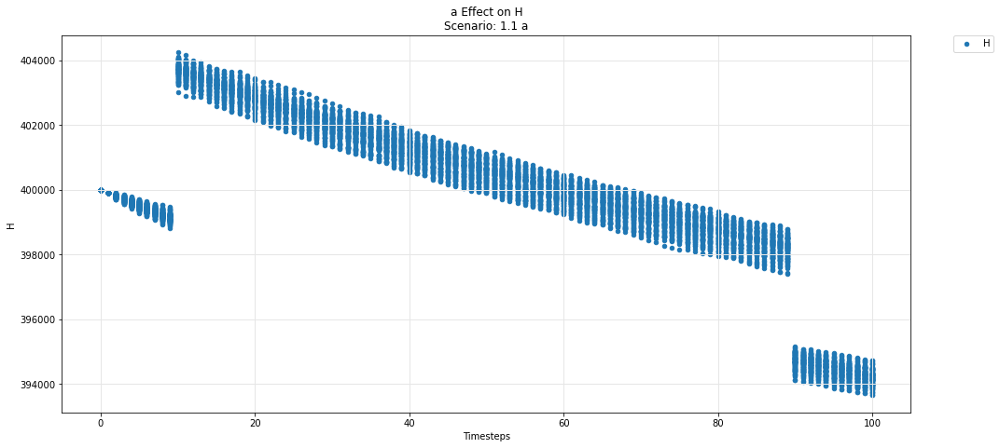

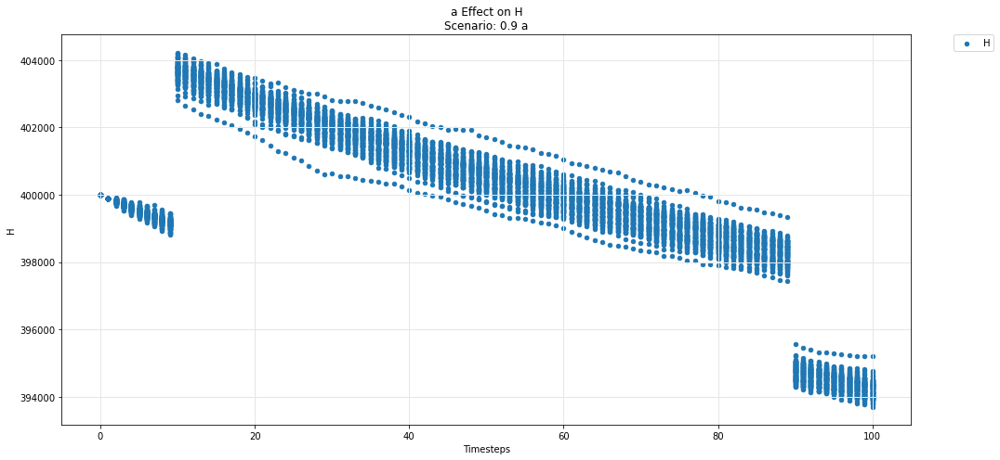

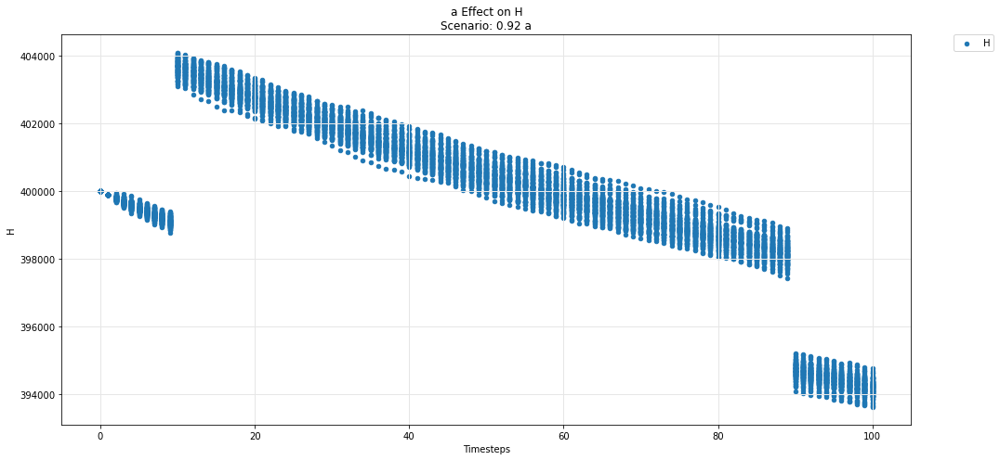

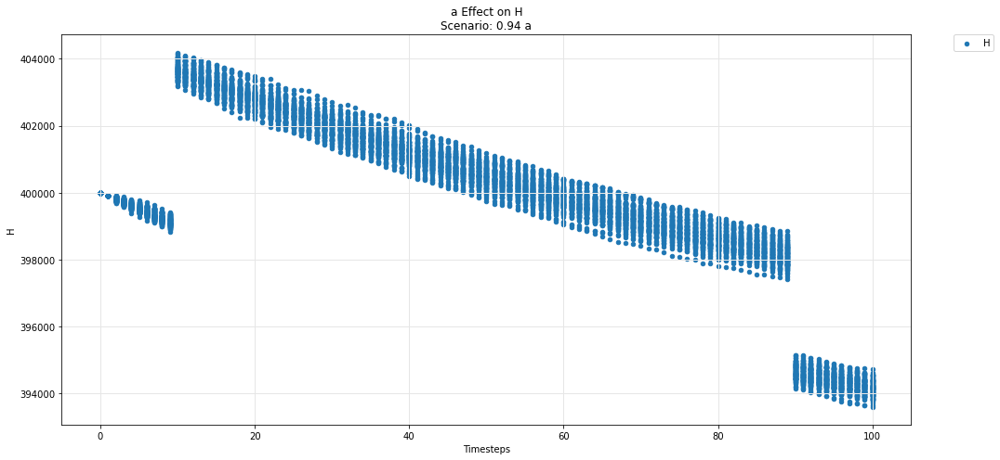

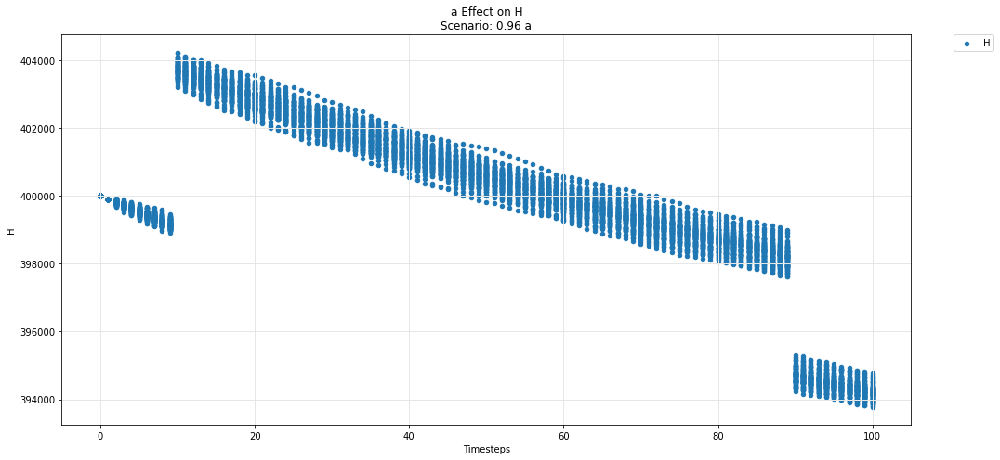

...

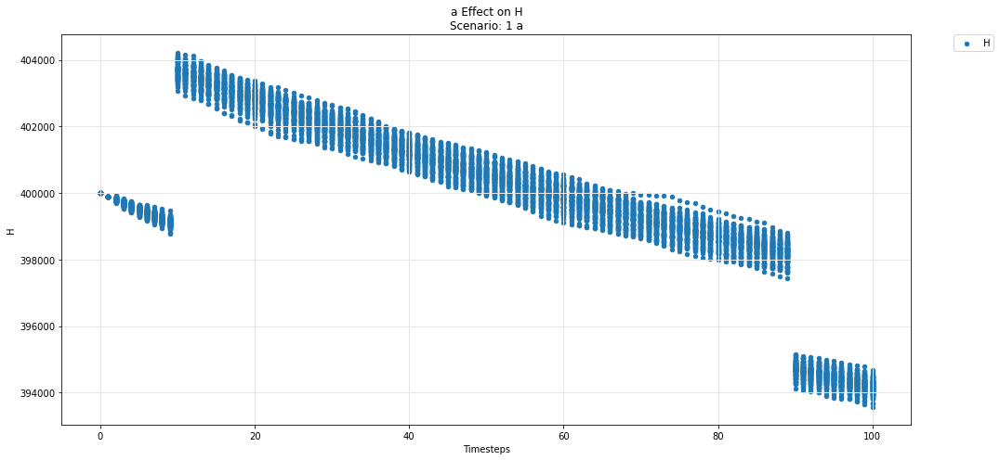

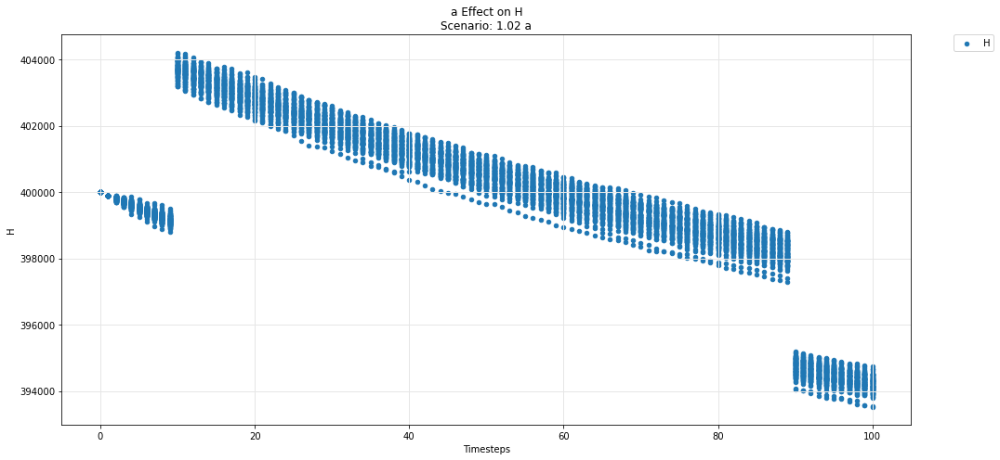

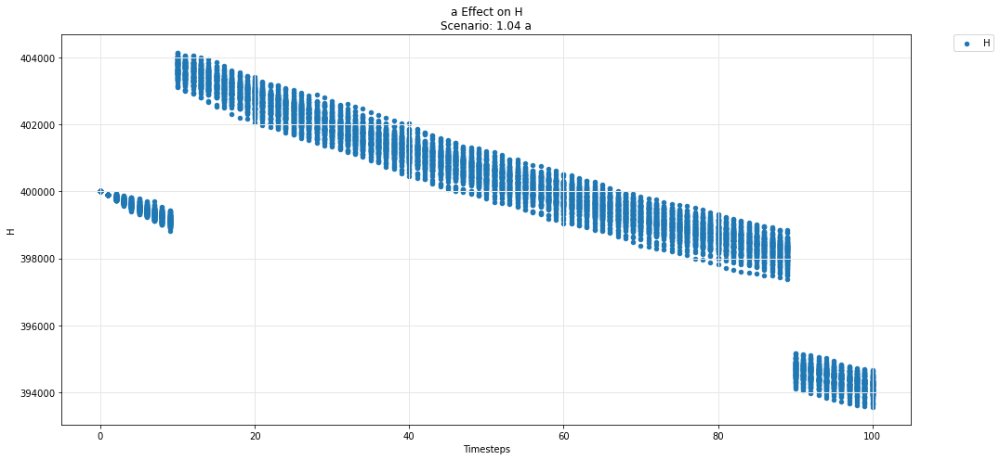

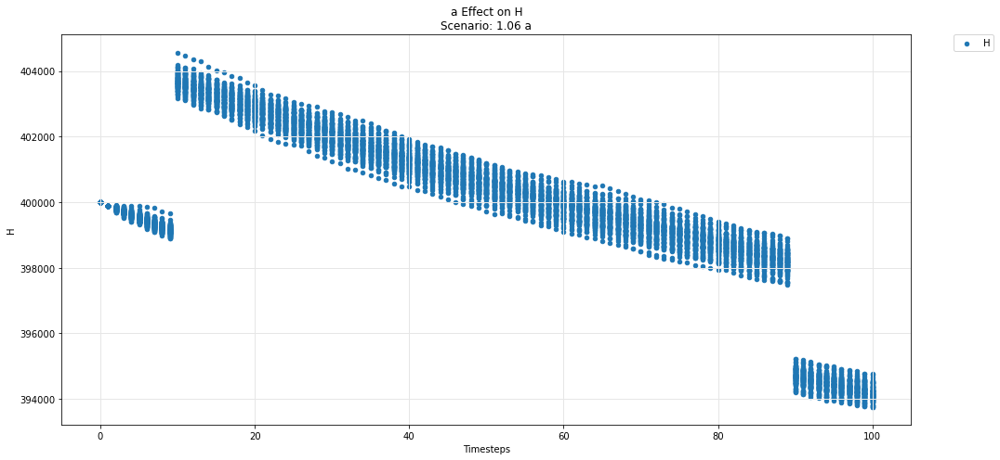

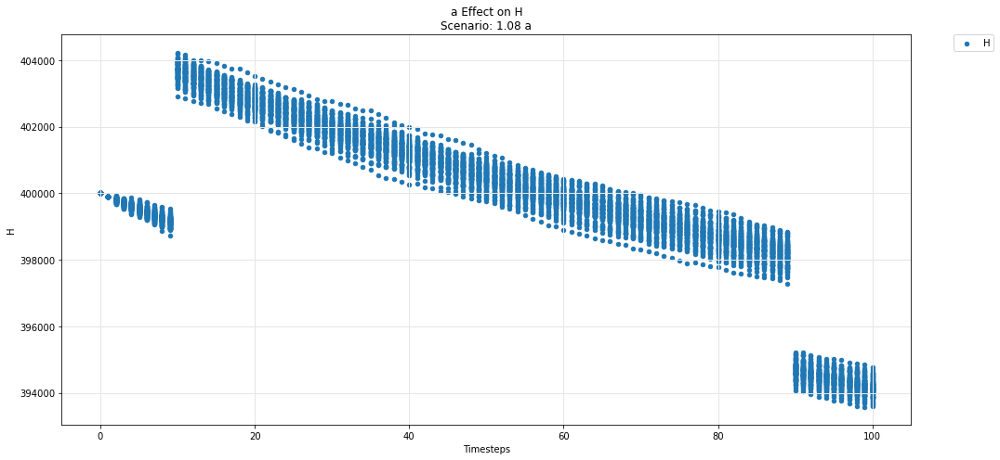

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

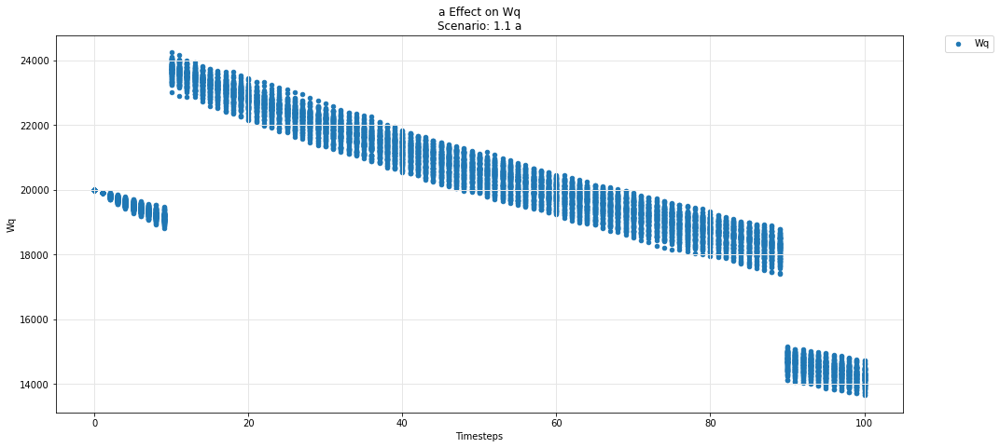

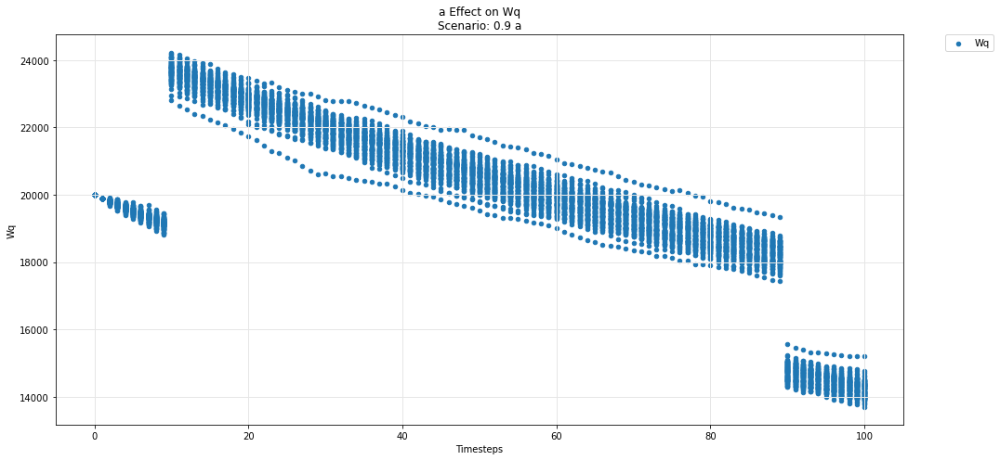

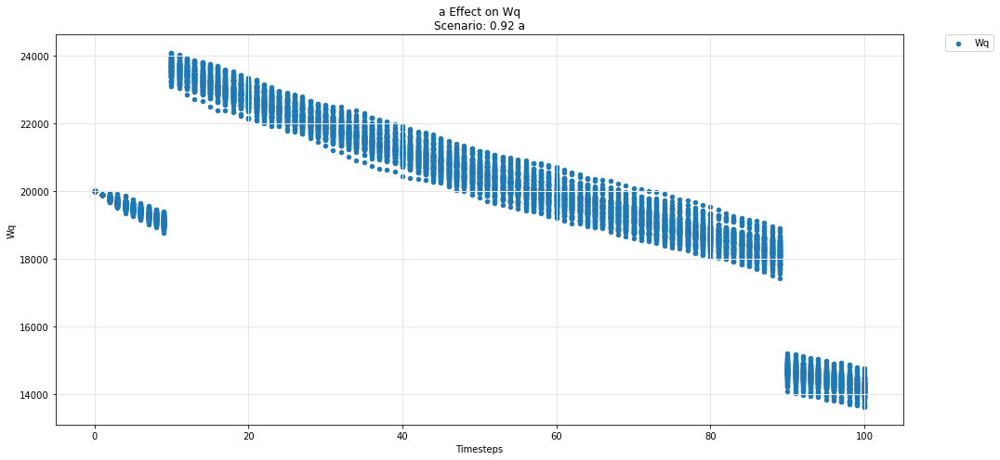

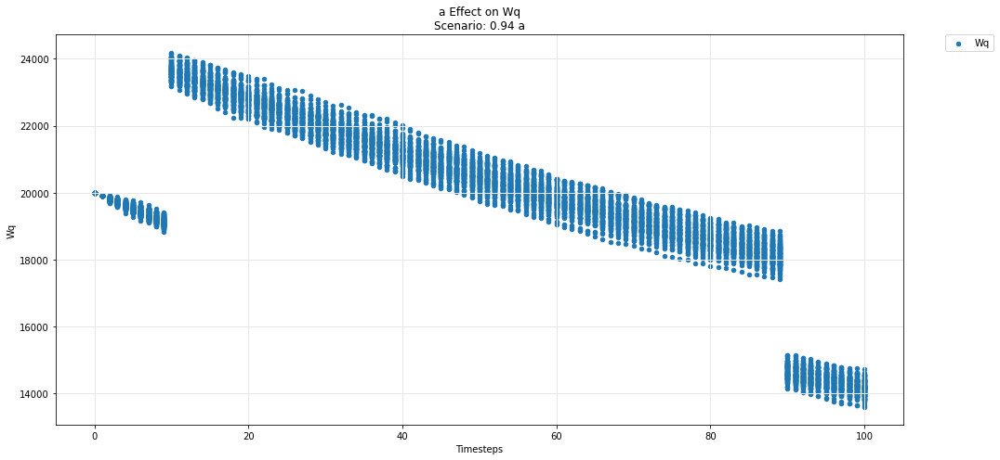

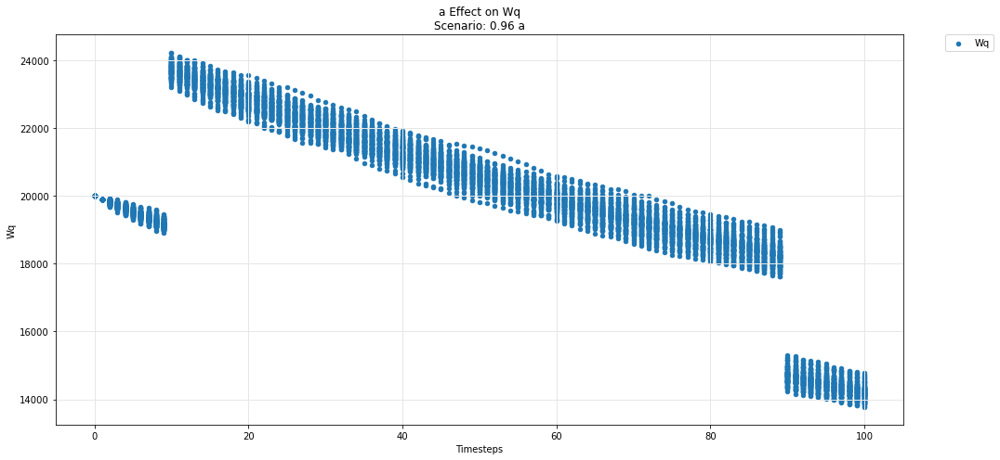

...

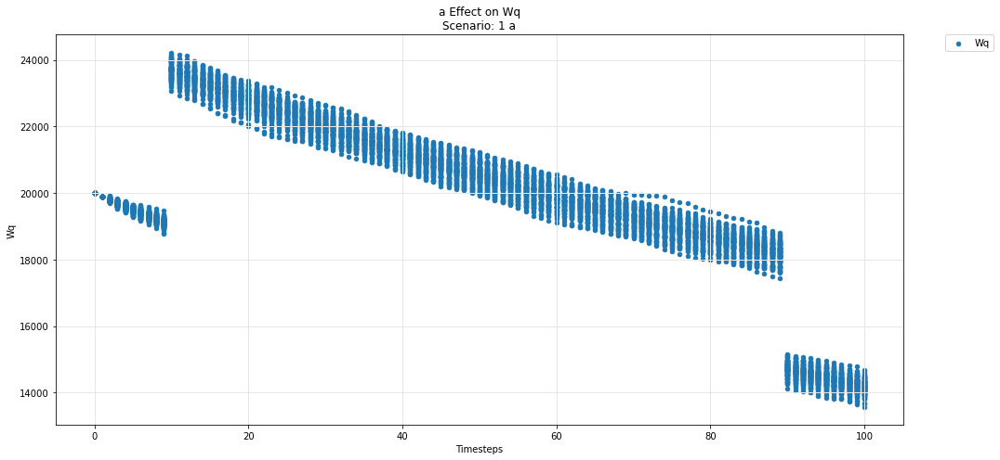

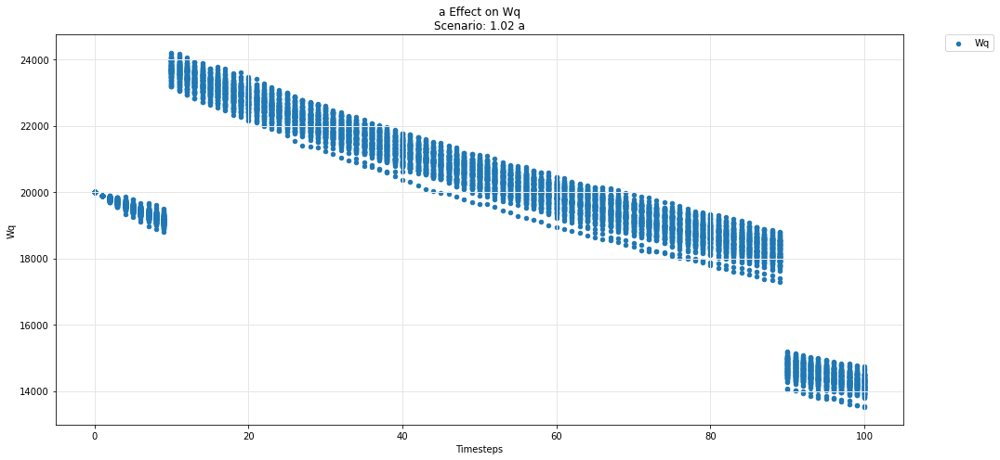

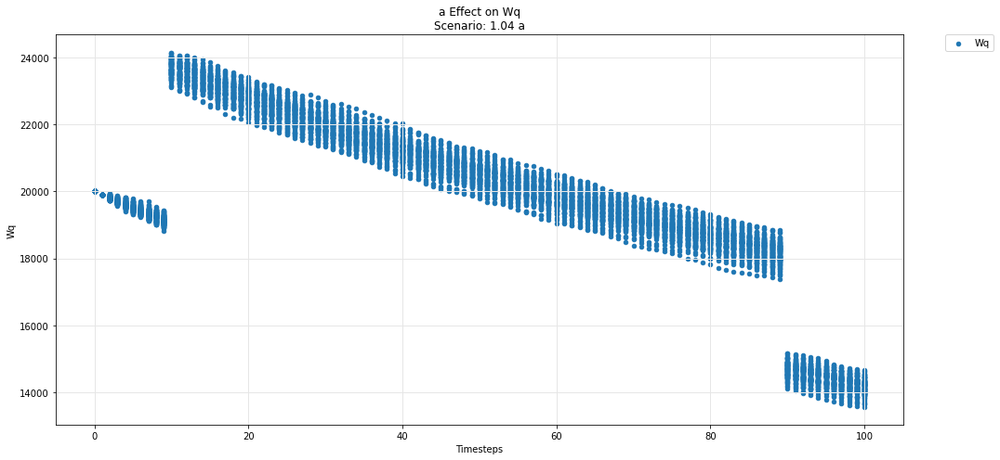

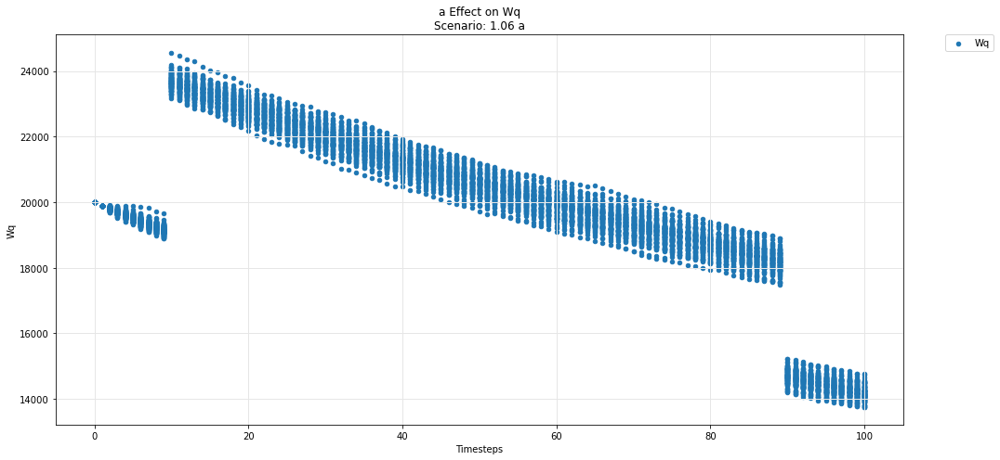

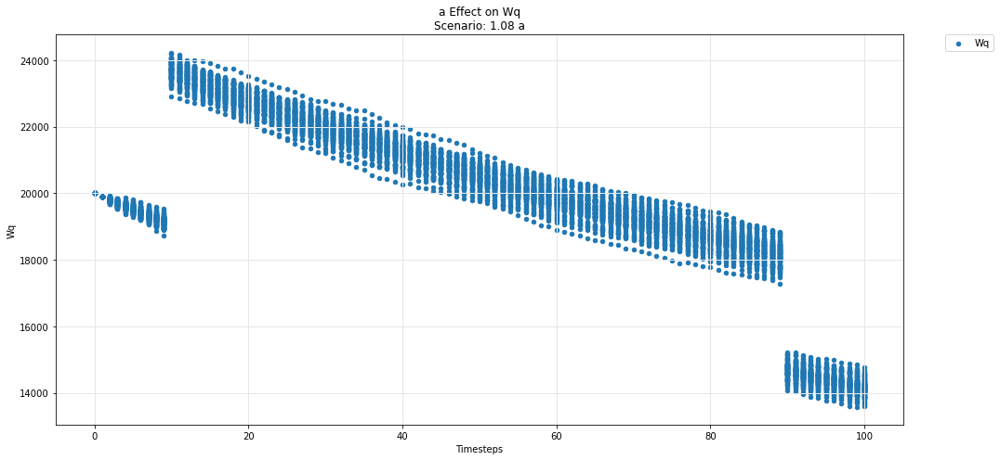

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

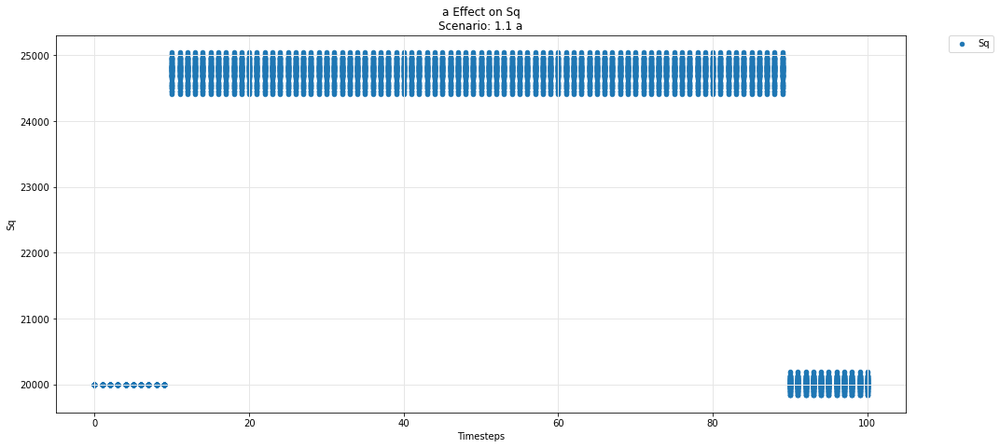

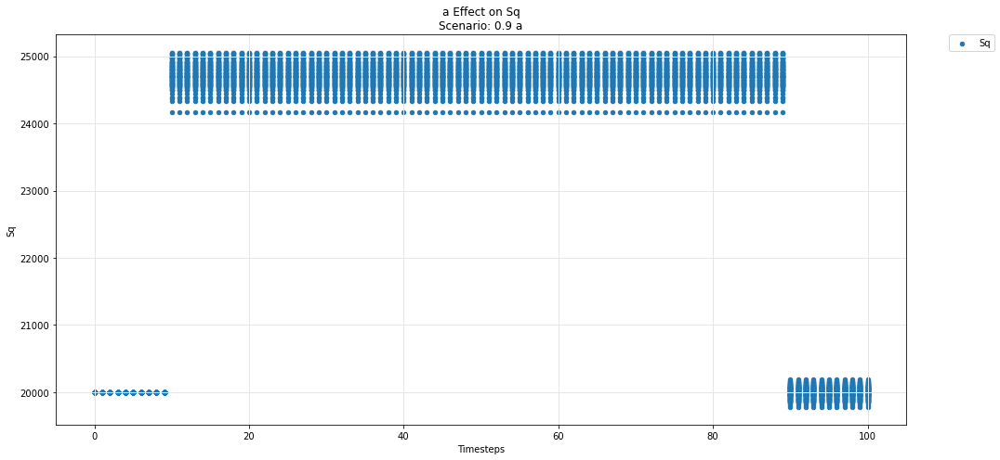

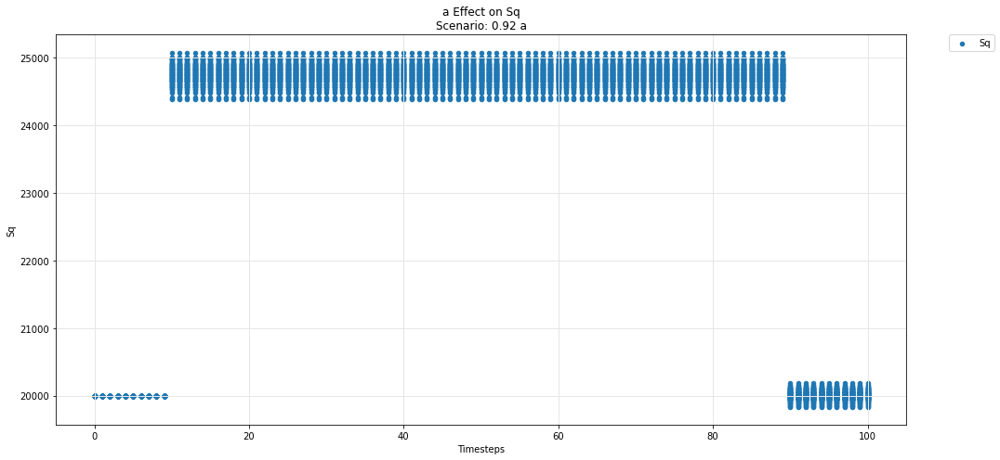

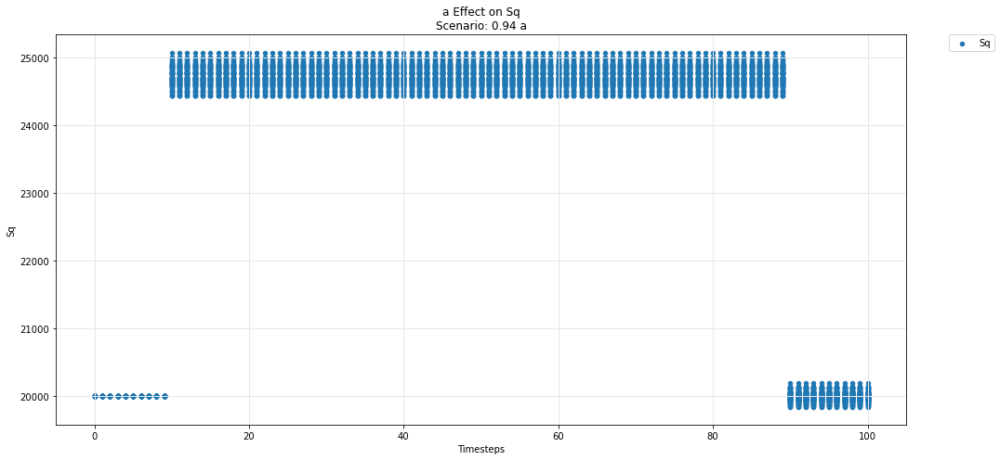

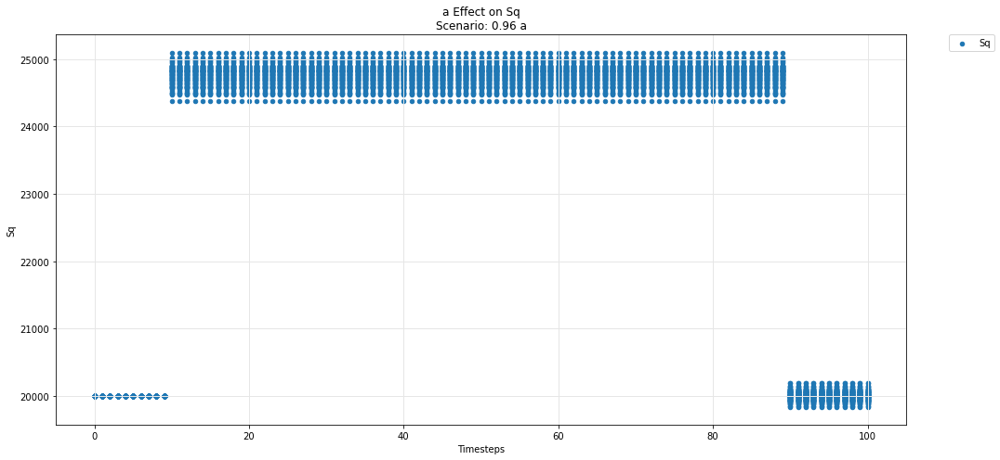

...

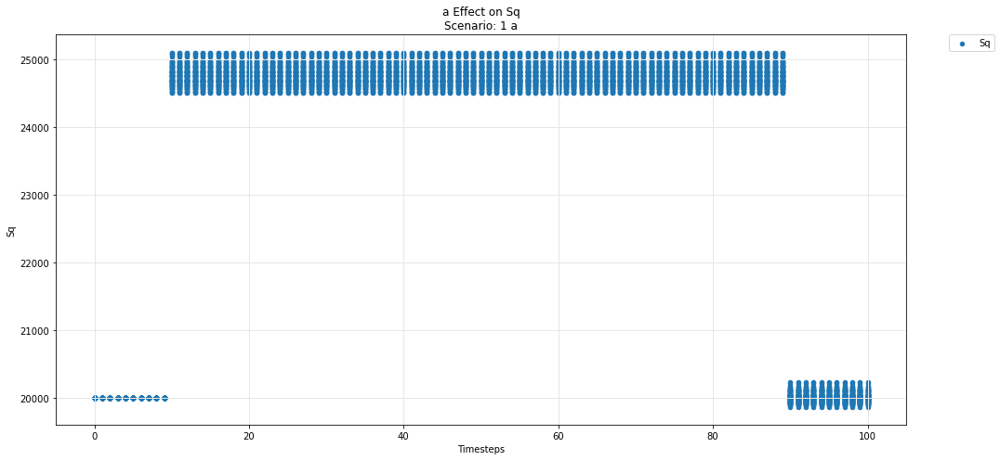

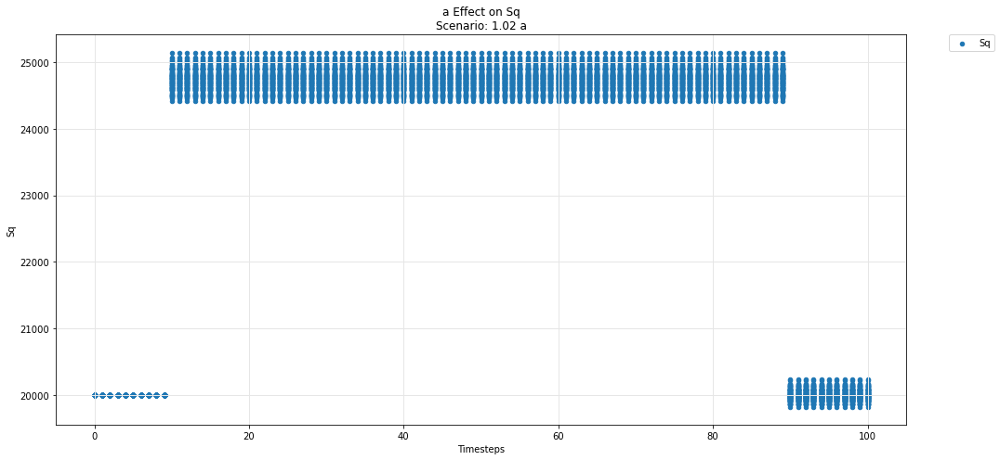

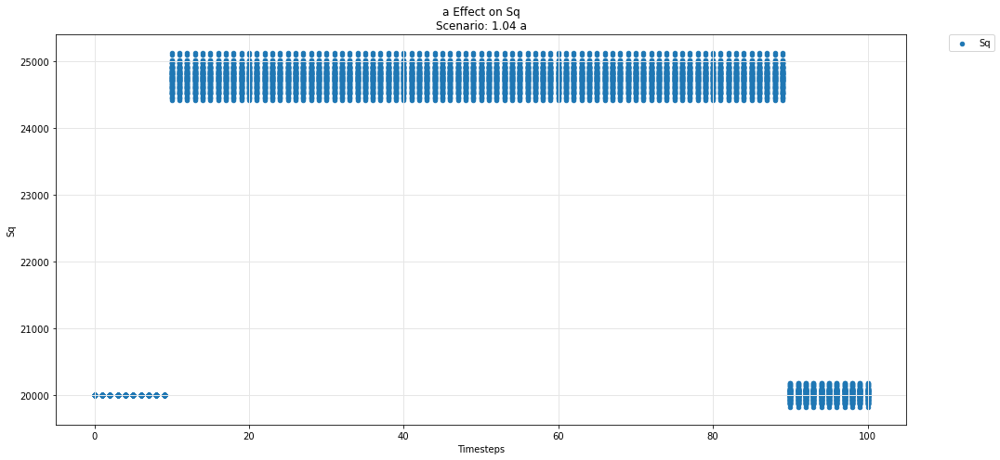

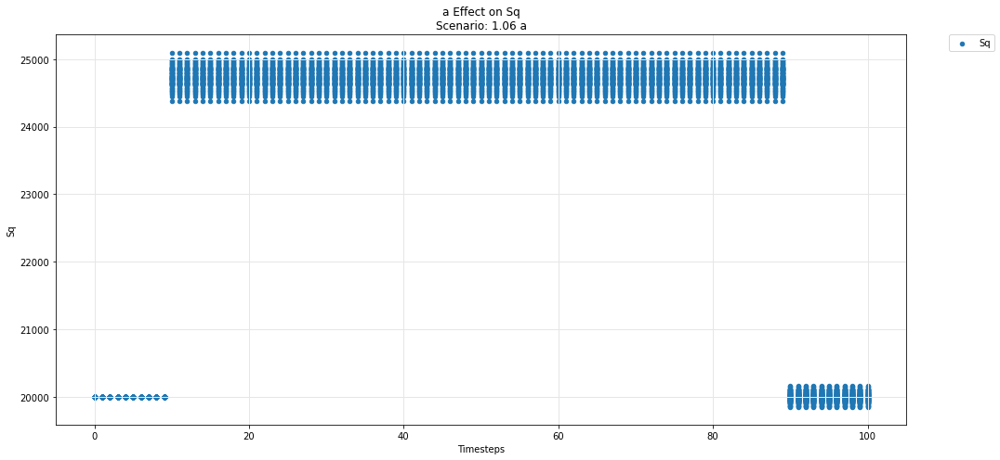

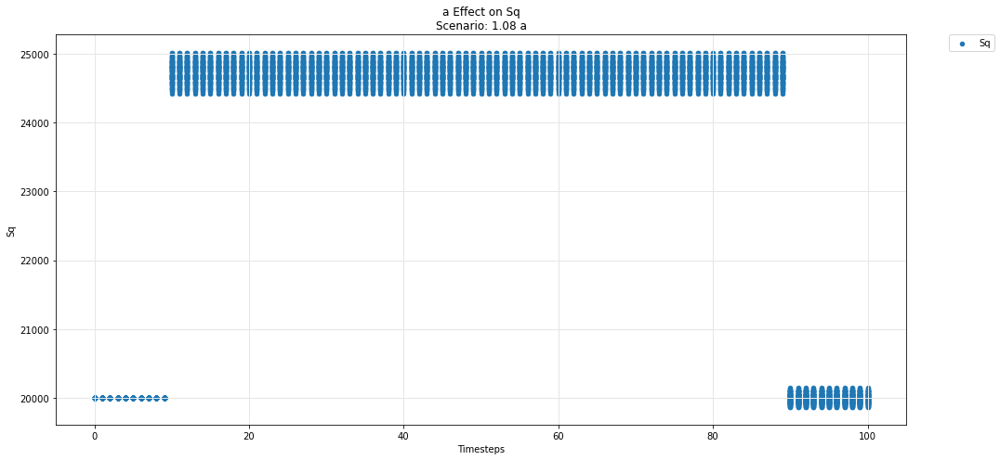

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

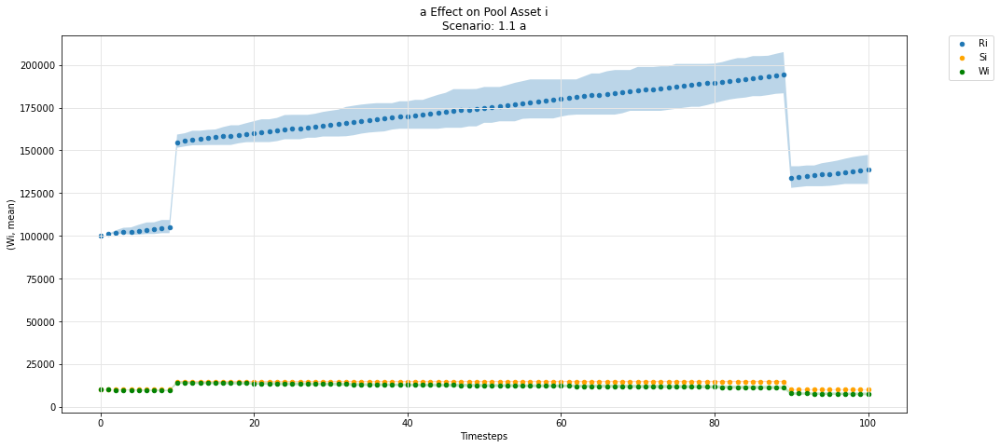

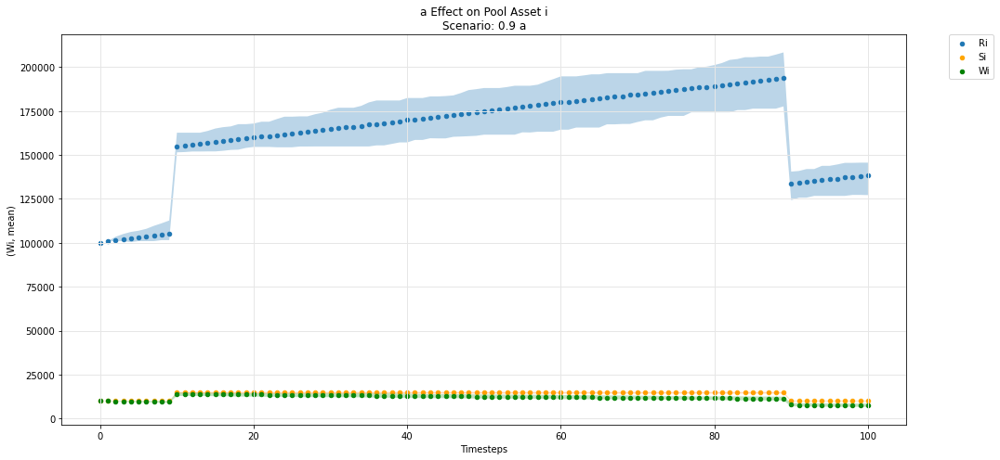

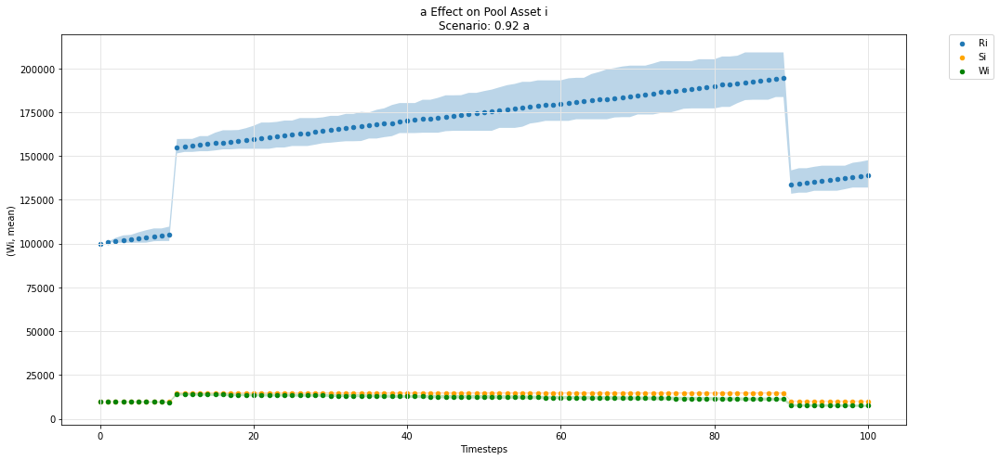

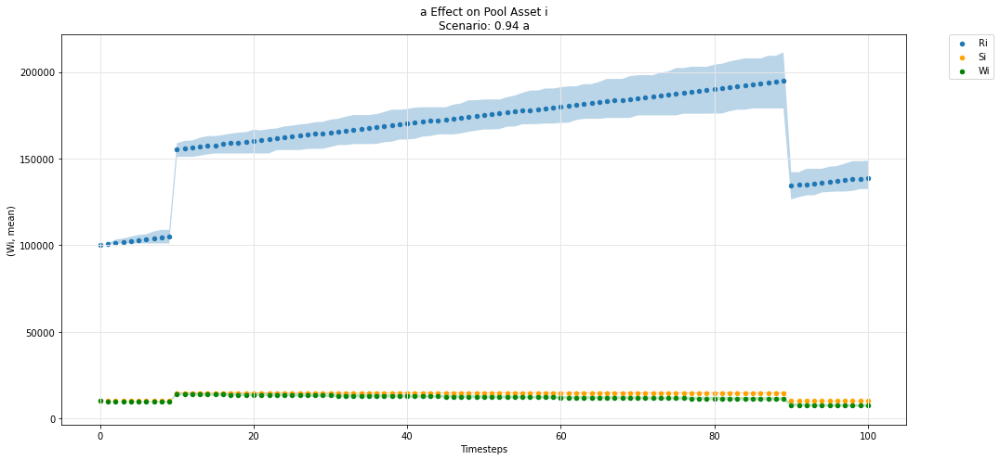

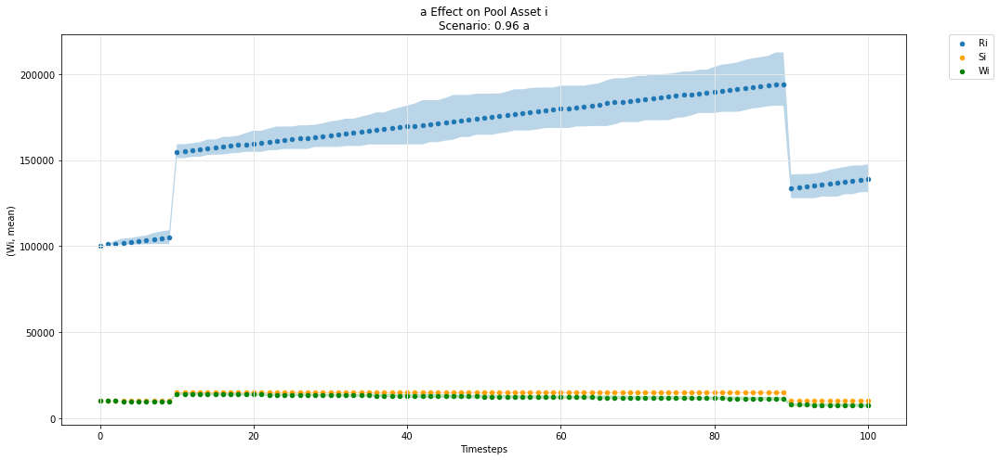

...

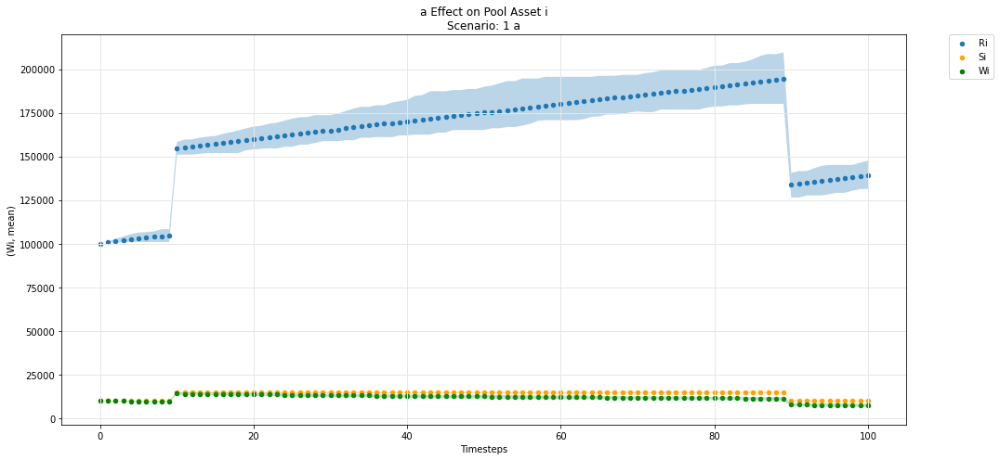

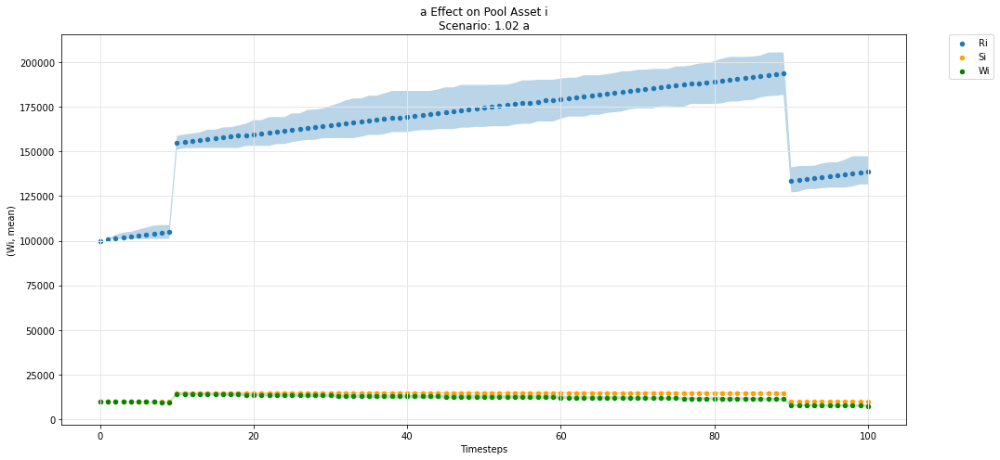

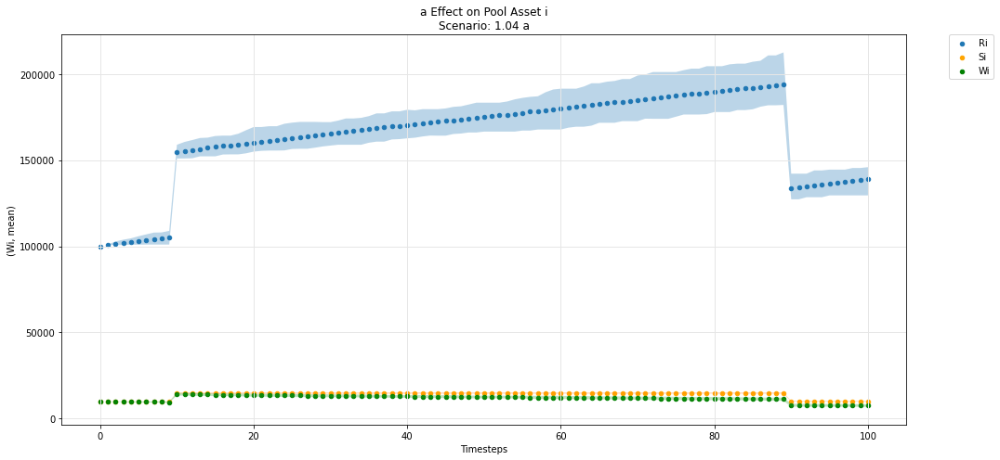

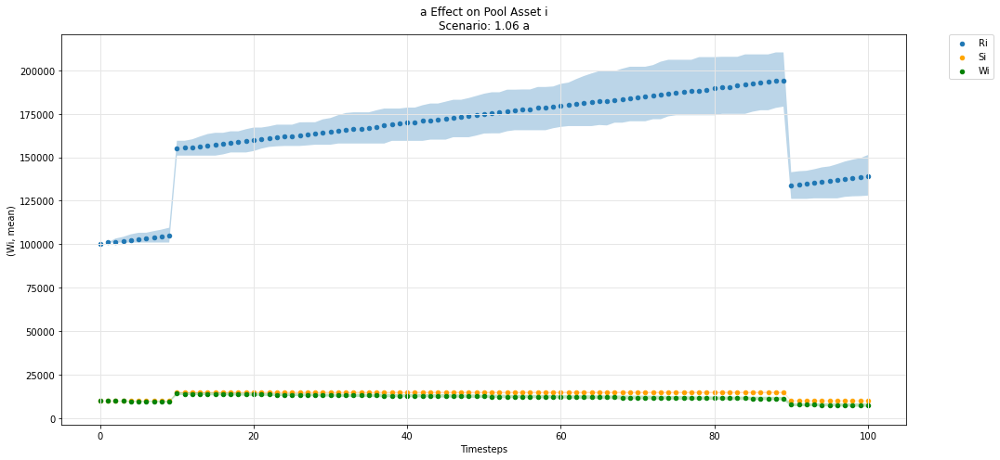

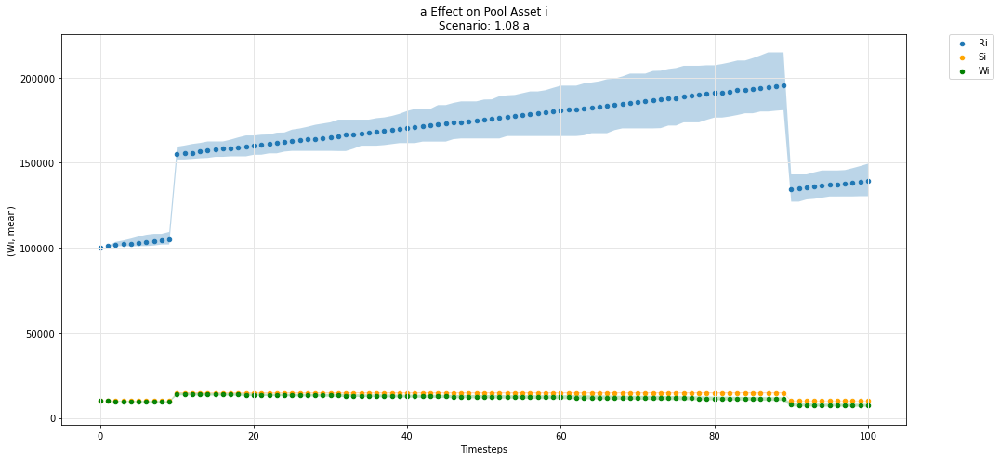

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

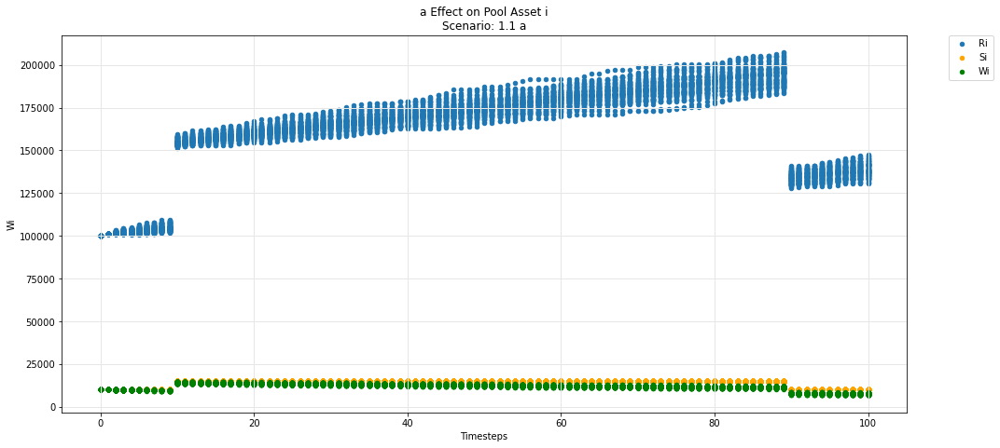

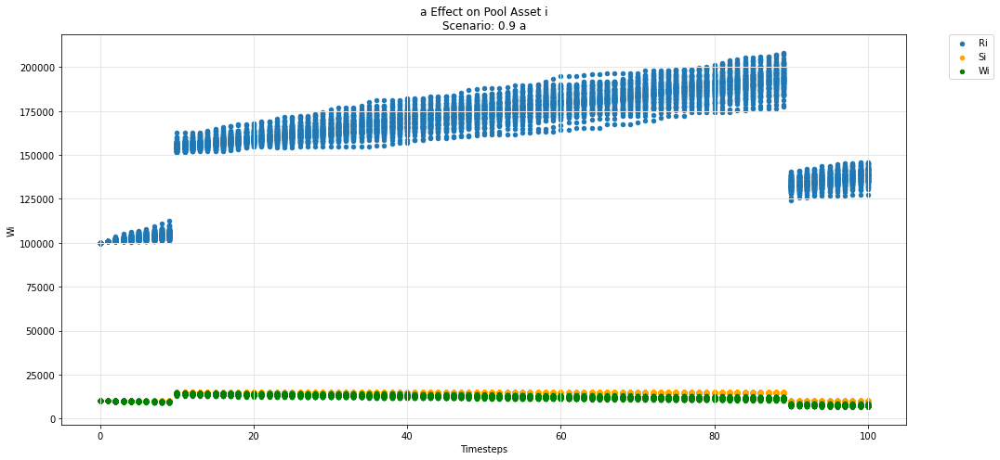

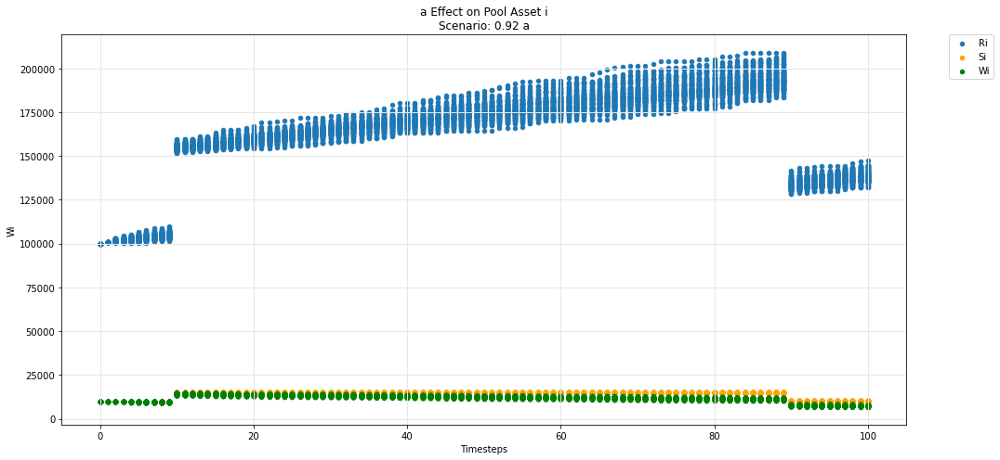

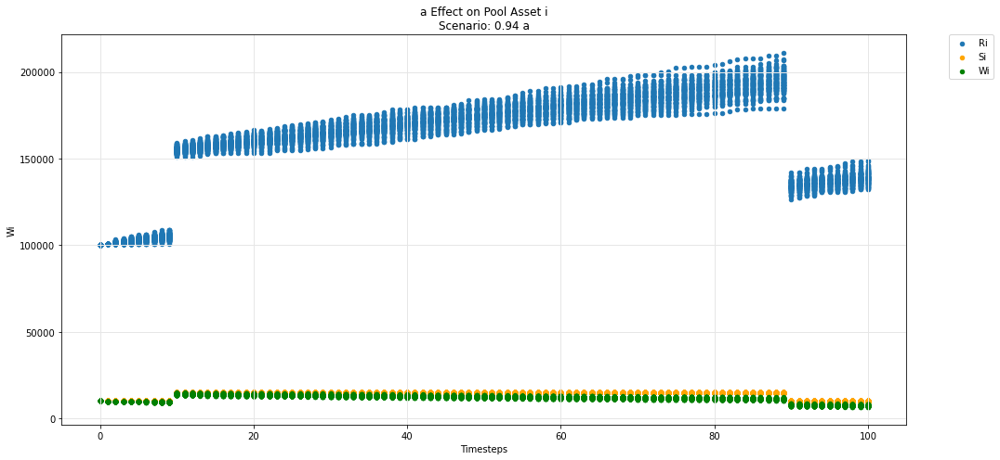

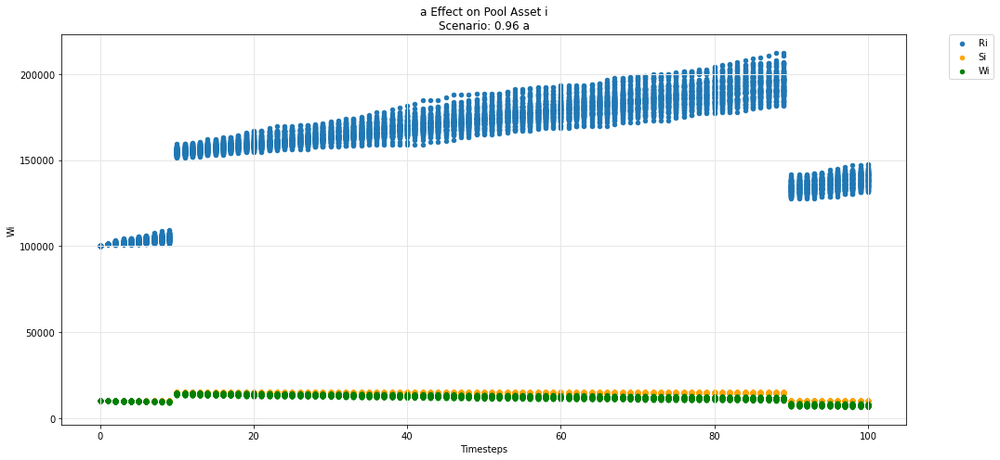

...

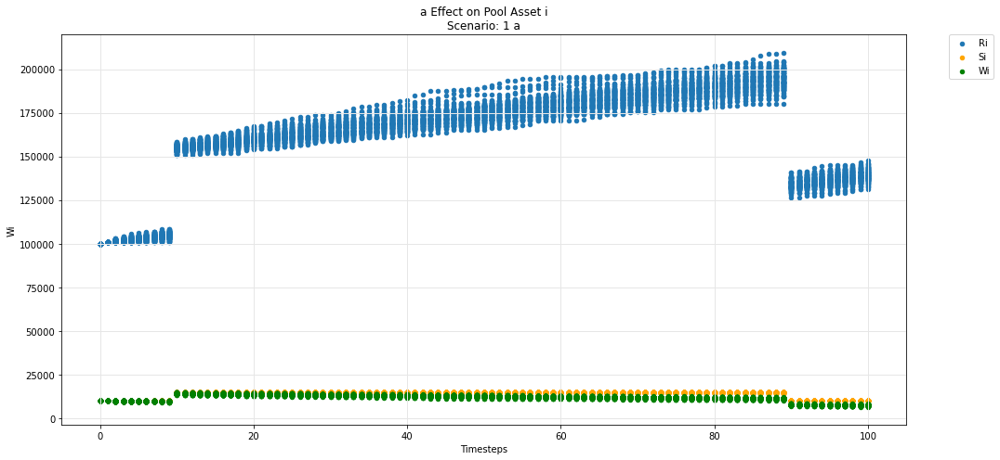

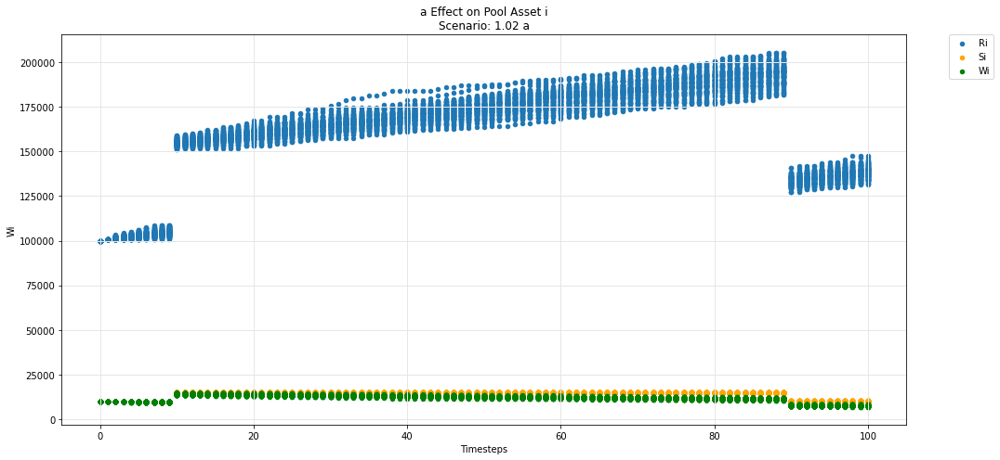

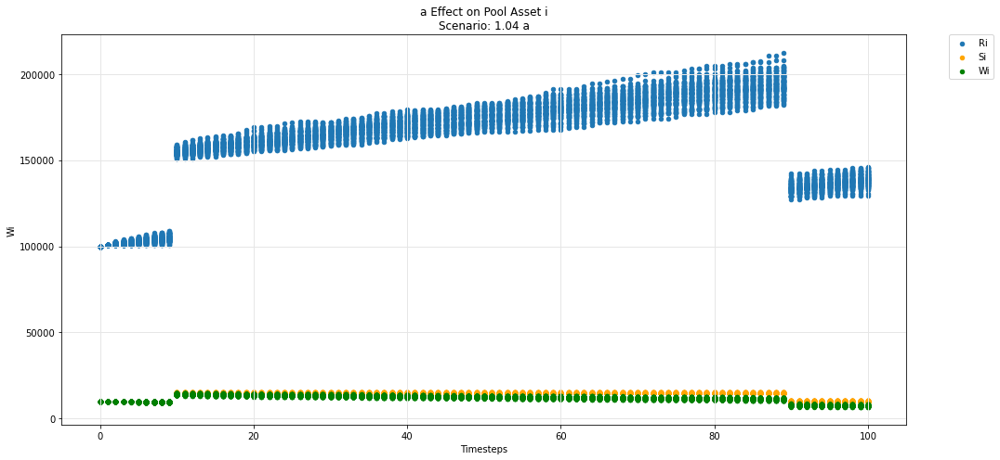

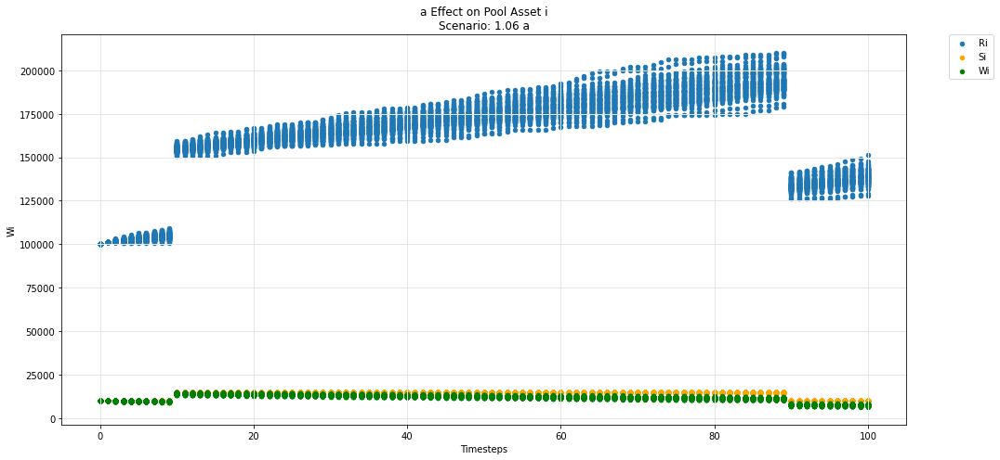

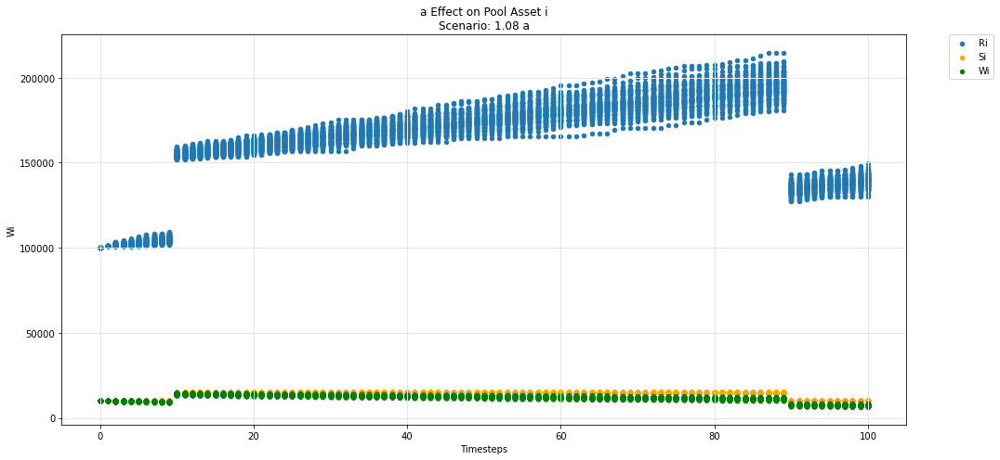

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

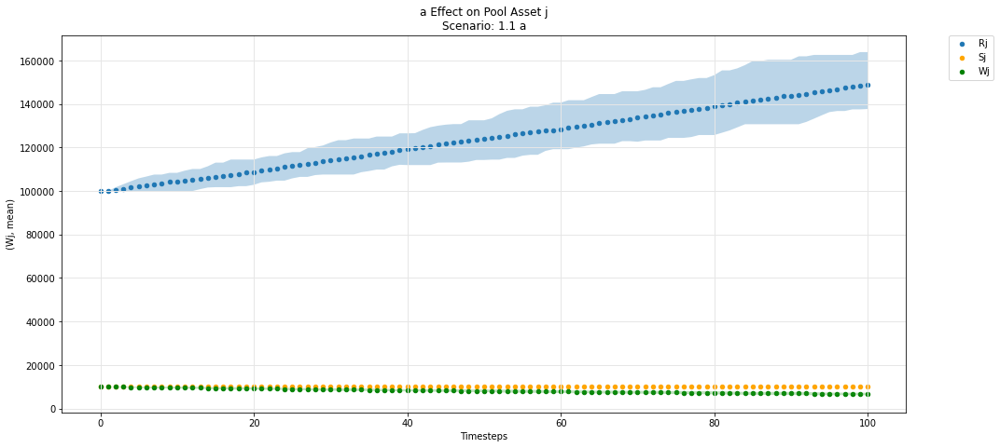

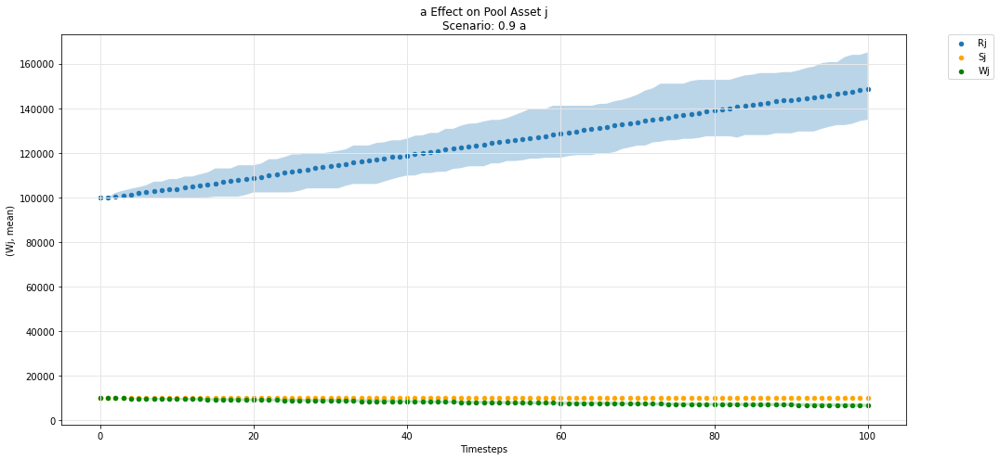

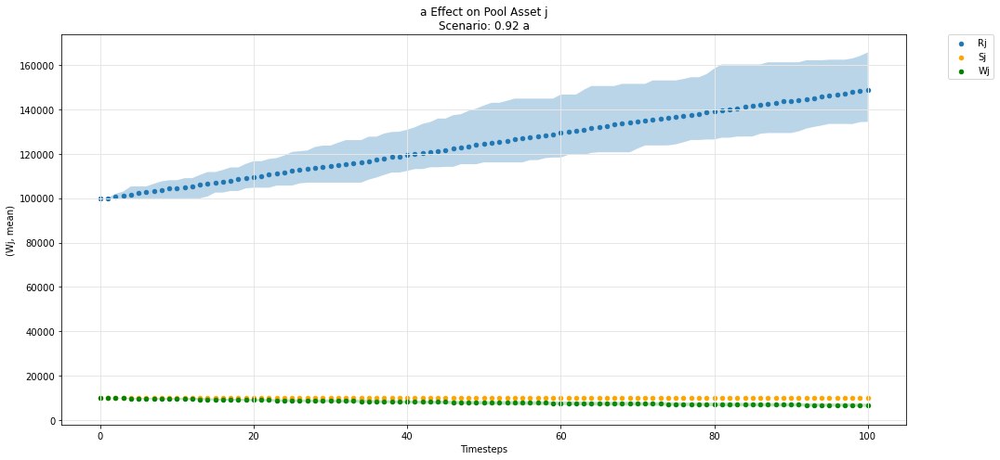

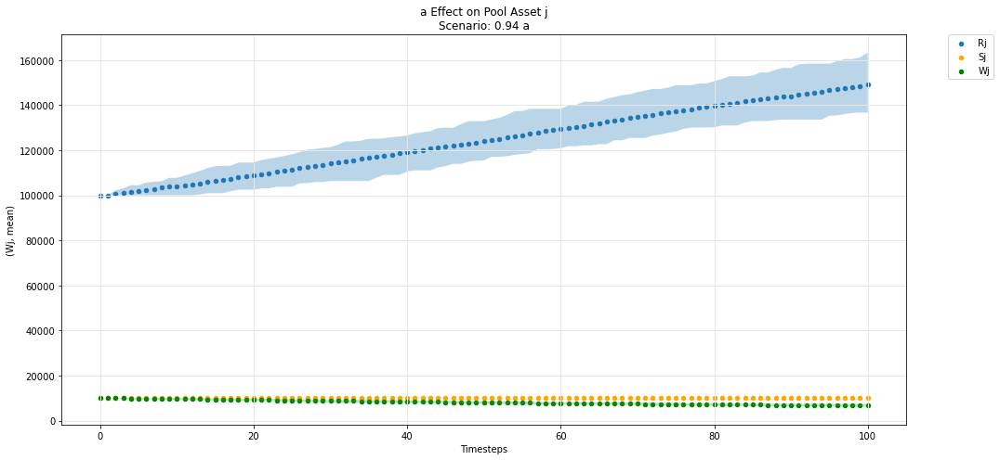

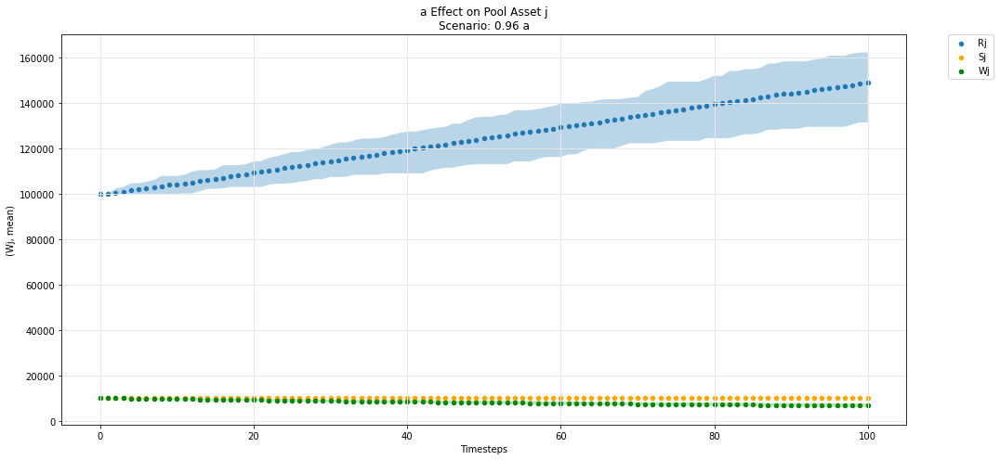

...

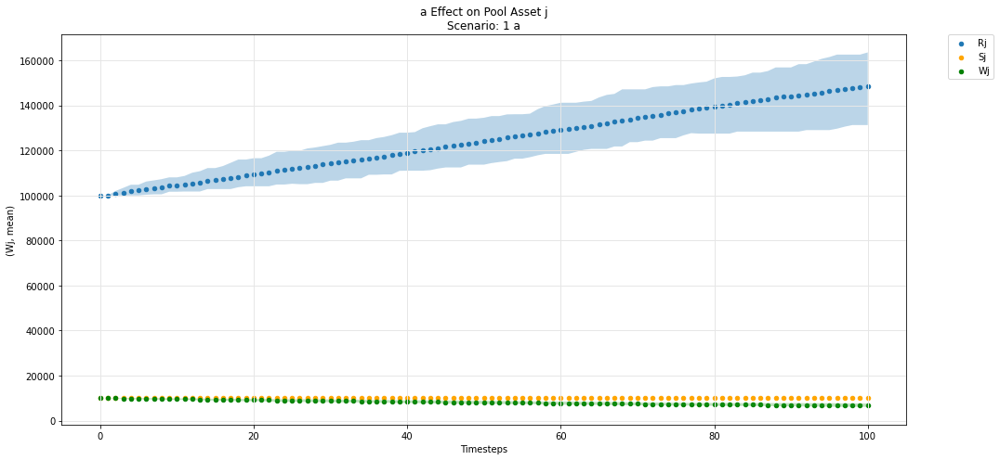

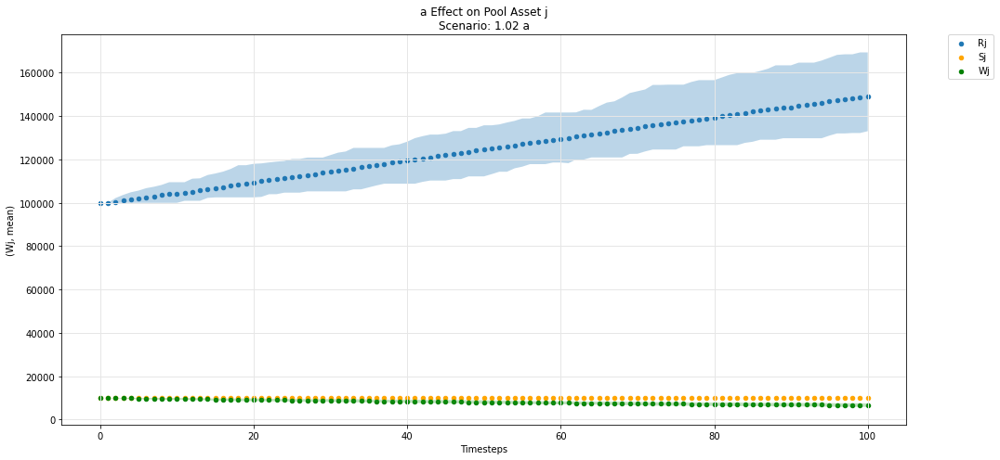

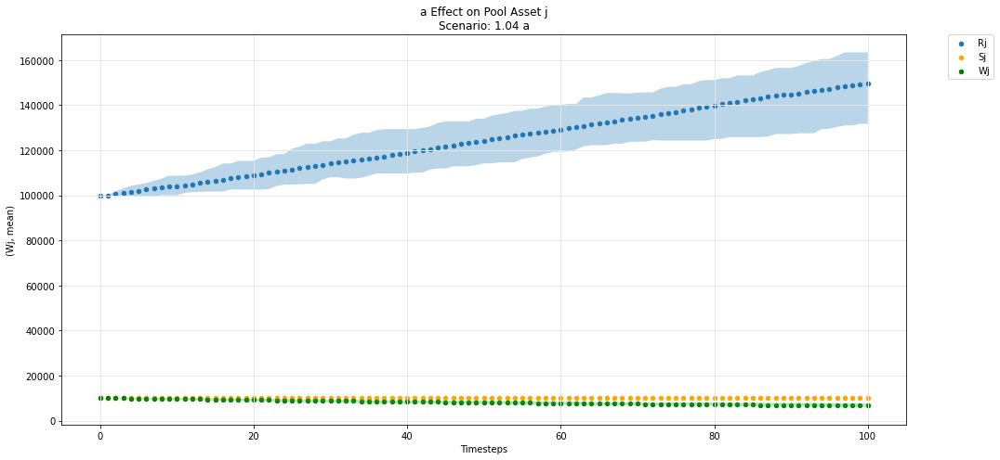

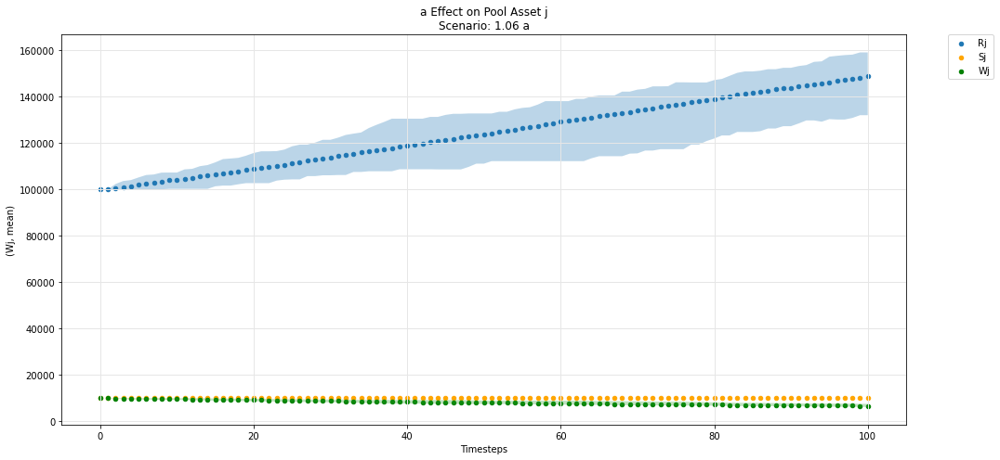

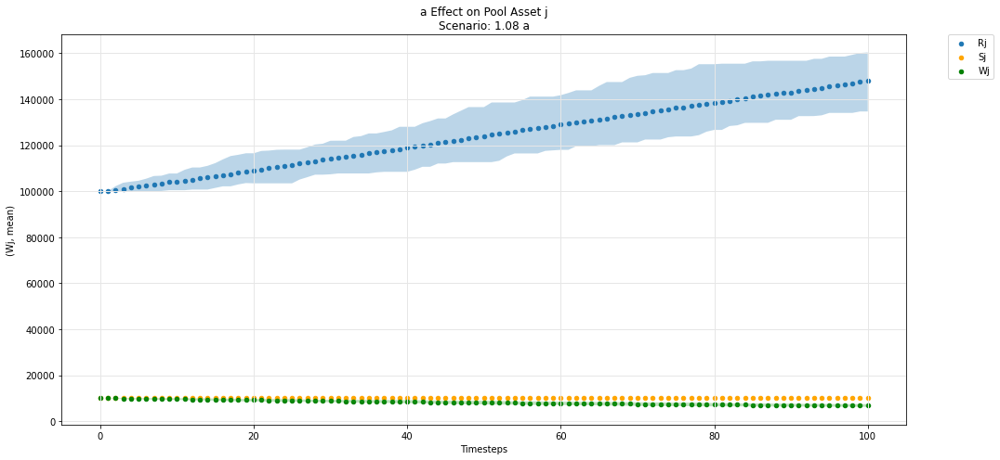

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

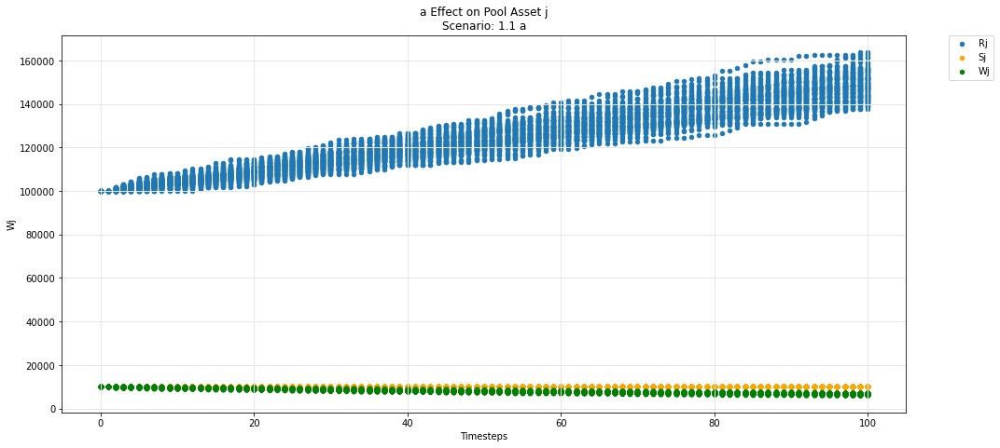

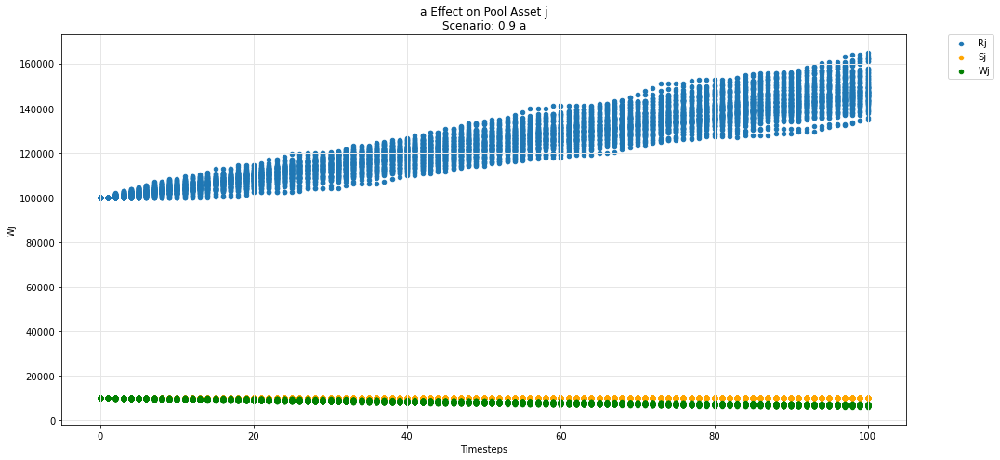

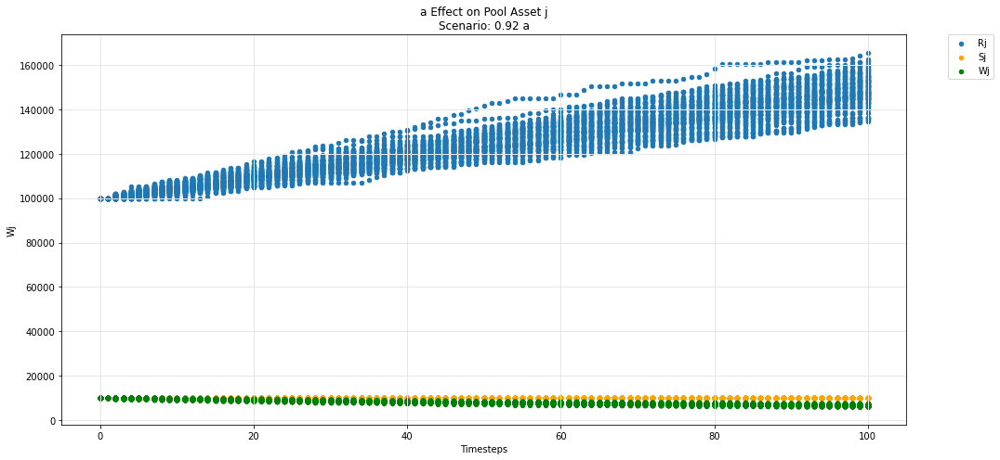

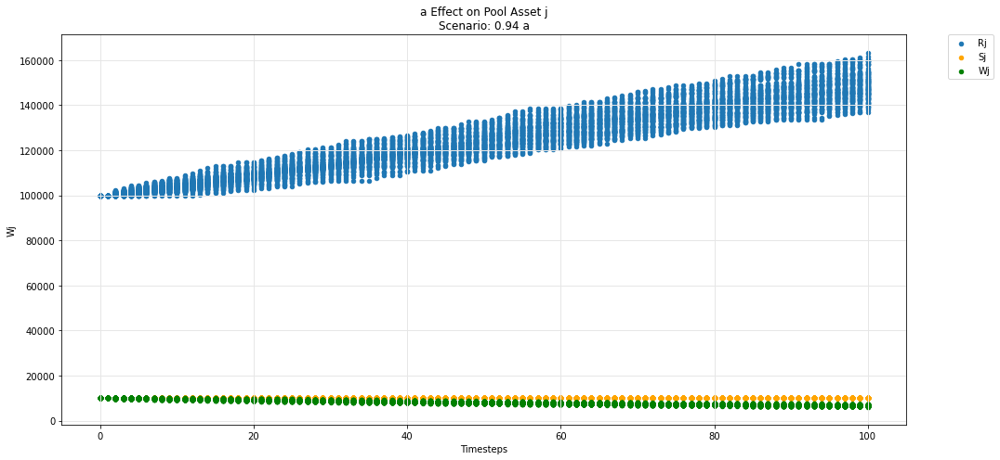

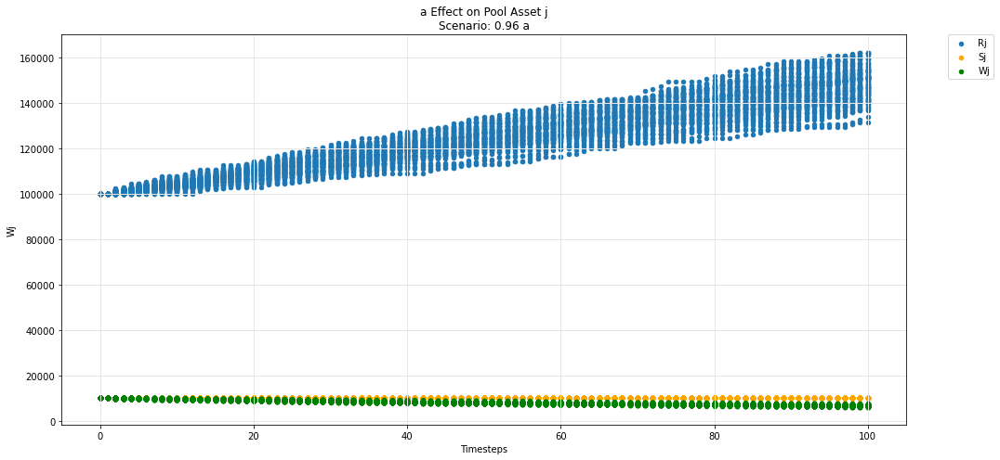

...

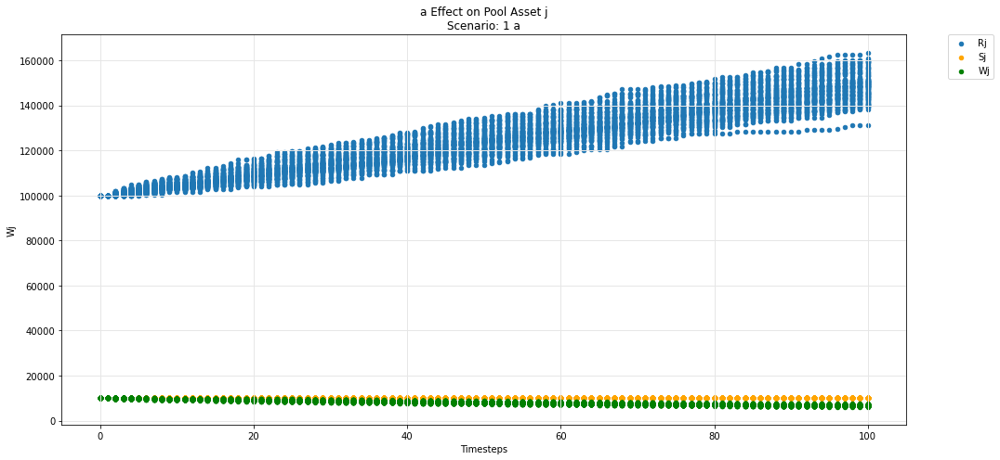

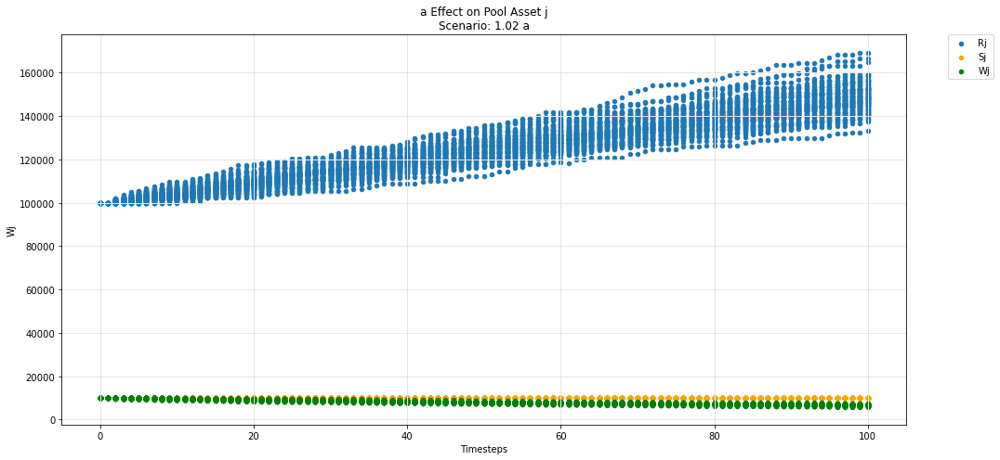

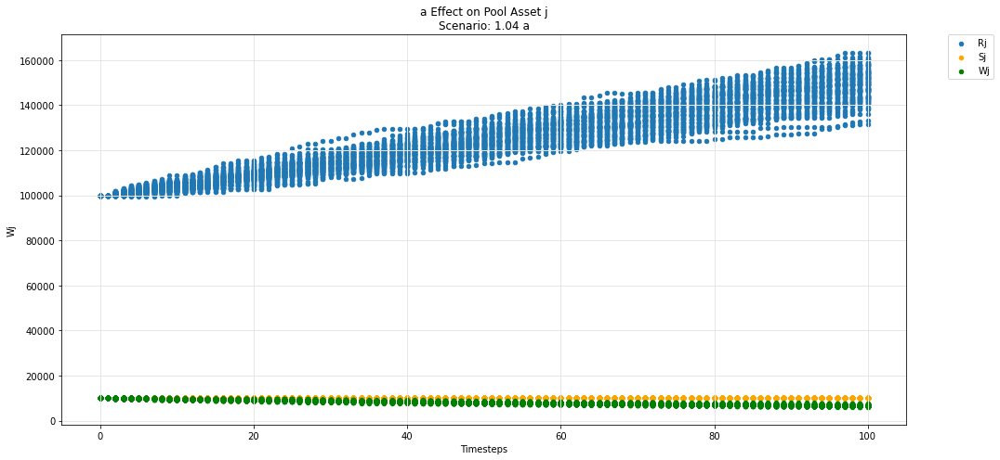

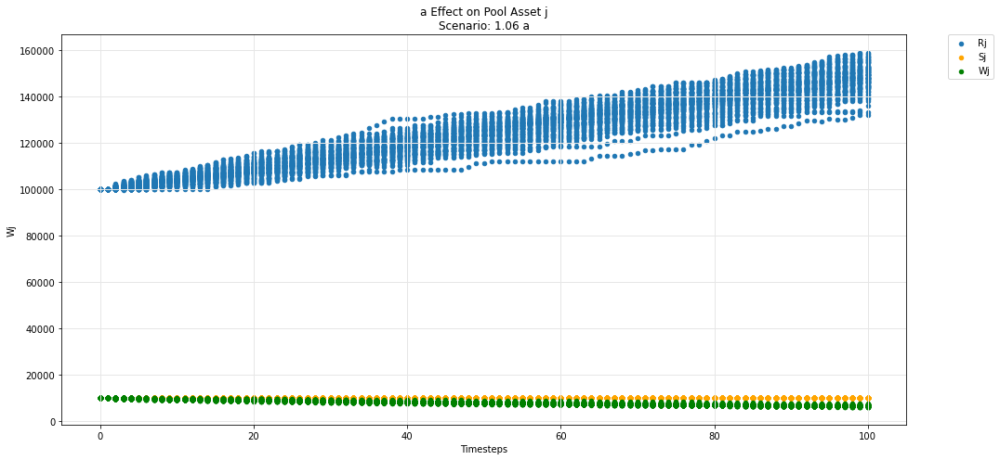

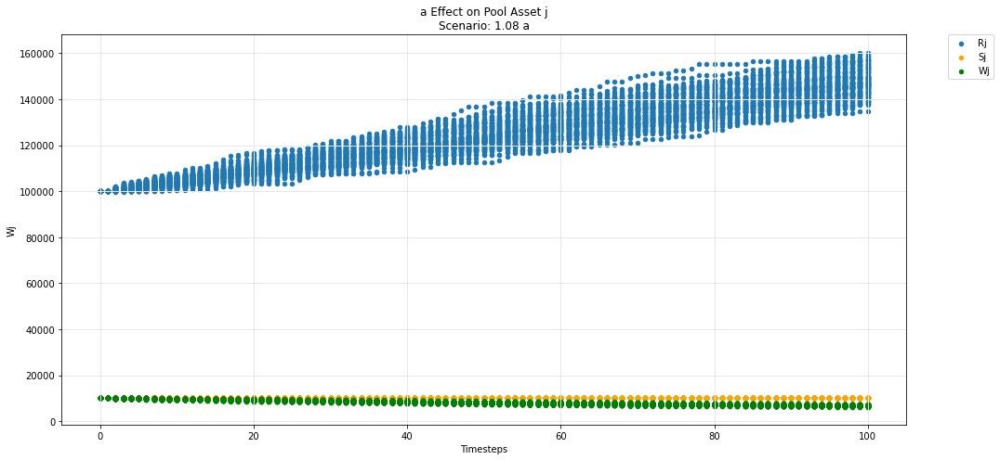

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

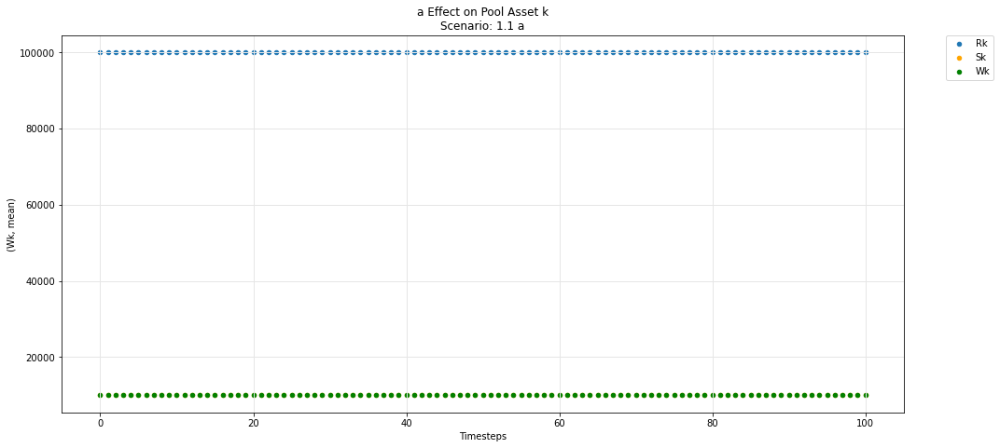

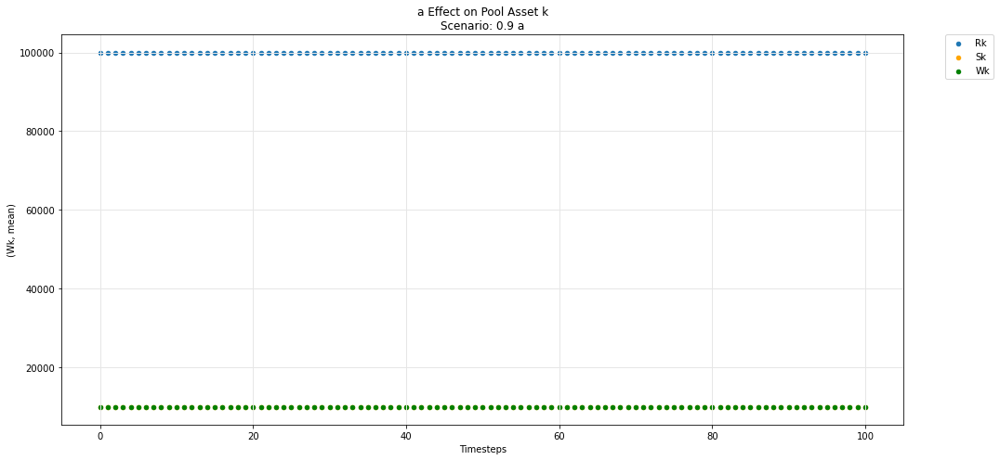

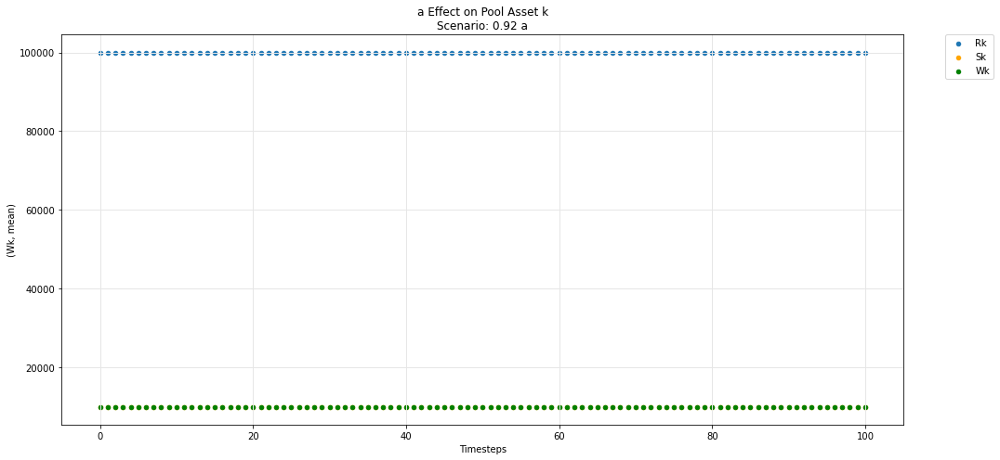

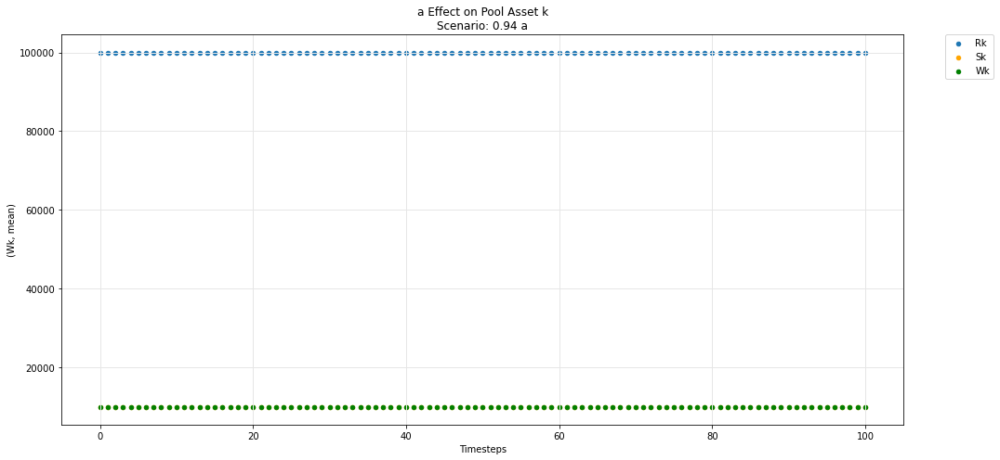

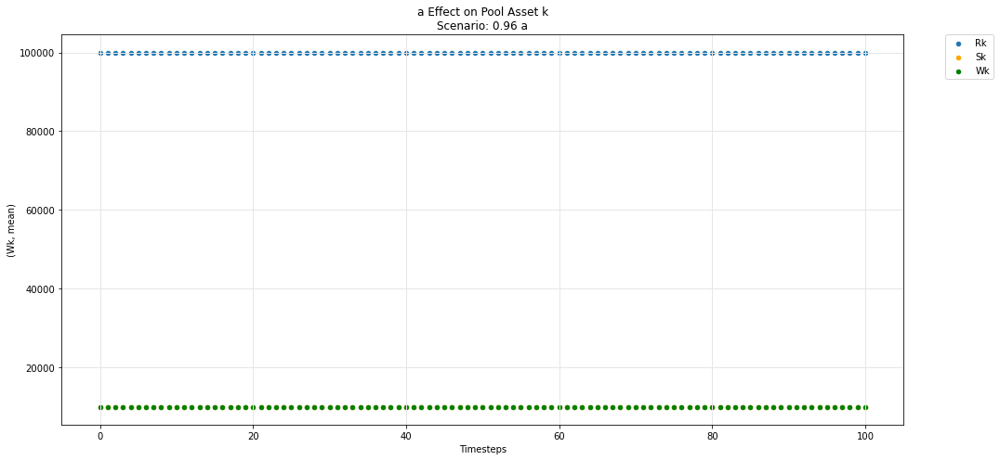

...

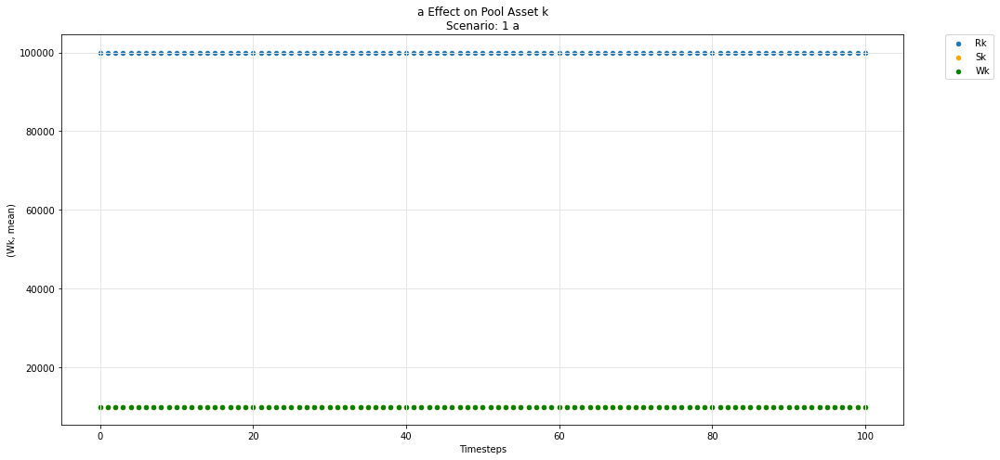

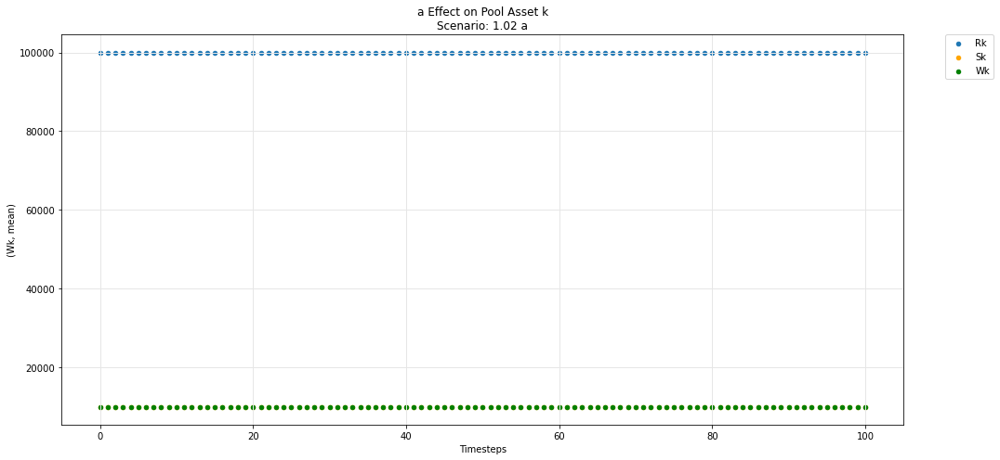

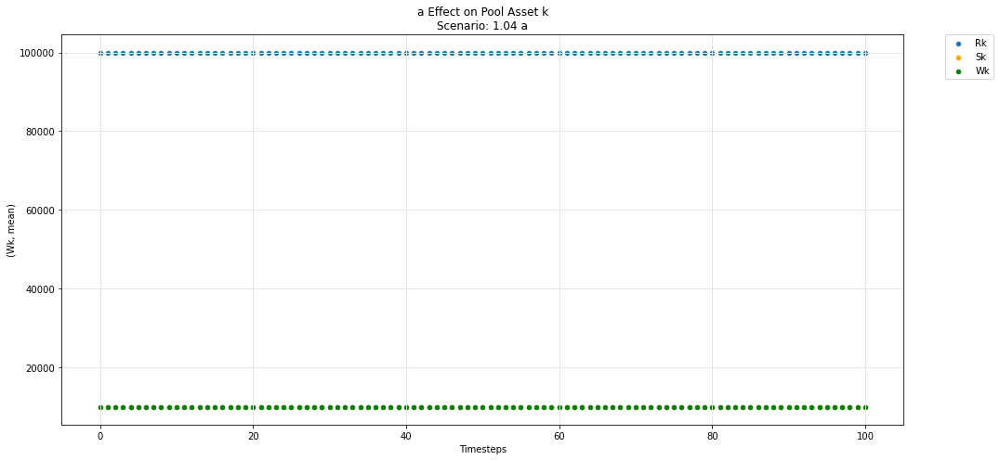

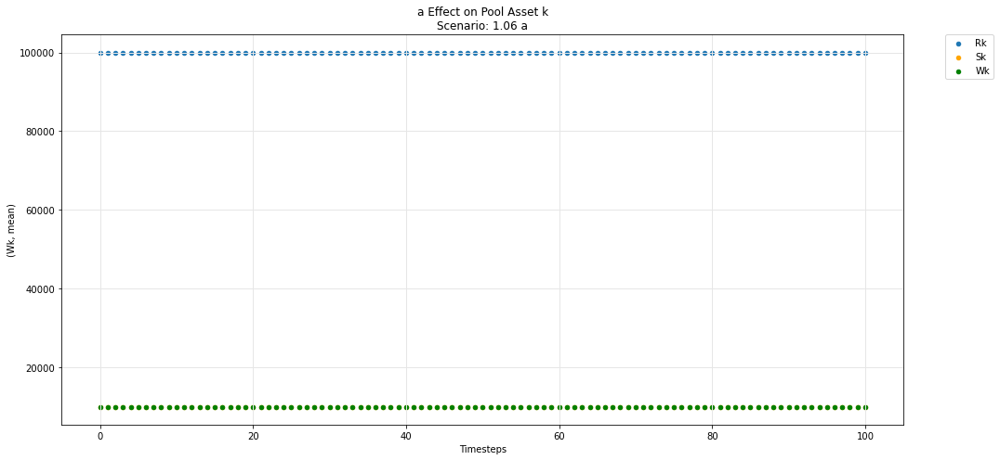

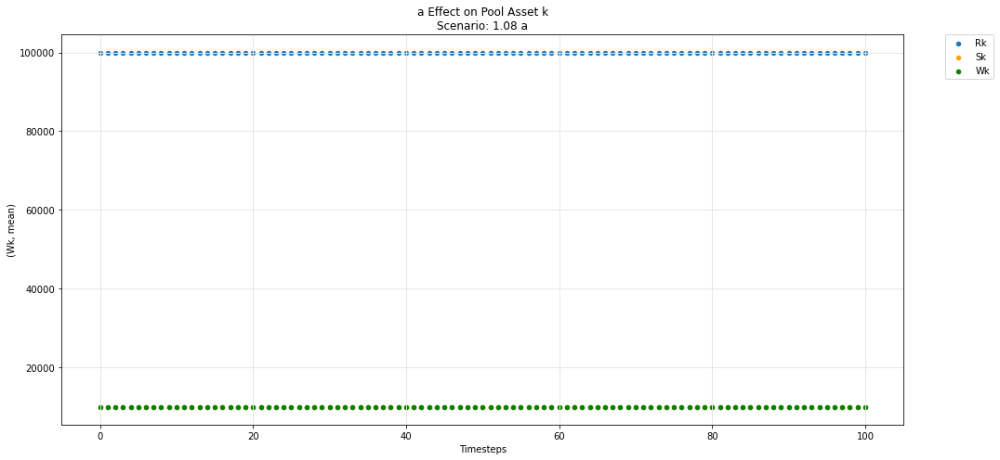

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

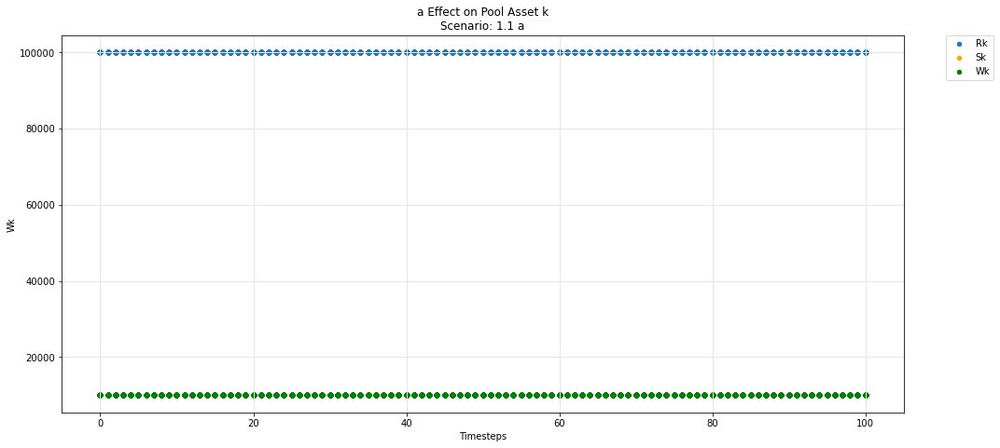

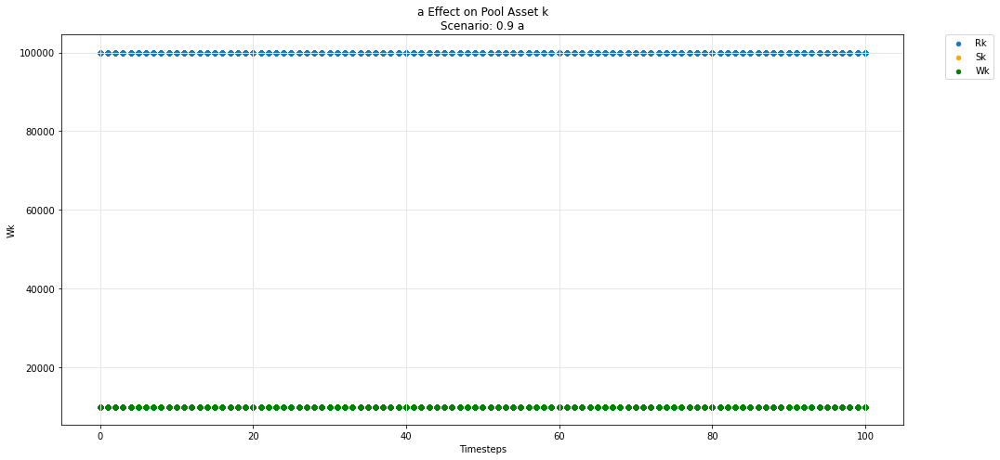

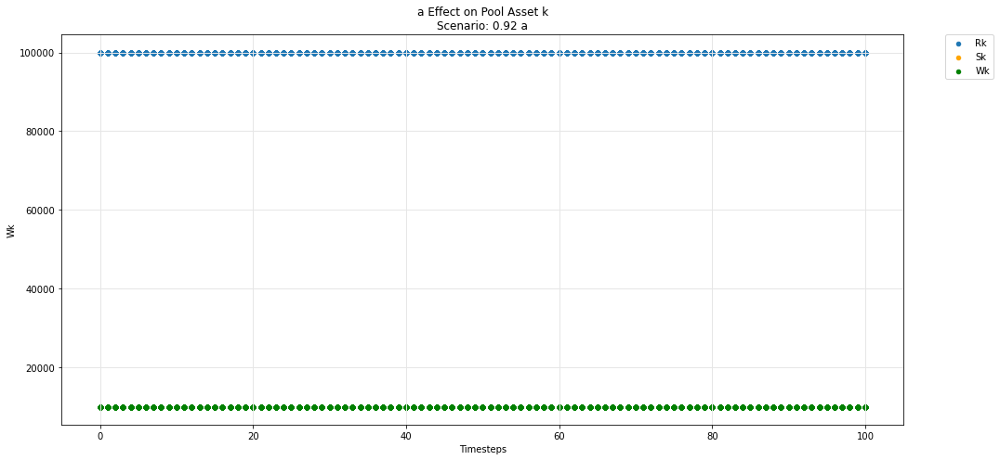

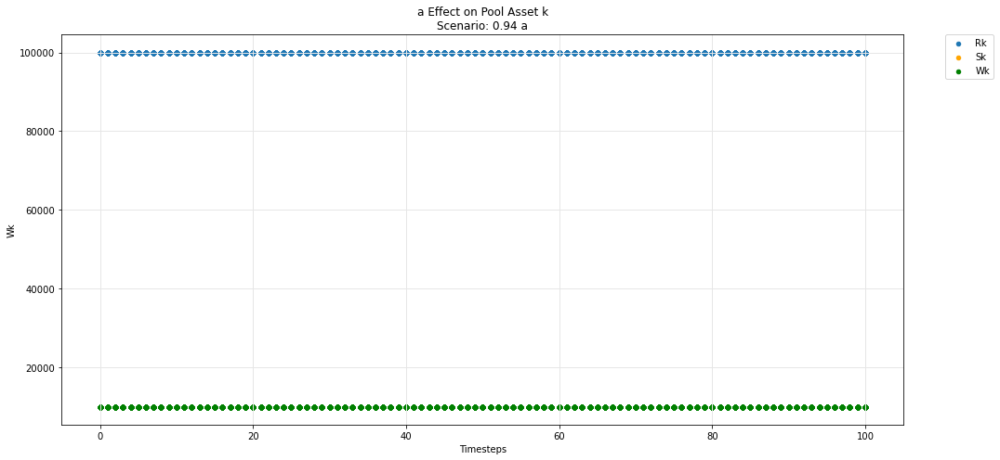

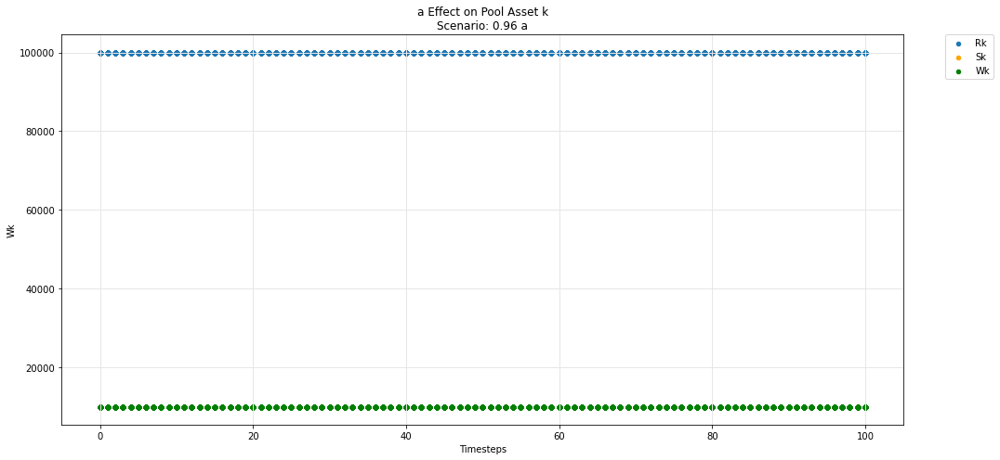

...

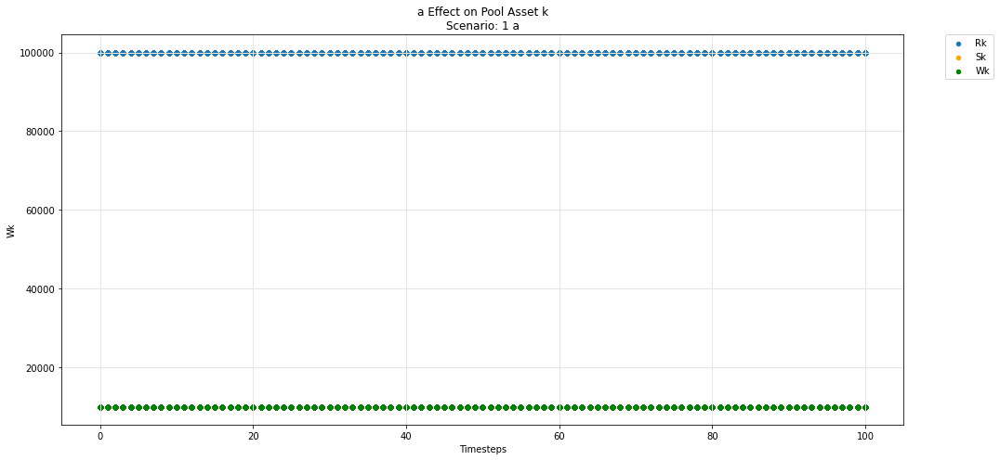

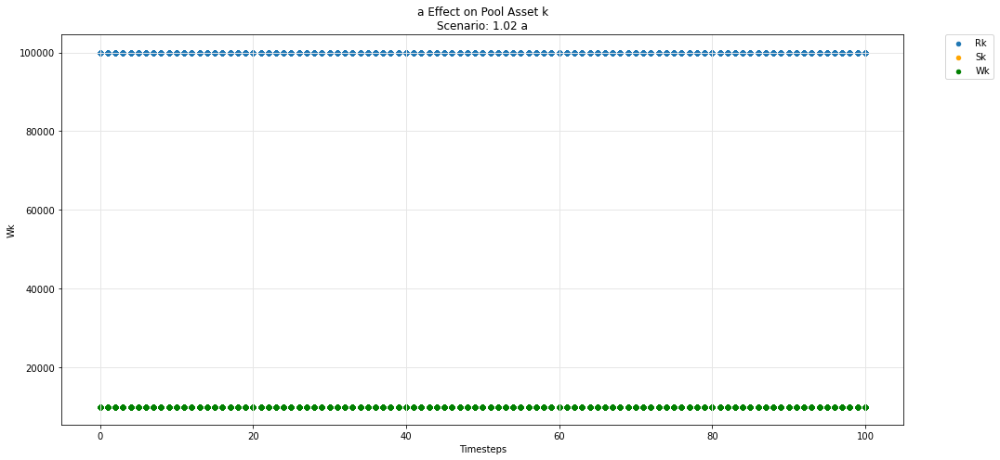

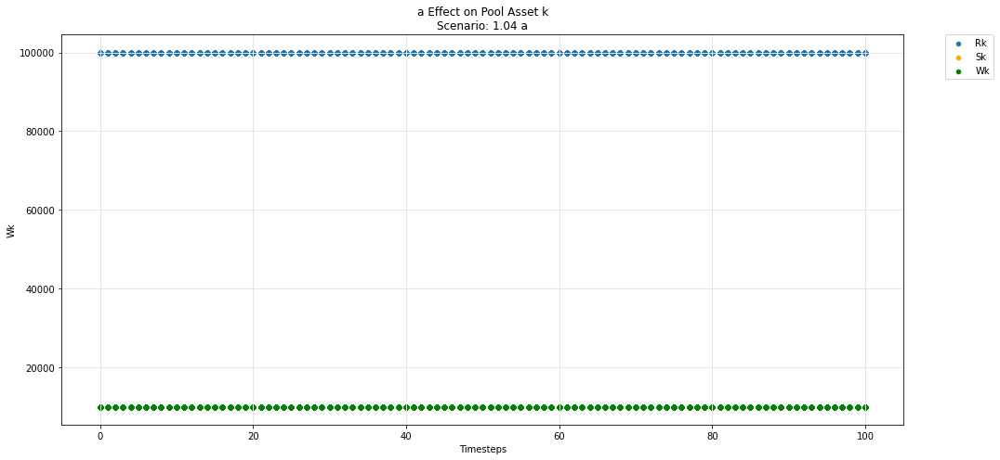

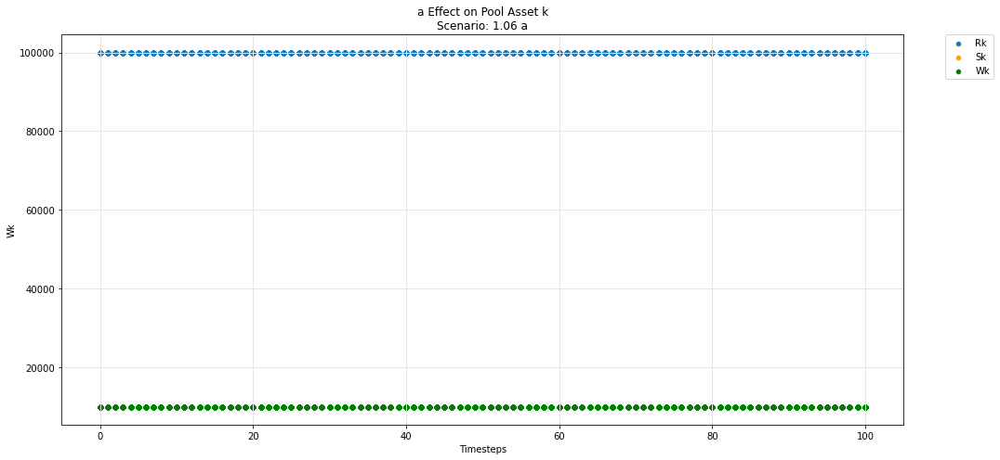

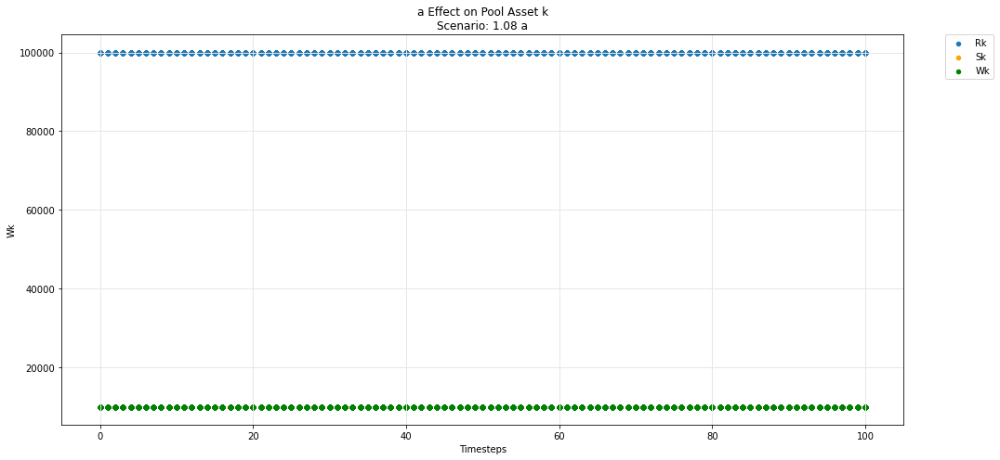

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

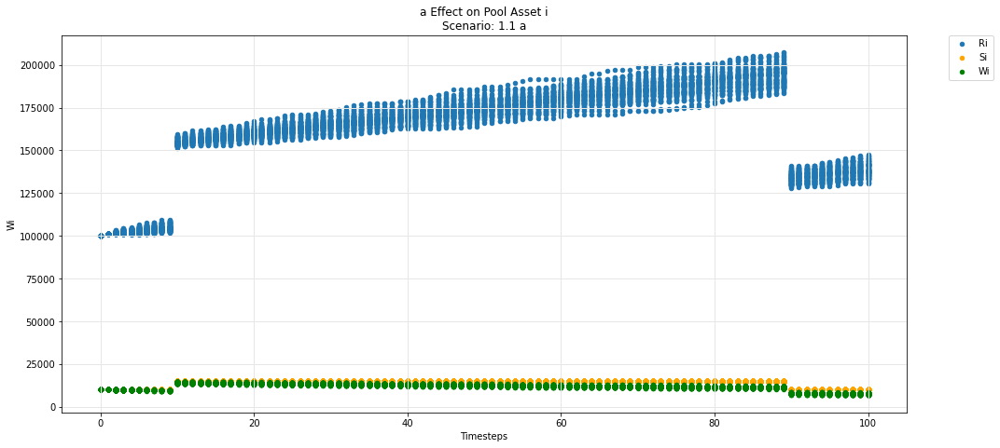

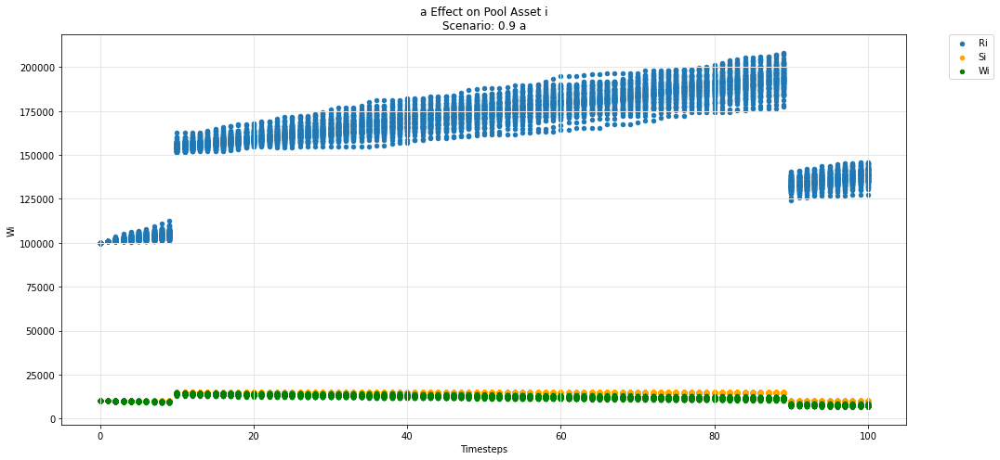

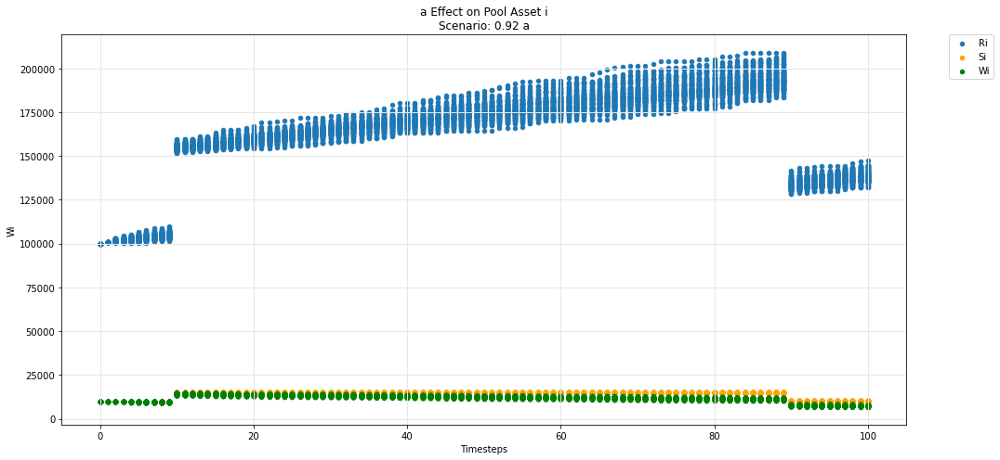

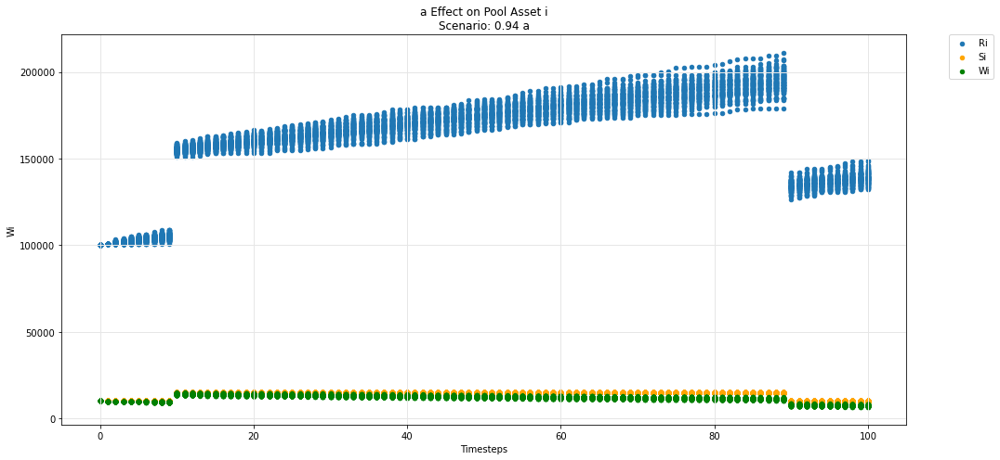

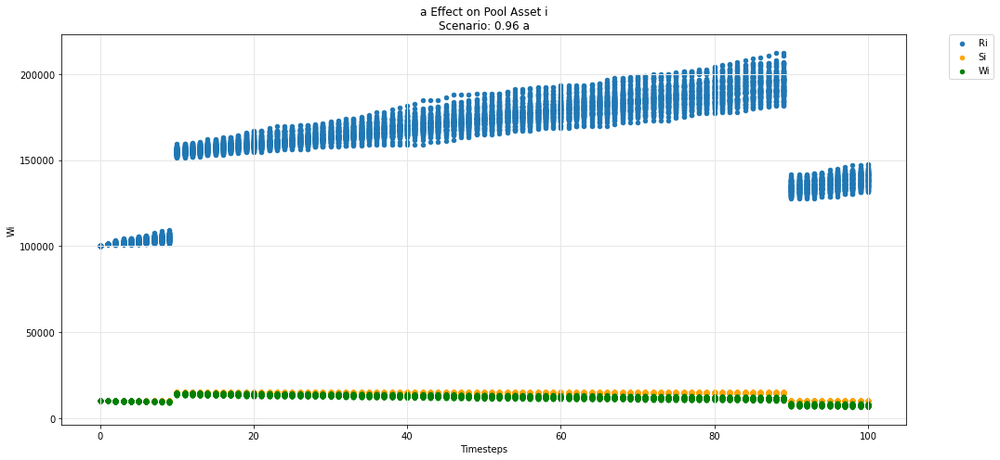

...

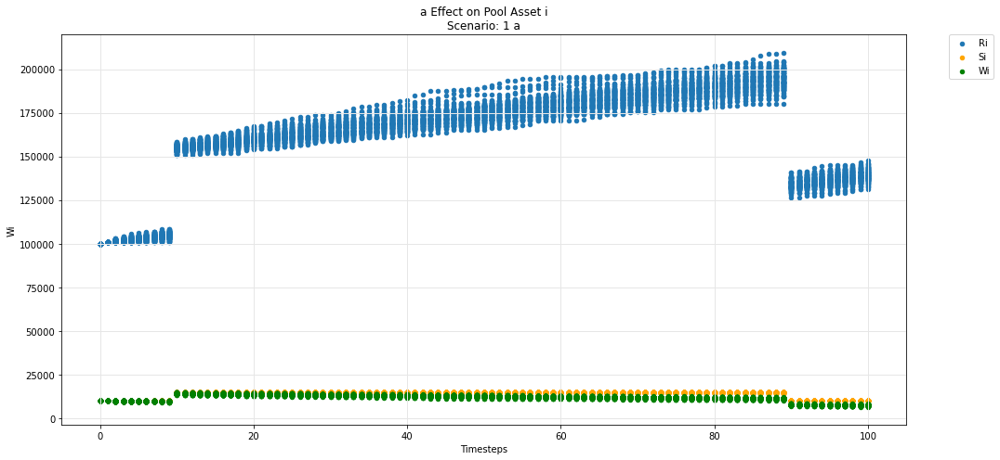

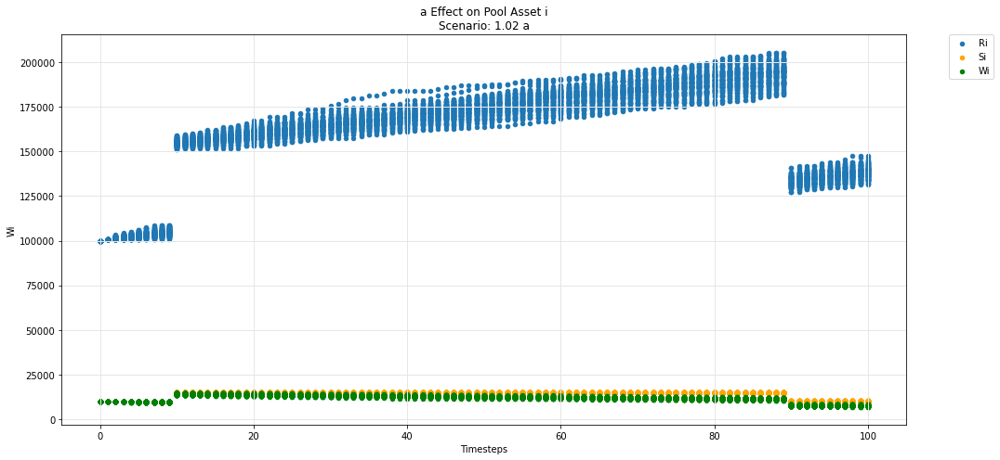

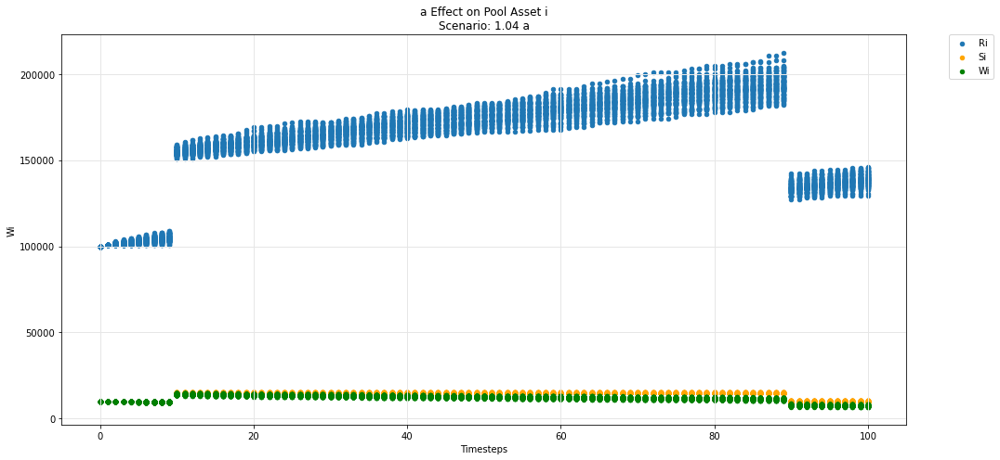

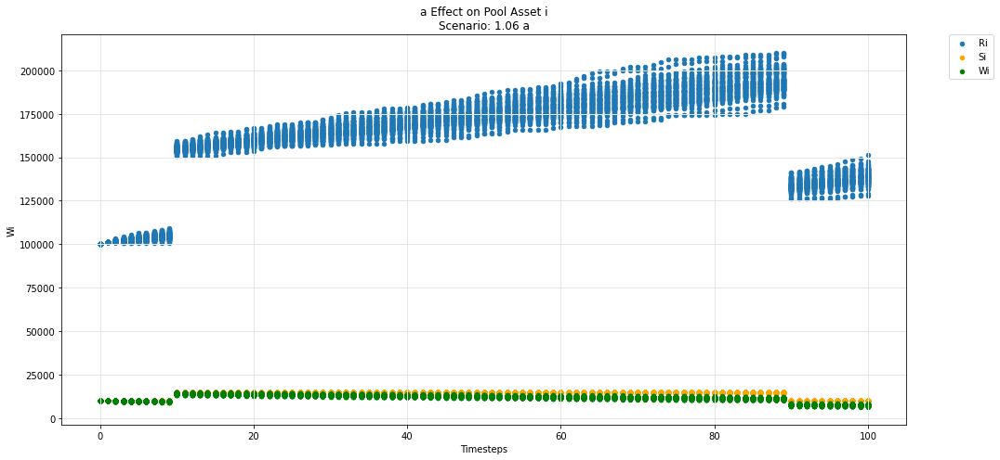

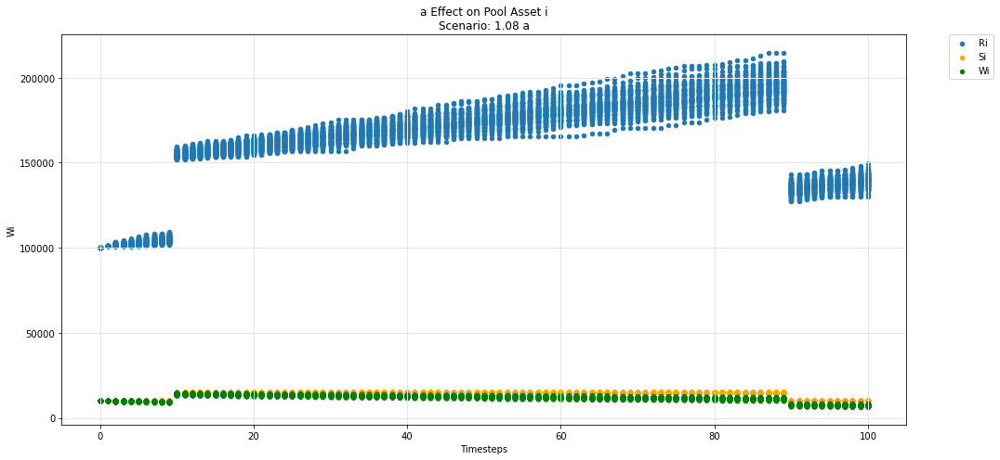

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

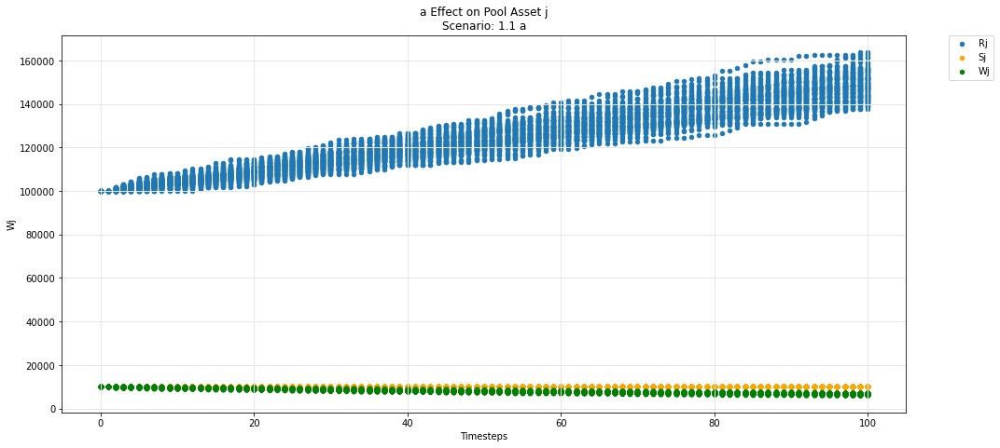

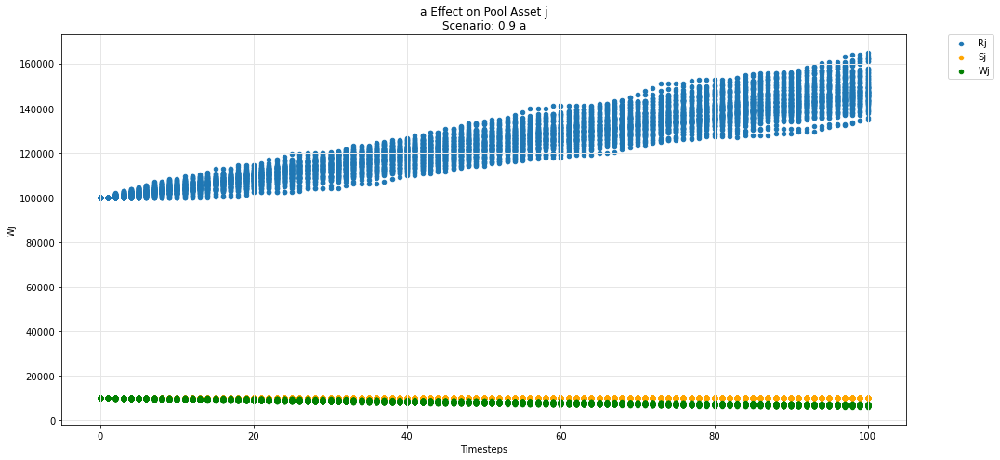

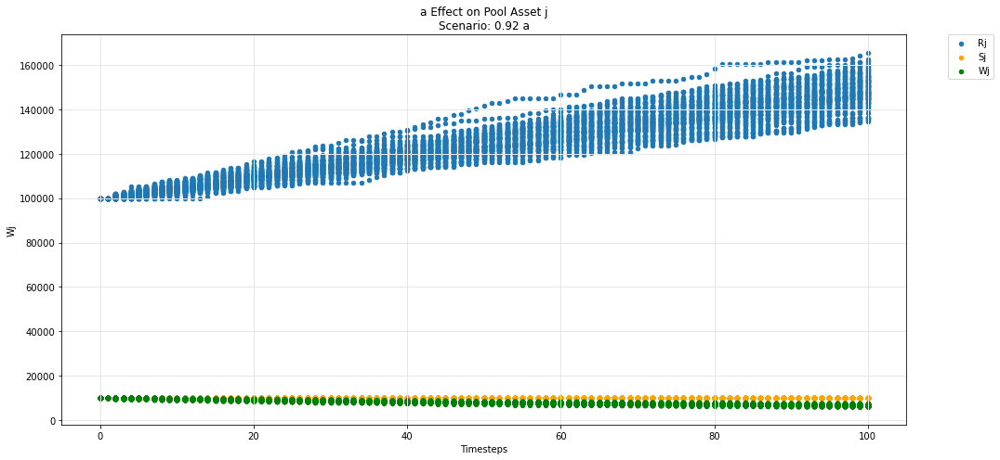

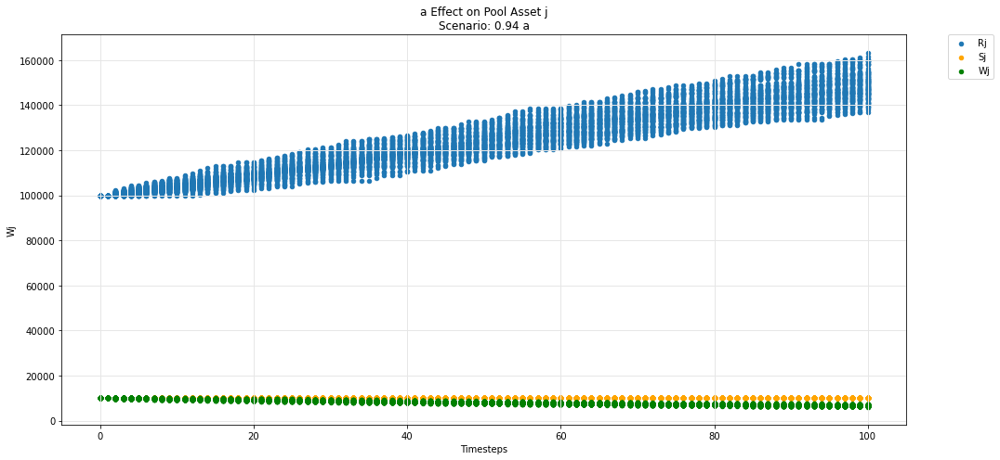

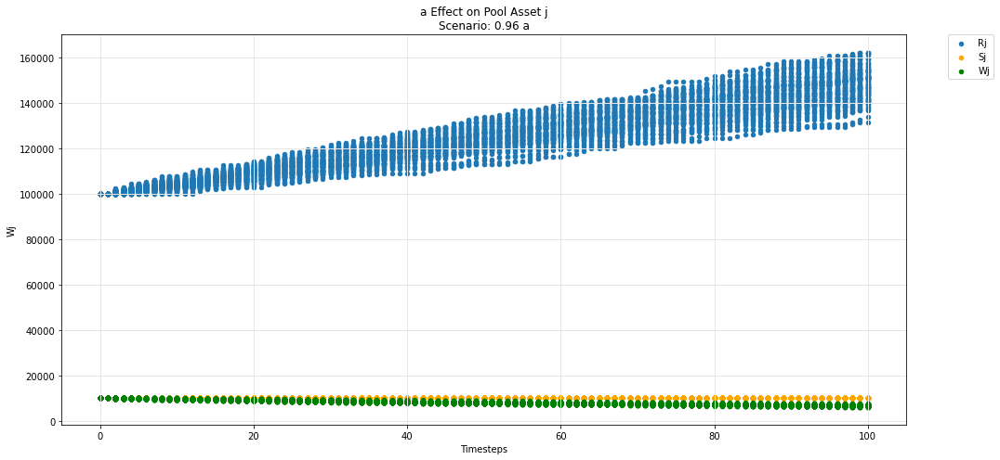

...

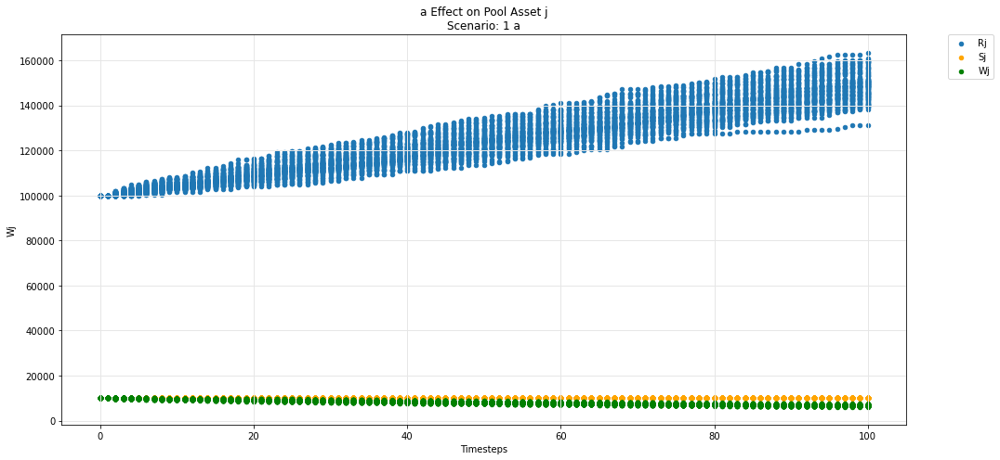

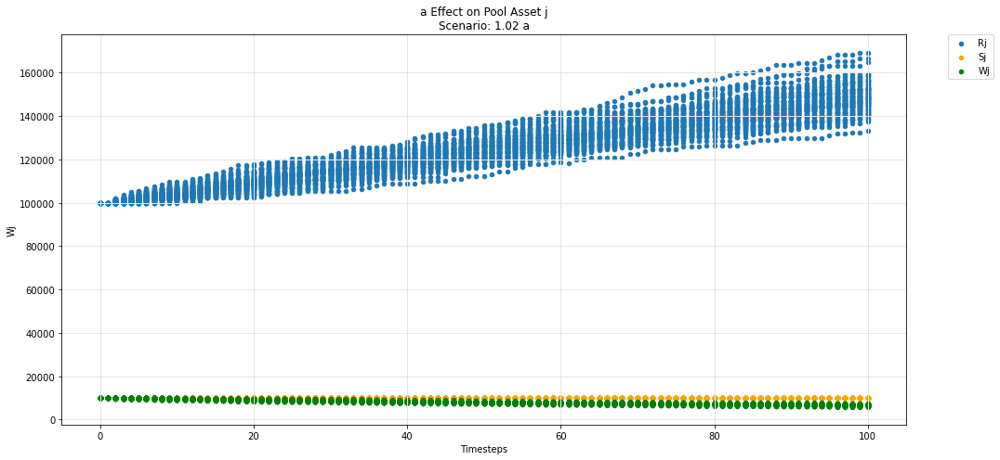

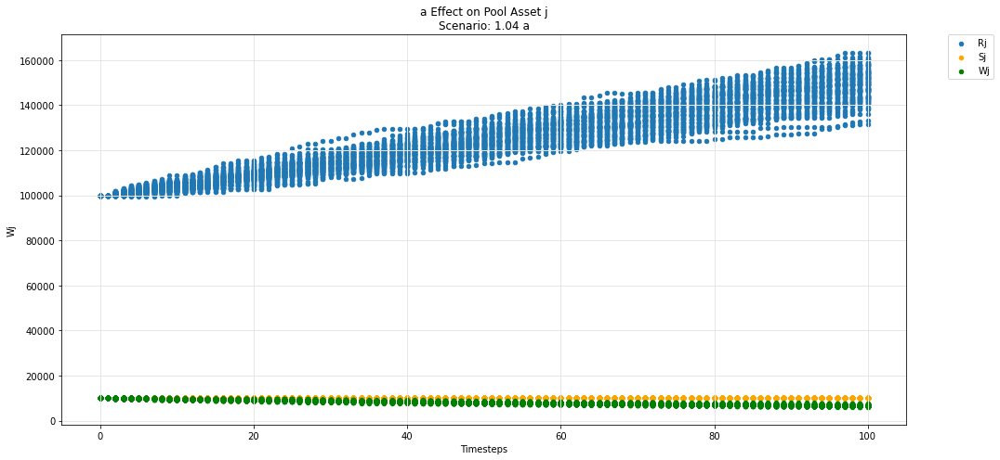

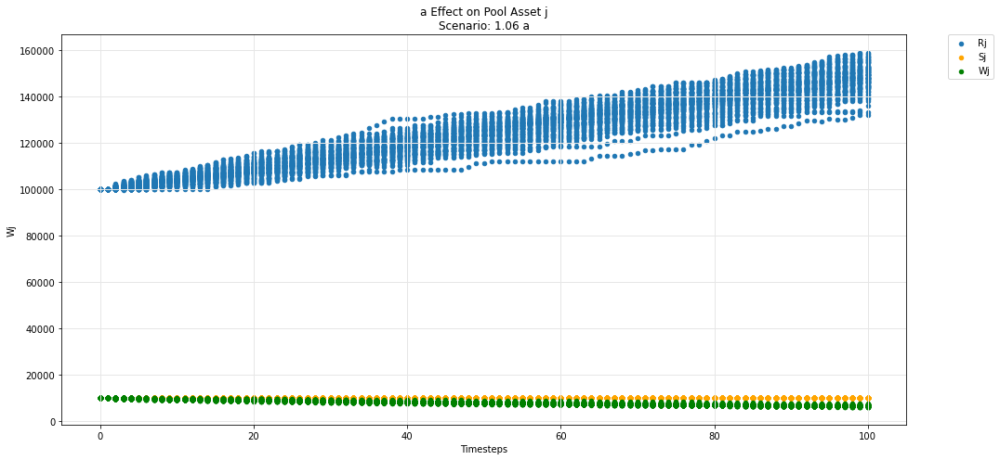

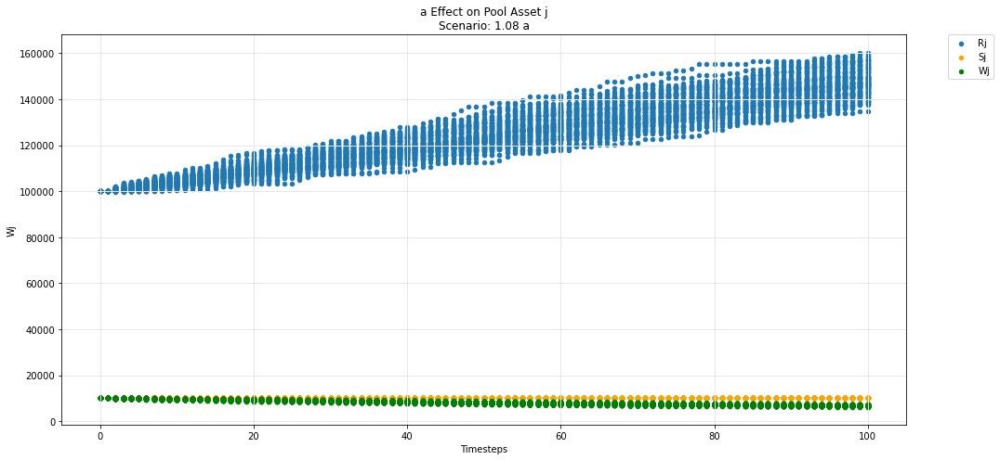

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

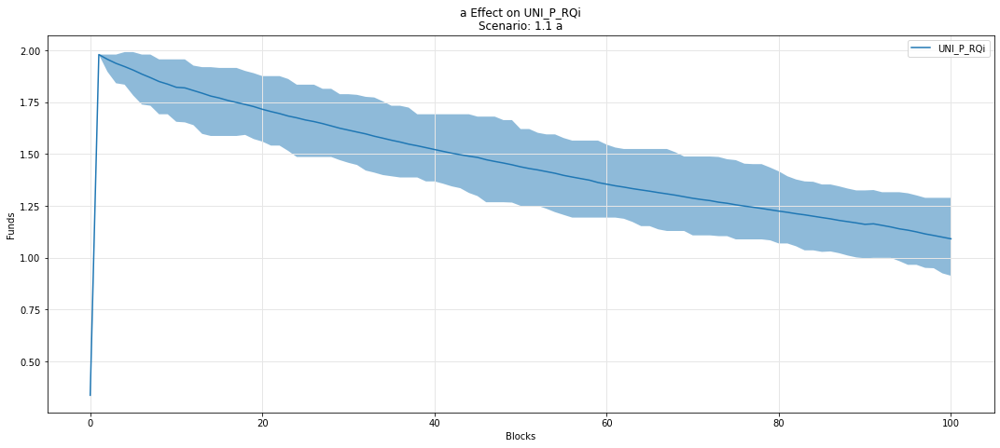

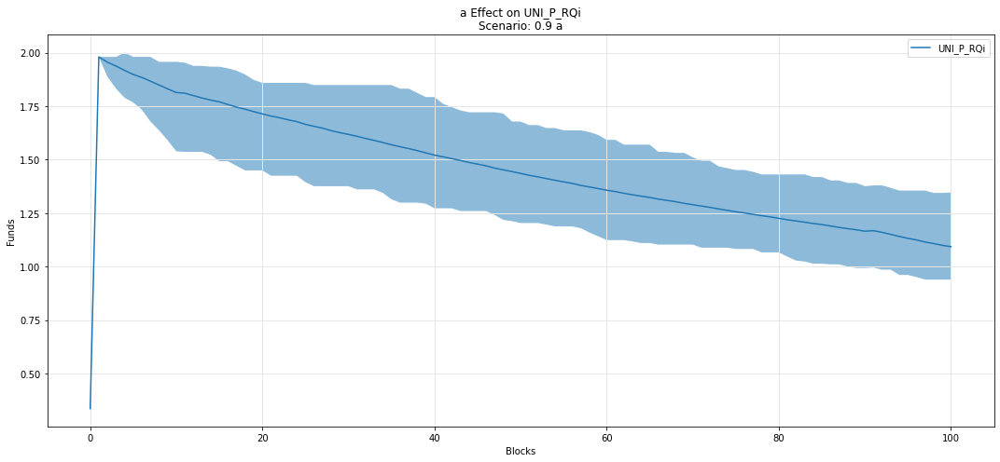

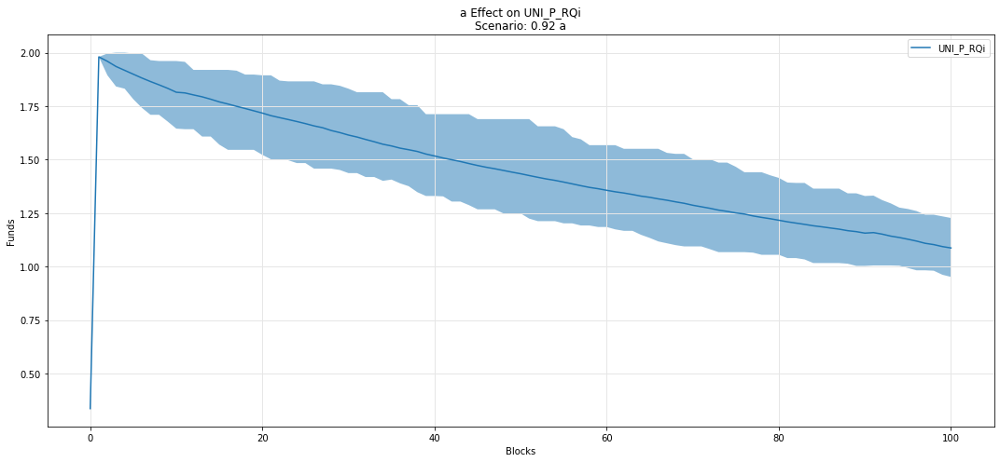

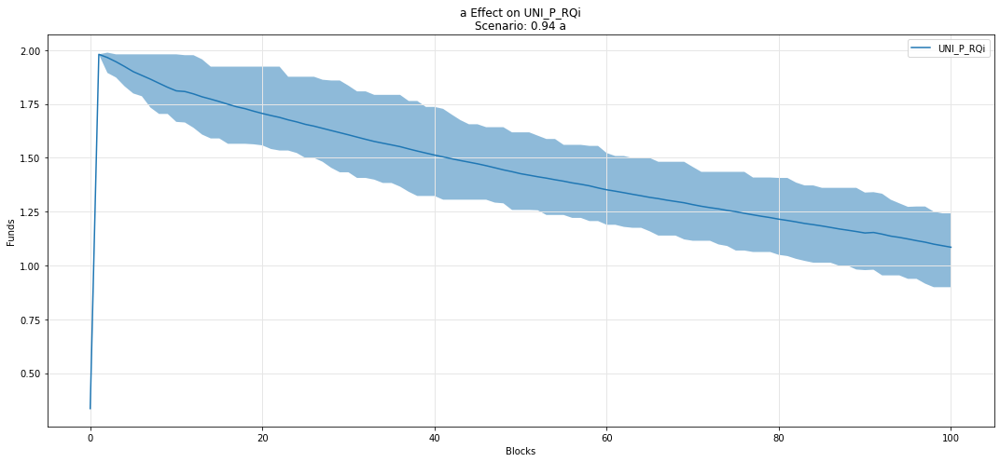

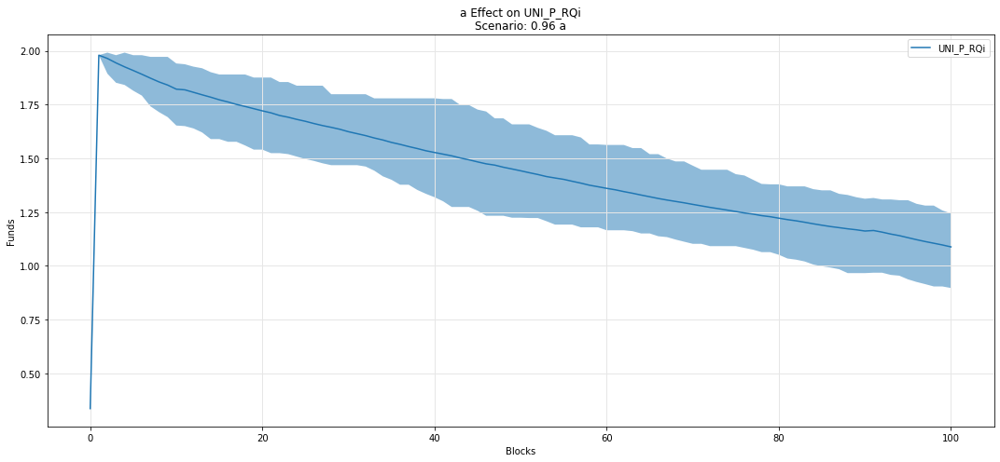

...

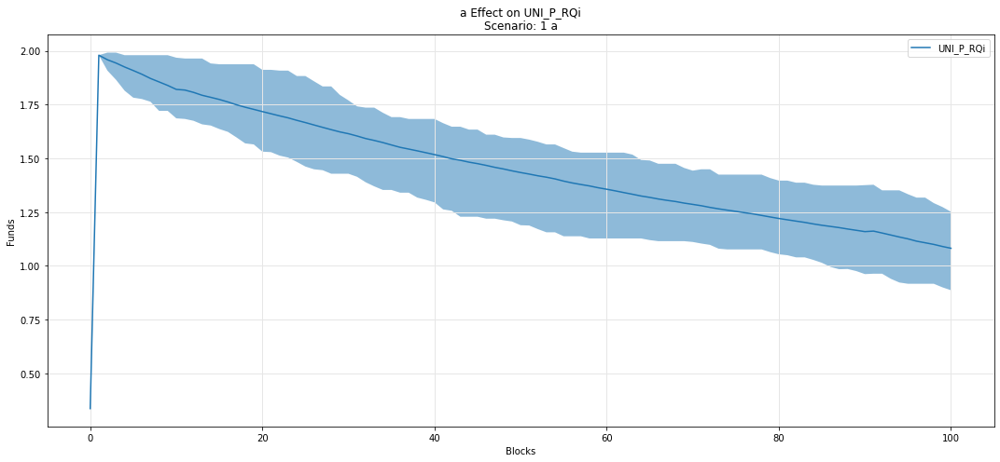

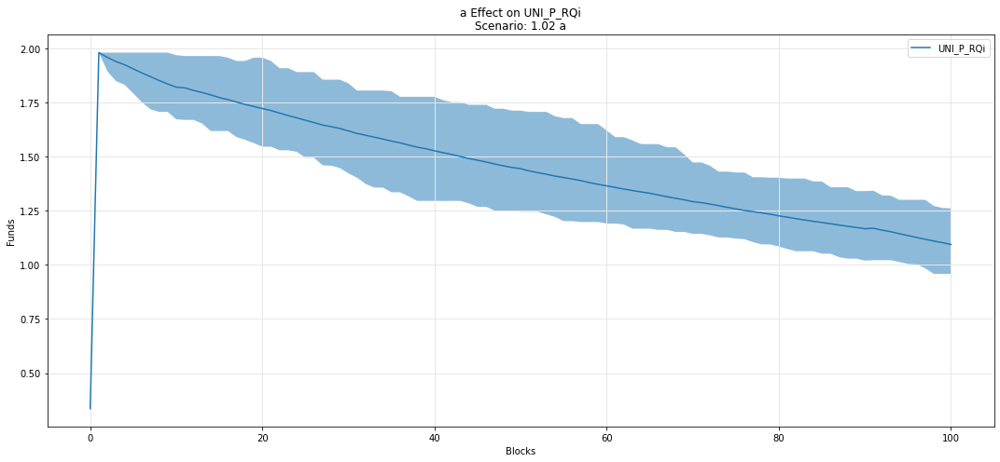

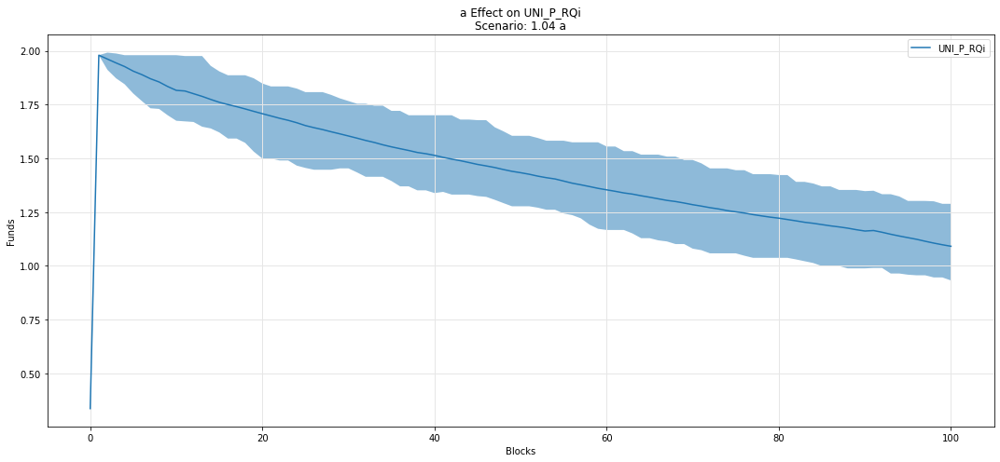

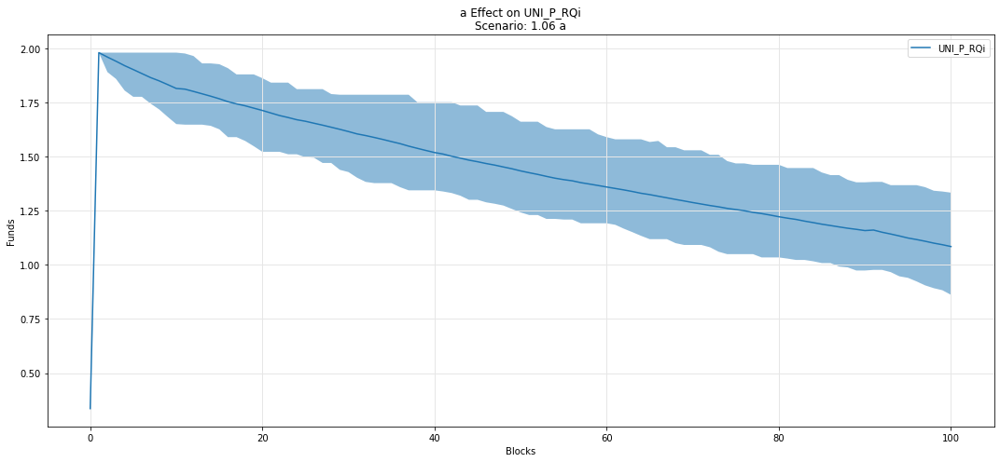

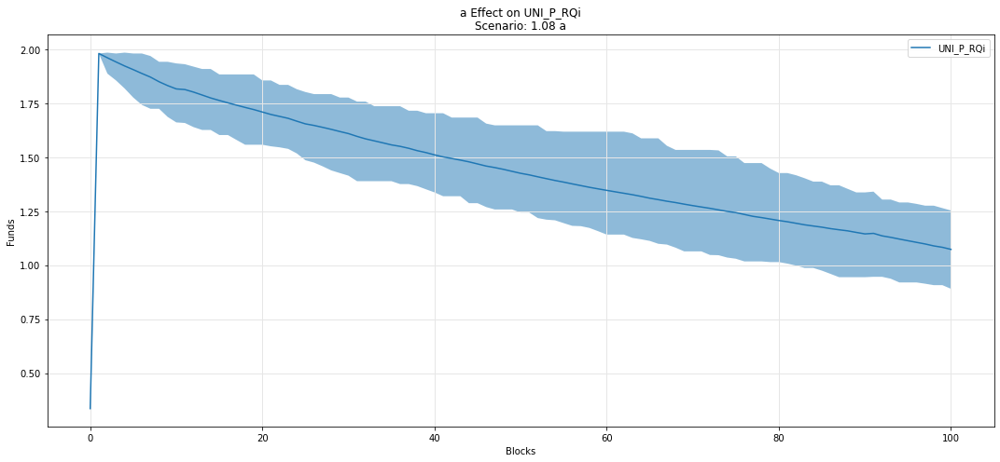

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

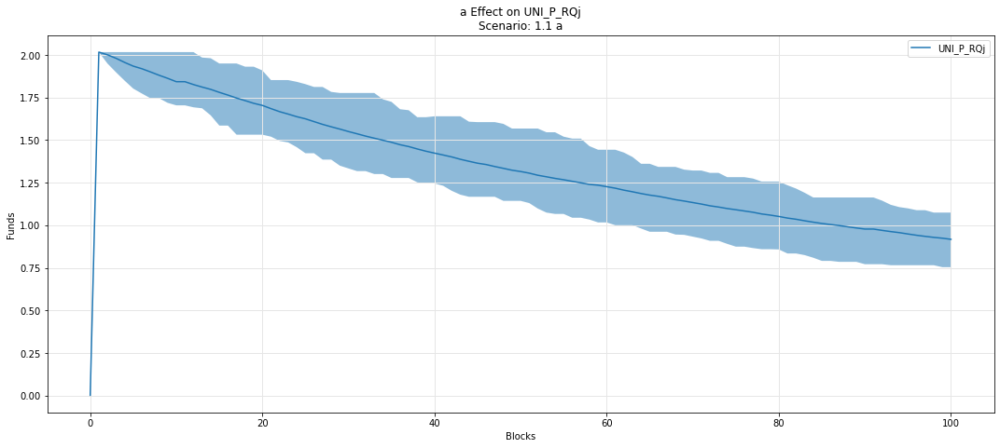

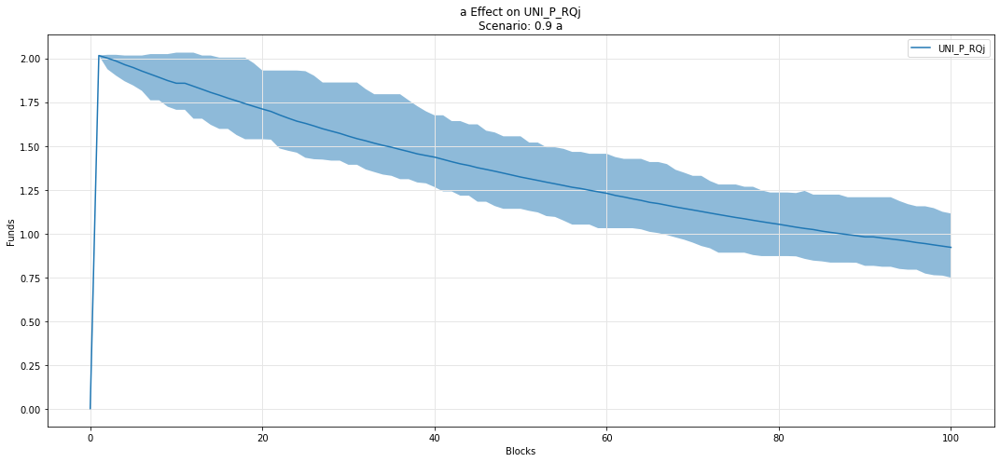

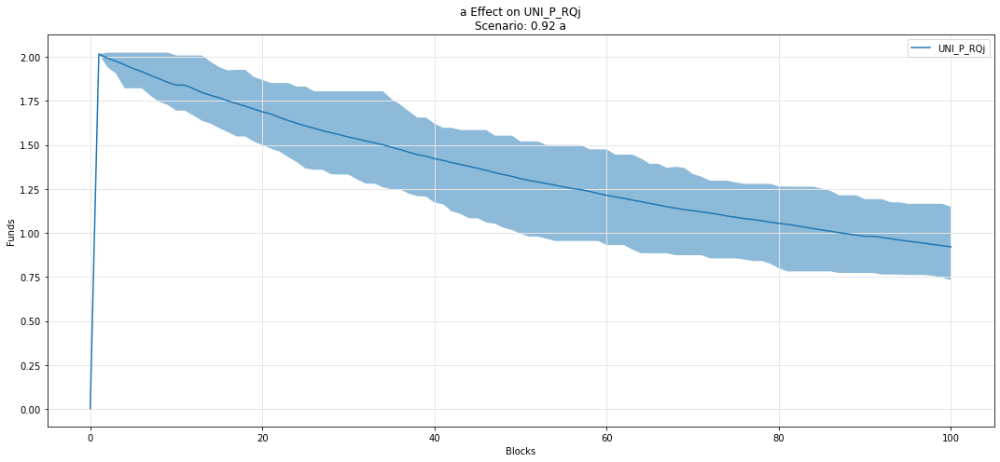

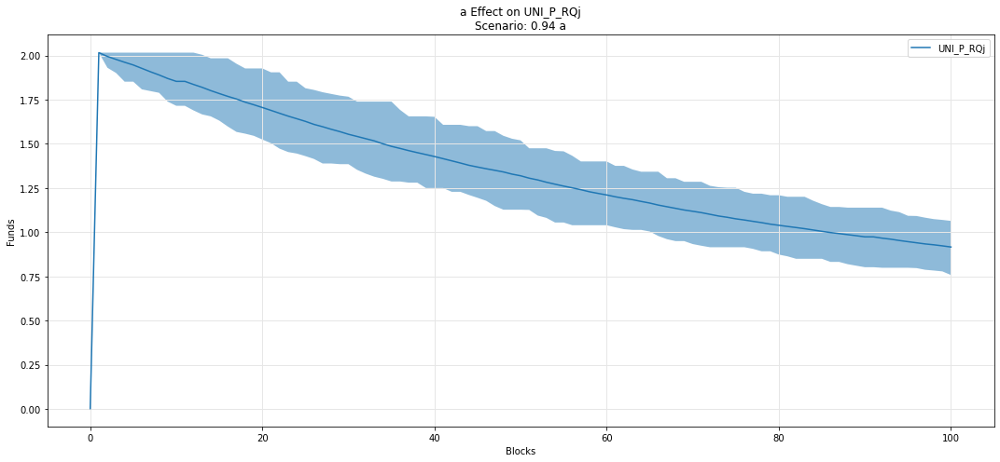

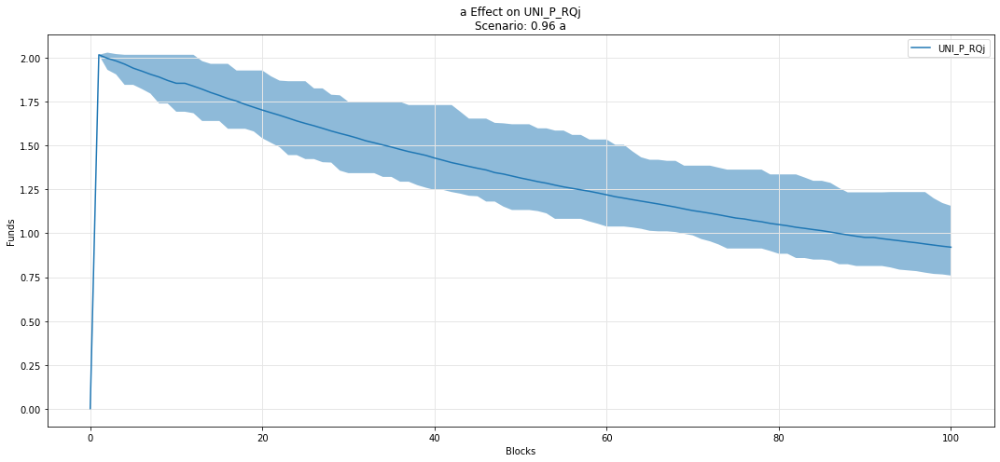

...

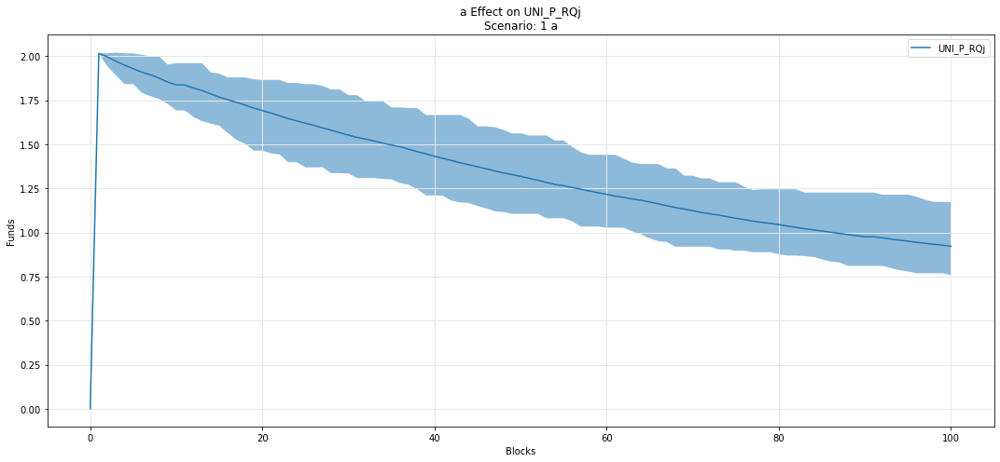

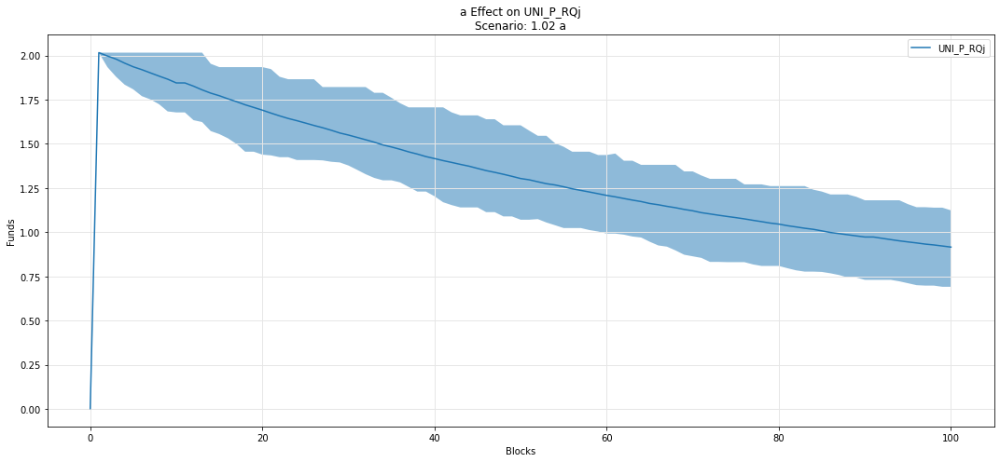

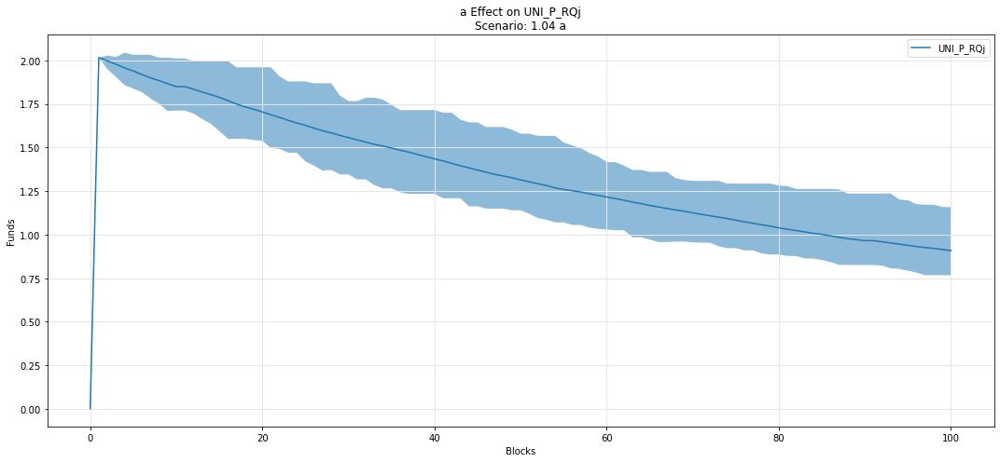

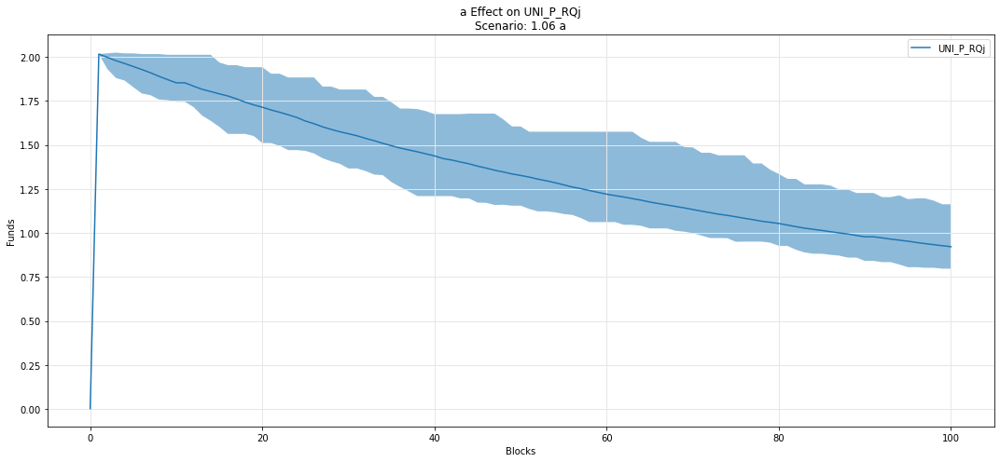

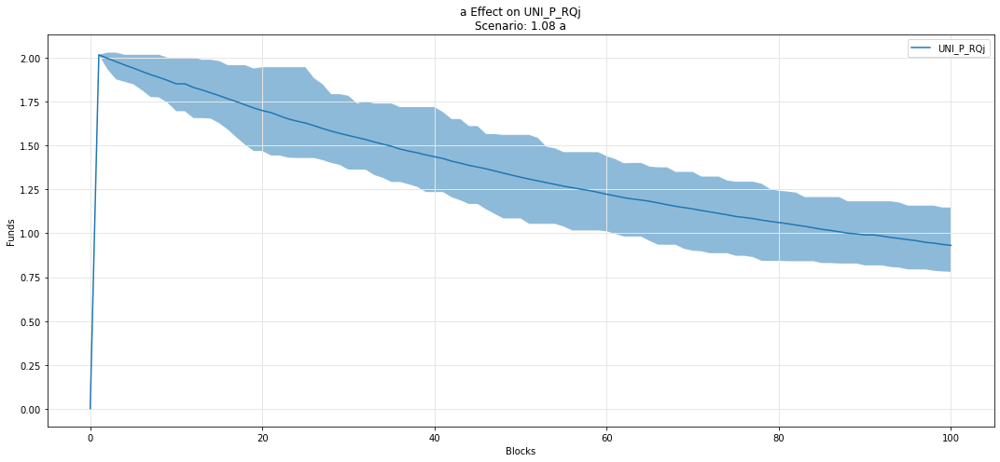

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

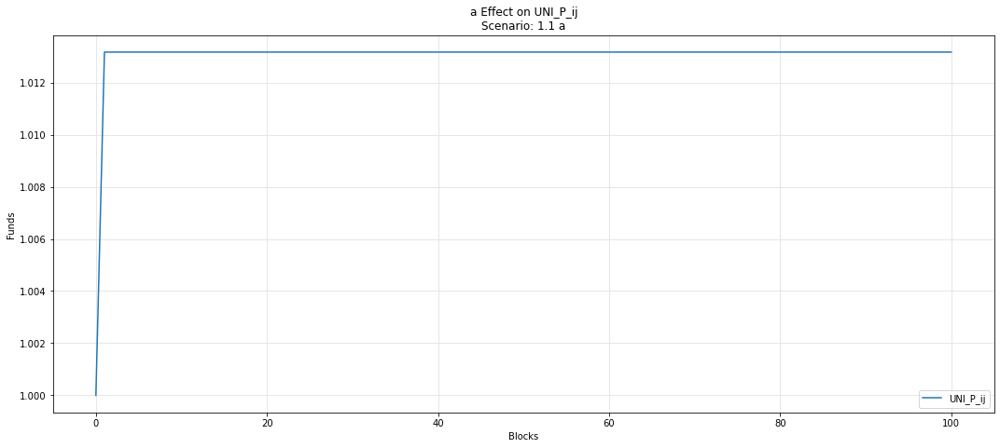

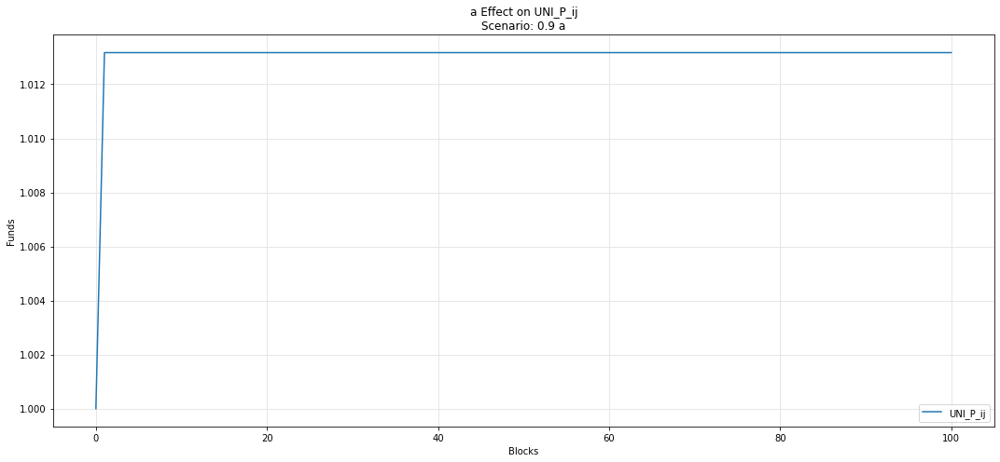

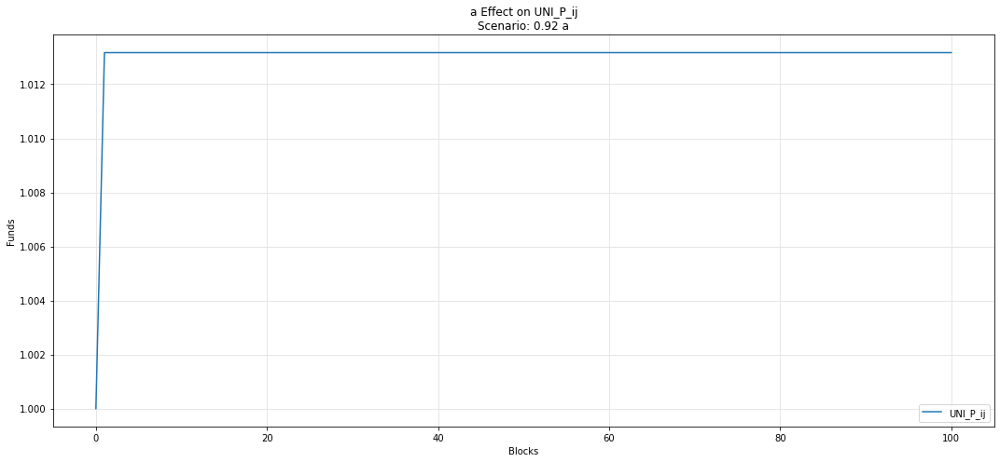

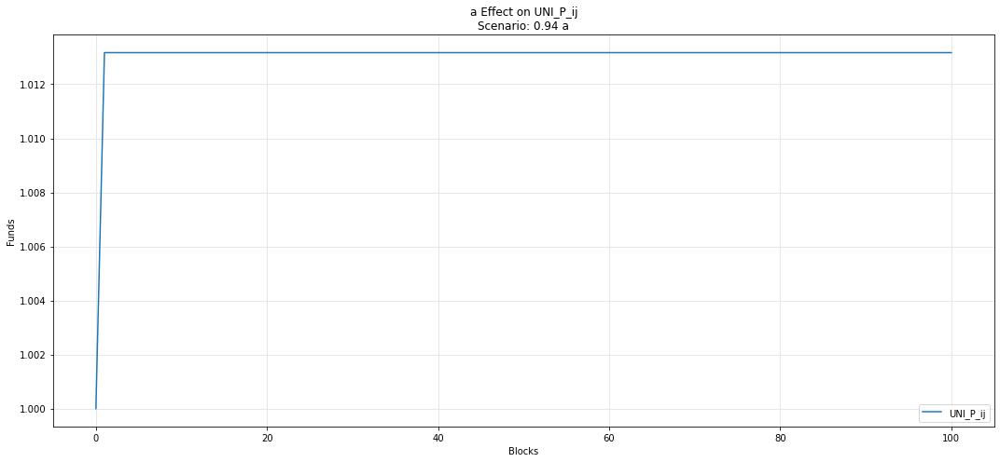

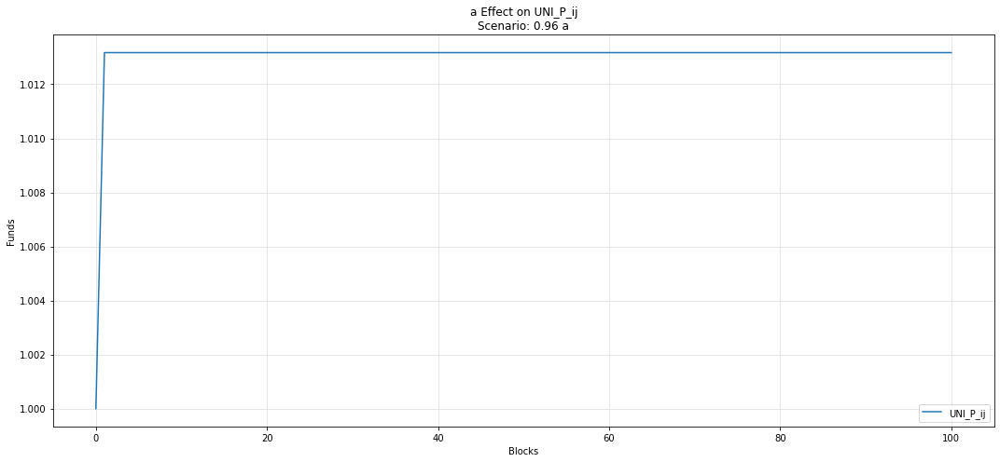

...

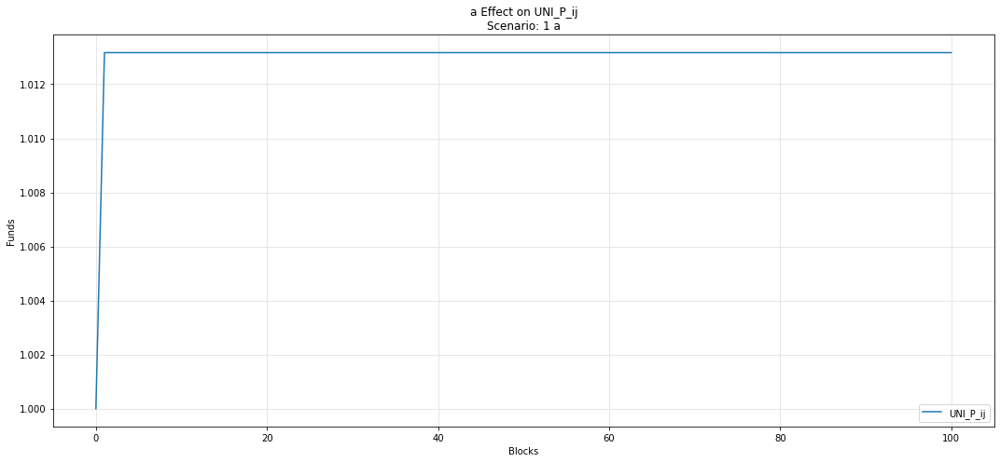

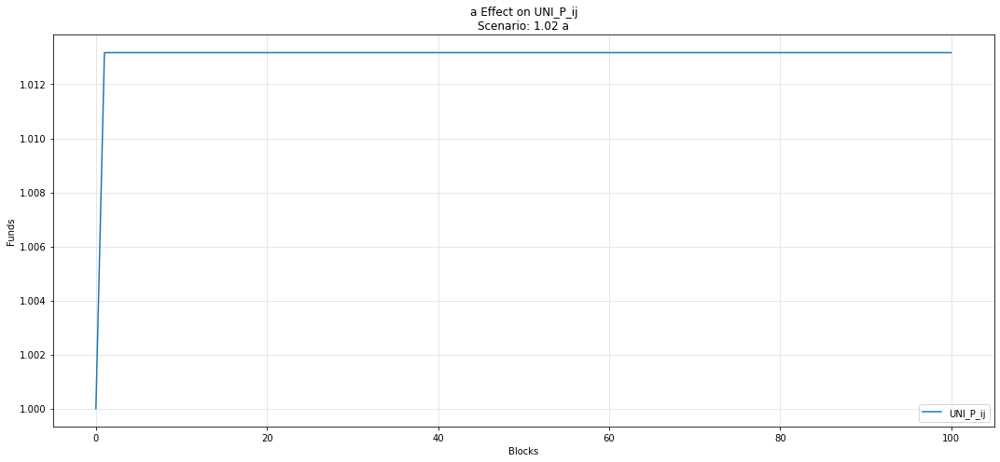

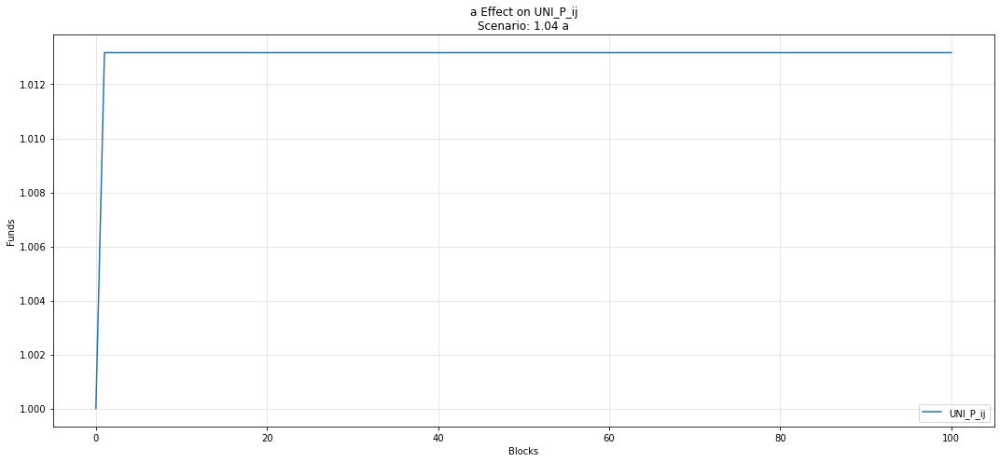

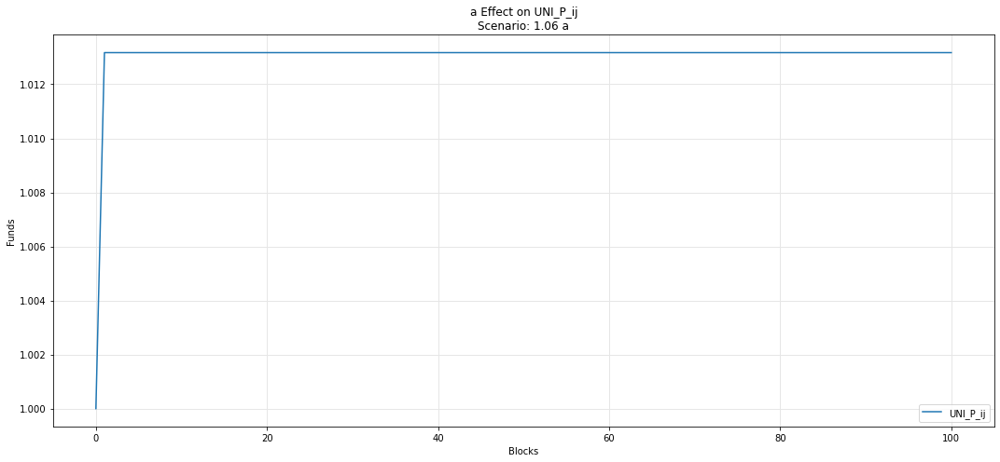

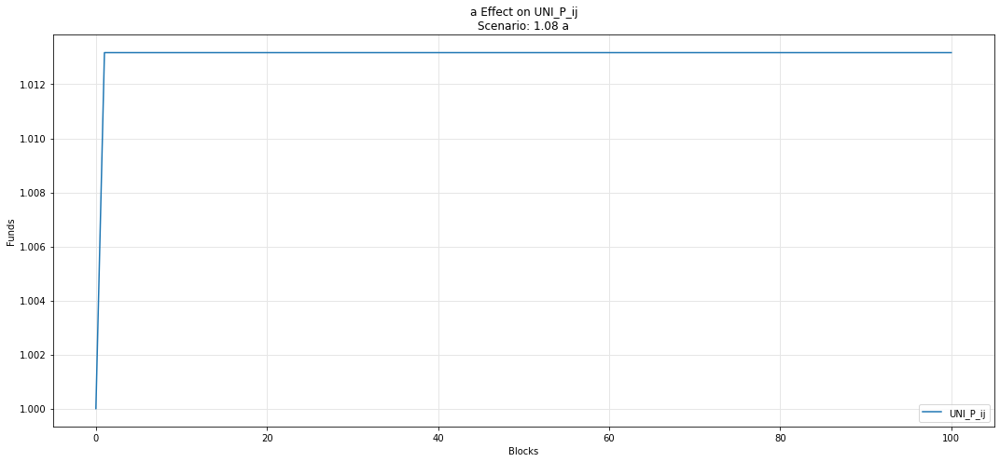

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

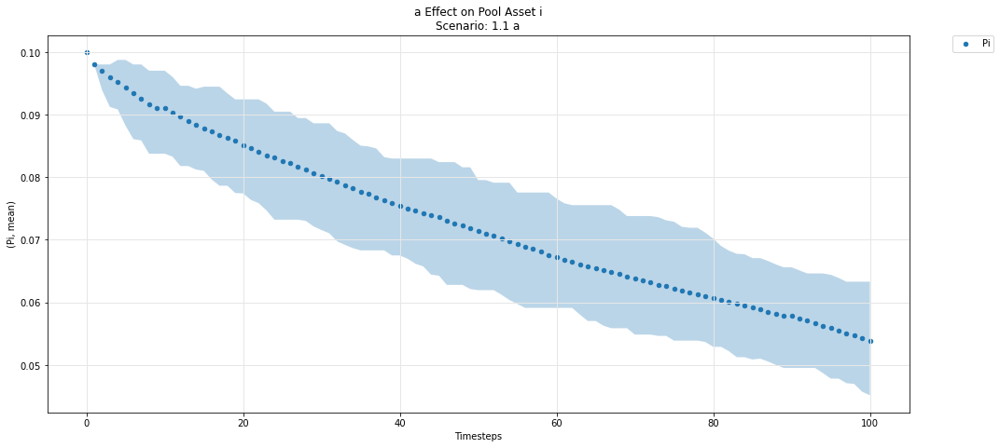

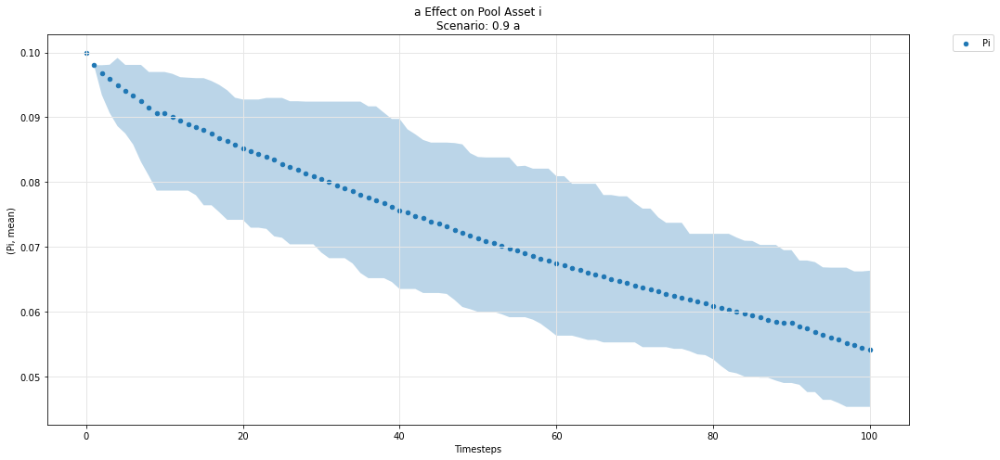

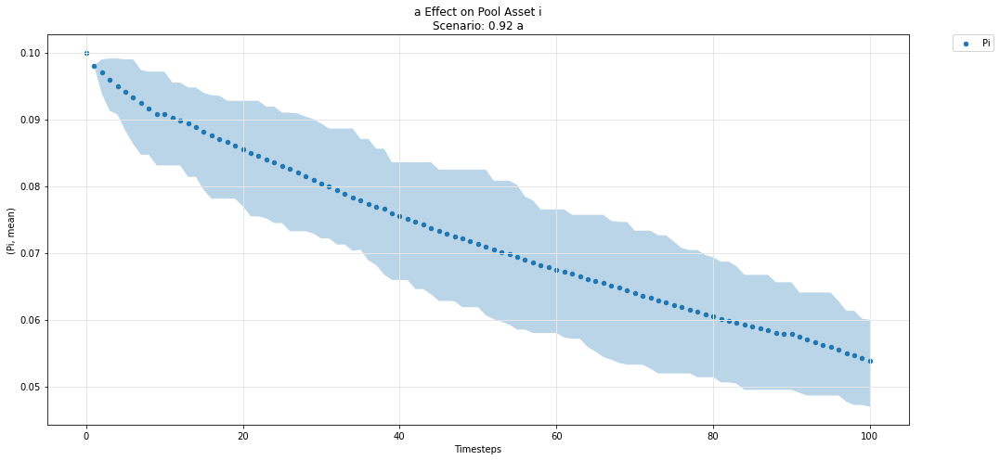

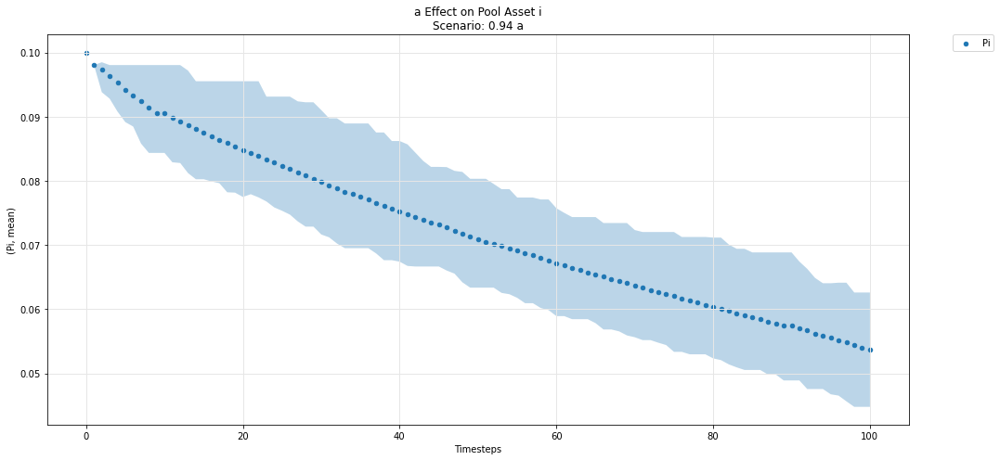

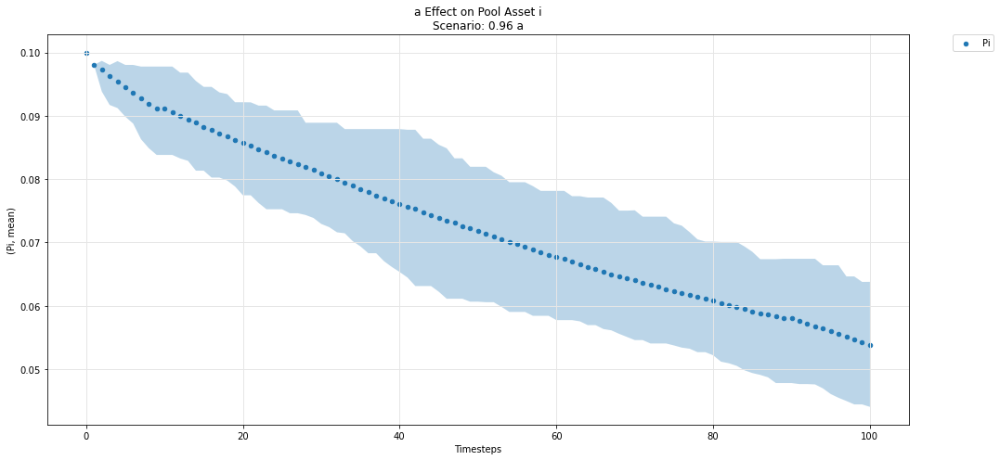

...

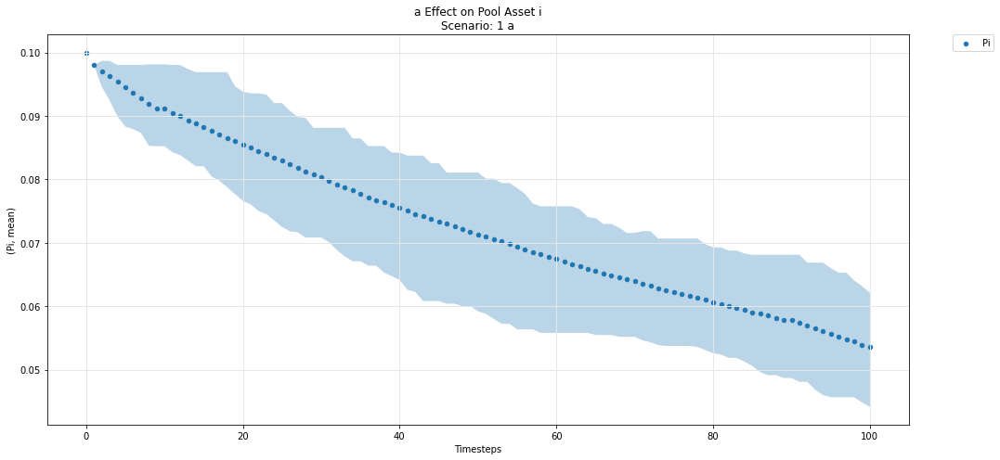

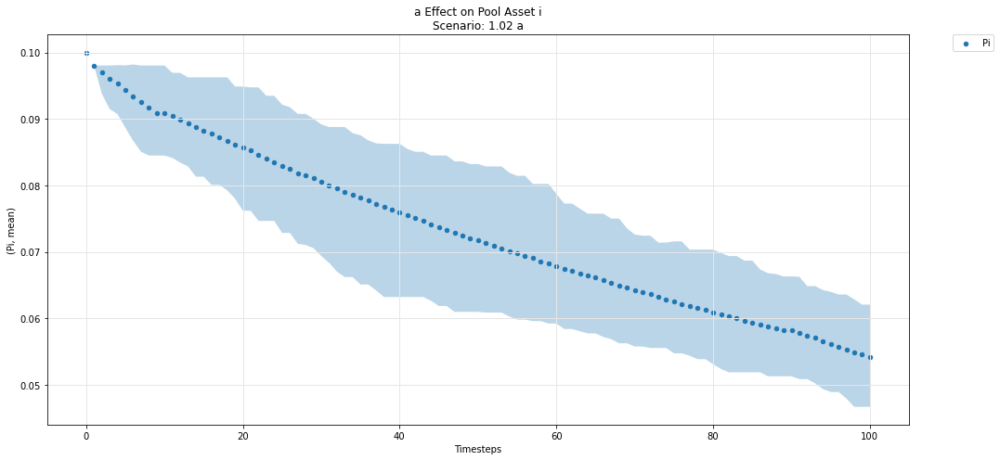

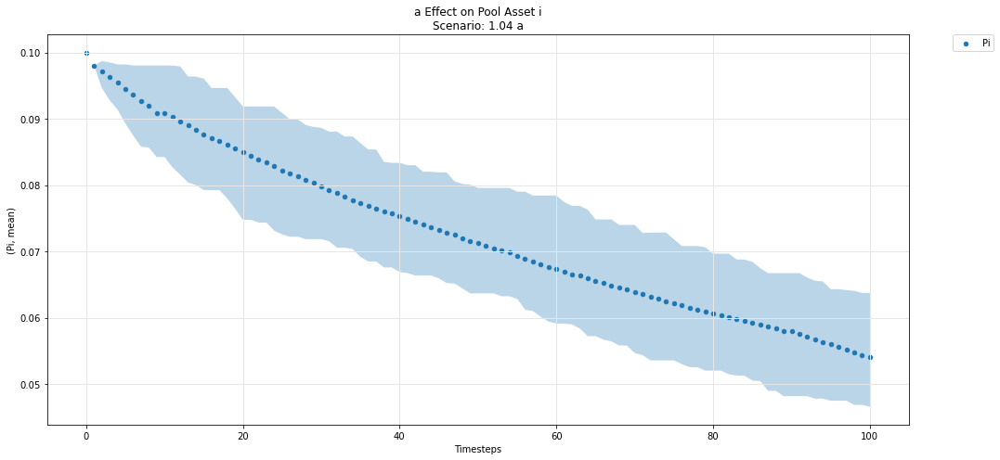

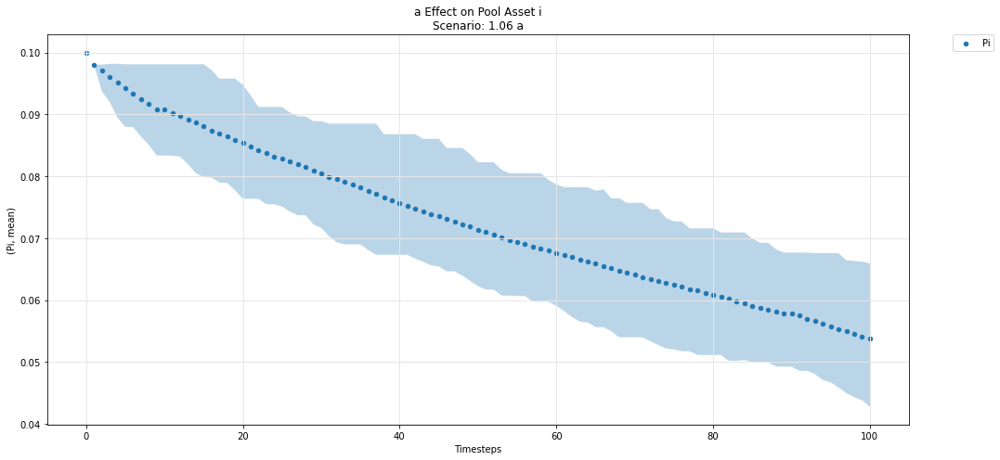

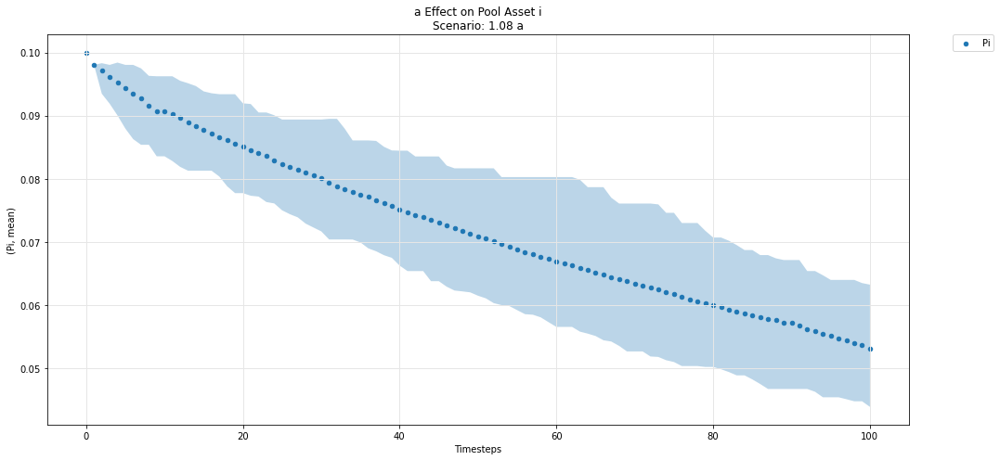

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

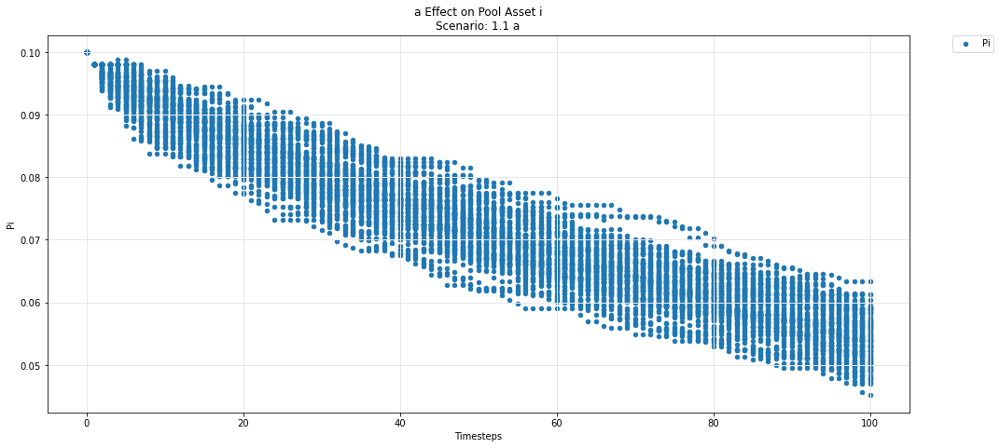

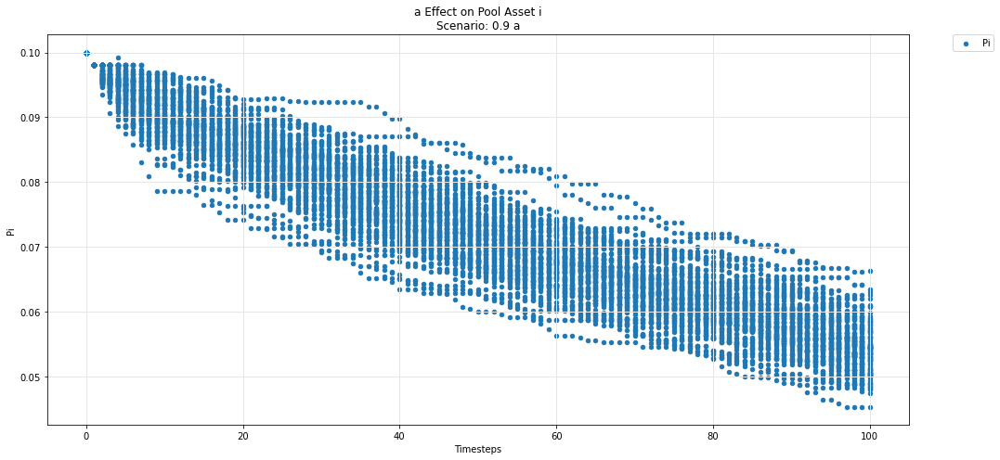

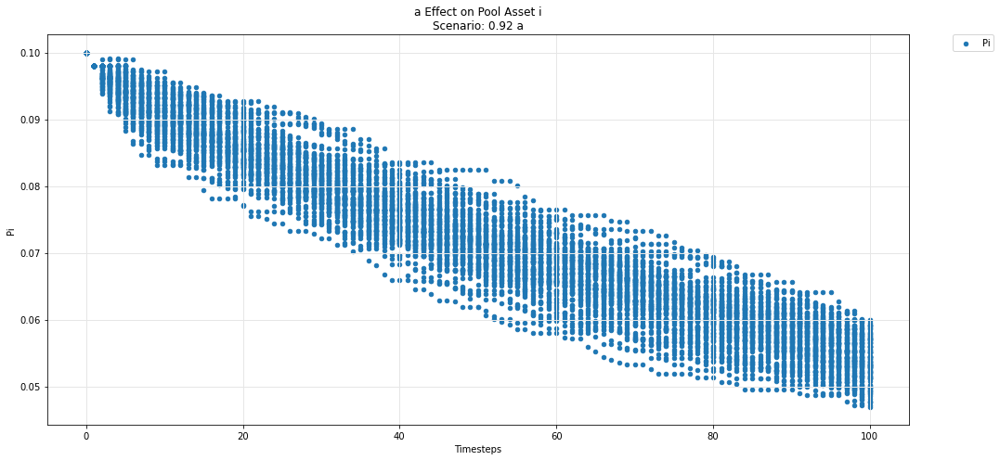

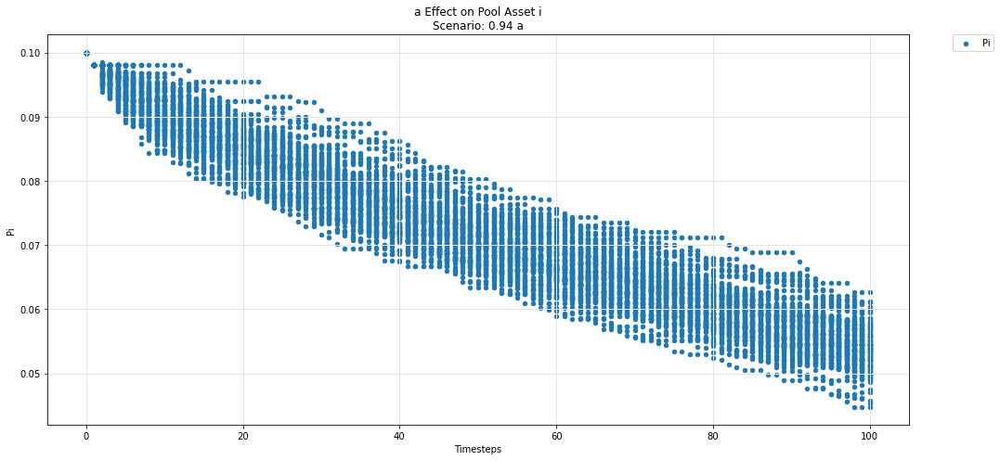

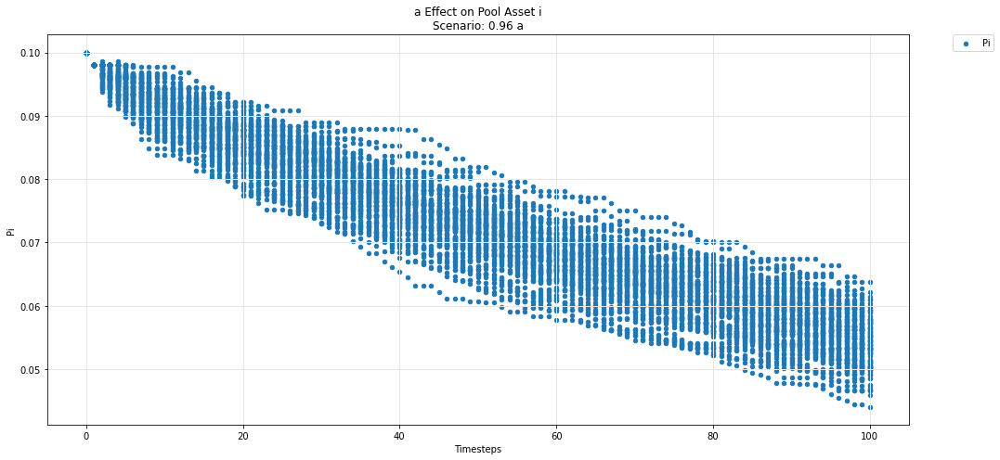

...

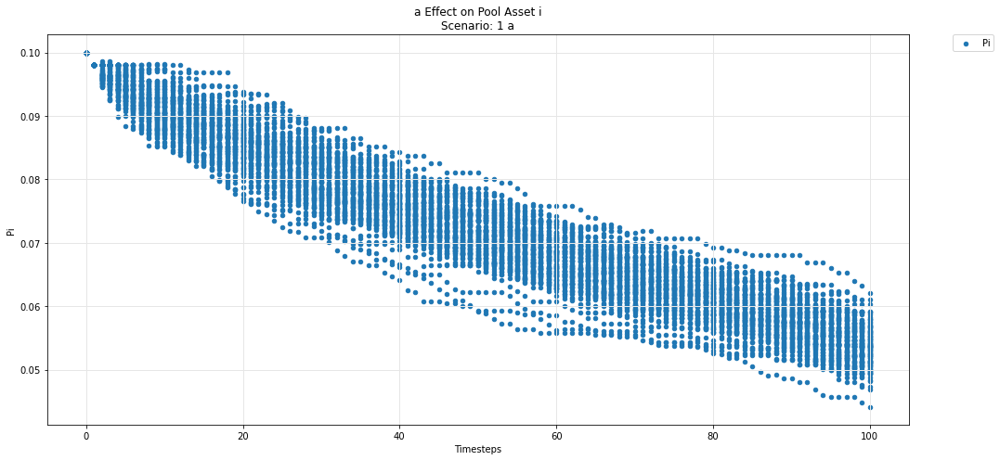

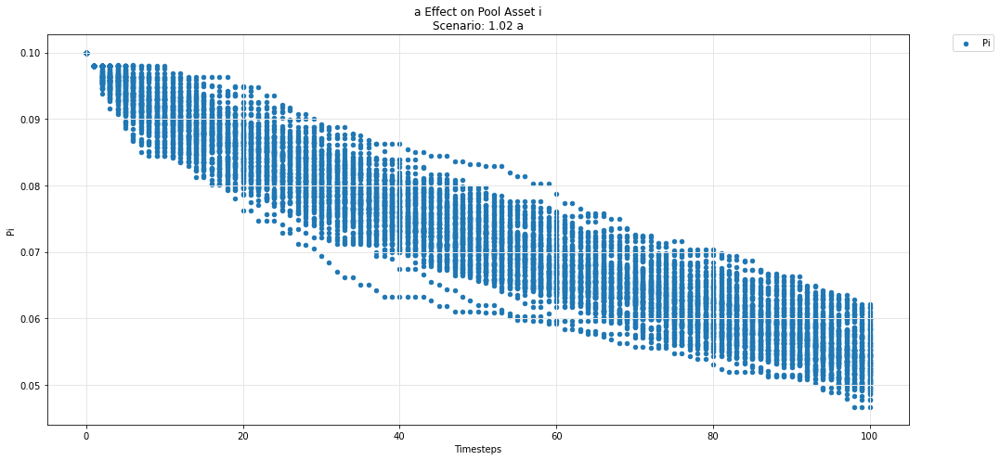

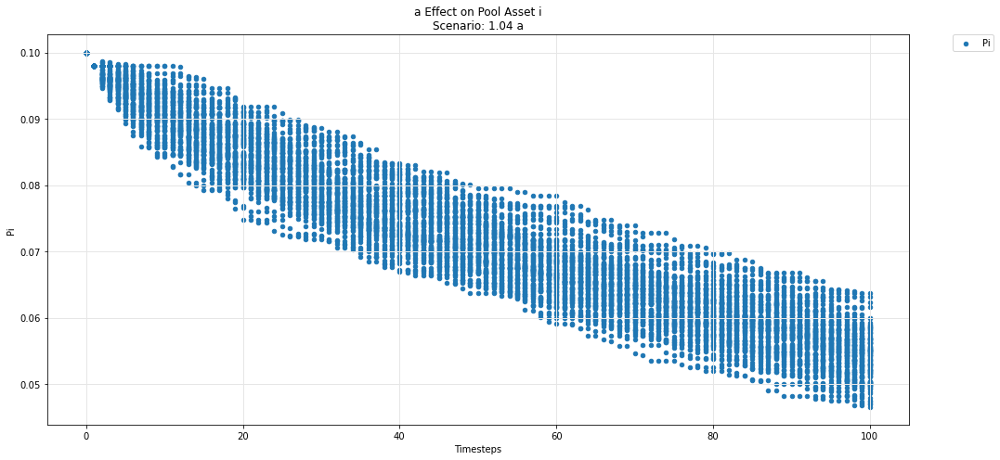

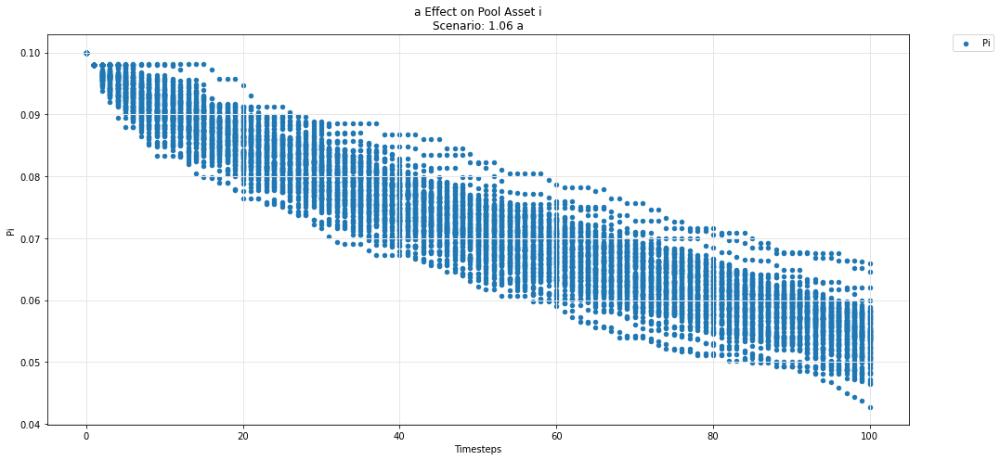

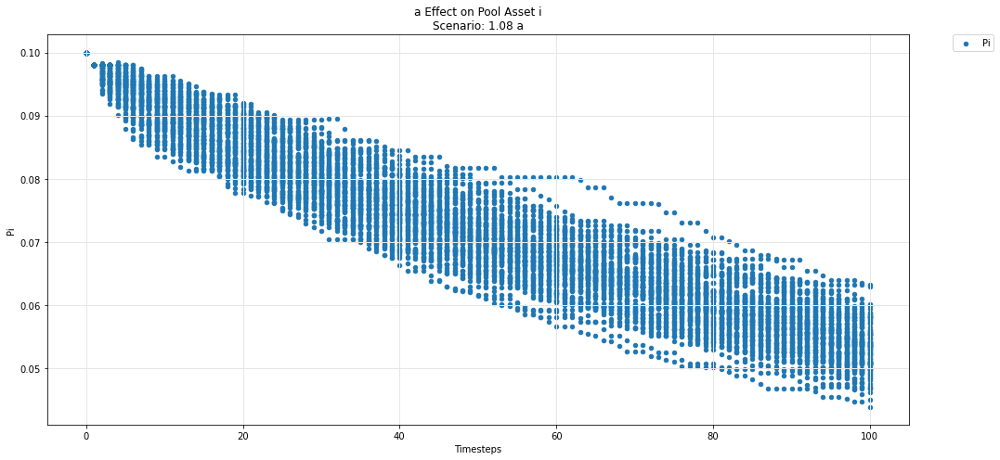

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

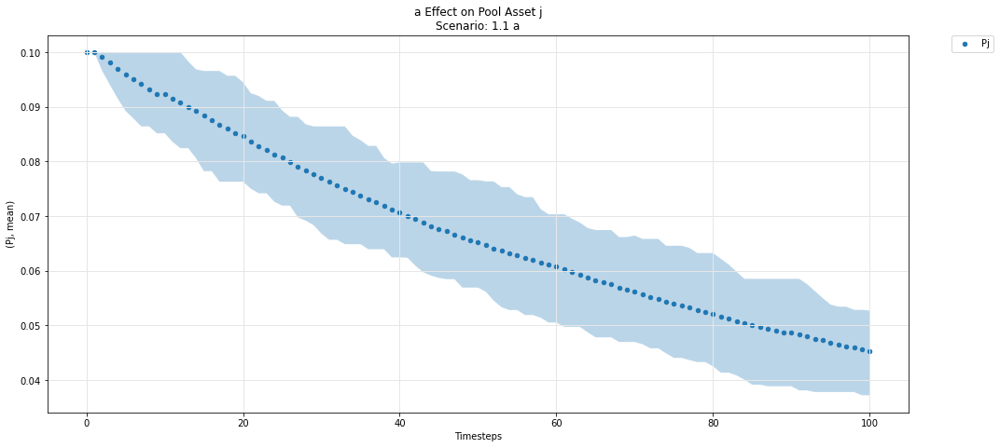

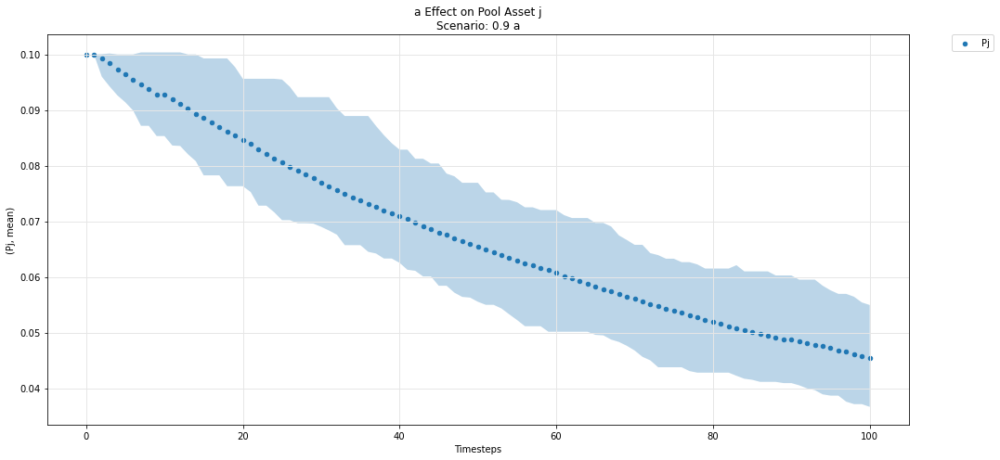

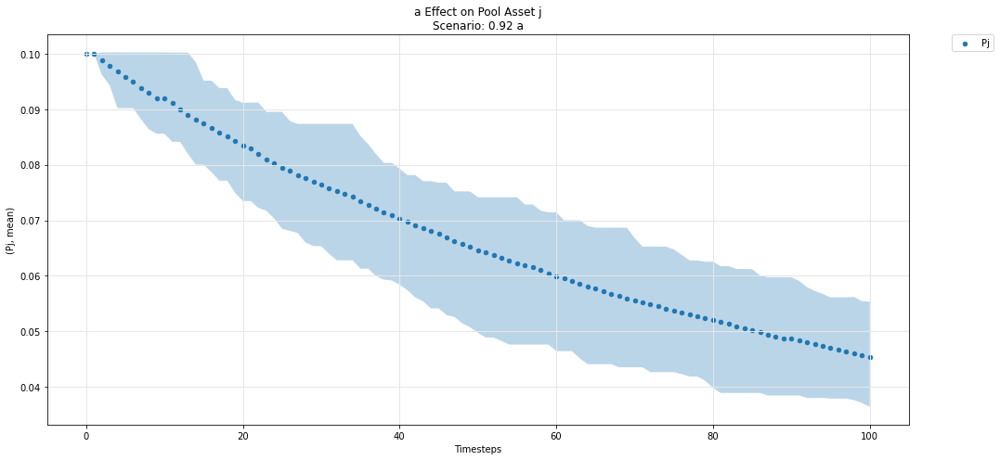

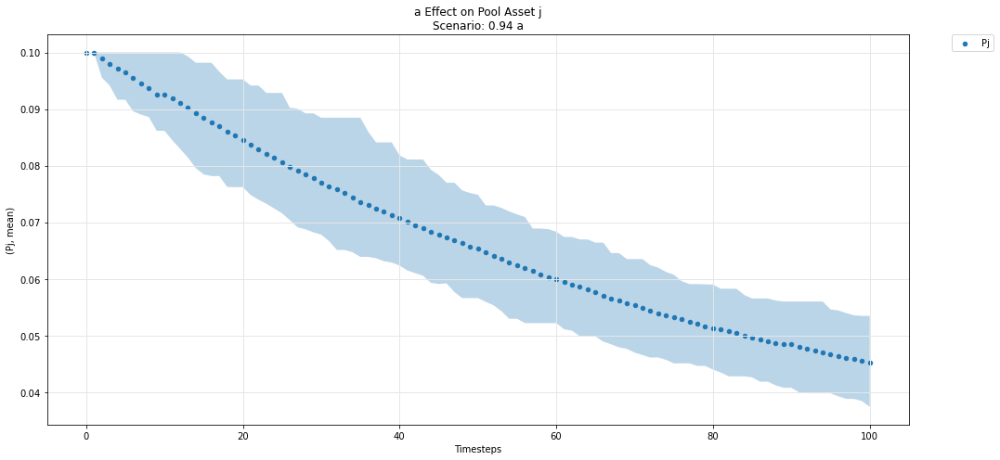

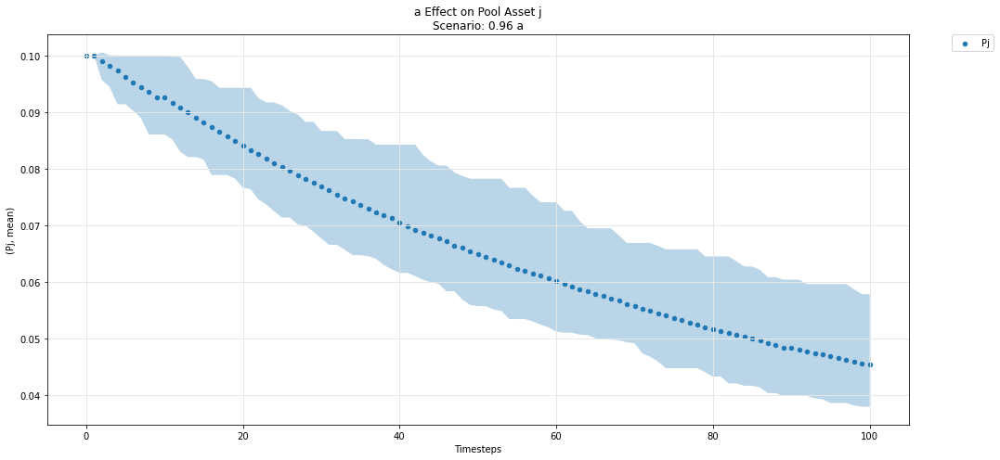

...

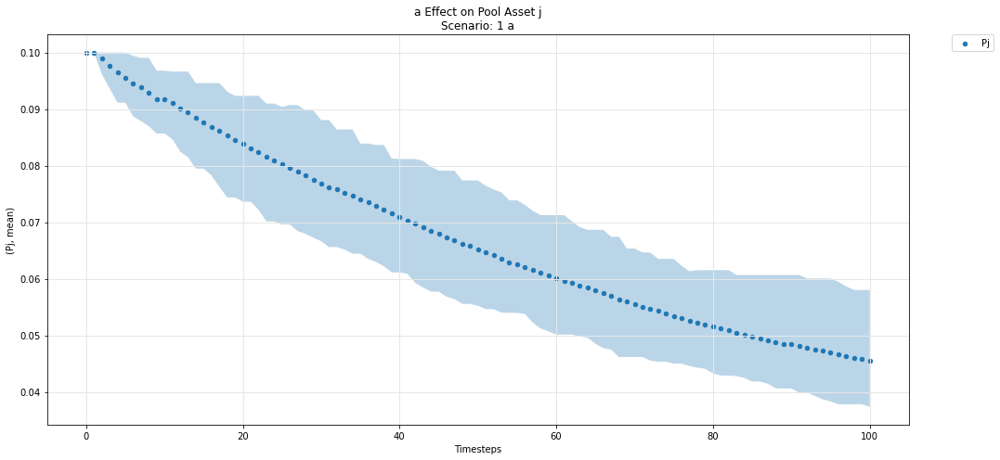

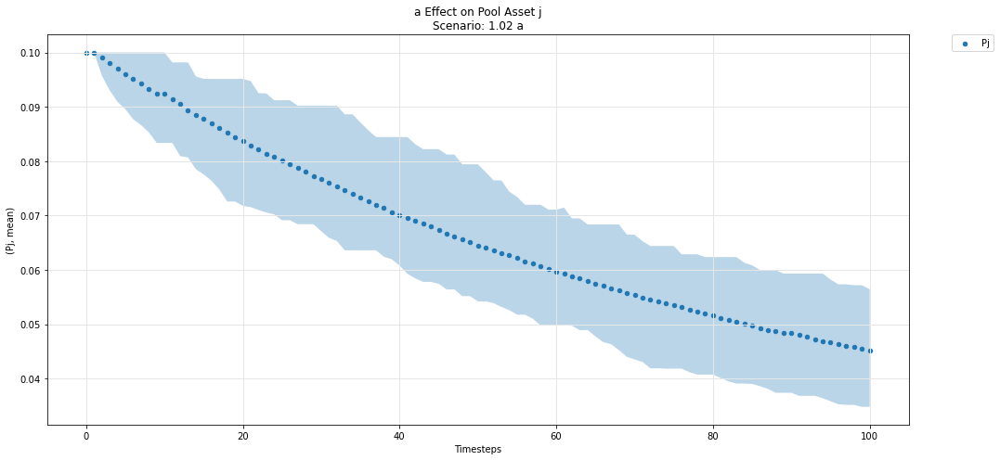

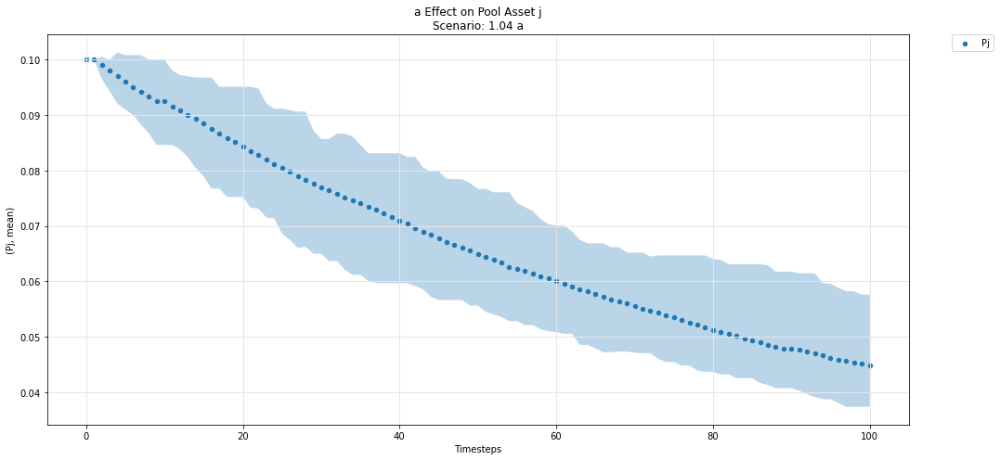

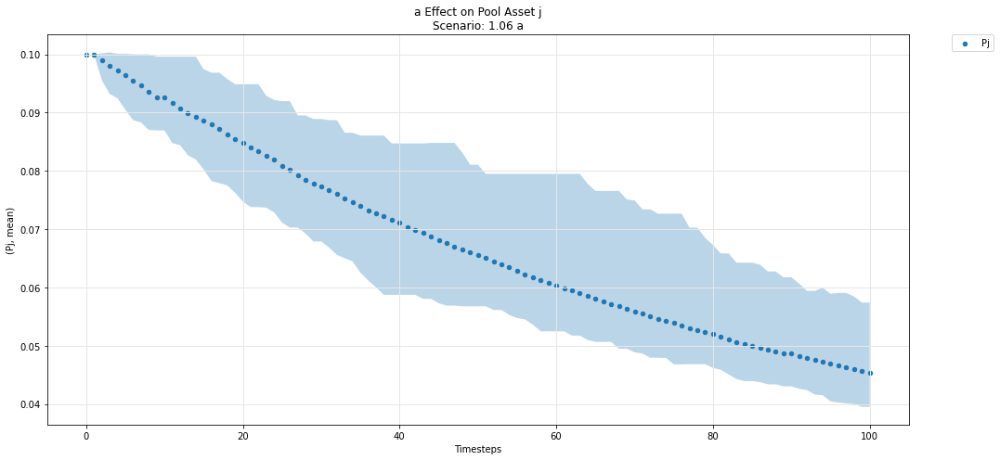

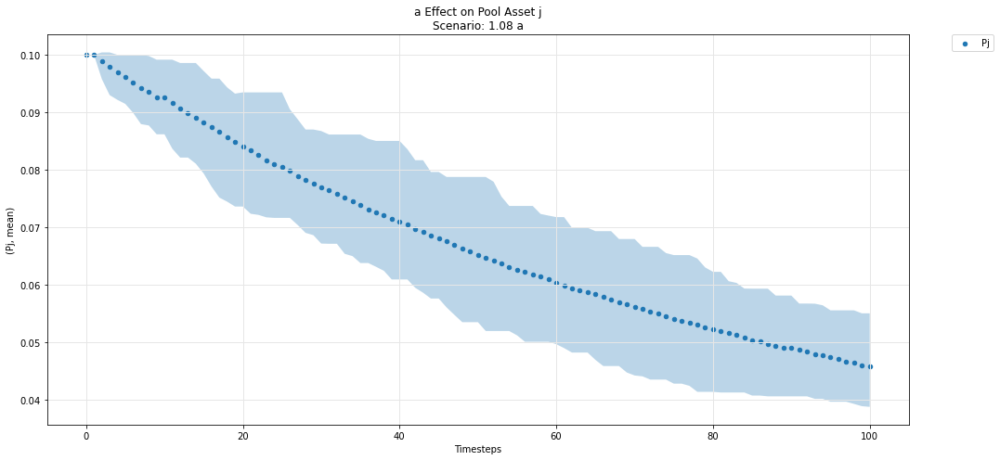

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

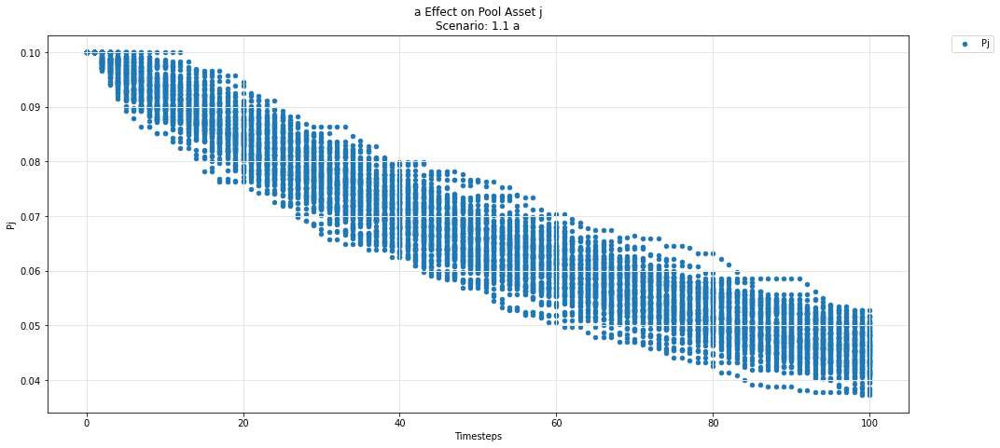

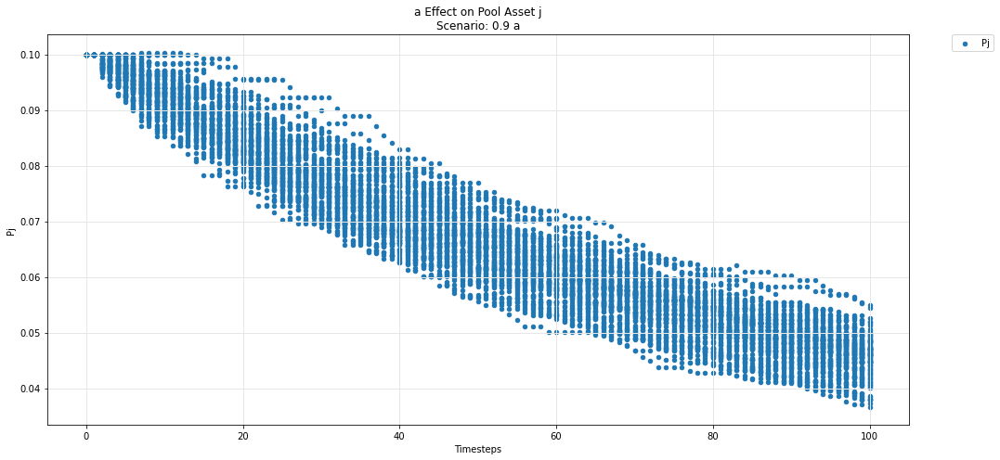

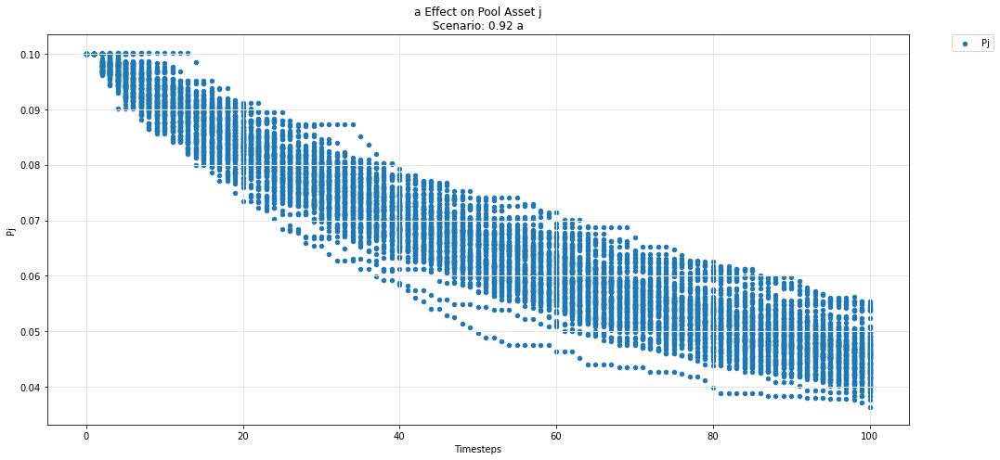

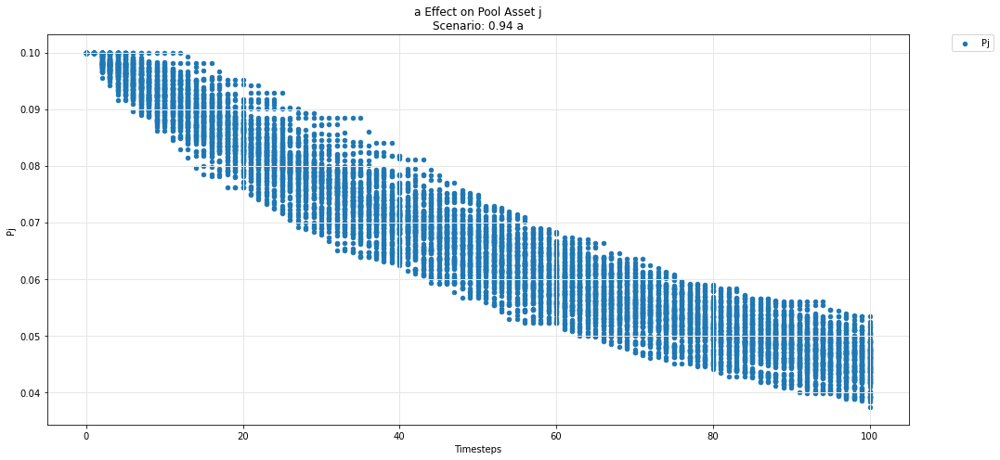

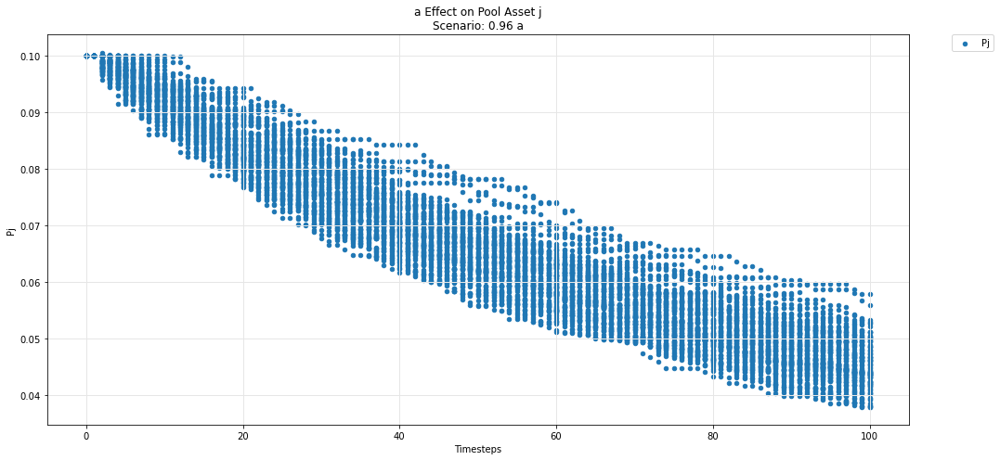

...

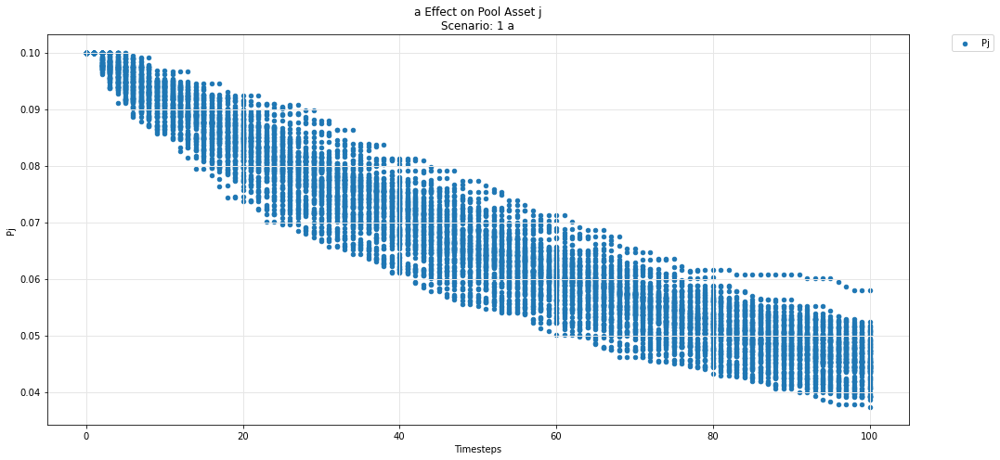

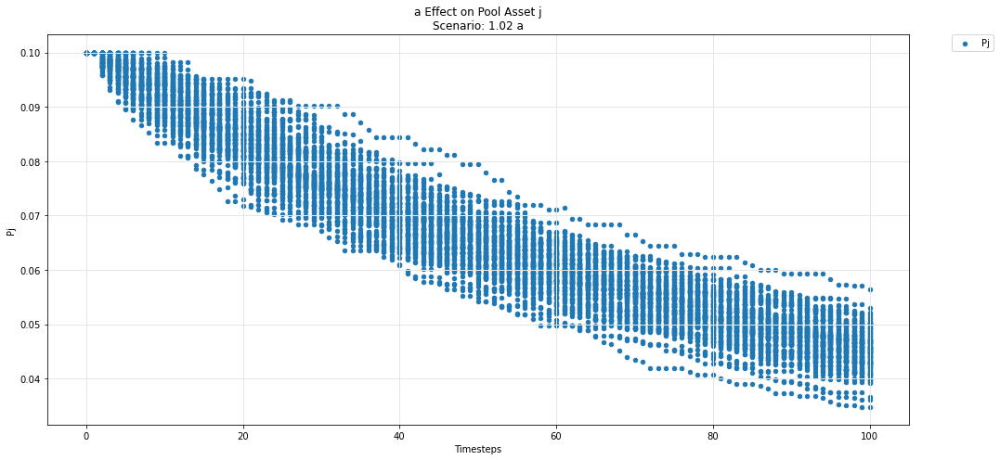

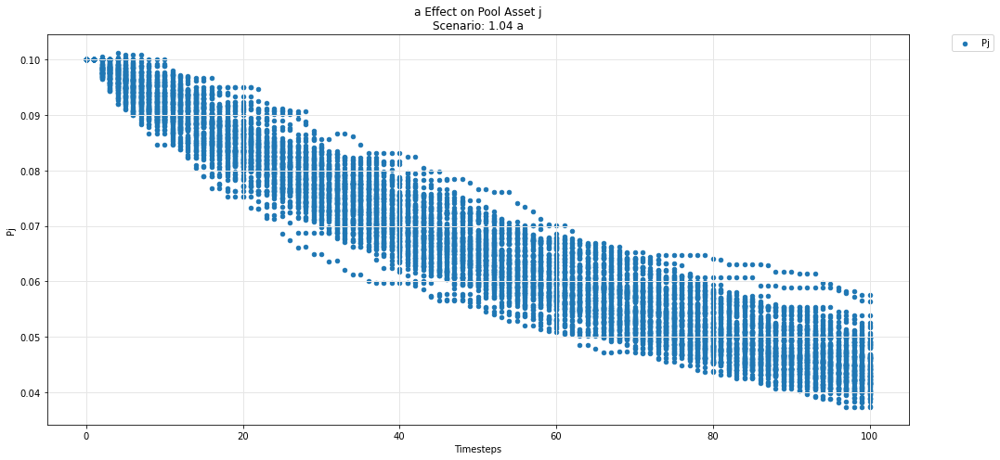

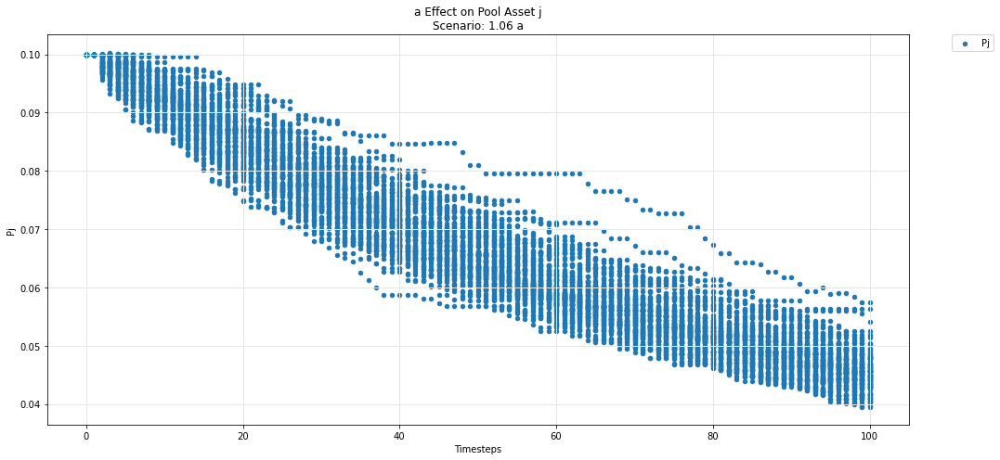

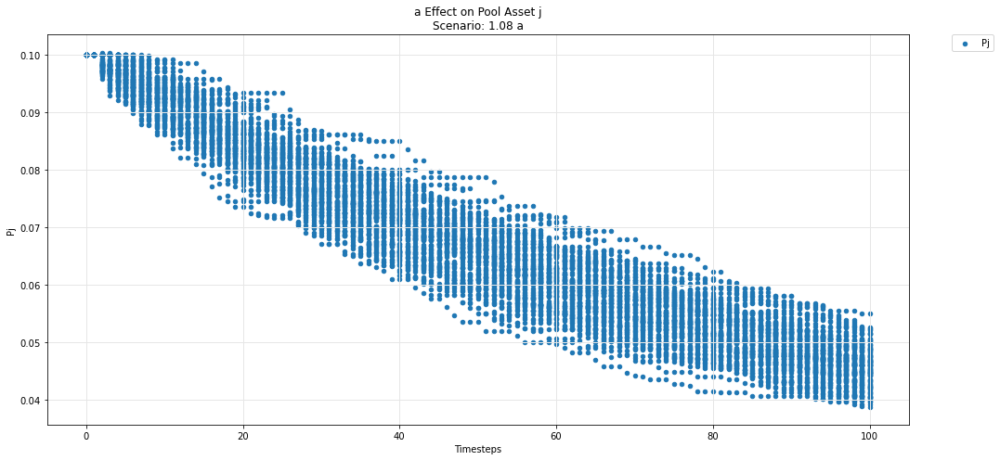

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

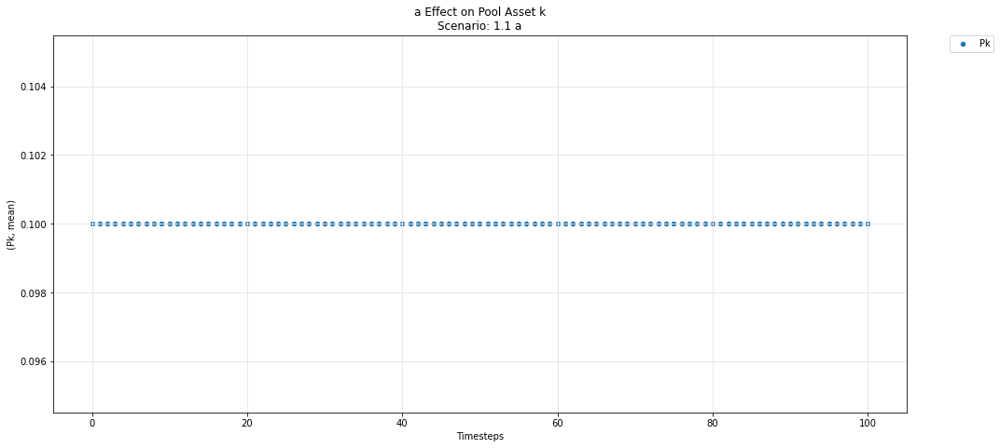

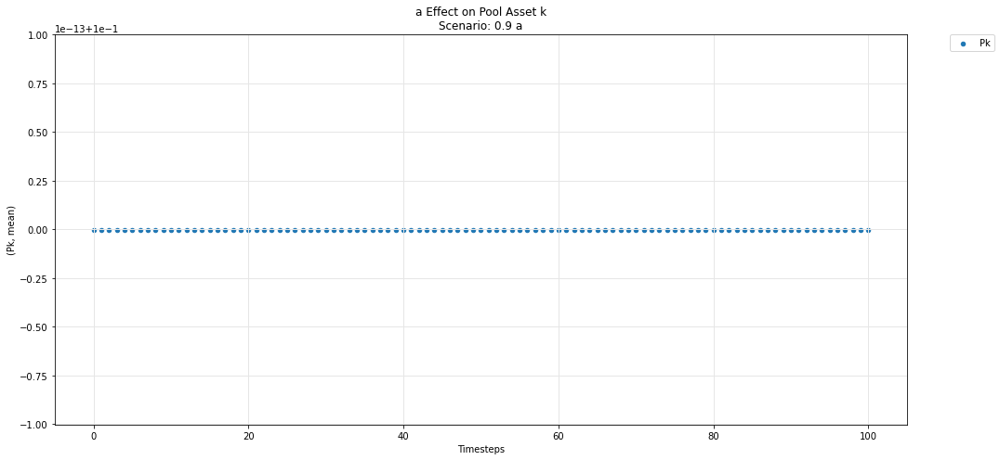

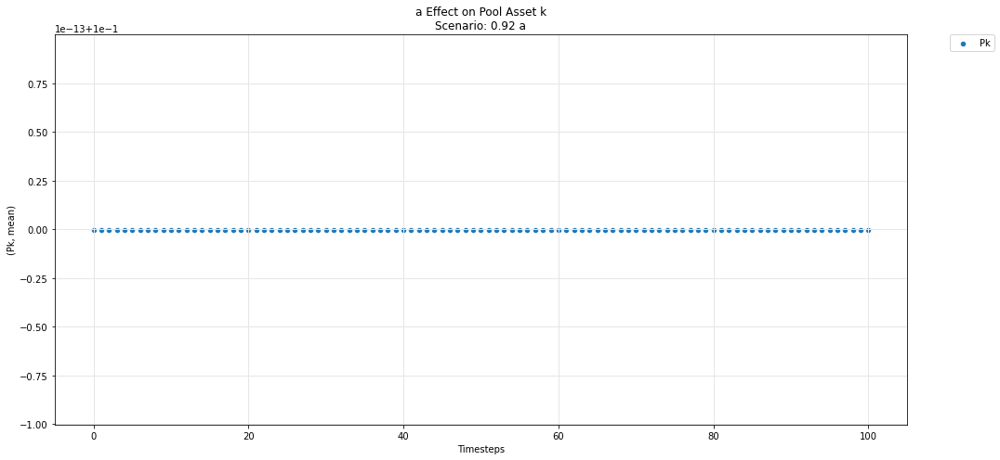

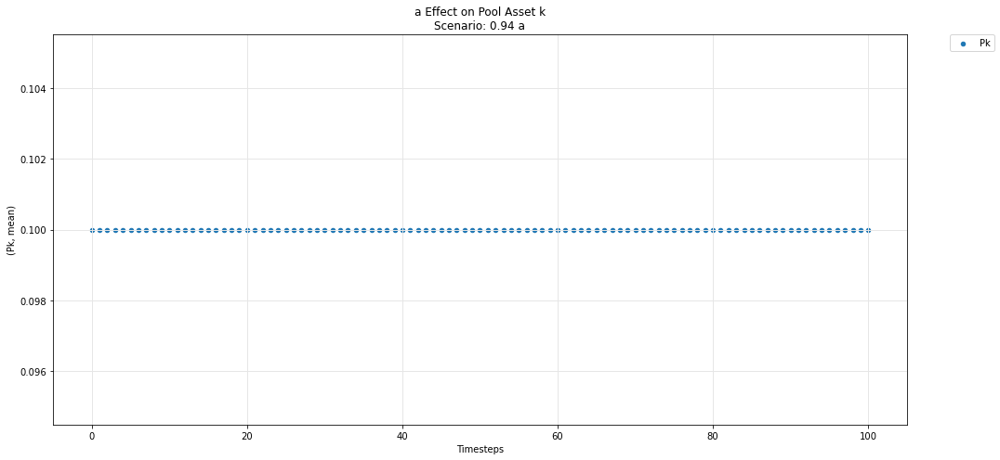

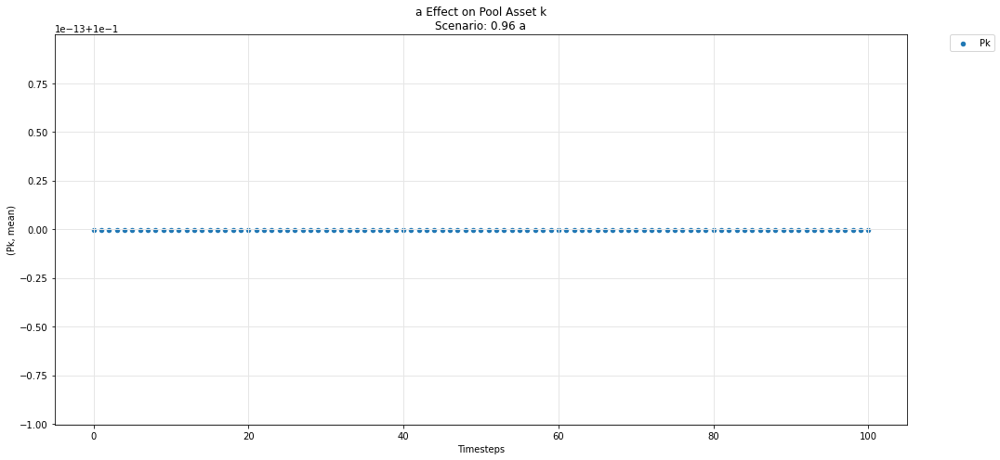

...

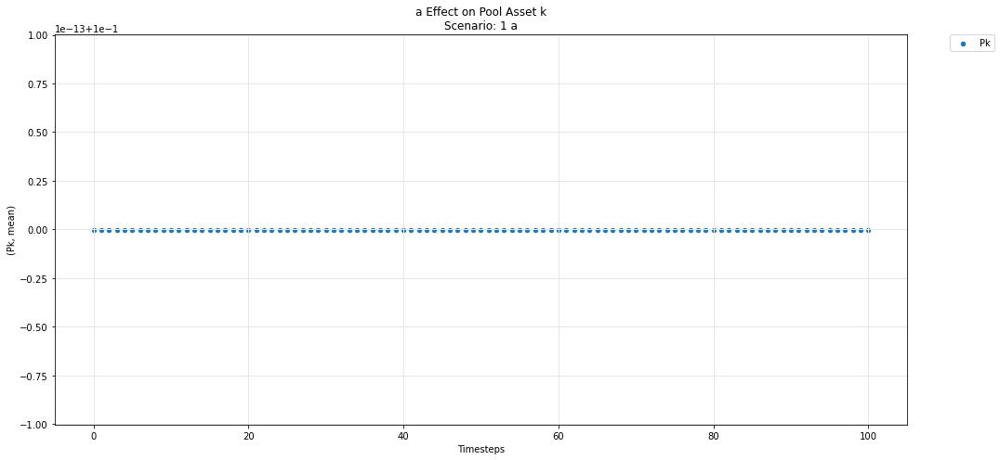

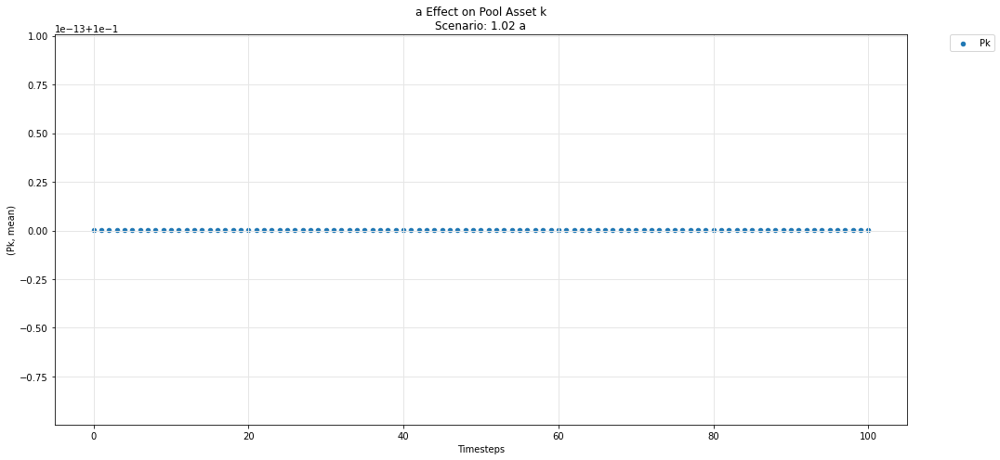

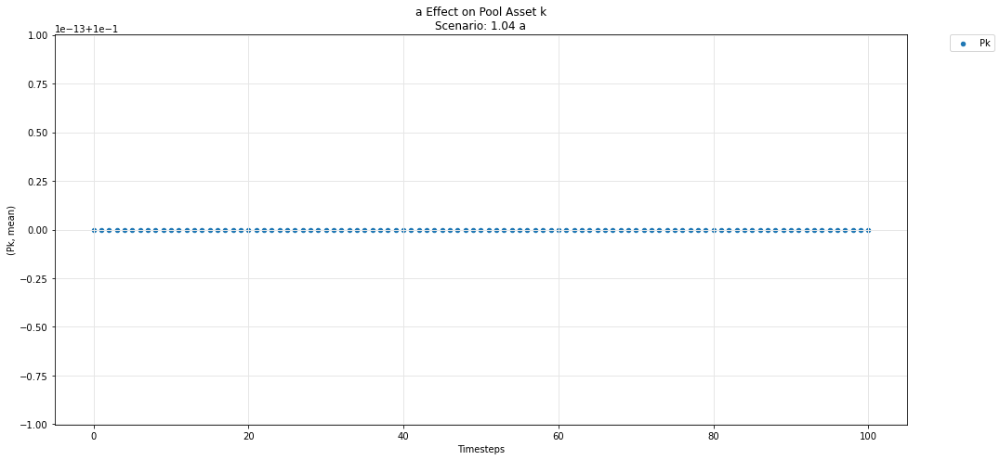

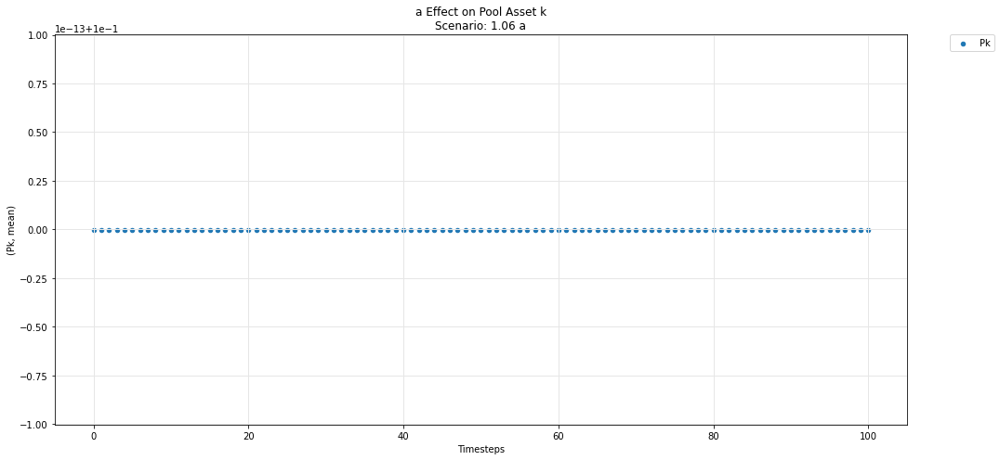

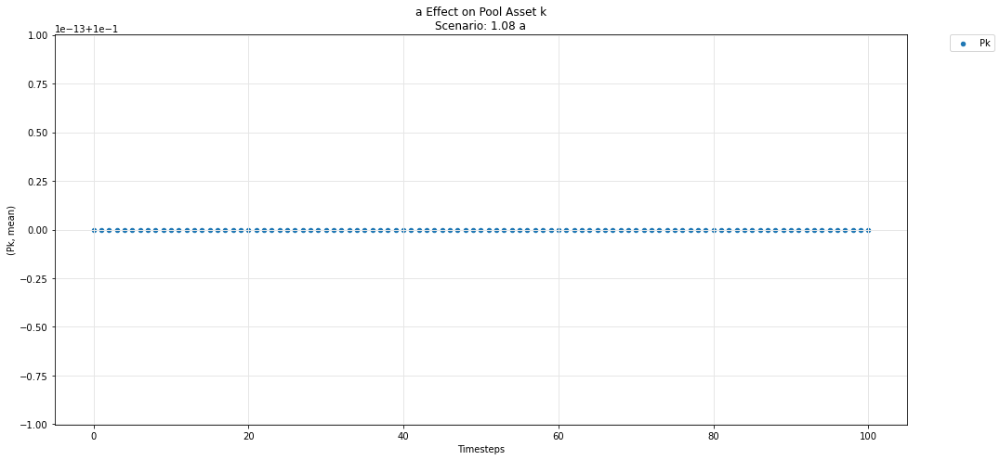

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

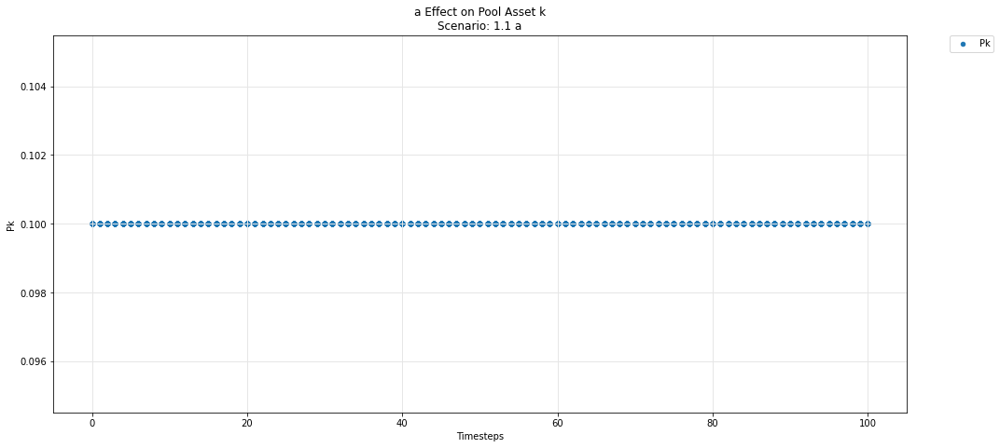

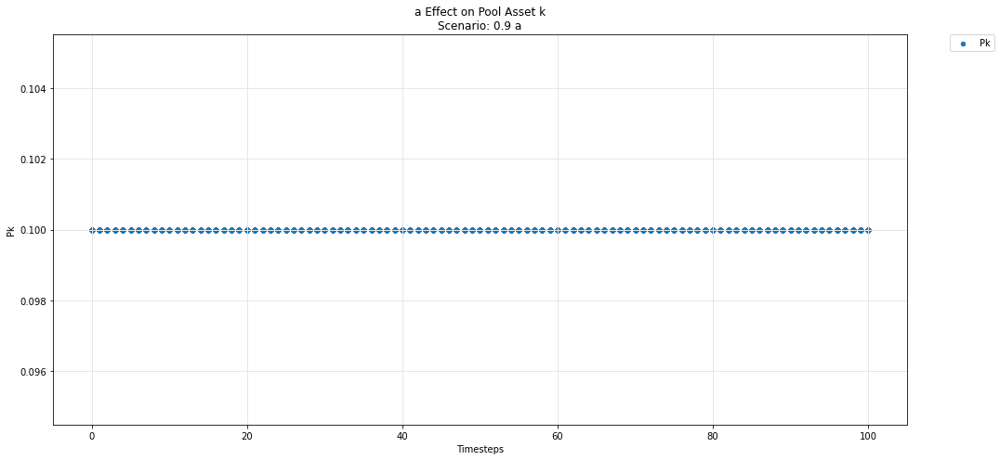

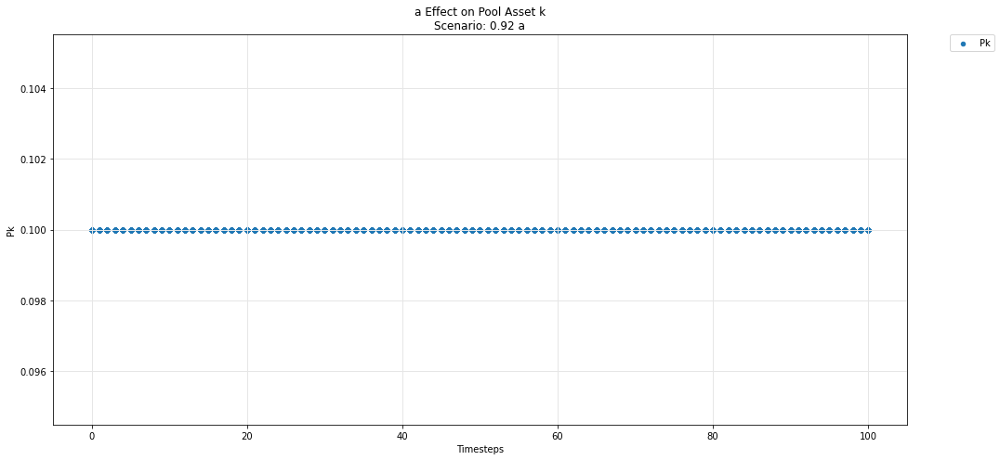

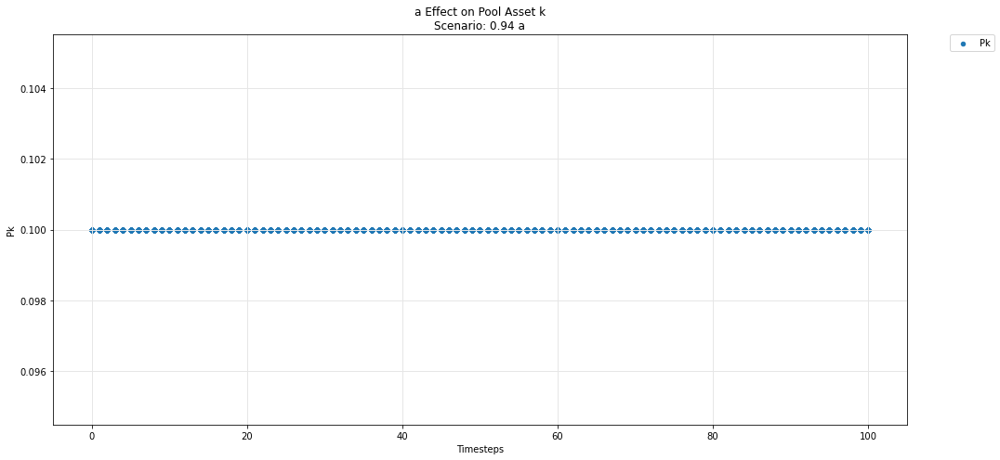

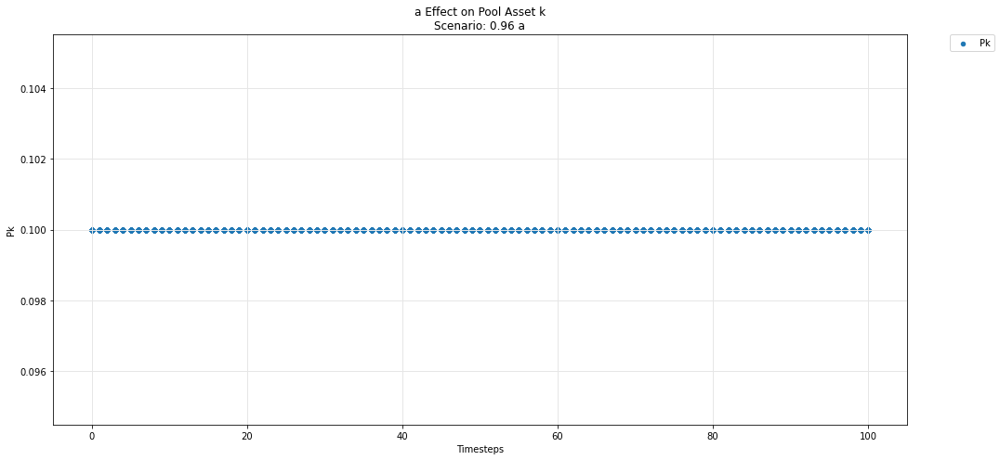

...

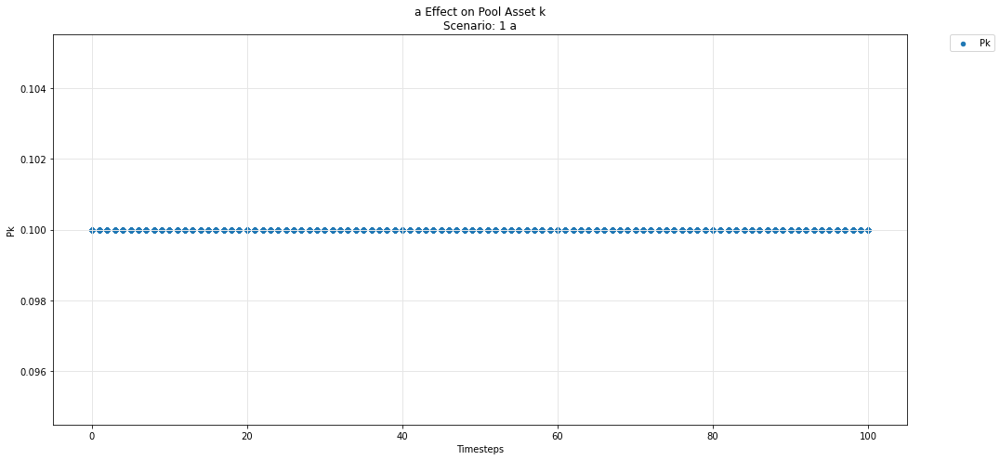

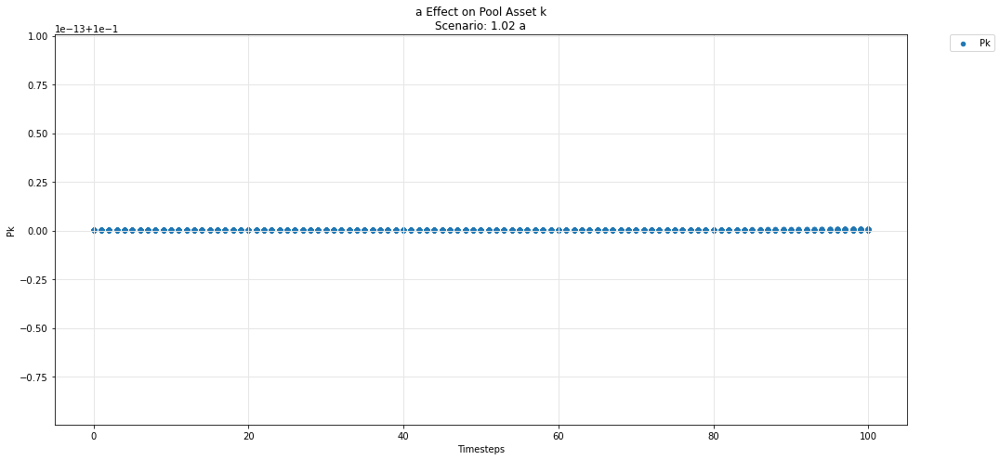

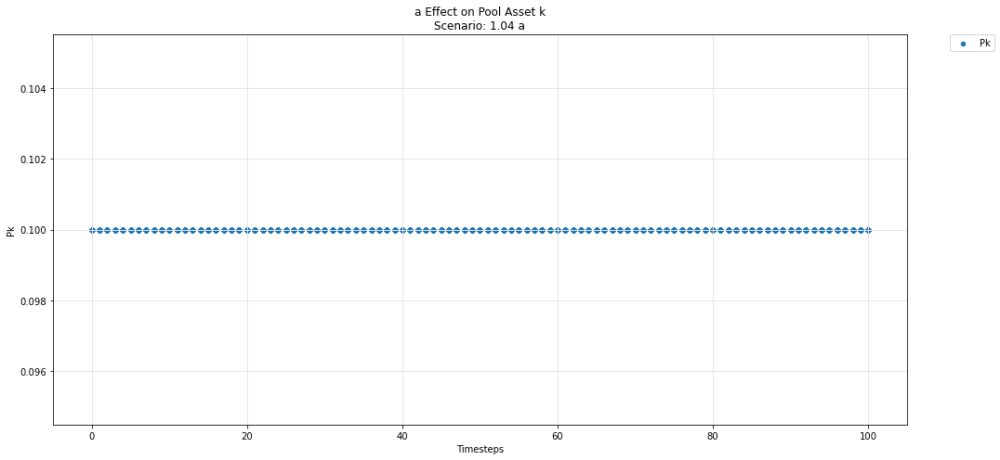

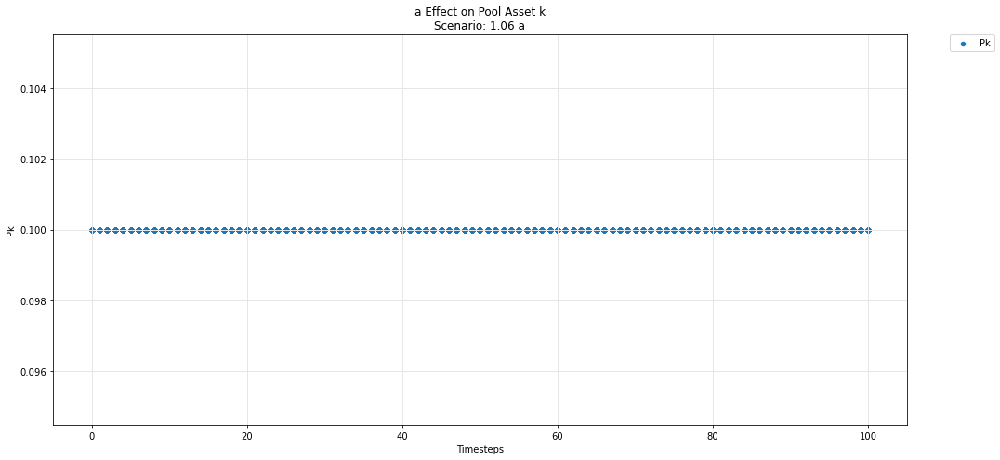

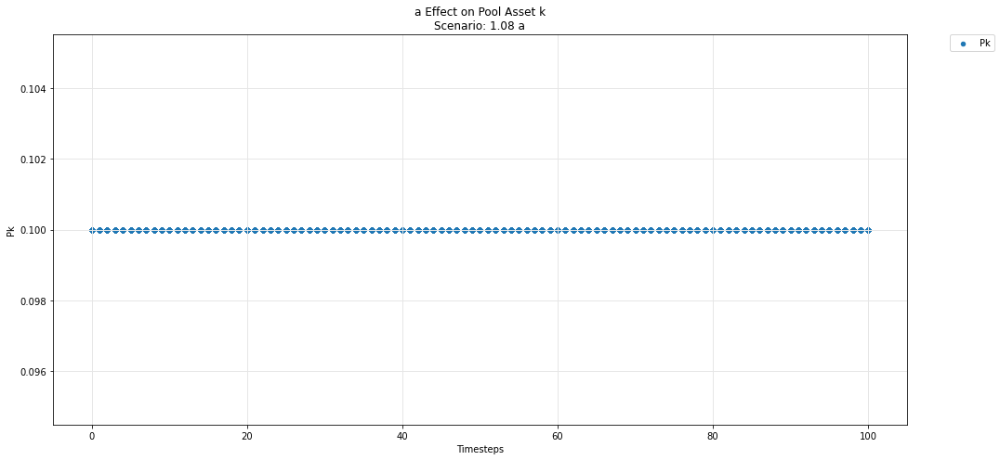

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')